# Predicting Hypoxia with Gene expression cells - AI Lab Project

- Filip Janczak
- Mohammad Aaqib Khatibi
- Omar Jallouq
- Jan Petsch
- Takhmina Temirbay


# Introduction - Materials and methods

The biological field advanced substantially through scRNA-seq technologies Drop-seq and SMART-seq because these methods enable researchers to measure gene expression at the level of individual cells. In this introduction we are going to talk a little bit about the background and the methodoligies we have employed. The technological advancement enables scientists to examine tissue and tumor cell diversity through single-cell analysis which reveals detailed insights about biological systems and disease states. The high-throughput Drop-seq method uses microfluidic droplet technology to place barcoded beads inside individual cells. The approach offers high efficiency and low costs but it measures gene expression from thousands of cells at once by providing shallow transcript coverage for each cell. Drop-seq excels at identifying broad cell populations as well as exploring cellular diversity and investigating large-scale expression patterns.

The plate-based SMART-seq method provides full-length transcript sequencing capabilities which makes it an alternative to Drop-seq. The method delivers superior sensitivity along with enhanced coverage of cell transcripts which makes it ideal for detailed expression studies and rare transcript detection. The detailed molecular analysis requires SMART-seq because it captures complete transcriptomic information at single-cell resolution yet operates at reduced throughput and higher costs compared to Drop-seq.

The research project explores the way two established cancer cell lines MCF7 and HCC1806 display different gene expression patterns through single-cell transcriptomic data obtained by using Drop-seq and SMART-seq techniques. MCF7 represents a well-studied cell line from luminal breast cancer that shows positive hormone receptors and moderate aggression levels thus serving as a reference for hormone-dependent breast cancer studies. Triple-negative breast cancer cell line HCC1806 belongs to an aggressive subtype which lacks hormone receptor expression and creates therapeutic difficulties because of minimal available targeted therapies.

The project uses the dataset provided to us by Prof. Buffa for the AI Lab project. To keep the integrity of it, we made sure to keep it confidential, using it for the sole purpose of this project.

The project performs systematic exploratory data analysis to reveal fundamental gene expression characteristics and distribution patterns between cell lines and sequencing methods. Supervised and unsupervised machine learning techniques will follow to detect concealed patterns for cell subpopulation classification and identification of essential differential expression markers. The research aims to reveal breast cancer intratumoral heterogeneity along with discovering new molecular targets that will help develop better therapeutic approaches for breast cancer.

<u> **An overview** </u>

--> We will start our project by doing some exploratory data analysis and then moving on to supervised and unsupervised learning respectively. In EDA, we have firstly employed methods as explained and directed in the class and further on expanded it with other statistical descriptions and visualizations.

--> Follwing that we have unsupervised learning, we applied a standard preprocessing pipeline involving log-transformation followed by feature scaling using StandardScaler. Dimensionality reduction was performed via Principal Component Analysis (PCA), with explained variance assessed through a scree plot. We used inertia and silhouette analysis to guide the selection of the optimal number of clusters. Clustering was conducted using both K-Means and Gaussian Mixture Models (GMM). Results were visualized through 2D PCA projections using matplotlib, allowing clear interpretation of cluster separability.

--> In the supervised section, we will train predictors for hypoxia in the datasets corresponding to the mcf cell line. We will be using logicstic regression, random forest classification, SGD, and SVM to make predictions for hypoxia, evaluate performance using conviction matrices and cross-validation, evaluate the importance of particular genes, and make predictions on test data.

## Exploratory Data Analysis (EDA)

### DropSeq

## <u>HCC1806 Cell Line - DropSeq

In [ ]:
import sys
import sklearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt             
import seaborn as sns 

In [ ]:
df = pd.read_csv("/Users/takhmina/AILab/Data/DropSeq/HCC1806_Filtered_Normalised_3000_Data_train.txt",
                 delimiter=r"\s+", engine='python', index_col=0)
print("Dataframe dimensions:", np.shape(df))


Dataframe dimensions: (3000, 14682)


## Extracting MetaData

In [ ]:
df_transposed = df.T.reset_index()
df_transposed.columns = ['Filename'] + [f"Sample_{i+1}" for i in range(len(df_transposed.columns) - 1)]

df_transposed['Filename'] = df_transposed['Filename'].str.strip('"')

df_transposed['Sequence'] = df_transposed['Filename'].str.split('_').str[0].str.strip('"')  
df_transposed['Condition'] = df_transposed['Filename'].str.split('_').str[1].str.strip('"') 
df_transposed['Cell_Line'] = 'HCC1806'  

df_meta = df_transposed[['Filename', 'Sequence', 'Condition', 'Cell_Line']]

df_meta.set_index('Filename', inplace=True)

print(df_meta)


                           Sequence Condition Cell_Line
Filename                                               
AAAAAACCCGGC_Normoxia  AAAAAACCCGGC  Normoxia   HCC1806
AAAACCGGATGC_Normoxia  AAAACCGGATGC  Normoxia   HCC1806
AAAACGAGCTAG_Normoxia  AAAACGAGCTAG  Normoxia   HCC1806
AAAACTTCCCCG_Normoxia  AAAACTTCCCCG  Normoxia   HCC1806
AAAAGCCTACCC_Normoxia  AAAAGCCTACCC  Normoxia   HCC1806
...                             ...       ...       ...
TTTTTACCAATC_Hypoxia   TTTTTACCAATC   Hypoxia   HCC1806
TTTTTCCGTGCA_Hypoxia   TTTTTCCGTGCA   Hypoxia   HCC1806
TTTTTGCCTGGG_Hypoxia   TTTTTGCCTGGG   Hypoxia   HCC1806
TTTTTGTAACAG_Hypoxia   TTTTTGTAACAG   Hypoxia   HCC1806
TTTTTTTGAATC_Hypoxia   TTTTTTTGAATC   Hypoxia   HCC1806

[14682 rows x 3 columns]


Metadata Description

The metadata for DropSeq contains the following fields:

- **Filename**: The unique identifier for each entry, consisting of a sequence string and the condition (e.g., "Normoxia").
- **Sequence**: A string of characters representing the sequence identifier for a sample.
- **Condition**: The experimental condition associated with the sample, such as "Normoxia" or "Hypoxia."
- **Cell_Line**: The specific cell line from which the sample was derived (e.g., "HCC1806").

This file provides essential information for linking experimental data with specific sequences, conditions, and cell lines.


In [ ]:

print("First column: ", df_meta.iloc[ : , 0])

First column:  Filename
AAAAAACCCGGC_Normoxia    AAAAAACCCGGC
AAAACCGGATGC_Normoxia    AAAACCGGATGC
AAAACGAGCTAG_Normoxia    AAAACGAGCTAG
AAAACTTCCCCG_Normoxia    AAAACTTCCCCG
AAAAGCCTACCC_Normoxia    AAAAGCCTACCC
                             ...     
TTTTTACCAATC_Hypoxia     TTTTTACCAATC
TTTTTCCGTGCA_Hypoxia     TTTTTCCGTGCA
TTTTTGCCTGGG_Hypoxia     TTTTTGCCTGGG
TTTTTGTAACAG_Hypoxia     TTTTTGTAACAG
TTTTTTTGAATC_Hypoxia     TTTTTTTGAATC
Name: Sequence, Length: 14682, dtype: object


## first five rows of metadata

In [ ]:
print(df_meta.head(5))

                           Sequence Condition Cell_Line
Filename                                               
AAAAAACCCGGC_Normoxia  AAAAAACCCGGC  Normoxia   HCC1806
AAAACCGGATGC_Normoxia  AAAACCGGATGC  Normoxia   HCC1806
AAAACGAGCTAG_Normoxia  AAAACGAGCTAG  Normoxia   HCC1806
AAAACTTCCCCG_Normoxia  AAAACTTCCCCG  Normoxia   HCC1806
AAAAGCCTACCC_Normoxia  AAAAGCCTACCC  Normoxia   HCC1806


## Reading HCC1806_DropSeq_filtered_normalized_Data
- Dimensions
- First column

In [ ]:
print("First column: ", df.iloc[ : , 0])

First column:  "H1-5"       2
"MALAT1"     3
"MT-RNR2"    0
"ARVCF"      0
"BCYRN1"     0
            ..
"SCCPDH"     0
"NTAN1"      0
"CLIP2"      0
"DUSP23"     0
"ZNF682"     0
Name: "AAAAAACCCGGC_Normoxia", Length: 3000, dtype: int64


In [ ]:
print(type(df))

df.shape

list(df.columns)

<class 'pandas.core.frame.DataFrame'>


['"AAAAAACCCGGC_Normoxia"',
 '"AAAACCGGATGC_Normoxia"',
 '"AAAACGAGCTAG_Normoxia"',
 '"AAAACTTCCCCG_Normoxia"',
 '"AAAAGCCTACCC_Normoxia"',
 '"AAACACAAATCT_Normoxia"',
 '"AAACCAAGCCCA_Normoxia"',
 '"AAACCATGCACT_Normoxia"',
 '"AAACCTCCGGCT_Normoxia"',
 '"AAACGCCGGTCC_Normoxia"',
 '"AAACGCCGTTCC_Normoxia"',
 '"AAACGGACGCTC_Normoxia"',
 '"AAACGTAGAGCG_Normoxia"',
 '"AAACGTTCACTG_Normoxia"',
 '"AAACTCATAAAT_Normoxia"',
 '"AAAGACGGTACC_Normoxia"',
 '"AAAGAGTGTACG_Normoxia"',
 '"AAAGCTGACGAA_Normoxia"',
 '"AAAGGCGGCAGG_Normoxia"',
 '"AAAGGCGTTCGA_Normoxia"',
 '"AAAGTCTGGGTC_Normoxia"',
 '"AAAGTGGCACCC_Normoxia"',
 '"AAAGTGGTTCGT_Normoxia"',
 '"AAAGTGTTGTTC_Normoxia"',
 '"AAATAGCCAGTT_Normoxia"',
 '"AAATCCCATATA_Normoxia"',
 '"AAATCGTGGTTG_Normoxia"',
 '"AAATCTGGCGAC_Normoxia"',
 '"AAATGACAGTCC_Normoxia"',
 '"AAATGCAAAGGC_Normoxia"',
 '"AAATGCCGGCTT_Normoxia"',
 '"AAATGTTACGAG_Normoxia"',
 '"AAATTTTACCCG_Normoxia"',
 '"AAATTTTTAACT_Normoxia"',
 '"AACAATTGAAGA_Normoxia"',
 '"AACACACGCCCG_Norm

## Dataframe indexes

In [ ]:
gene_symbls = df.index
print("Dataframe indexes: ", gene_symbls)

Dataframe indexes:  Index(['"H1-5"', '"MALAT1"', '"MT-RNR2"', '"ARVCF"', '"BCYRN1"', '"ATXN7L2"',
       '"IGFBP3"', '"H1-3"', '"CTIF"', '"RNF123"',
       ...
       '"BATF3"', '"CDKN3"', '"DLD"', '"PMPCA"', '"ZNF165"', '"SCCPDH"',
       '"NTAN1"', '"CLIP2"', '"DUSP23"', '"ZNF682"'],
      dtype='object', length=3000)


## Describing some statistics regarding each cell.

This provides us with the basic statistics regarding different genes.

In [ ]:
print(df.describe())


       "AAAAAACCCGGC_Normoxia"  "AAAACCGGATGC_Normoxia"  \
count               3000.00000              3000.000000   
mean                   0.02900                 0.041667   
std                    0.23276                 0.309778   
min                    0.00000                 0.000000   
25%                    0.00000                 0.000000   
50%                    0.00000                 0.000000   
75%                    0.00000                 0.000000   
max                    5.00000                 9.000000   

       "AAAACGAGCTAG_Normoxia"  "AAAACTTCCCCG_Normoxia"  \
count              3000.000000              3000.000000   
mean                  0.024333                 0.021667   
std                   0.231860                 0.189409   
min                   0.000000                 0.000000   
25%                   0.000000                 0.000000   
50%                   0.000000                 0.000000   
75%                   0.000000                 0.000000

This dataset summarizes gene expression metrics (count, mean, std, min, quartiles, max) across **14,682 genes** under **Normoxia** (normal oxygen) and **Hypoxia** (low oxygen). Most genes show **sparse expression**, with median counts at zero and low means (~0.02–0.06), though some exhibit higher variability (e.g., `AAAAGCCTACCC_Normoxia`, max=12). Hypoxia samples display slightly elevated expression (e.g., `TTTTGTTAGCCT_Hypoxia` mean=0.057) compared to Normoxia, suggesting potential condition-specific regulation. The data follows a **zero-inflated distribution**, typical for RNA-seq or single-cell experiments, warranting further analysis (e.g., filtering low-expression genes or differential expression testing).


## Checking missing values

In [ ]:
print(df.isnull().sum())


"AAAAAACCCGGC_Normoxia"    0
"AAAACCGGATGC_Normoxia"    0
"AAAACGAGCTAG_Normoxia"    0
"AAAACTTCCCCG_Normoxia"    0
"AAAAGCCTACCC_Normoxia"    0
                          ..
"TTTTTACCAATC_Hypoxia"     0
"TTTTTCCGTGCA_Hypoxia"     0
"TTTTTGCCTGGG_Hypoxia"     0
"TTTTTGTAACAG_Hypoxia"     0
"TTTTTTTGAATC_Hypoxia"     0
Length: 14682, dtype: int64


###
As clear from the output we have zero missing values in any of the columns.

## Analyzing some subset of the table.

In [ ]:
df.iloc[ 1:10 , 1:10 ]

,"""AAAACCGGATGC_Normoxia""","""AAAACGAGCTAG_Normoxia""","""AAAACTTCCCCG_Normoxia""","""AAAAGCCTACCC_Normoxia""","""AAACACAAATCT_Normoxia""","""AAACCAAGCCCA_Normoxia""","""AAACCATGCACT_Normoxia""","""AAACCTCCGGCT_Normoxia""","""AAACGCCGGTCC_Normoxia"""
"""MALAT1""",3,2,3,12,3,1,2,0,0
"""MT-RNR2""",0,0,0,0,0,0,0,0,1
"""ARVCF""",0,0,0,0,0,0,0,0,0
"""BCYRN1""",1,1,0,0,1,1,2,0,3
"""ATXN7L2""",0,0,0,0,0,0,0,0,0
"""IGFBP3""",0,1,0,0,0,0,0,0,0
"""H1-3""",0,3,0,0,0,0,0,1,0
"""CTIF""",0,0,0,0,0,0,0,0,0
"""RNF123""",0,0,0,0,0,0,0,0,0


### Counts by condition

## Boxplot

We are going to make a boxplot (the same with violin plot) for one gene.

<Axes: xlabel='"AAAACGAGCTAG_Normoxia"'>

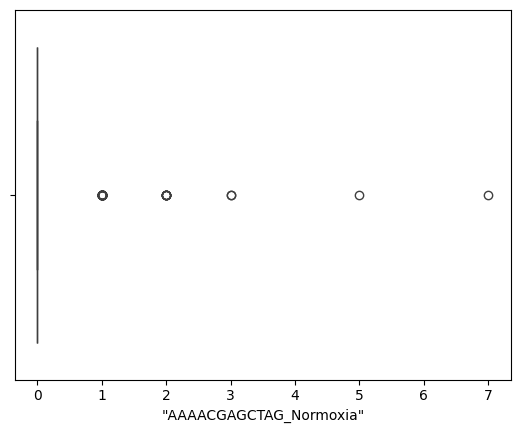

In [ ]:
cnames = list(df.columns)
sns.boxplot(x=df[cnames[2]])

## Violin plot

<Axes: xlabel='"AAAACGAGCTAG_Normoxia"'>

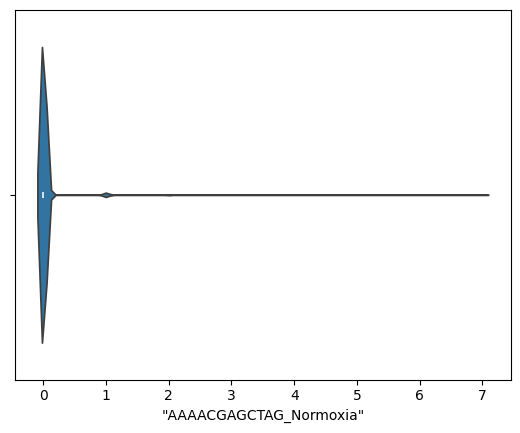

In [ ]:
sns.violinplot(x=df[cnames[2]])


We are going to extend the size of our graph and include more columns to have a better understanding of distribution via violin and box plot.

(3000, 50)


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

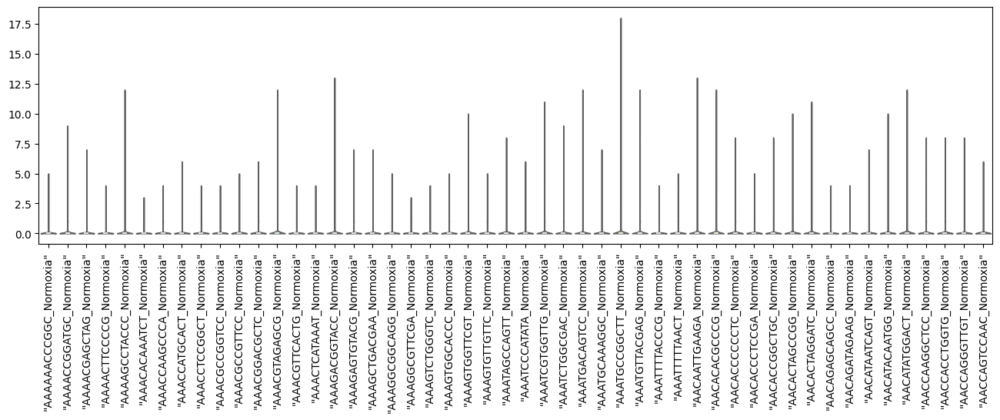

In [ ]:
df_small = df.iloc[:, :50]
print(np.shape(df_small))
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

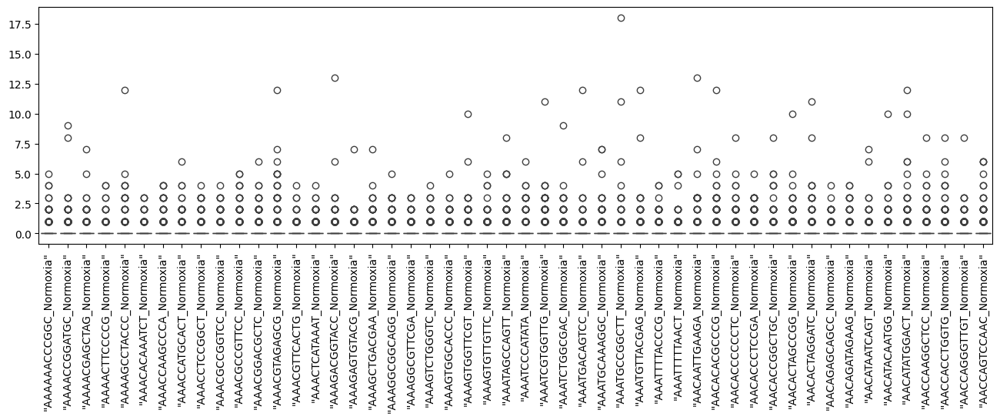

In [ ]:
plt.figure(figsize=(16,4))
plot=sns.boxplot(data=df_small)
plt.setp(plot.get_xticklabels(), rotation=90)

The boxplot represents data grouped by unique sequence identifiers or filenames displayed along the x-axis. Each data point corresponds to an individual observation within its respective group. The y-axis ranges from 0 to approximately 17.5, showing the distribution of values for the observed variable.

We can see:
- The data points are scattered across each group, with some higher values that might be outliers.
- Traditional boxplot elements (e.g., median, quartiles, whiskers) are not clearly visible, suggesting the focus is on individual point distributions rather than summary statistics.
- The group labels on the x-axis are densely packed and overlapping, making them difficult to read. Enhancements like label rotation or abbreviation could improve clarity.

## Finding outliers

### Calculating the Inter quantile range

In [ ]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

"AAAAAACCCGGC_Normoxia"    0.0
"AAAACCGGATGC_Normoxia"    0.0
"AAAACGAGCTAG_Normoxia"    0.0
"AAAACTTCCCCG_Normoxia"    0.0
"AAAAGCCTACCC_Normoxia"    0.0
                          ... 
"TTTTTACCAATC_Hypoxia"     0.0
"TTTTTCCGTGCA_Hypoxia"     0.0
"TTTTTGCCTGGG_Hypoxia"     0.0
"TTTTTGTAACAG_Hypoxia"     0.0
"TTTTTTTGAATC_Hypoxia"     0.0
Length: 14682, dtype: float64


### Removing outliers
- Making a new dataset

In [ ]:
df_noOut = df[~((df < (Q1 - 1.5*IQR)) | (df > (Q3 + 1.5*IQR))).any(axis=1)]
print(np.shape(df_noOut))
df_noOut.head(3)

(0, 14682)


,"""AAAAAACCCGGC_Normoxia""","""AAAACCGGATGC_Normoxia""","""AAAACGAGCTAG_Normoxia""","""AAAACTTCCCCG_Normoxia""","""AAAAGCCTACCC_Normoxia""","""AAACACAAATCT_Normoxia""","""AAACCAAGCCCA_Normoxia""","""AAACCATGCACT_Normoxia""","""AAACCTCCGGCT_Normoxia""","""AAACGCCGGTCC_Normoxia""",...,"""TTTTCTGATGGT_Hypoxia""","""TTTTGATTCAGA_Hypoxia""","""TTTTGCAACTGA_Hypoxia""","""TTTTGCCGGGCC_Hypoxia""","""TTTTGTTAGCCT_Hypoxia""","""TTTTTACCAATC_Hypoxia""","""TTTTTCCGTGCA_Hypoxia""","""TTTTTGCCTGGG_Hypoxia""","""TTTTTGTAACAG_Hypoxia""","""TTTTTTTGAATC_Hypoxia"""


This is a filtered dataset, explains the absence of outliers.

## Skewness and kurtosis
- Helps in understanding the symmetry and 'tailedness' 

### Skewdness

Text(0.5, 0, 'Skewness of single cells expression profiles - original df')

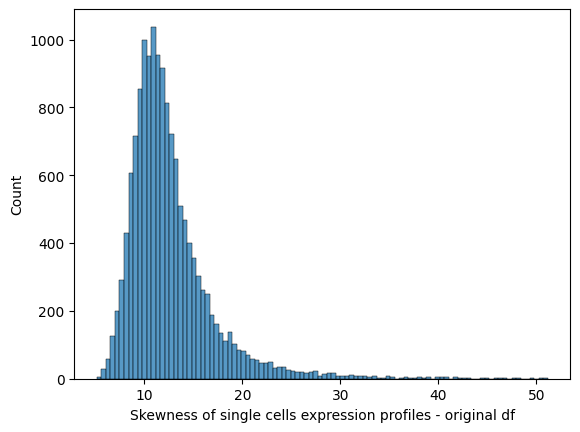

In [ ]:
from scipy.stats import kurtosis, skew
colN = np.shape(df)[1]
colN
df_skew_cells = []
for i in range(colN) :     
     v_df = df[cnames[i]]
     df_skew_cells += [skew(v_df)]   
df_skew_cells
sns.histplot(df_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - original df')

As evident from the histogram, it is positively skewed.


### Kurtosis

Text(0.5, 0, 'Kurtosis of single cells expression profiles - original df')

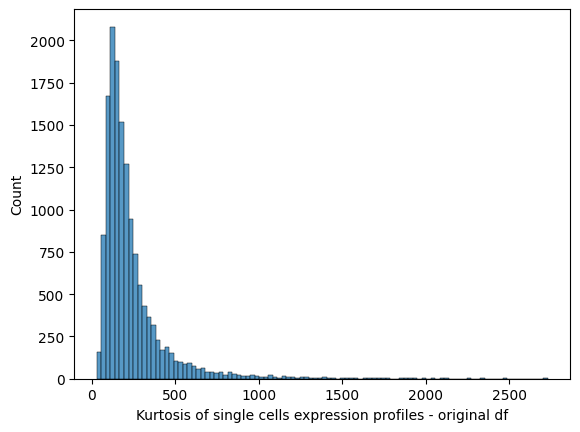

In [ ]:
df_kurt_cells = []
colN = np.shape(df)[1]
colN
for i in range(colN):
    v_df = df[cnames[i]]
    df_kurt_cells += [kurtosis(v_df)]

sns.histplot(df_kurt_cells,bins=100)
plt.xlabel("Kurtosis of single cells expression profiles - original df")


The high kurtosis value suggests that we have extreme heavy tails 

## Data transformation
- Log based 2 transformation

The **log2 transformation** is generally preferred to improve interpretability and statistical analysis. It compresses the dynamic range of values, reducing the influence of extreme outliers while preserving fold-change relationships. A log2 fold change of 1 represents a **2× upregulation**, and -1 corresponds to a **50% downregulation**, providing an intuitive scale for differential expression. Additionally, it stabilizes variance across expression levels, ensuring that highly expressed genes do not disproportionately dominate downstream analyses like clustering or PCA. This transformation is particularly useful for RNA-seq and microarray data, where raw counts or intensities often span several orders of magnitude.

<Axes: xlabel='"AAAACCGGATGC_Normoxia"'>

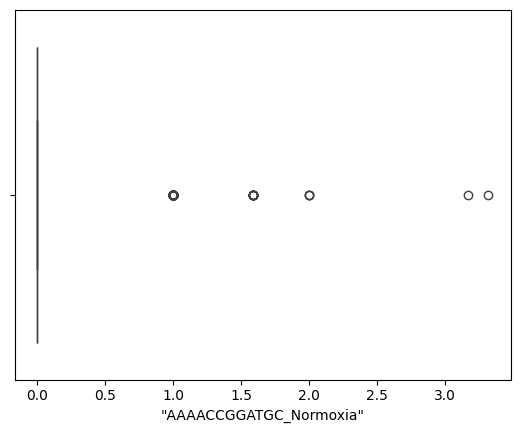

In [ ]:
df11_log2 = np.log2(df[cnames[1]]+1)
sns.boxplot(x=df11_log2)

<Axes: xlabel='"AAAACCGGATGC_Normoxia"'>

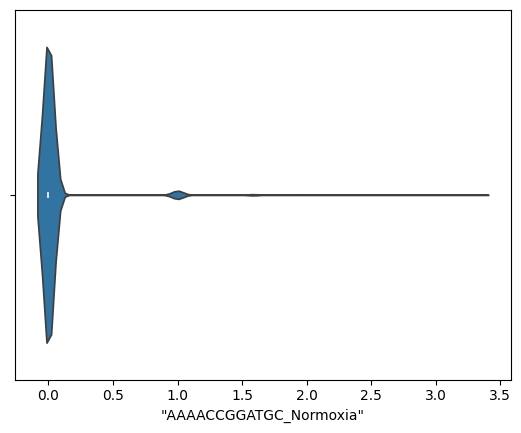

In [ ]:
sns.violinplot(x = df11_log2)

In [ ]:
display(df11_log2.describe().round(2))

count    3000.00
mean        0.04
std         0.21
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         3.32
Name: "AAAACCGGATGC_Normoxia", dtype: float64

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

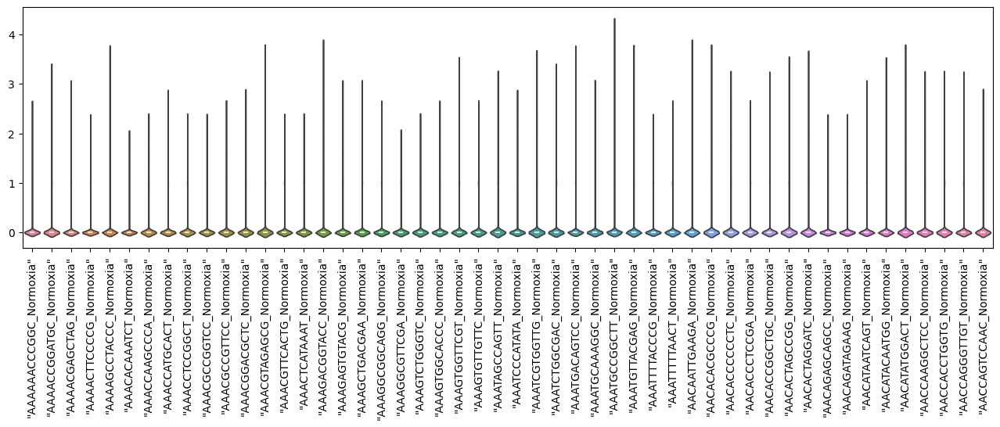

In [ ]:
df1 = df + 1
df1_log2 = np.log2(df1)
df1_log2_small = df1_log2.iloc[:,:50]
plt.figure(figsize=(16,4))
plot = sns.violinplot(data=df1_log2_small)
plt.setp(plot.get_xticklabels(), rotation = 90)

### Checking skewness and kurtosis after transformation

Text(0.5, 0, 'Skewness of single cells expression profiles - log2 df')

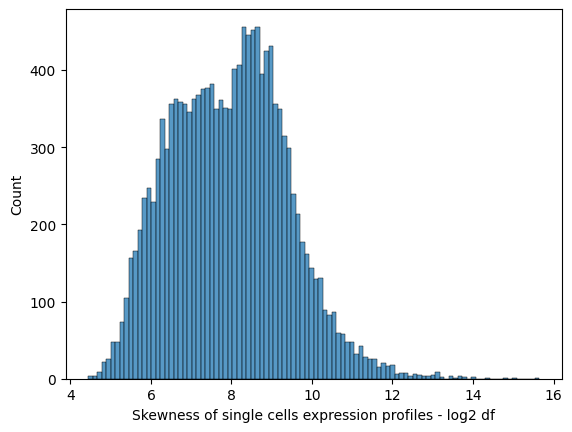

In [ ]:
df1_log2_skew_cells = []
for i in range(colN) :     
     v_df = df1_log2[cnames[i]]
     df1_log2_skew_cells += [skew(v_df)]   
df1_log2_skew_cells
sns.histplot(df1_log2_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - log2 df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - log2 df')

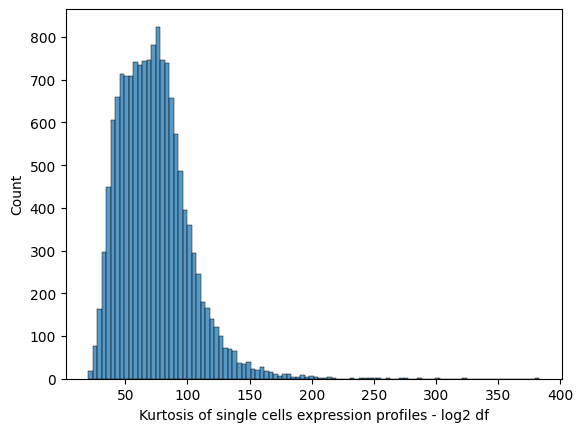

In [ ]:
df1_log2_kurtosis_cells = []
for i in range(colN):
    df1_log2_kurtosis_cells += [kurtosis(df1_log2[cnames[i]])]
sns.histplot(data = df1_log2_kurtosis_cells, bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - log2 df')

We can see some sort of improvement in case of kurtosis and skewness after log2 transformation. 


It is evident from the fact that Log2 transformation can help reduce skewness and kurtosis in data by compressing larger values more than smaller ones, bringing the distribution closer to symmetry and reducing the influence of extreme outliers. This transformation is particularly useful for positively skewed data and can stabilize variance, improving the reliability of statistical analysis. However, it requires all data values to be positive or shifted accordingly.


Kernel density estimation

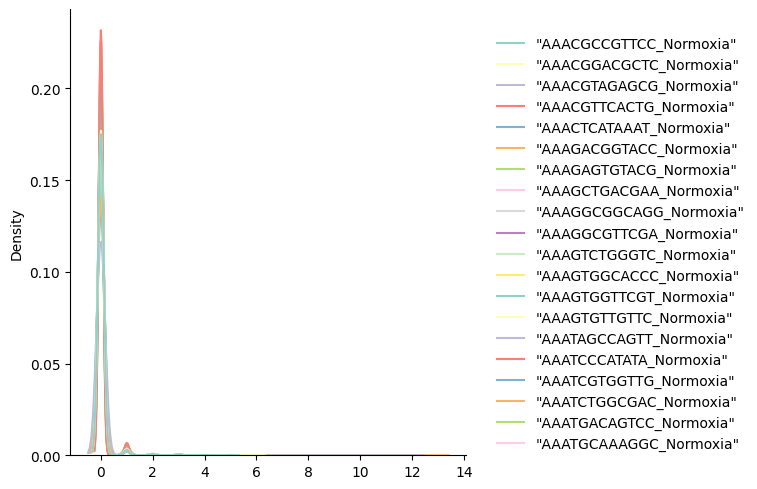

In [ ]:
df_small = df.iloc[:, 10:30]  
sns.displot(data=df_small,palette="Set3",kind="kde", bw_adjust=2)

This Kernel Density Estimation (KDE) plot in this case is visualizing the distribution of gene expression values for 20 selected genes (columns 10 to 30) under normoxic conditions. Each line represents the smoothed probability density of expression levels for a specific gene. The KDE curves show that most gene expression values are concentrated near zero, with a sharp peak around this region, indicating low expression levels are common across these genes. The use of `bw_adjust=2` smooths the curves for clearer pattern recognition. This plot helps identify differences in distribution shapes and potential outliers among the genes.


## Duplicated rows

In [ ]:
duplicate_rows_df = df[df.duplicated(keep=False)]
print("number of duplicate rows: ", duplicate_rows_df.shape)
print("number of duplicate rows: ", duplicate_rows_df)

number of duplicate rows:  (0, 14682)
number of duplicate rows:  Empty DataFrame
Columns: ["AAAAAACCCGGC_Normoxia", "AAAACCGGATGC_Normoxia", "AAAACGAGCTAG_Normoxia", "AAAACTTCCCCG_Normoxia", "AAAAGCCTACCC_Normoxia", "AAACACAAATCT_Normoxia", "AAACCAAGCCCA_Normoxia", "AAACCATGCACT_Normoxia", "AAACCTCCGGCT_Normoxia", "AAACGCCGGTCC_Normoxia", "AAACGCCGTTCC_Normoxia", "AAACGGACGCTC_Normoxia", "AAACGTAGAGCG_Normoxia", "AAACGTTCACTG_Normoxia", "AAACTCATAAAT_Normoxia", "AAAGACGGTACC_Normoxia", "AAAGAGTGTACG_Normoxia", "AAAGCTGACGAA_Normoxia", "AAAGGCGGCAGG_Normoxia", "AAAGGCGTTCGA_Normoxia", "AAAGTCTGGGTC_Normoxia", "AAAGTGGCACCC_Normoxia", "AAAGTGGTTCGT_Normoxia", "AAAGTGTTGTTC_Normoxia", "AAATAGCCAGTT_Normoxia", "AAATCCCATATA_Normoxia", "AAATCGTGGTTG_Normoxia", "AAATCTGGCGAC_Normoxia", "AAATGACAGTCC_Normoxia", "AAATGCAAAGGC_Normoxia", "AAATGCCGGCTT_Normoxia", "AAATGTTACGAG_Normoxia", "AAATTTTACCCG_Normoxia", "AAATTTTTAACT_Normoxia", "AACAATTGAAGA_Normoxia", "AACACACGCCCG_Normoxia", "AACACCCC

There are zero duplicate rows.

## Correlation Between Cells: Histogram & Pairplot

(300, 300)

pandas.core.frame.DataFrame

,"""AAAAAACCCGGC_Normoxia""","""AAAACCGGATGC_Normoxia""","""AAAACGAGCTAG_Normoxia""","""AAAACTTCCCCG_Normoxia""","""AAAAGCCTACCC_Normoxia""","""AAACACAAATCT_Normoxia""","""AAACCAAGCCCA_Normoxia""","""AAACCATGCACT_Normoxia""","""AAACCTCCGGCT_Normoxia""","""AAACGCCGGTCC_Normoxia""",...,"""ACCACTTCGGTC_Normoxia""","""ACCAGGGTGTAC_Normoxia""","""ACCAGTCTGGAT_Normoxia""","""ACCATAACGACC_Normoxia""","""ACCCACATGCTA_Normoxia""","""ACCCACCCCTTA_Normoxia""","""ACCCACTGGTCC_Normoxia""","""ACCCAGCGCCTC_Normoxia""","""ACCCATTACAGT_Normoxia""","""ACCCCACCTGGA_Normoxia"""
"""AAAAAACCCGGC_Normoxia""",1.000000,0.237584,0.345278,0.424418,0.329287,0.305332,0.228045,0.278525,0.272703,0.101198,...,0.285513,0.212254,0.285401,0.198874,0.292547,0.215353,0.249754,0.235897,0.392085,0.157762
"""AAAACCGGATGC_Normoxia""",0.237584,1.000000,0.570827,0.348316,0.370007,0.363805,0.376063,0.493016,0.259373,0.346194,...,0.334482,0.608333,0.185329,0.261414,0.559685,0.459137,0.302141,0.358655,0.351008,0.382377
"""AAAACGAGCTAG_Normoxia""",0.345278,0.570827,1.000000,0.382811,0.305758,0.325790,0.329441,0.538585,0.363743,0.354192,...,0.282573,0.583191,0.197270,0.275597,0.658761,0.400033,0.336013,0.394686,0.545415,0.392639


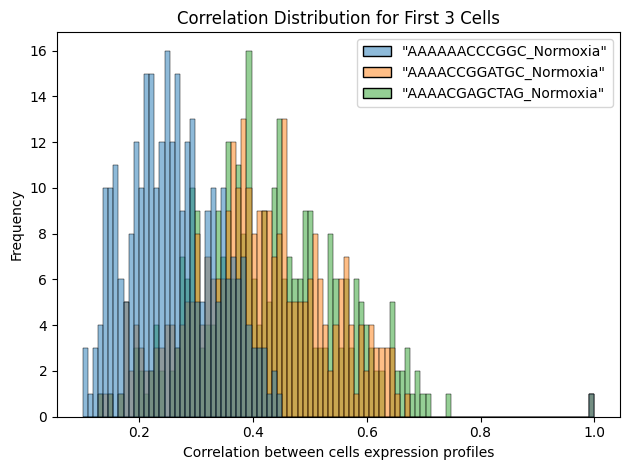

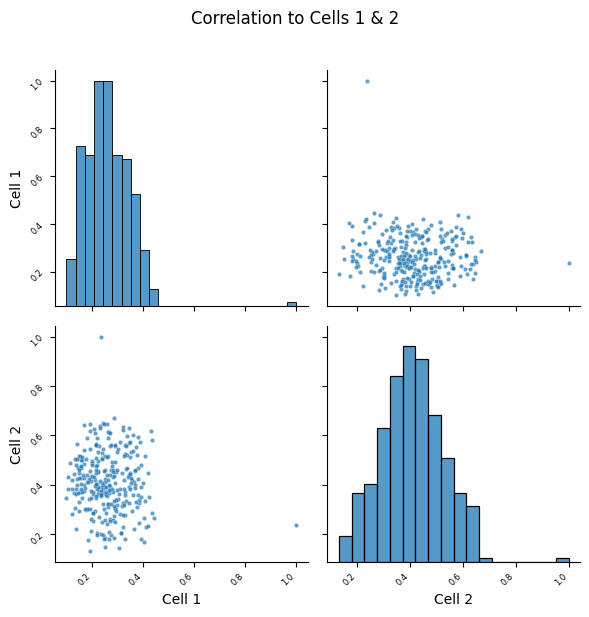

In [ ]:
df_small = df.iloc[:, :300]  

c = df_small.corr()

display(np.shape(c), type(c), c.head(3))

c_small = c.iloc[:, :3]
sns.histplot(c_small, bins=100)
plt.ylabel('Frequency')
plt.xlabel('Correlation between cells expression profiles')
plt.title('Correlation Distribution for First 3 Cells')
plt.tight_layout()
plt.show()

pl = c.iloc[:, :2].copy()
pl.columns = [f"Cell {i+1}" for i in range(pl.shape[1])]

g = sns.pairplot(
    pl,
    height=3,
    plot_kws={"s": 10, "alpha": 0.7},
    diag_kws={"fill": True},
)

for ax in g.axes.flatten():
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=6)
    plt.setp(ax.get_yticklabels(), rotation=45, ha="right", fontsize=6)

plt.suptitle("Correlation to Cells 1 & 2", y=1.02)
plt.tight_layout()
plt.show()


We are looking at the correlation of three randomly chosen cells with the other 299 cells in the 300 × 300 matrix.The majority of the bars now fall between ≈ 0.15 and 0.60, not up at 0.8-plus as before.That tells us the cells are still positively correlated overall, but the signal is moderate rather than very strong—there’s noticeably more diversity in their expression profiles.Each colour corresponds to one of the three probe cells; their curves overlap heavily, confirming that none of them is an extreme outlier.
Zooming in on two of those cells:

The diagonal panels show each cell’s own correlation distribution, both peaking around 0.35–0.45 with a long right-hand tail. The off-diagonal scatter plot compares the two correlation vectors directly. The cloud is roughly oval with a gentle positive slope, matching the idea that the two cells tend to agree on which other cells they resemble, but not perfectly. No tight line or clumping at very high values means the dataset retains useful heterogeneity—ideal if downstream tasks (clustering, classification, etc.) need variation to work with. Taken together, these plots confirm that the preprocessing produced a stable correlation structure while still preserving biological variability across cells.

## <u> MCF7 Cell Line - DropSeq


- MCF7, DropSeq

In [ ]:
import sys
import sklearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt        
import seaborn as sns 
import csv

In [ ]:
df = pd.read_csv("/Users/takhmina/AILab/Data/DropSeq/MCF7_Filtered_Normalised_3000_Data_train.txt", sep=r"\s+", engine="python", quoting=csv.QUOTE_NONE, index_col=0)
print("Matrix shape:", df.shape, "\n")

Matrix shape: (3000, 21626) 



## Metadata Extraction and Preparation

In [ ]:
df.index = df.index.str.replace('"', '').str.strip()

df_T = df.T.copy()
df_T.index   = df_T.index.str.replace('"', '').str.strip()
df_T.columns = df_T.columns.str.replace('"', '').str.strip()
df_T = df_T.apply(pd.to_numeric)

df_meta = pd.DataFrame(index=df_T.index)
df_meta["Sequence"]  = df_meta.index.str.split("_").str[0]
df_meta["Condition"] = df_meta.index.str.split("_").str[1]
df_meta["Cell_Line"] = "MCF7"

print("Metadata shape:", df_meta.shape)
print(df_meta.head(), "\n")

Metadata shape: (21626, 3)
                           Sequence Condition Cell_Line
AAAAACCTATCG_Normoxia  AAAAACCTATCG  Normoxia      MCF7
AAAACAACCCTA_Normoxia  AAAACAACCCTA  Normoxia      MCF7
AAAACACTCTCA_Normoxia  AAAACACTCTCA  Normoxia      MCF7
AAAACCAGGCAC_Normoxia  AAAACCAGGCAC  Normoxia      MCF7
AAAACCTAGCTC_Normoxia  AAAACCTAGCTC  Normoxia      MCF7 



In [ ]:
print("First column: ", df_meta.iloc[ : , 0])

First column:  AAAAACCTATCG_Normoxia    AAAAACCTATCG
AAAACAACCCTA_Normoxia    AAAACAACCCTA
AAAACACTCTCA_Normoxia    AAAACACTCTCA
AAAACCAGGCAC_Normoxia    AAAACCAGGCAC
AAAACCTAGCTC_Normoxia    AAAACCTAGCTC
                             ...     
TTTTCGCGTAGA_Hypoxia     TTTTCGCGTAGA
TTTTCGTCCGCT_Hypoxia     TTTTCGTCCGCT
TTTTCTCCGGCT_Hypoxia     TTTTCTCCGGCT
TTTTGTTCAAAG_Hypoxia     TTTTGTTCAAAG
TTTTTTGTATGT_Hypoxia     TTTTTTGTATGT
Name: Sequence, Length: 21626, dtype: object


We first cleaned the index labels and extracted structured metadata from the cell identifiers.

## First five rows of metadata

In [ ]:
print(df_meta.head(5))

                           Sequence Condition Cell_Line
AAAAACCTATCG_Normoxia  AAAAACCTATCG  Normoxia      MCF7
AAAACAACCCTA_Normoxia  AAAACAACCCTA  Normoxia      MCF7
AAAACACTCTCA_Normoxia  AAAACACTCTCA  Normoxia      MCF7
AAAACCAGGCAC_Normoxia  AAAACCAGGCAC  Normoxia      MCF7
AAAACCTAGCTC_Normoxia  AAAACCTAGCTC  Normoxia      MCF7


## Reading HCC1806_SmartS_Unfiltered_Data
- Dimensions
- First column

In [ ]:
print("First column: ", df.iloc[ : , 0])

First column:  MALAT1       1
MT-RNR2      0
NEAT1        0
H1-5         0
TFF1         4
            ..
BRWD1-AS2    0
RPS19BP1     0
AUNIP        0
TNK2         0
SUDS3        0
Name: "AAAAACCTATCG_Normoxia", Length: 3000, dtype: int64


In [ ]:
print(type(df))

df.shape

list(df.columns)

<class 'pandas.core.frame.DataFrame'>


['"AAAAACCTATCG_Normoxia"',
 '"AAAACAACCCTA_Normoxia"',
 '"AAAACACTCTCA_Normoxia"',
 '"AAAACCAGGCAC_Normoxia"',
 '"AAAACCTAGCTC_Normoxia"',
 '"AAAACCTCCGGG_Normoxia"',
 '"AAAACTCGTTGC_Normoxia"',
 '"AAAAGAGCTCTC_Normoxia"',
 '"AAAAGCTAGGCG_Normoxia"',
 '"AAAATCGCATTT_Normoxia"',
 '"AAAATCTACATA_Normoxia"',
 '"AAAATGGCTCTC_Normoxia"',
 '"AAAATGGGCCGG_Normoxia"',
 '"AAACAAACTCAA_Normoxia"',
 '"AAACAACGAATT_Normoxia"',
 '"AAACAATGAGGT_Normoxia"',
 '"AAACACGCCGCG_Normoxia"',
 '"AAACAGCACGAC_Normoxia"',
 '"AAACATACCCGT_Normoxia"',
 '"AAACATGGATCC_Normoxia"',
 '"AAACATTAGAAT_Normoxia"',
 '"AAACCAACCGGT_Normoxia"',
 '"AAACCAGCCTGG_Normoxia"',
 '"AAACCAGGCTCT_Normoxia"',
 '"AAACCAGGGCAC_Normoxia"',
 '"AAACCCGATTTC_Normoxia"',
 '"AAACCGACGTCG_Normoxia"',
 '"AAACCGCTGCAT_Normoxia"',
 '"AAACCGTCCCGC_Normoxia"',
 '"AAACCGTTAGCC_Normoxia"',
 '"AAACCGTTGGGG_Normoxia"',
 '"AAACCGTTTCTT_Normoxia"',
 '"AAACCTAGGAGA_Normoxia"',
 '"AAACCTATTGTC_Normoxia"',
 '"AAACCTCCACGA_Normoxia"',
 '"AAACCTGAGGGA_Norm

## Dataframe indexes

In [ ]:
gene_symbls = df.index
print("Dataframe indexes: ", gene_symbls)

Dataframe indexes:  Index(['MALAT1', 'MT-RNR2', 'NEAT1', 'H1-5', 'TFF1', 'MT-RNR1', 'H4C3',
       'GDF15', 'KRT81', 'MT-CO3',
       ...
       'MROH1', 'SKIDA1', 'MICALL1', 'RARG', 'MYO1F', 'BRWD1-AS2', 'RPS19BP1',
       'AUNIP', 'TNK2', 'SUDS3'],
      dtype='object', length=3000)


## Describing some statistics regarding each cell.

In [ ]:
print(df.describe())


       "AAAAACCTATCG_Normoxia"  "AAAACAACCCTA_Normoxia"  \
count              3000.000000              3000.000000   
mean                  0.034000                 0.030333   
std                   0.277254                 0.220823   
min                   0.000000                 0.000000   
25%                   0.000000                 0.000000   
50%                   0.000000                 0.000000   
75%                   0.000000                 0.000000   
max                   4.000000                 4.000000   

       "AAAACACTCTCA_Normoxia"  "AAAACCAGGCAC_Normoxia"  \
count              3000.000000              3000.000000   
mean                  0.027000                 0.032333   
std                   0.195662                 0.233751   
min                   0.000000                 0.000000   
25%                   0.000000                 0.000000   
50%                   0.000000                 0.000000   
75%                   0.000000                 0.000000

This dataset summarizes gene expression statistics (count, mean, std, min, quartiles, max) across 3,000 genes in 21,626 MCF7 cells under Normoxia. Expression is highly sparse: median values are consistently zero, and mean expression per cell remains low (0.03–0.05). A few cells show slightly higher variability (AAAACCTCGGG_Normoxia, max=6), but overall the distribution is zero-inflated.


## Checking missing values

In [ ]:
print(df.isnull().sum())

"AAAAACCTATCG_Normoxia"    0
"AAAACAACCCTA_Normoxia"    0
"AAAACACTCTCA_Normoxia"    0
"AAAACCAGGCAC_Normoxia"    0
"AAAACCTAGCTC_Normoxia"    0
                          ..
"TTTTCGCGTAGA_Hypoxia"     0
"TTTTCGTCCGCT_Hypoxia"     0
"TTTTCTCCGGCT_Hypoxia"     0
"TTTTGTTCAAAG_Hypoxia"     0
"TTTTTTGTATGT_Hypoxia"     0
Length: 21626, dtype: int64


###
As clear from the output we have zero missing values in any of the columns. 

## Analyzing some subset of the table.

In [ ]:
df.iloc[ 1:10 , 1:10 ]

,"""AAAACAACCCTA_Normoxia""","""AAAACACTCTCA_Normoxia""","""AAAACCAGGCAC_Normoxia""","""AAAACCTAGCTC_Normoxia""","""AAAACCTCCGGG_Normoxia""","""AAAACTCGTTGC_Normoxia""","""AAAAGAGCTCTC_Normoxia""","""AAAAGCTAGGCG_Normoxia""","""AAAATCGCATTT_Normoxia"""
MT-RNR2,0,0,2,0,0,2,1,7,0
NEAT1,0,0,0,0,2,0,1,2,0
H1-5,0,0,0,0,2,0,0,0,0
TFF1,1,1,1,0,0,0,2,0,1
MT-RNR1,0,0,0,0,0,0,1,0,0
H4C3,1,0,1,0,0,0,3,4,0
GDF15,0,0,0,0,0,0,0,0,0
KRT81,0,0,0,0,0,0,0,0,0
MT-CO3,0,0,0,1,0,1,0,0,0


### Total counts & Library Size distributions 

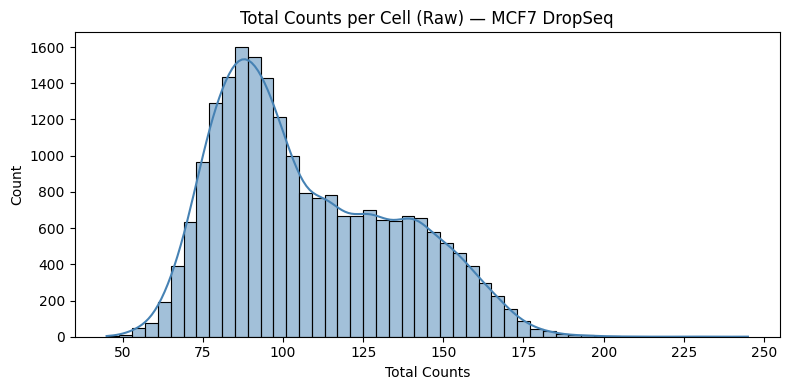

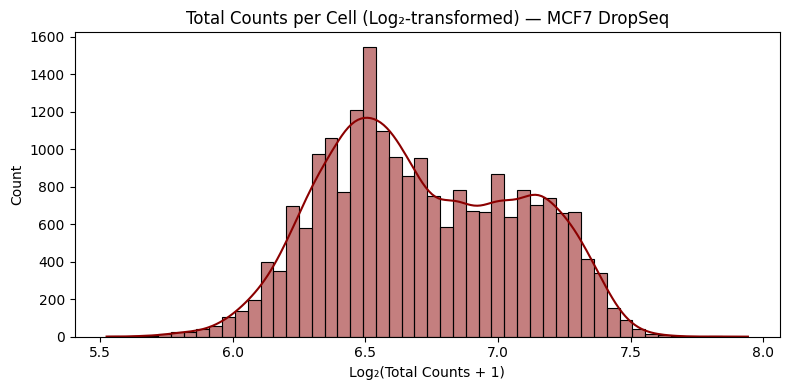

In [ ]:
total_counts     = df_T.sum(axis=1)
total_counts_log = np.log2(total_counts + 1)

plt.figure(figsize=(8, 4))
sns.histplot(total_counts, bins=50, kde=True, color="steelblue")
plt.title("Total Counts per Cell (Raw) — MCF7 DropSeq")
plt.xlabel("Total Counts")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
sns.histplot(total_counts_log, bins=50, kde=True, color="darkred")
plt.title("Total Counts per Cell (Log₂-transformed) — MCF7 DropSeq")
plt.xlabel("Log₂(Total Counts + 1)")
plt.tight_layout()
plt.show()


Visualizing total gene counts per cell (both raw and log-transformed) reveals:
- The raw distribution is unimodal but moderately right-skewed, with most of the cells concentrated around 90–100 detected transcripts. A long tail extends toward higher values.
- Log₂ transformation compresses this tail and results in a more symmetric, compact distribution centered near log₂(100) ≈ 6.6. This reduces the influence of high-count outliers.

## Count per Condition 

/var/folders/y8/x7c57q7x0rdb35zmm3jg8fbc0000gn/T/ipykernel_95932/2836114145.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


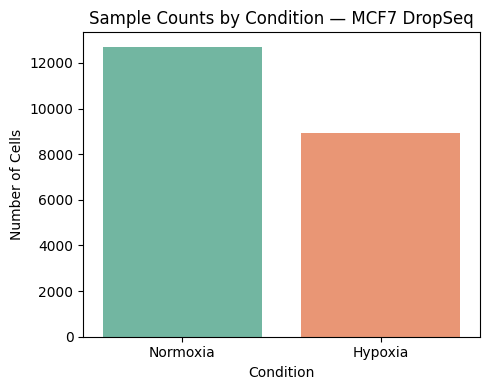

In [ ]:
plt.figure(figsize=(5, 4))
sns.countplot(
    data=df_meta,
    x="Condition",
    palette="Set2"
)
plt.title("Sample Counts by Condition — MCF7 DropSeq")
plt.xlabel("Condition")
plt.ylabel("Number of Cells")
plt.tight_layout()
plt.show()

Normoxia samples are more abundant (~13,000 cells) compared to Hypoxia (~9,000 cells). 

## Number of detected genes

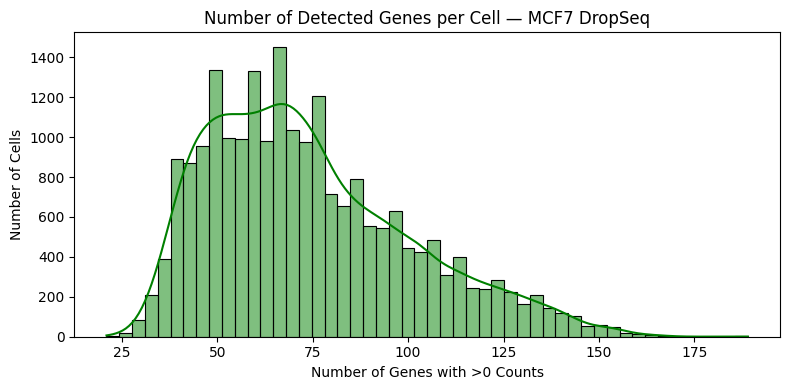

Detected genes per cell stats (MCF7 DropSeq):
count    21626.00
mean        74.12
std         26.63
min         21.00
25%         53.00
50%         69.00
75%         90.00
max        189.00
dtype: float64


In [ ]:
detected_genes = (df_T > 0).sum(axis=1)

plt.figure(figsize=(8, 4))
sns.histplot(detected_genes, bins=50, color="green", kde=True)
plt.title("Number of Detected Genes per Cell — MCF7 DropSeq")
plt.xlabel("Number of Genes with >0 Counts")
plt.ylabel("Number of Cells")
plt.tight_layout()
plt.show()

print("Detected genes per cell stats (MCF7 DropSeq):")
print(detected_genes.describe().round(2))


This histogram shows the distribution of detected genes per cell based on the number of genes with non-zero expression. Most cells exhibit between 50 and 90 detected genes, with a peak around 69, which corresponds to the median. The overall spread is moderate (IQR = 90 – 53 = 37), and the tail extends toward higher values, with a maximum of 189 genes detected in some cells.

Whjle the distribution is compact and right-skewed, it suggests that most observations likely represent valid, meaningful cells.

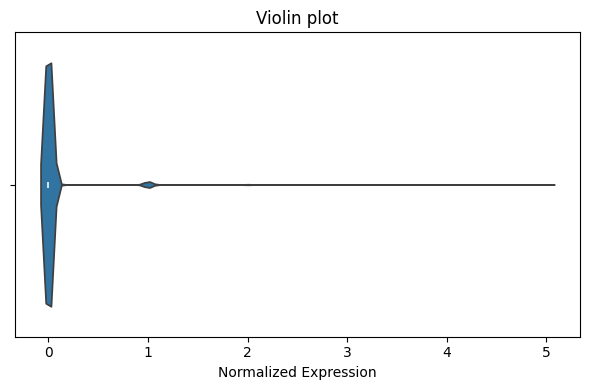

In [ ]:
cell_name = df.columns[2]
plt.figure(figsize=(6, 4))
sns.violinplot(x=df[cell_name])
plt.title(f"Violin plot")
plt.xlabel("Normalized Expression")
plt.tight_layout()
plt.show()

The violin plot shows a strong asymmetry in expression values for this cell. A sharp density spike is concentrated at low expression levels, with a flat tail extending toward higher values. This shape strengthens earlier observations of sparsity and confirms that most genes are weakly expressed. Such skew further supports the need for log-transformation to stabilize variance.

(3000, 50)


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

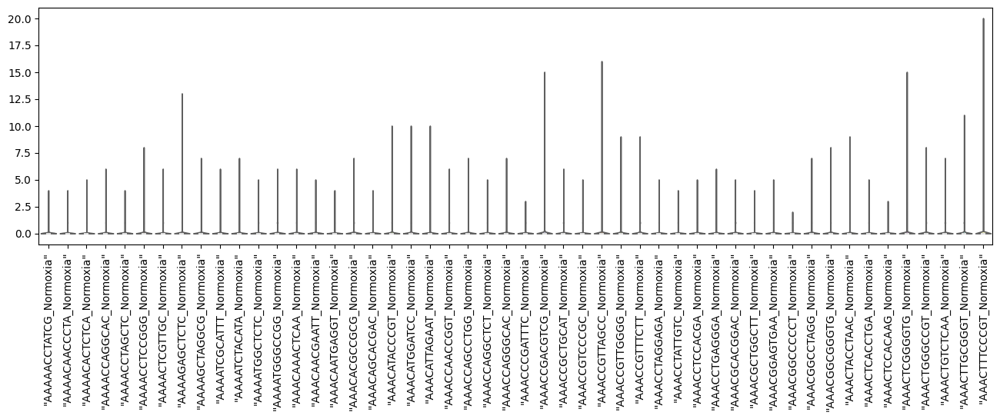

In [ ]:
df_small = df.iloc[:, :50]
print(np.shape(df_small))
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

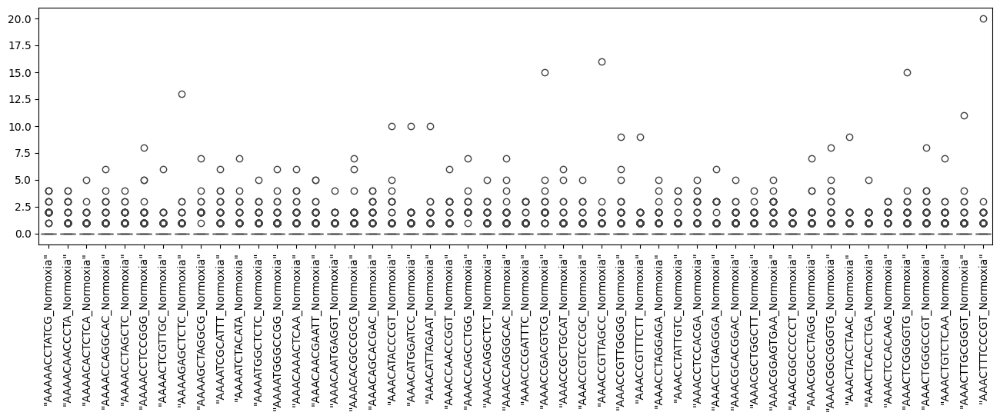

In [ ]:
plt.figure(figsize=(16,4))
plot=sns.boxplot(data=df_small)
plt.setp(plot.get_xticklabels(), rotation=90)

Both plots above confirm that strong sparsity and right-skewed distributions are dominant features of the dataset.

These two plots visualize the distribution of normalized expression values across the first 50 cells. The first is a violin plot, which combines a boxplot with a kernel density estimate to show the full distribution of expression per cell. While the violins appear narrow, many still show extended tails reaching well beyond 2.5.

The second plot, a standard boxplot, confirms this: most cells have non-zero interquartile ranges, and several show long whiskers and numerous outliers extending above 10 or even 20.

## Mitochondrial Gene Condition

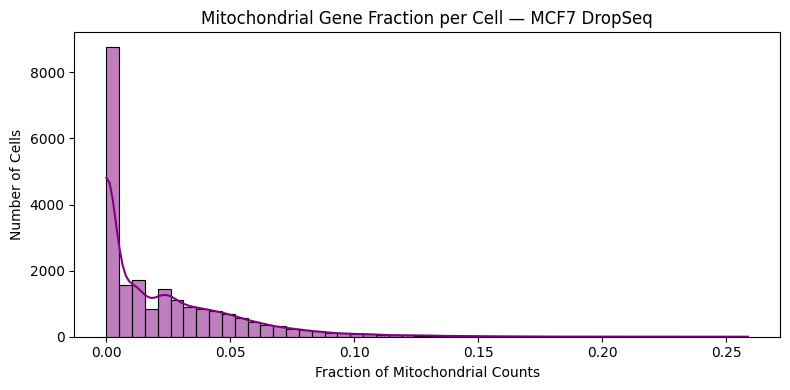

Mitochondrial content stats (MCF7 DropSeq):
count    21626.00
mean         0.02
std          0.03
min          0.00
25%          0.00
50%          0.01
75%          0.04
max          0.26
dtype: float64


In [ ]:
mt_genes = [gene for gene in df_T.columns if gene.startswith("MT-")]
if mt_genes:
    mt_frac = df_T[mt_genes].sum(axis=1) / df_T.sum(axis=1)

    plt.figure(figsize=(8, 4))
    sns.histplot(mt_frac, bins=50, color="purple", kde=True)
    plt.title("Mitochondrial Gene Fraction per Cell — MCF7 DropSeq")
    plt.xlabel("Fraction of Mitochondrial Counts")
    plt.ylabel("Number of Cells")
    plt.tight_layout()
    plt.show()

    print("Mitochondrial content stats (MCF7 DropSeq):")
    print(mt_frac.describe().round(2))
else:
    print("No mitochondrial genes found in dataset.")

The majority of cells show very low mitochondrial content, with a median fraction of 0.01 and a mean of 0.02. Most cells fall within a tight range (IQR: 0.00–0.04), and only a small number of cells exceed 10–15%. The distribution is highly right-skewed, but the low central tendency confirms that overall sample quality is higH.

## Mean Expression vs Variance per gene 

Shapes (genes × cells, variances, means): (3000, 21626) (3000,) (3000,)
First few gene variances:
 "MALAT1"     46.749391
"MT-RNR2"     2.962145
"NEAT1"       0.413526
"H1-5"        0.909900
"TFF1"        6.180367
dtype: float64
First few mean expressions:
 "MALAT1"     3.634791
"MT-RNR2"    0.850458
"NEAT1"      0.136086
"H1-5"       0.368862
"TFF1"       1.799362
dtype: float64


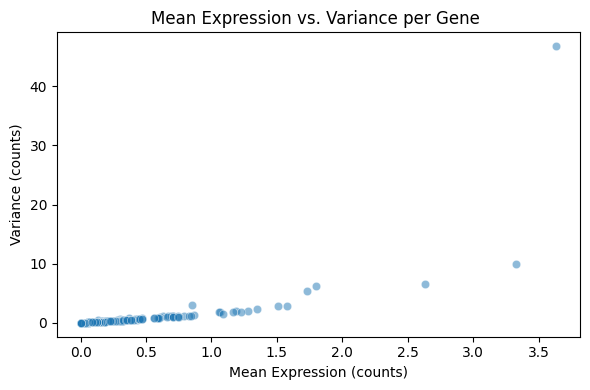

In [ ]:
gene_variances  = df.var(axis=1)
mean_expression = df.mean(axis=1)
print("Shapes (genes × cells, variances, means):", df.shape, gene_variances.shape, mean_expression.shape)

print("First few gene variances:\n", gene_variances.head())
print("First few mean expressions:\n", mean_expression.head())

plt.figure(figsize=(6, 4))
sns.scatterplot(x=mean_expression, y=gene_variances, alpha=0.5)
plt.xlabel("Mean Expression (counts)")
plt.ylabel("Variance (counts)")
plt.title("Mean Expression vs. Variance per Gene ")
plt.tight_layout()
plt.show()


We observe a clear positive correlation from this scatter plot: genes with higher mean tend to have a higher variability across cells.

Most genes fall into the lower-left corner, with mean expressions below 1 and variances under 1, indicating consistently low or sparse expression. However, some genes—such as MALAT1 and TFF1—emerge as outliers with much higher dispersion (e.g., MALAT1 mean = 3.63, variance = 46.75).

## Top 20 genes 

/var/folders/y8/x7c57q7x0rdb35zmm3jg8fbc0000gn/T/ipykernel_95932/256114860.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


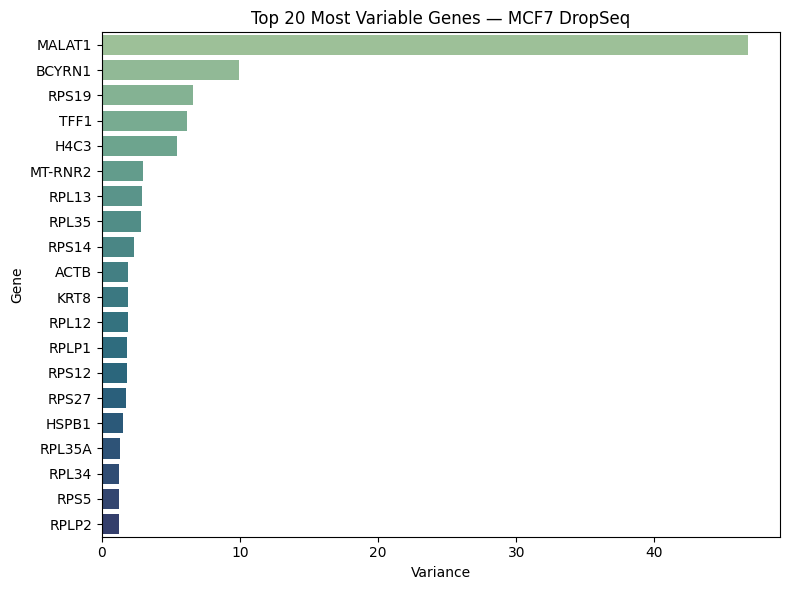

In [ ]:
top_20_genes = gene_variances.nlargest(20)

plt.figure(figsize=(8, 6))
sns.barplot(
    x=top_20_genes.values,
    y=top_20_genes.index,
    palette="crest"
)
plt.title("Top 20 Most Variable Genes — MCF7 DropSeq")
plt.xlabel("Variance")
plt.ylabel("Gene")
plt.tight_layout()
plt.show()


The top-ranking gene, MALAT1, displays an especially high variance (~46.7), followed by BCYRN1, RPS19, and TFF1. 

## Finding outliers

### Calculating the Inter Quantile Range

In [ ]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

"AAAAACCTATCG_Normoxia"    0.0
"AAAACAACCCTA_Normoxia"    0.0
"AAAACACTCTCA_Normoxia"    0.0
"AAAACCAGGCAC_Normoxia"    0.0
"AAAACCTAGCTC_Normoxia"    0.0
                          ... 
"TTTTCGCGTAGA_Hypoxia"     0.0
"TTTTCGTCCGCT_Hypoxia"     0.0
"TTTTCTCCGGCT_Hypoxia"     0.0
"TTTTGTTCAAAG_Hypoxia"     0.0
"TTTTTTGTATGT_Hypoxia"     0.0
Length: 21626, dtype: float64


### Removing outliers
- Making a new dataset

In [ ]:
df_noOut = df[~((df < (Q1 - 1.5*IQR)) | (df > (Q3 + 1.5*IQR))).any(axis=1)]
print(np.shape(df_noOut))
df_noOut.head(3)

(0, 21626)


,"""AAAAACCTATCG_Normoxia""","""AAAACAACCCTA_Normoxia""","""AAAACACTCTCA_Normoxia""","""AAAACCAGGCAC_Normoxia""","""AAAACCTAGCTC_Normoxia""","""AAAACCTCCGGG_Normoxia""","""AAAACTCGTTGC_Normoxia""","""AAAAGAGCTCTC_Normoxia""","""AAAAGCTAGGCG_Normoxia""","""AAAATCGCATTT_Normoxia""",...,"""TTTTACAGGATC_Hypoxia""","""TTTTACCACGTA_Hypoxia""","""TTTTATGCTACG_Hypoxia""","""TTTTCCAGACGC_Hypoxia""","""TTTTCGCGCTCG_Hypoxia""","""TTTTCGCGTAGA_Hypoxia""","""TTTTCGTCCGCT_Hypoxia""","""TTTTCTCCGGCT_Hypoxia""","""TTTTGTTCAAAG_Hypoxia""","""TTTTTTGTATGT_Hypoxia"""


This is a filtered dataset, explains the absence of outliers.

## Skewness and kurtosis
- Helps in understanding the symmetry and 'tailedness' 

### Skewness

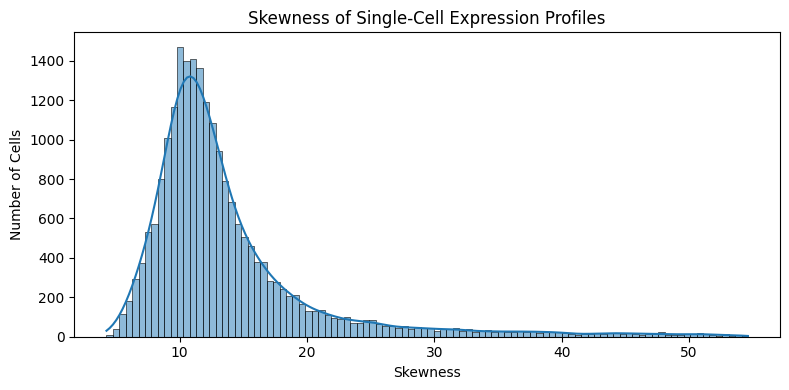

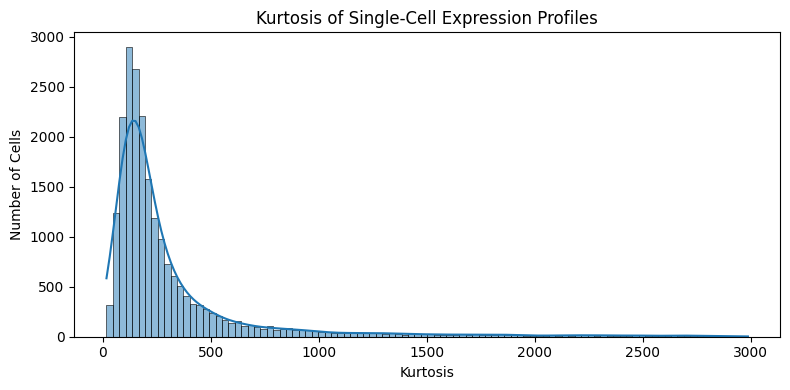

In [ ]:
from scipy.stats import skew, kurtosis

cell_skews  = df.apply(skew, axis=0)
cell_kurts  = df.apply(kurtosis, axis=0)

plt.figure(figsize=(8, 4))
sns.histplot(cell_skews, bins=100, kde=True)
plt.title("Skewness of Single-Cell Expression Profiles")
plt.xlabel("Skewness")
plt.ylabel("Number of Cells")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
sns.histplot(cell_kurts, bins=100, kde=True)
plt.title("Kurtosis of Single-Cell Expression Profiles")
plt.xlabel("Kurtosis")
plt.ylabel("Number of Cells")
plt.tight_layout()
plt.show()


As evident from the histogram, it is positively skewed.


### Kurtosis

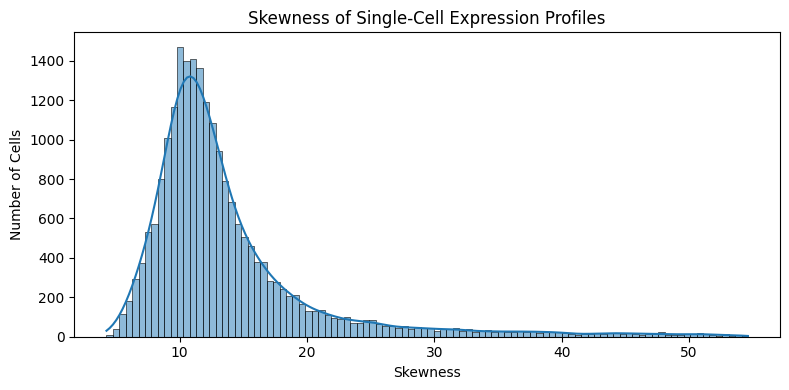

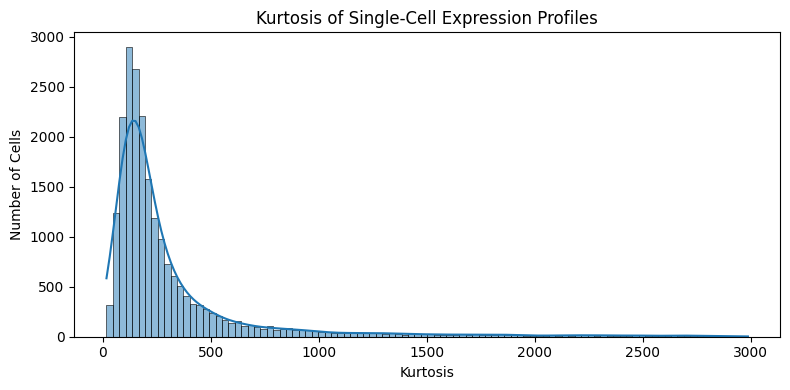

In [ ]:
from scipy.stats import skew, kurtosis

cnames = list(df.columns)

df_skew_cells = [skew(df[col]) for col in cnames]
df_kurt_cells = [kurtosis(df[col]) for col in cnames]

plt.figure(figsize=(8, 4))
sns.histplot(df_skew_cells, bins=100, kde=True)
plt.title("Skewness of Single-Cell Expression Profiles")
plt.xlabel("Skewness")
plt.ylabel("Number of Cells")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
sns.histplot(df_kurt_cells, bins=100, kde=True)
plt.title("Kurtosis of Single-Cell Expression Profiles")
plt.xlabel("Kurtosis")
plt.ylabel("Number of Cells")
plt.tight_layout()
plt.show()


The high kurtosis value suggests that we have extreme heavy tails.

## Data transformation


In [ ]:
display(df11_log2.describe().round(2))

count    3000.00
mean        0.03
std         0.18
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         2.32
Name: "AAAACAACCCTA_Normoxia", dtype: float64

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

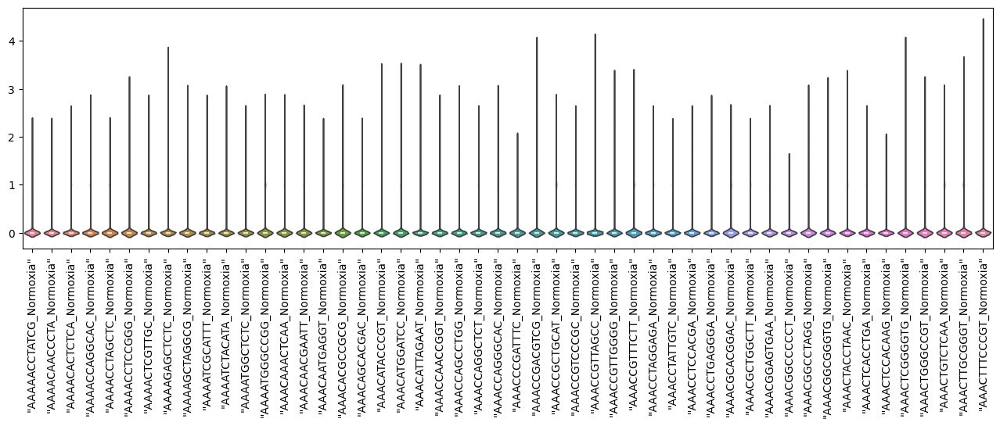

In [ ]:
df1 = df + 1
df1_log2 = np.log2(df1)
df1_log2_small = df1_log2.iloc[:,:50]
plt.figure(figsize=(16,4))
plot = sns.violinplot(data=df1_log2_small)
plt.setp(plot.get_xticklabels(), rotation = 90)

### Checking skewness and kurtosis after transformation

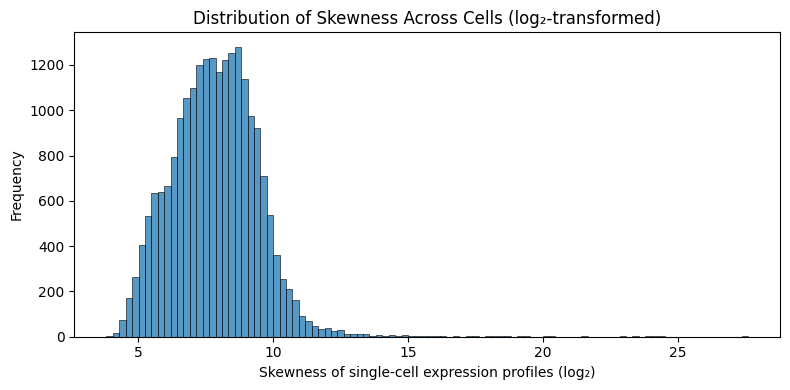

In [ ]:
cnames = list(df1_log2.columns)
colN   = len(cnames)

df1_log2_skew_cells = [skew(df1_log2[col]) for col in cnames]

plt.figure(figsize=(8, 4))
sns.histplot(df1_log2_skew_cells, bins=100, kde=False)
plt.xlabel("Skewness of single-cell expression profiles (log₂)") 
plt.ylabel("Frequency")
plt.title("Distribution of Skewness Across Cells (log₂-transformed)")
plt.tight_layout()
plt.show()

Text(0.5, 0, 'Kurtosis of single cells expression profiles - log2 df')

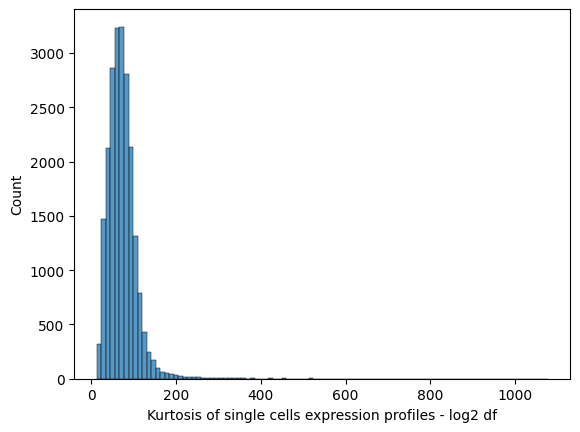

In [ ]:
df1_log2_kurtosis_cells = []
for i in range(colN):
    df1_log2_kurtosis_cells += [kurtosis(df1_log2[cnames[i]])]
sns.histplot(data = df1_log2_kurtosis_cells, bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - log2 df')

To evaluate the effect of log₂ transformation on distribution shape, we computed skewness and kurtosis across all cells. The top plot shows that skewness values shifted leftward and became more compact, although the distribution still exhibits right skew. The bottom plot confirms a similar reduction in kurtosis, though some cells still show a sharp peak and extended tails. 

## Kernel density estimation

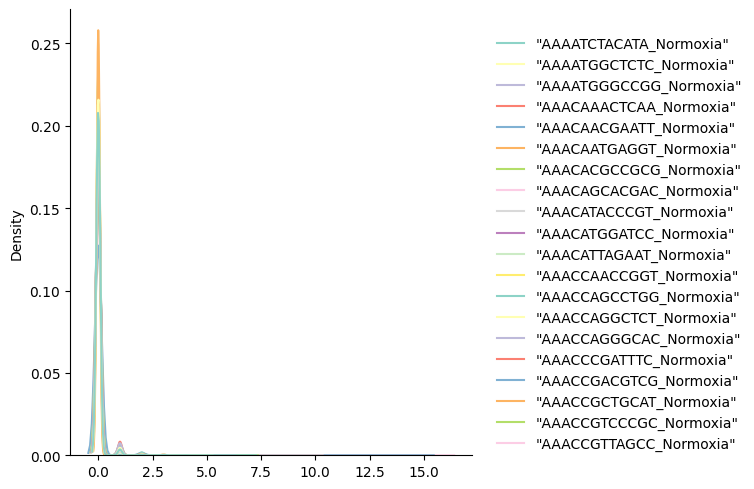

In [ ]:
df_small = df.iloc[:, 10:30]  
sns.displot(data=df_small,palette="Set3",kind="kde", bw_adjust=2)

Most of the curves peak sharply near zero, which fits with what we’ve seen before - gene expression is mostly very low. Even after smoothing the lines a bit, we still see that most of the values cluster at the bottom. This confirms that most genes aren’t very active in these cells.

## Duplicated rows

In [ ]:
duplicate_rows_df = df[df.duplicated(keep=False)]
print("Number of duplicate rows: ", duplicate_rows_df.shape)
print("Duplicate rows:\n", duplicate_rows_df)

Number of duplicate rows:  (0, 21626)
Duplicate rows:
 Empty DataFrame
Columns: ["AAAAACCTATCG_Normoxia", "AAAACAACCCTA_Normoxia", "AAAACACTCTCA_Normoxia", "AAAACCAGGCAC_Normoxia", "AAAACCTAGCTC_Normoxia", "AAAACCTCCGGG_Normoxia", "AAAACTCGTTGC_Normoxia", "AAAAGAGCTCTC_Normoxia", "AAAAGCTAGGCG_Normoxia", "AAAATCGCATTT_Normoxia", "AAAATCTACATA_Normoxia", "AAAATGGCTCTC_Normoxia", "AAAATGGGCCGG_Normoxia", "AAACAAACTCAA_Normoxia", "AAACAACGAATT_Normoxia", "AAACAATGAGGT_Normoxia", "AAACACGCCGCG_Normoxia", "AAACAGCACGAC_Normoxia", "AAACATACCCGT_Normoxia", "AAACATGGATCC_Normoxia", "AAACATTAGAAT_Normoxia", "AAACCAACCGGT_Normoxia", "AAACCAGCCTGG_Normoxia", "AAACCAGGCTCT_Normoxia", "AAACCAGGGCAC_Normoxia", "AAACCCGATTTC_Normoxia", "AAACCGACGTCG_Normoxia", "AAACCGCTGCAT_Normoxia", "AAACCGTCCCGC_Normoxia", "AAACCGTTAGCC_Normoxia", "AAACCGTTGGGG_Normoxia", "AAACCGTTTCTT_Normoxia", "AAACCTAGGAGA_Normoxia", "AAACCTATTGTC_Normoxia", "AAACCTCCACGA_Normoxia", "AAACCTGAGGGA_Normoxia", "AAACGCACGGAC_Normo

There are zero duplicate rows.

# Data structure
- Correlation

## Heatmap

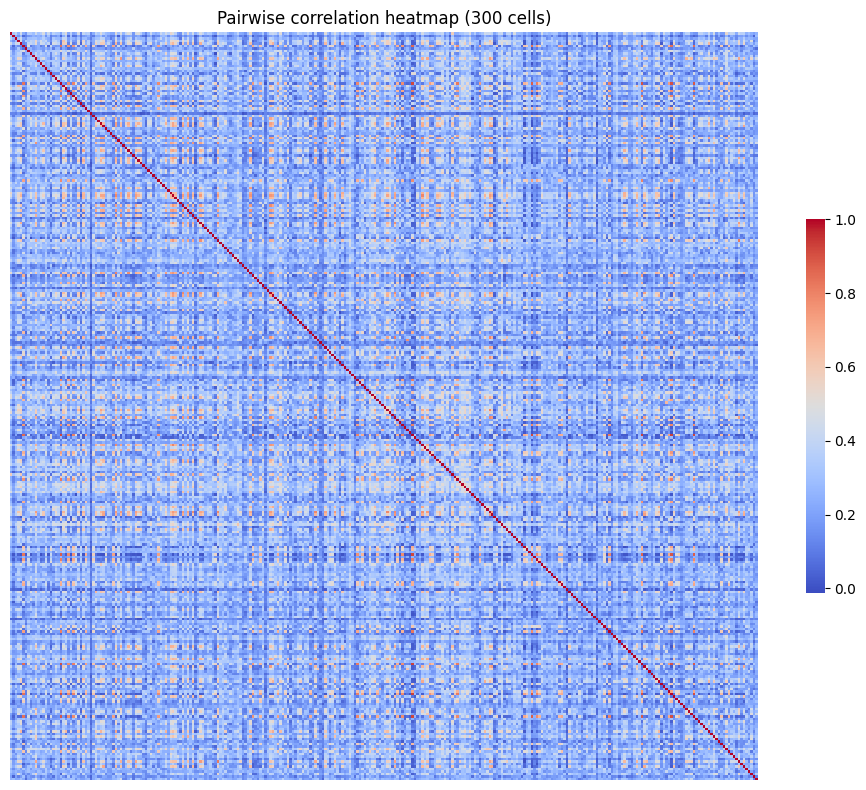

Heatmap matrix shape: (300, 300)
Min corr: -0.012659174184834162
Max corr: 1.0
Midpoint: 0.4936704129075829


In [ ]:
n_cells = 300
subset_cells = np.random.choice(df.columns, size=n_cells, replace=False)
df_sub = df[subset_cells]

corr = df_sub.corr()

plt.figure(figsize=(10, 8))
mid = (corr.values.max() + corr.values.min()) / 2
sns.heatmap(
    corr,
    cmap="coolwarm",
    center=mid,
    xticklabels=False,
    yticklabels=False,
    square=True,
    cbar_kws={"shrink": 0.5}
)
plt.title(f"Pairwise correlation heatmap ({n_cells} cells)")
plt.tight_layout()
plt.show()

print("Heatmap matrix shape:", corr.shape)
print("Min corr:", corr.values.min())
print("Max corr:", corr.values.max())
print("Midpoint:", mid)


This heatmap visualizes pairwise correlations between 300 randomly selected cells based on their gene expression profiles. The matrix shape is (300, 300), where each cell-to-cell correlation is color-coded from blue to red. 

Overall, this plot supports previous findings: while some cells share moderate similarity, most are highly diverse.

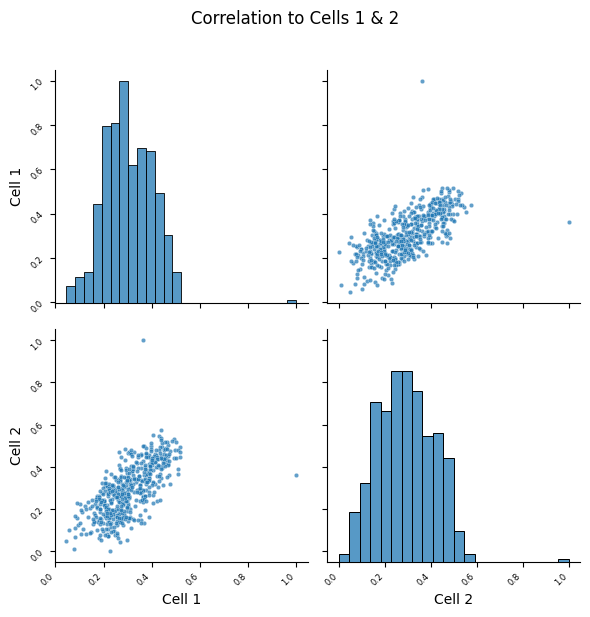

In [ ]:
pl = corr_sub.iloc[:, :2].copy()

pl.columns = [f"Cell {i+1}" for i in range(pl.shape[1])]

g = sns.pairplot(
    pl,
    height=3,
    plot_kws={"s": 10, "alpha": 0.7},
    diag_kws={"fill": True},
)

for ax in g.axes.flatten():
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=6)
    plt.setp(ax.get_yticklabels(), rotation=45, ha="right", fontsize=6)

plt.suptitle("Correlation to Cells 1 & 2", y=1.02)
plt.tight_layout()
plt.show()


These plots explore how two specific cells relate to the rest of the dataset based on their gene expression correlations. The histograms along the diagonals show the distribution of correlation scores for Cell 1 and Cell 2, with most values clustering between 0.3 and 0.6, implying a moderate to strong similarity with many other cells.

Overall, this kind of pairwise correlation check adds confidence that the data maintains coherent structure after normalization and transformation.

### SmartSeq

## <u> HCC1806 Cell Line - SmartSeq


- HCC1806, SmartSeq
- Unfiltered

In [ ]:
import sys
import sklearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt             
import seaborn as sns 
import csv

## Reading the file
- Dimensions
- First column

In [ ]:
df_meta = pd.read_csv(
    "/Users/takhmina/AILab/Data/SmartSeq/HCC1806_SmartS_MetaData.tsv",
    sep="\t", engine="python", index_col=0
)
print("Metadata shape:", df_meta.shape)
print("First column (Cell Line):", df_meta.iloc[:, 0])


Metadata shape: (243, 8)
First column (Cell Line): Filename
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam    HCC1806
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam     HCC1806
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam       HCC1806
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam      HCC1806
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam        HCC1806
                                                                         ...   
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam    HCC1806
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam    HCC1806
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam      HCC1806
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam     HCC1806
output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam     HCC1806
Name: Cell Line, Length: 243, dtype: object


## First five rows of metadata

In [ ]:
print(df_meta.head(5))

                                                   Cell Line  PCR Plate  Pos  \
Filename                                                                       
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned....   HCC1806          1  A10   
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.s...   HCC1806          1  A12   
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sor...   HCC1806          1   A1   
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.so...   HCC1806          1   A2   
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sort...   HCC1806          1   A3   

                                                   Condition  Hours Cell name  \
Filename                                                                        
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned....     Normo     24      S123   
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.s...     Normo     24       S26   
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sor...      Hypo     24       S97   
output.STAR.PCRPlate1A2_Hypoxia_S1

## Reading HCC1806_SmartS_Unfiltered_Data
- Dimensions
- First column
- We verify dataset dimensions and inspect the first few entries to ensure accurate data loading.

In [ ]:
df = pd.read_csv(
    "/Users/takhmina/AILab/Data/SmartSeq/HCC1806_SmartS_Unfiltered_Data.txt", sep=r"\s+", engine="python", quoting=csv.QUOTE_NONE, index_col=0)
print("Counts matrix shape:", df.shape)     
print("First gene name:", df.index[0])     

df.index = df.index.str.replace('"', '').str.strip()

df_T = df.T

df_T.index   = df_T.index.str.replace('"', '').str.strip()
df_T.columns = df_T.columns.str.replace('"', '').str.strip()

df_T = df_T.apply(pd.to_numeric)


Counts matrix shape: (23396, 243)
First gene name: "WASH7P"


## Dataframe indexes

In [ ]:
gene_symbols = df.index
print("Dataframe indexes:", gene_symbols[:10], "…")

Dataframe indexes: Index(['WASH7P', 'CICP27', 'DDX11L17', 'WASH9P', 'OR4F29', 'MTND1P23',
       'MTND2P28', 'MTCO1P12', 'MTCO2P12', 'MTATP8P1'],
      dtype='object') …


## Describing some statistics regarding each cell.

In [ ]:
print(df.describe())

       "output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"  \
count                                       23396.000000                        
mean                                           99.565695                        
std                                           529.532443                        
min                                             0.000000                        
25%                                             0.000000                        
50%                                             0.000000                        
75%                                            51.000000                        
max                                         35477.000000                        

       "output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"  \
count                                       23396.000000                       
mean                                          207.678278                       
std                           

This dataset summarizes gene expression statistics (count, mean, std, min, quartiles, max) across 23,396 genes in 243 HCC1806 cells under Normoxia and Hypoxia. Expression is sparse and heterogeneous: median counts per cell are 0, while mean values vary widely (e.g., Normoxia sample: mean = 207.7, SD = 981.1; Hypoxia sample: mean = 9.7, SD = 65.5). Some cells display extreme outliers with maximum gene counts reaching 69,068.


## Checking missing values

In [ ]:
print(df.isnull().sum())

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"    0
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     0
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"       0
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"      0
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"        0
                                                                         ..
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"    0
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"    0
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"      0
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"     0
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"     0
Length: 243, dtype: int64


We confirm data completeness by checking missing values. As clear from the output, we have zero missing values in any of the columns.

## Analyzing some subset of the table.

In [ ]:
df.iloc[ 1:10 , 1:10 ]

,"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam"""
CICP27,0,0,0,0,0,0,0,0,0
DDX11L17,0,0,0,0,1,0,0,0,0
WASH9P,0,0,0,0,0,0,0,1,0
OR4F29,0,0,0,0,0,1,0,0,0
MTND1P23,424,11,63,27,81,305,82,46,177
MTND2P28,100,0,16,3,1,70,8,5,10
MTCO1P12,2340,22,1020,303,587,2572,1004,443,779
MTCO2P12,5,0,3,0,0,1,5,0,2
MTATP8P1,1,0,0,0,0,3,0,0,1


### Total counts & Library Size distributions 

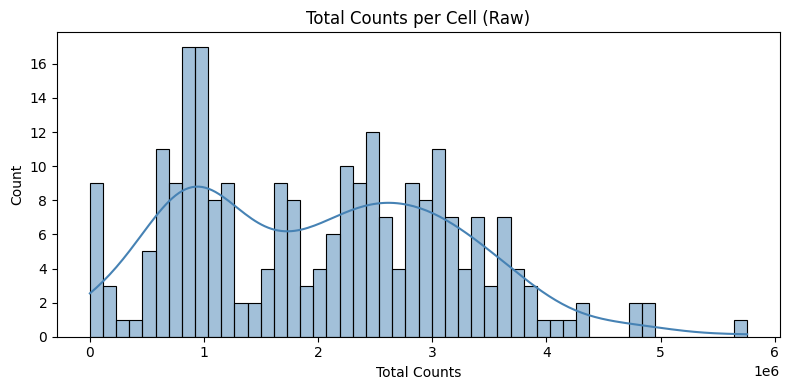

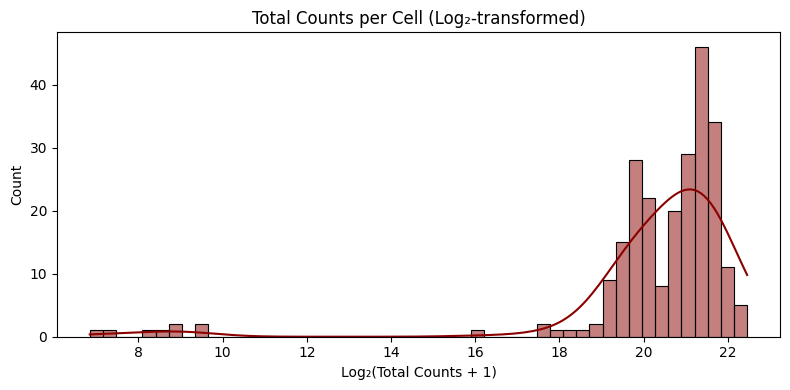

In [ ]:
total_counts     = df_T.sum(axis=1)
total_counts_log = np.log2(total_counts + 1)

plt.figure(figsize=(8, 4))
sns.histplot(total_counts, bins=50, kde=True, color="steelblue")
plt.title("Total Counts per Cell (Raw)")
plt.xlabel("Total Counts")
plt.tight_layout(); plt.show()

plt.figure(figsize=(8, 4))
sns.histplot(total_counts_log, bins=50, kde=True, color="darkred")
plt.title("Total Counts per Cell (Log₂-transformed)")
plt.xlabel("Log₂(Total Counts + 1)")
plt.tight_layout(); plt.show()

Visualizing total gene counts per cell (both raw and log-transformed) reveals:
- The raw distribution is heavily skewed, with a few cells displaying extremely high gene counts.
- After log transformation, the skewness is significantly reduced, allowing a more straightforward comparison across cells.

### Counts by condition

/var/folders/y8/x7c57q7x0rdb35zmm3jg8fbc0000gn/T/ipykernel_65816/1168679134.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


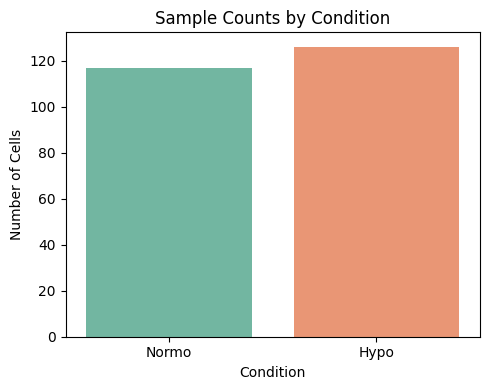

In [ ]:
plt.figure(figsize=(5, 4))
sns.countplot(
    data=df_meta,
    x="Condition",
    palette="Set2"
)
plt.title("Sample Counts by Condition")
plt.xlabel("Condition")
plt.ylabel("Number of Cells")
plt.tight_layout()
plt.show()


Understanding sample size by condition is crucial to ensure a balanced analysis and minimize bias that could arise from imbalanced group sizes. From the graph, we can see a relatively balanced sample size between the two conditions ( Hypo condition with about ~128 cells,  Normo condition with about ~118 cells).

## Number of detected genes

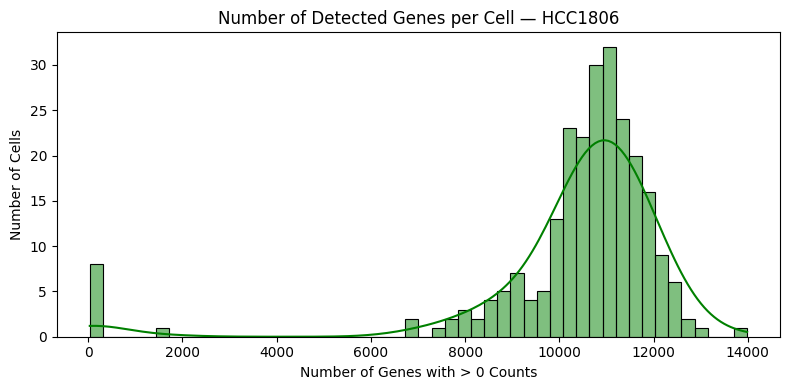

Detected genes per cell stats (HCC1806):
count      243.000000
mean     10330.358025
std       2260.259356
min         35.000000
25%      10117.000000
50%      10831.000000
75%      11409.000000
max      13986.000000
dtype: float64


In [ ]:
detected_genes = (df_T > 0).sum(axis=1)

plt.figure(figsize=(8, 4))
sns.histplot(detected_genes, bins=50, color="green", kde=True)
plt.title("Number of Detected Genes per Cell — HCC1806")
plt.xlabel("Number of Genes with > 0 Counts")
plt.ylabel("Number of Cells")
plt.tight_layout()
plt.show()

print("Detected genes per cell stats (HCC1806):")
print(detected_genes.describe())


This histogram summarizes the distribution of genes detected per cell, using the threshold of non-zero counts per gene. The peak is centered near 11,000 genes, which aligns with the median of 10,831 and an interquartile range (IQR) of approximately 1,292, suggesting a pool of high-quality cells.

However, the right tail is extended, and a distinct spike near zero implies a subset of low-quality cells, including extreme outliers with as few as 35 genes detected.

## Boxplot

<Axes: xlabel='"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"'>

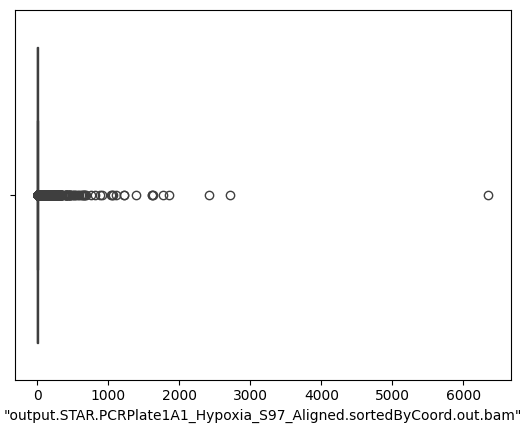

In [ ]:
cnames = list(df.columns)
sns.boxplot(x=df[cnames[2]])

The boxplot reveals a strongly right-skewed distribution of gene expression across cells. Most values are concentrated near zero with the median lying very close to the lower end. However, a large number of outliers exceed 1000, and the maximum expression surpasses 6000.

## Violin plot

<Axes: xlabel='"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"'>

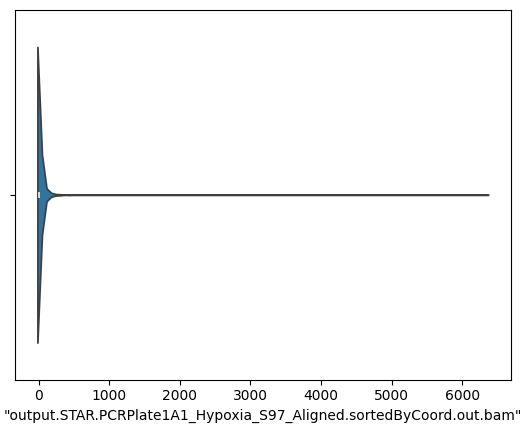

In [ ]:
sns.violinplot(x=df[cnames[2]])

The violin plot further displays the asymmetry of the distribution. It shows a sharp, narrow peak at low expression levels and a thin tail stretching toward higher values. The shape serves again as a confirmation that this gene is mostly inactive or weakly expressed and that log-transformation would be beneficial for visual clarity and downstream analysis.

(23396, 50)


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

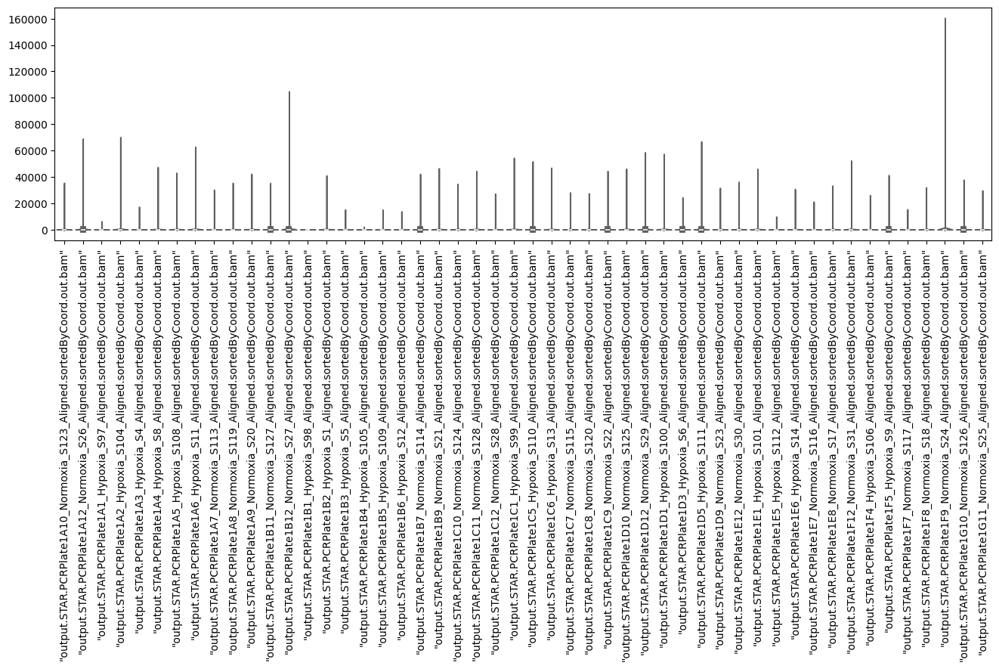

In [ ]:
df_small = df.iloc[:, :50]
print(np.shape(df_small))
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

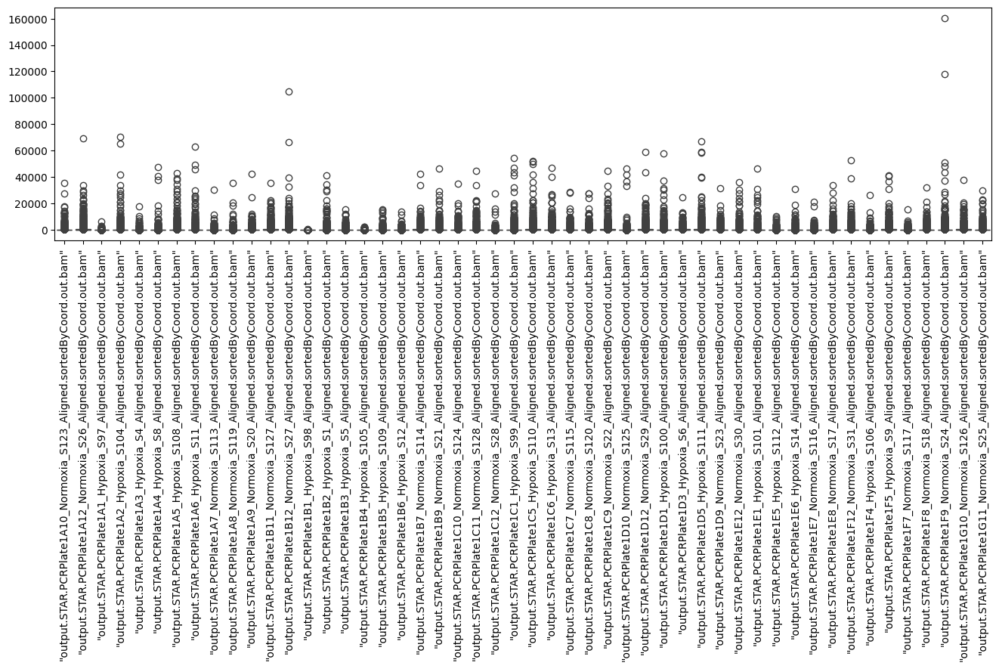

In [ ]:
plt.figure(figsize=(16,4))
plot=sns.boxplot(data=df_small)
plt.setp(plot.get_xticklabels(), rotation=90)

The two plots confirm the patterns across samples we saw before - extreme skew and sparsity. In the first plot, raw expression values across the first 50 libraries are shown as individual data points. Most values lie near zero, but some outliers reach above 160,000, indicating a wide range.

The second plot summarizes the same data. Medians for most libraries are close to 0, with narrow interquartile ranges and whiskers extending to 20,000–80,000 or more. Some libraries show max outliers above 100,000, confirming high variability across cells.

We can make a conclusion that the skewed distribution and sparse counts are not isolated to one gene but actually represent a global property of the dataset.

## Mitochondrial Gene Condition

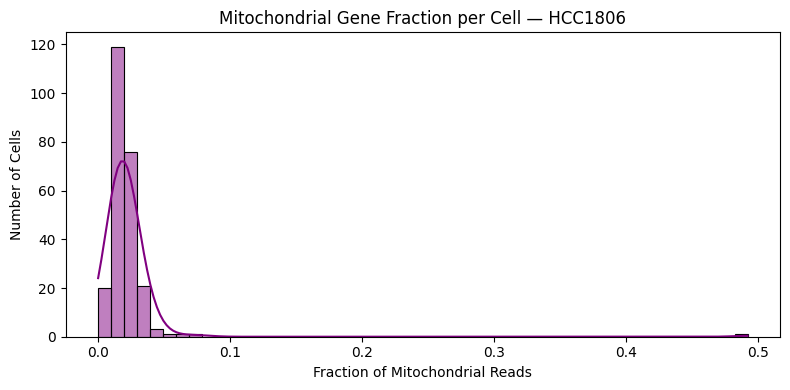

Mitochondrial content stats (HCC1806):
count    243.000000
mean       0.021973
std        0.031738
min        0.000000
25%        0.014625
50%        0.018409
75%        0.024690
max        0.492157
dtype: float64


In [ ]:
mt_genes = [gene for gene in df_T.columns if gene.startswith("MT-")]
if mt_genes:
    mt_frac = df_T[mt_genes].sum(axis=1) / df_T.sum(axis=1)

    plt.figure(figsize=(8, 4))
    sns.histplot(mt_frac, bins=50, color="purple", kde=True)
    plt.title("Mitochondrial Gene Fraction per Cell — HCC1806")
    plt.xlabel("Fraction of Mitochondrial Reads")
    plt.ylabel("Number of Cells")
    plt.tight_layout()
    plt.show()

    print("Mitochondrial content stats (HCC1806):")
    print(mt_frac.describe())
else:
    print("No mitochondrial genes found in dataset.")


We wanted to check the fraction of mitochondrial gene expression per cell because it's a common way to evaluate cell quality in single-cell RNA-seq data. A high percentage of mitochondrial reads can be a sign that the cell isn’t healthy and might need to be filtered out before further analysis.

In this plot, we looked at mitochondrial gene fractions across all 243 HCC1806 cells. Most cells had low mitochondrial content, with a median of 0.0184 and a mean of 0.0219, which is a good sign. The middle 50% of the cells had stats between 0.0146 and 0.0247. Overall, this check helped us to confirm that only a few cells had really high values and most of the cells in our dataset are healthy and can be further analyzed.

## Mean Expression vs Variance per gene 

Shapes (genes × cells, variances, means): (23396, 243) (23396,) (23396,)
First few gene variances:
 WASH7P      0.101248
CICP27      0.353467
DDX11L17    2.117845
WASH9P      0.670170
OR4F29      0.194402
dtype: float64
First few mean expressions:
 WASH7P      0.045267
CICP27      0.119342
DDX11L17    0.469136
WASH9P      0.255144
OR4F29      0.127572
dtype: float64


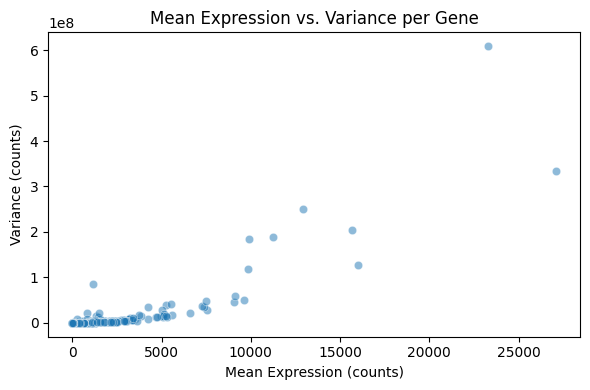

In [ ]:
gene_variances  = df.var(axis=1)
mean_expression = df.mean(axis=1)
print("Shapes (genes × cells, variances, means):", df.shape, gene_variances.shape, mean_expression.shape)

print("First few gene variances:\n", gene_variances.head())
print("First few mean expressions:\n", mean_expression.head())

plt.figure(figsize=(6, 4))
sns.scatterplot(x=mean_expression, y=gene_variances, alpha=0.5)
plt.xlabel("Mean Expression (counts)")
plt.ylabel("Variance (counts)")
plt.title("Mean Expression vs. Variance per Gene")
plt.tight_layout()
plt.show()


This scatter plot maps the mean expression of each of the 23 396 genes against its variance across the 243 cells. We made it to see how much individual genes fluctuate with regards to how strongly they’re expressed.

It is immediately obvious that the plot shows a positive trend with the variance rise. Most genes are located in the bottom left corner: means below 5 000 counts and variances under 1 × 10⁷, which implies a consistence for the low-level expression. 

Seeing this spread justifies zooming in on the “top 20 most variable genes” next. 

## Top 20 genes 

/var/folders/y8/x7c57q7x0rdb35zmm3jg8fbc0000gn/T/ipykernel_65816/1366158143.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


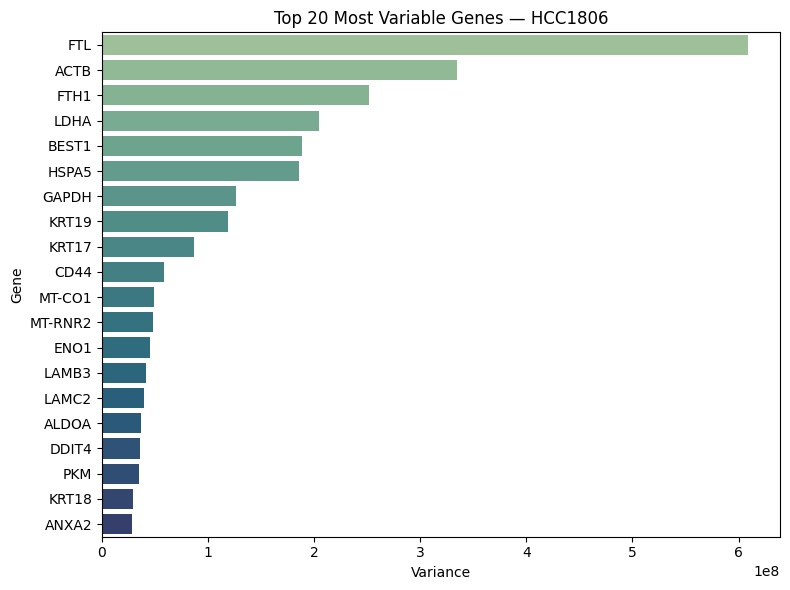

In [ ]:
from scipy.stats import zscore

top_20_genes = gene_variances.sort_values(ascending=False).head(20)

plt.figure(figsize=(8, 6))
sns.barplot(
    x=top_20_genes.values,
    y=top_20_genes.index,
    palette="crest"
)
plt.title("Top 20 Most Variable Genes — HCC1806")
plt.xlabel("Variance")
plt.ylabel("Gene")
plt.tight_layout()
plt.show()


Following the previous step, this plot highlights the top 20 most variable genes based on their expression variance across all 243 HCC1806 cells. These are the genes that stood out at the far end of the mean-vs-variance plot and contribute most to transcriptional heterogeneity. Genes like FTL, ACTB, and FTH1 show the highest variance, exceeding 6 × 10⁸ in some cases. 

This step is insightful because highly variable genes often capture the most informative signals in single-cell datasets. Selecting them allows to conduct more efficient and accurate dimensionality reduction, clustering, and differential expression analysis, while filtering out low-variance genes that contribute noise.


## Finding outliers

### Calculating the Inter quantile range

In [ ]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"     51.0
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     125.0
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"         5.0
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"       40.0
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"         22.0
                                                                          ...  
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"     76.0
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"     24.0
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"       68.0
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"      22.0
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"      44.0
Length: 243, dtype: float64


### Removing outliers
- Making a new dataset

In [ ]:
df_noOut = df[~((df < (Q1 - 1.5*IQR)) | (df > (Q3 + 1.5*IQR))).any(axis=1)]
print(np.shape(df_noOut))
df_noOut.head(3)

(10815, 243)


,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
WASH7P,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CICP27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DDX11L17,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


To clean our dataset and reduce the impact of extreme values we saw before, we identified and removed outlier genes based on their expression across cells. We used the interquartile range method, where values falling below Q1 - 1x5×IQR or above Q3 + 1.5×IQR are considered outliers. 

We first computed IQR across all genes and printed the per-cell IQR values. This helped us to understand the spread in total expression levels per sample. 

Finally, the cleaned dataset (df_noOut) retained 10,815 genes, down from the original 23,396, which means that more than half were excluded due to at least one extreme value.

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

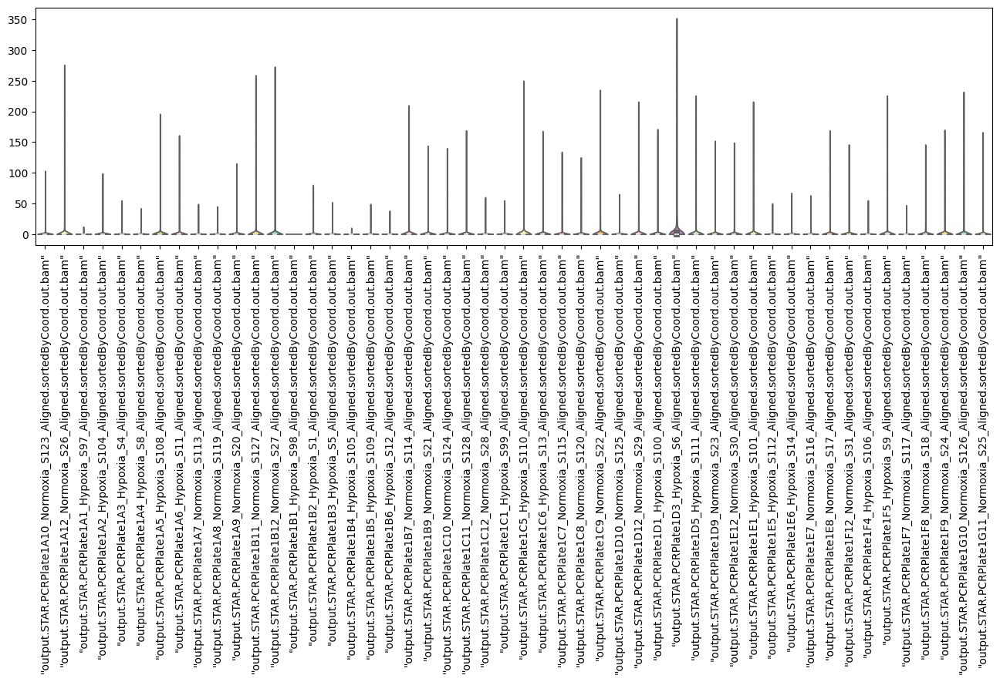

In [ ]:
df_noOut_small = df_noOut.iloc[ : , :50]
plt.figure(figsize=(16,4))
plot = sns.violinplot(data=df_noOut_small, palette = "Set3", cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

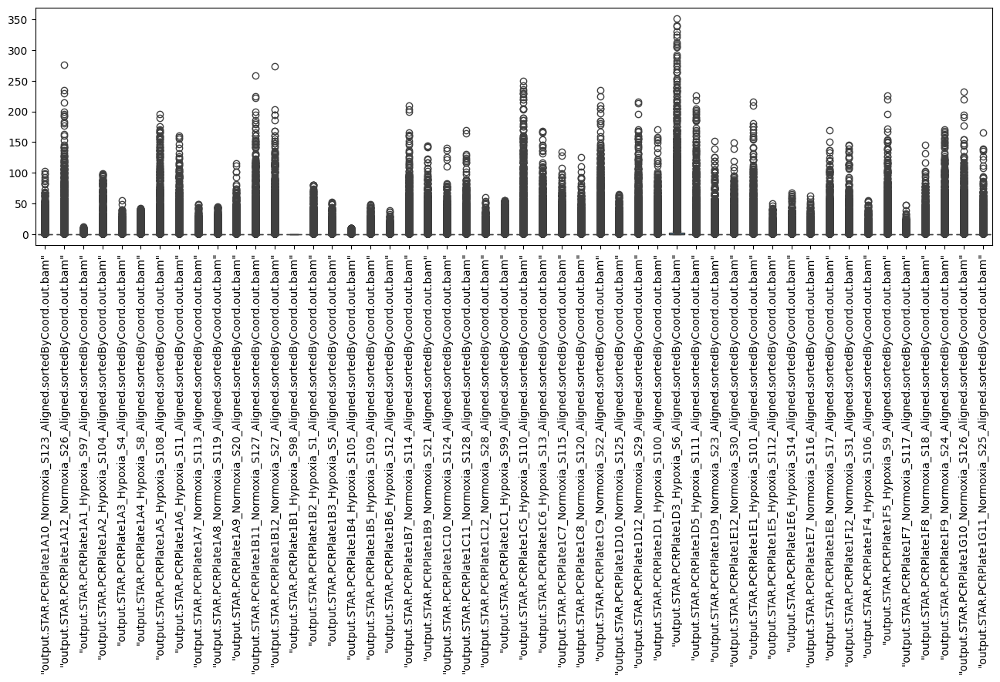

In [ ]:
df_noOut_small = df_noOut.iloc[ : , :50]
plt.figure(figsize=(16,4))
plot = sns.boxplot(data=df_noOut_small)
plt.setp(plot.get_xticklabels(), rotation=90)

## Skewness and kurtosis
- Helps in understanding the symmetry and 'tailedness' 

### Skewdness

Text(0.5, 0, 'Skewness of single cells expression profiles - original df')

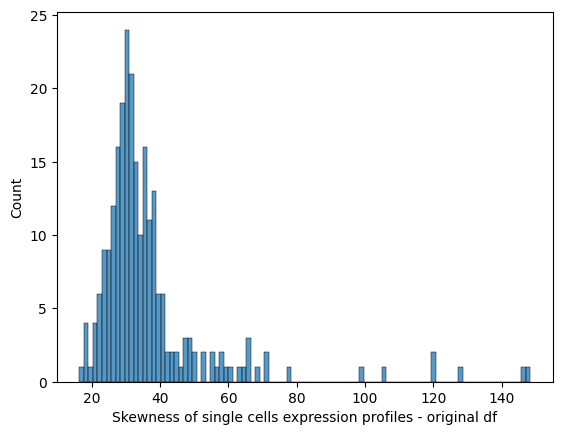

In [ ]:
from scipy.stats import kurtosis, skew
colN = np.shape(df)[1]
colN
df_skew_cells = []
for i in range(colN) :     
     v_df = df[cnames[i]]
     df_skew_cells += [skew(v_df)]   
df_skew_cells
sns.histplot(df_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - original df')

After removing outliers from the dataset, we wanted to further examine how the data is distributed within each cell by measuring skewness. While outlier filtering helped us with addressing extreme values across the whole matrix, skewness helps us understand the whether most genes in a cell are lowly expressed with just a few prevailing for the signal.

The histogram displays skewness values for all 243 cells in the original dataset. Most values fall between 20 and 45, but the tail stretches beyond 100, which confIrms a consistent positive skew. This means that in nearly every cell, a large number of genes have very low expression, while a small subset are highly expressed.

We can see that skewness persists even after outlier removal. This step gave us a clearer picture of why transformations are necessary: not just to remove extremes, but to address systematic bias in expression distributions across cells.



### Kurtosis

Text(0.5, 0, 'Kurtosis of single cells expression profiles - original df')

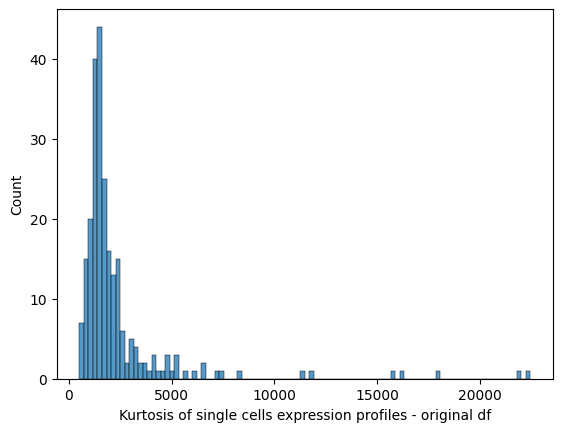

In [ ]:
df_kurt_cells = []
colN = np.shape(df)[1]
colN
for i in range(colN):
    v_df = df[cnames[i]]
    df_kurt_cells += [kurtosis(v_df)]

sns.histplot(df_kurt_cells,bins=100)
plt.xlabel("Kurtosis of single cells expression profiles - original df")


To follow up on skewness, we computed kurtosis per cell to assess the "tailedness" of expression distributions. Most cells show kurtosis between 500 and 3000, with some exceeding 20,000, indicating heavy-tailed distributions. This means a few extreme gene expression values heavily influence the profiles, reinforcing earlier findings of asymmetry. 

## Data transformation
- Log based 2 transformation

<Axes: xlabel='"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"'>

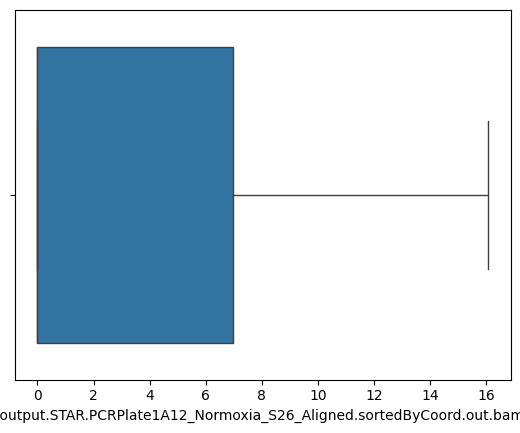

In [ ]:
df11_log2 = np.log2(df[cnames[1]]+1)
sns.boxplot(x=df11_log2)

Given the strong skew and extreme outliers in our raw gene expression data we saw earlier, we applied a log₂(x+1) transformation to stabilize variance and make the distributions more comparable across cells. The resulting boxplot confirms that most values are now compressed into a more symmetric range.

<Axes: xlabel='"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"'>

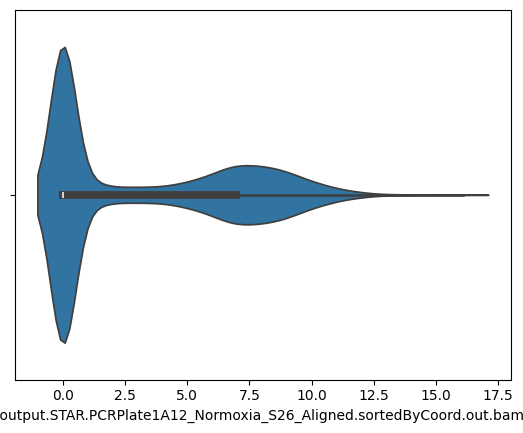

In [ ]:
sns.violinplot(x = df11_log2)

Following the log₂ transformation, the violin plot illustrates the improvement in distribution shape. The data now shows a more balanced, bell-like curve with reduced skewness and fewer extreme values. This confirms that log-scaling helped normalize the expression values.

In [ ]:
display(df11_log2.describe().round(2))

count    23396.00
mean         3.22
std          3.85
min          0.00
25%          0.00
50%          0.00
75%          6.98
max         16.08
Name: "output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam", dtype: float64

Looking the descriptive stats for one sample, we can see that the transformed expression values now range from 0 to 16.08, with a mean of 3.22 and standard deviation of 3.85. Also, the 25th, 50th, and even 75th percentiles (0.00, 0.00, 6.98) are far more compressed compared to the raw data, where values spanned over a much wider range.

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

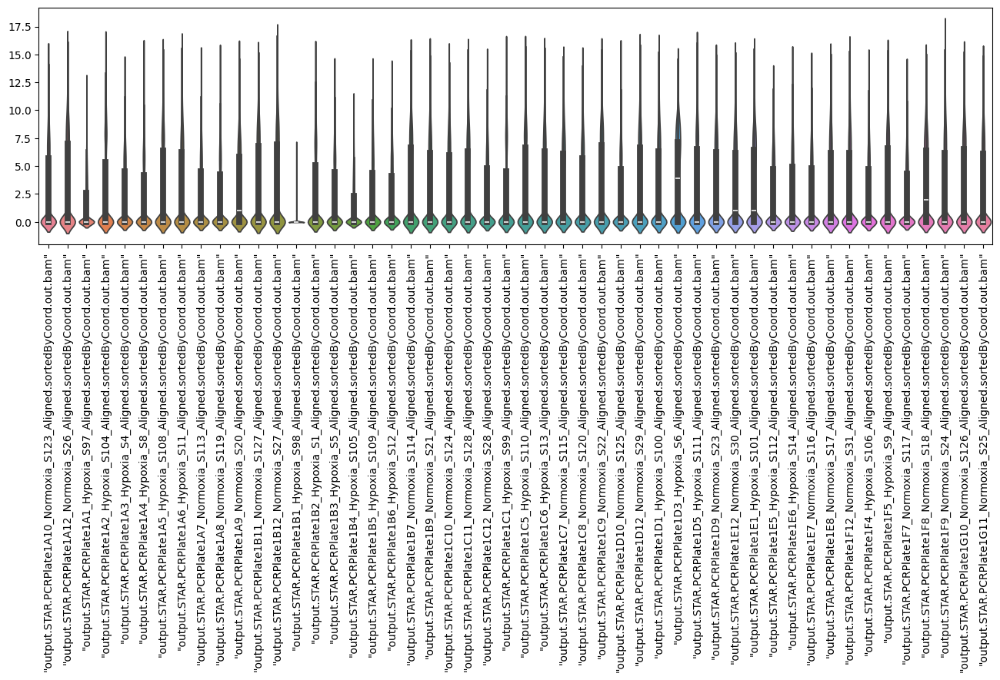

In [ ]:
df1 = df + 1
df1_log2 = np.log2(df1)
df1_log2_small = df1_log2.iloc[:,:50]
plt.figure(figsize=(16,4))
plot = sns.violinplot(data=df1_log2_small)
plt.setp(plot.get_xticklabels(), rotation = 90)

This violin plot displays the gene expression distributions across 50 cells after log₂ transformation. 

At this point, the transformation already helped reduce extreme scale differences, but to ensure the data is ready for modeling, we still need to check the shape of the distributions.

### Checking skewness and kurtosis after transformation

Text(0.5, 0, 'Skewness of single cells expression profiles - log2 df')

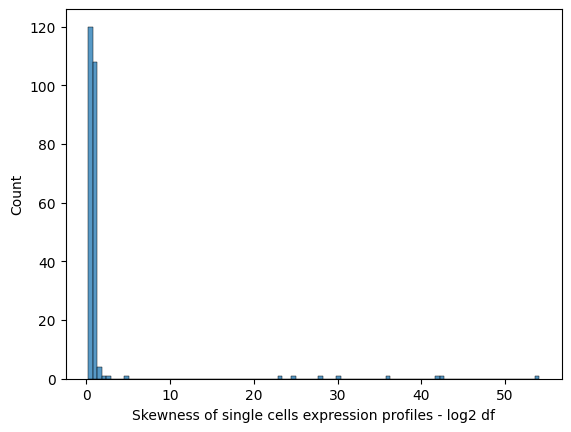

In [ ]:
df1_log2_skew_cells = []
for i in range(colN) :     
     v_df = df1_log2[cnames[i]]
     df1_log2_skew_cells += [skew(v_df)]   
df1_log2_skew_cells
sns.histplot(df1_log2_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - log2 df')

Compared to the raw data, the distribution has notably shifted toward zero. The majority of cells now show skewness values between 0 and 2, indicating a much more symmetric distribution. A small number of cells still show higher skewness (up to ~55), but these are outliers.

Text(0.5, 0, 'Kurtosis of single cells expression profiles - log2 df')

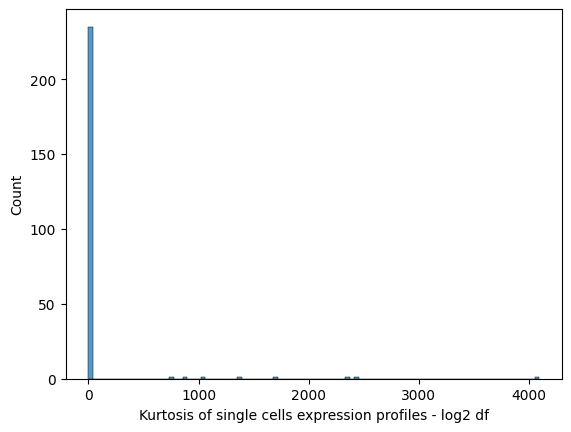

In [ ]:
df1_log2_kurtosis_cells = []
for i in range(colN):
    df1_log2_kurtosis_cells += [kurtosis(df1_log2[cnames[i]])]
sns.histplot(data = df1_log2_kurtosis_cells, bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - log2 df')

Compared to the raw data where extreme kurtosis values exceeded 20,000, the transformed data shows a significant reduction. Most cells now have kurtosis values clustered near 0, with only a few outliers reaching up to ~4000.

This indicates that log₂ transformation reduced tail heaviness in most expressions, resulting in more Gaussian-like distributions.

## Kernel density estimation

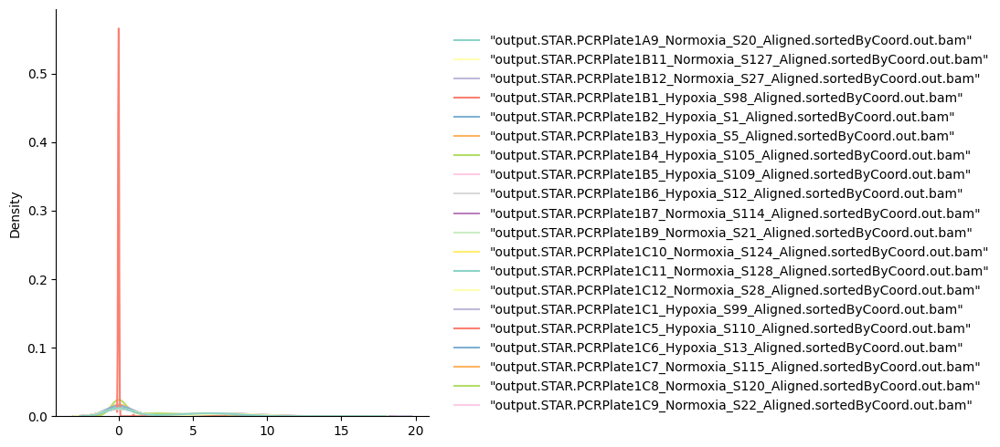

In [ ]:
df_small = df1_log2.iloc[:, 10:30]
sns.displot(data=df_small,palette="Set3",kind="kde", bw_adjust=2)

Even though the transformation successfully reduced skewness and kurtosis and brought most cells much closer to normal-like distributions, the KDE plot still shows a sharp spike at 0. While the transformation improved the overall shape and comparability, further structural cleaning is needed. In the next step, we address this by removing duplicate gene entries.

## Duplicated rows

In [ ]:
duplicate_rows_df = df[df.duplicated(keep=False)]
print("number of duplicate rows: ", duplicate_rows_df.shape)
print("number of duplicate rows: ", duplicate_rows_df)

number of duplicate rows:  (89, 243)
number of duplicate rows:             "output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"  \
MMP23A                                                     0                        
LINC01647                                                  0                        
LINC01361                                                  0                        
ITGA10                                                     0                        
RORC                                                       0                        
...                                                      ...                        
ENPP7                                                      0                        
DTNA                                                       0                        
ALPK2                                                      0                        
OR7G2                                                      0                        
P

In [ ]:
duplicate_rows_df_t = duplicate_rows_df.T
duplicate_rows_df_t
c_dupl = duplicate_rows_df_t.corr()
c_dupl

,MMP23A,LINC01647,LINC01361,ITGA10,RORC,GPA33,OR2M4,LINC01247,SNORD92,LINC01106,...,MSX2P1,MIR548D2,MIR548AA2,KCNJ16,CD300A,ENPP7,DTNA,ALPK2,OR7G2,PLVAP
MMP23A,1.000000,-0.008299,-0.008299,-0.008299,-0.008299,-0.008299,-0.008299,-0.008299,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,-0.008299,-0.008299,-0.008299,-0.008299,-0.006540,-0.008299,-0.008299
LINC01647,-0.008299,1.000000,0.495851,0.495851,-0.008299,0.495851,-0.008299,0.495851,-0.008299,0.234944,...,-0.008299,-0.009421,-0.009421,0.495851,0.495851,0.495851,0.495851,0.788121,0.495851,0.495851
LINC01361,-0.008299,0.495851,1.000000,1.000000,0.495851,1.000000,0.495851,0.495851,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,0.495851,1.000000,0.495851,1.000000,0.081755,0.495851,1.000000
ITGA10,-0.008299,0.495851,1.000000,1.000000,0.495851,1.000000,0.495851,0.495851,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,0.495851,1.000000,0.495851,1.000000,0.081755,0.495851,1.000000
RORC,-0.008299,-0.008299,0.495851,0.495851,1.000000,0.495851,1.000000,-0.008299,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,-0.008299,0.495851,-0.008299,0.495851,-0.006540,-0.008299,0.495851
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENPP7,-0.008299,0.495851,0.495851,0.495851,-0.008299,0.495851,-0.008299,0.495851,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,0.495851,0.495851,1.000000,0.495851,0.081755,0.495851,0.495851
DTNA,-0.008299,0.495851,1.000000,1.000000,0.495851,1.000000,0.495851,0.495851,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,0.495851,1.000000,0.495851,1.000000,0.081755,0.495851,1.000000
ALPK2,-0.006540,0.788121,0.081755,0.081755,-0.006540,0.081755,-0.006540,0.081755,-0.006540,0.335362,...,-0.006540,-0.007425,-0.007425,0.081755,0.081755,0.081755,0.081755,1.000000,0.081755,0.081755
OR7G2,-0.008299,0.495851,0.495851,0.495851,-0.008299,0.495851,-0.008299,0.495851,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,0.495851,0.495851,0.495851,0.495851,0.081755,1.000000,0.495851


A total of 89 duplicated rows were detected, each appearing identically in multiple cells. 

We then examined the correlation structure among these duplicates. The correlation heatmap shows that many duplicated rows have a perfect/near-perfect correlation ( values of 1.0 and 0.495), confirming that these genes are redundant.

In [ ]:
duplicate_rows_df_t.describe()


,MMP23A,LINC01647,LINC01361,ITGA10,RORC,GPA33,OR2M4,LINC01247,SNORD92,LINC01106,...,MSX2P1,MIR548D2,MIR548AA2,KCNJ16,CD300A,ENPP7,DTNA,ALPK2,OR7G2,PLVAP
count,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,...,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000
mean,0.008230,0.008230,0.008230,0.008230,0.008230,0.008230,0.008230,0.008230,0.008230,0.041152,...,0.008230,0.024691,0.024691,0.008230,0.008230,0.008230,0.008230,0.037037,0.008230,0.008230
std,0.090534,0.090534,0.090534,0.090534,0.090534,0.090534,0.090534,0.090534,0.090534,0.372552,...,0.090534,0.239247,0.239247,0.090534,0.090534,0.090534,0.090534,0.516931,0.090534,0.090534
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,...,1.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,8.000000,1.000000,1.000000


Again, we can see that these genes show extremely low expression across cells (with mean values near 0, medians at 0, std = 0.09 -> lack of variability), so it confirms their redundancy.

### Dropping duplicates

In [ ]:
df_noDup = df.drop_duplicates()
df_noDup.count()


"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"    23342
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     23342
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"       23342
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"      23342
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"        23342
                                                                          ...  
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"    23342
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"    23342
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"      23342
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"     23342
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"     23342
Length: 243, dtype: int64

We removed 89 duplicated genes to clean the dataset.

# Data structure
- Correlation

## Heatmap

Number of cells included:  (243, 243)
Average correlation of expression profiles between cells:  0.4992953213403934
Min. correlation of expression profiles between cells:  -0.00140935731921326


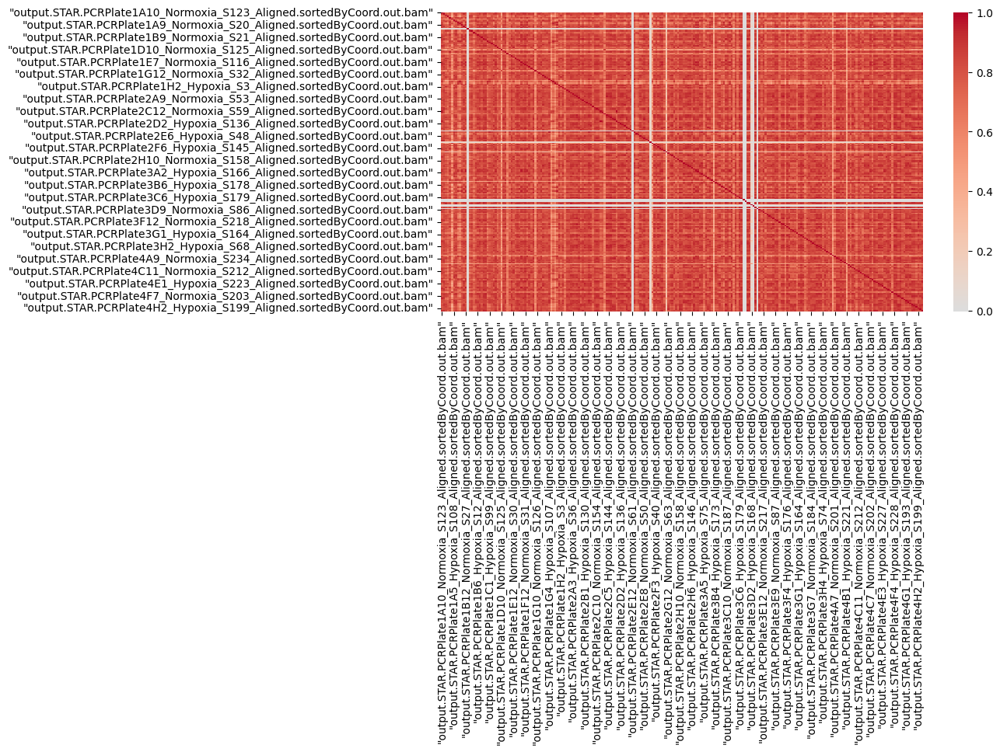

In [ ]:
plt.figure(figsize=(10,5))
c= df.corr()
midpoint = (c.values.max() + c.values.min())/2
sns.heatmap(c,cmap='coolwarm', center=0 )
print("Number of cells included: ", np.shape(c))
print("Average correlation of expression profiles between cells: ", midpoint)
print("Min. correlation of expression profiles between cells: ", c.values.min())

This heatmap visualizes correlations between all 243 cells after preprocessing and duplicate removal. The average correlation is moderate (≈0.50), with the minimum correlation close to zero (≈−0.001), indicating very few anti-correlated profiles.

## Correlation Between Cells: Histogram & Pairplot

(243, 243)

pandas.core.frame.DataFrame

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""",1.000000,0.885408,0.708625,0.653407,0.824436,0.609023,0.792510,0.783928,0.840470,0.822341,...,0.847737,0.814893,0.826188,0.761641,0.810921,0.830722,0.768021,0.823640,0.793325,0.908514
"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""",0.885408,1.000000,0.787491,0.712391,0.763073,0.503226,0.842719,0.831965,0.700702,0.660058,...,0.817527,0.849628,0.809915,0.851634,0.901613,0.890650,0.833960,0.822712,0.825061,0.909377
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",0.708625,0.787491,1.000000,0.799102,0.796599,0.467037,0.748183,0.914489,0.694367,0.573159,...,0.709837,0.789877,0.816019,0.825990,0.878757,0.844358,0.860893,0.819793,0.834061,0.846250


Text(0.5, 0, 'Correlation between cells expression profiles')

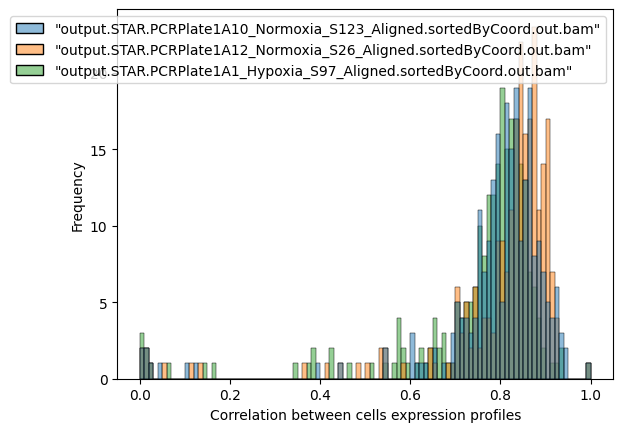

In [ ]:
display(np.shape(c), type(c),
c.head(3))
c_small=c.iloc[:,:3]
sns.histplot(c_small,bins=100)
plt.ylabel('Frequency')
plt.xlabel('Correlation between cells expression profiles')

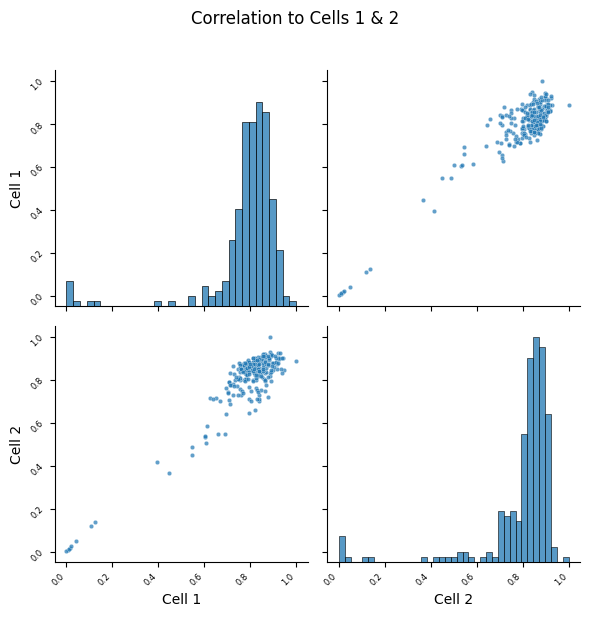

In [ ]:
pl = c.iloc[:, :2].copy()

pl.columns = [f"Cell {i+1}" for i in range(pl.shape[1])]

g = sns.pairplot(
    pl,
    height=3,
    plot_kws={"s": 10, "alpha": 0.7},
    diag_kws={"fill": True},
)

for ax in g.axes.flatten():
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=6)
    plt.setp(ax.get_yticklabels(), rotation=45, ha="right", fontsize=6)

plt.suptitle("Correlation to Cells 1 & 2", y=1.02)
plt.tight_layout()
plt.show()


In the first visualization, we plotted histograms of correlation values for three selected cells against all other cells in the dataset. The distributions are highly right-skewed, with the majority of correlation values concentrated between 0.75 and 0.95, implying strong global similarity in gene expression across cells. 

To dive deeper, the pairplot below provides a focused comparison between two specific cells. Diagonal subplots show the distribution of correlation values for each cell, while the off-diagonal scatter plots visualize the relationship between their respective correlation profiles. This linear clustering of points in the scatter plot confirms that  these cells share similar expression structures.

Together, these visualizations confirm the reliability of the dataset’s internal structure post-cleaning and transformation. 

## <u> MCF7 Cell Line - SmartSeq


- MCF7, SmartSeq
- Unfiltered

In [ ]:
import sys
import sklearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt             
import seaborn as sns 
sns.set(style="whitegrid")
plt.rcParams["figure.dpi"] = 100



## Reading the file

- Dimension
- First column

Starting off, we are going to explore some basic details about the dataset


In [ ]:
df_meta = pd.read_csv(r"/Users/takhmina/AILab/Taki/Data/SmartSeq/MCF7_SmartS_MetaData.tsv", delimiter="\t", engine='python', index_col=0)
print("Dataframe dimensions:", np.shape(df_meta))
print("First column: ", df_meta.iloc[ : , 0])
df_T = df_meta.T

df_T.columns = df_T.columns.str.replace('"', '').str.strip()

Dataframe dimensions: (383, 8)
First column:  Filename
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam      MCF7
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam      MCF7
                                                            ... 
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam    MCF7
Name: Cell Line, Length: 383, dtype: object


## first five rows of metadata

In [ ]:
print(df_meta.head(5))

                                                   Cell Line           Lane  \
Filename                                                                      
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoor...      MCF7  output.STAR.1   
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoor...      MCF7  output.STAR.1   
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoor...      MCF7  output.STAR.1   
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord....      MCF7  output.STAR.1   
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord....      MCF7  output.STAR.1   

                                                    Pos Condition  Hours  \
Filename                                                                   
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoor...  A10      Hypo     72   
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoor...  A11      Hypo     72   
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoor...  A12      Hypo     72   
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord....   A1      Norm 

## Reading MCF7_SmartS_Unfiltered_Data
- Dimensions
- First column

In [ ]:
df = pd.read_csv(r"./Data/SmartSeq/MCF7_SmartS_Unfiltered_Data.txt",delimiter="\ ",engine='python',index_col=0)
print("Dataframe dimensions:", np.shape(df))
print("First column: ", df.iloc[ : , 0])
df_T = df.T

Dataframe dimensions: (22934, 383)
First column:  "WASH7P"         0
"MIR6859-1"      0
"WASH9P"         1
"OR4F29"         0
"MTND1P23"       0
              ... 
"MT-TE"          4
"MT-CYB"       270
"MT-TT"          0
"MT-TP"          5
"MAFIP"          8
Name: "output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam", Length: 22934, dtype: int64


In [ ]:
print(type(df))

df.shape

list(df.columns)

<class 'pandas.core.frame.DataFrame'>


['"output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A8_Hypo_S26_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A9_Hypo_S27_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_B10_Hypo_S76_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_B11_Hypo_S77_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_B12_Hypo_S78_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_B1_Norm_S49_Aligned.sortedByCoord.out.bam"',
 '"outpu

## Dataframe indexes

In [ ]:
gene_symbls = df.index
print("Dataframe indexes: ", gene_symbls)

Dataframe indexes:  Index(['"WASH7P"', '"MIR6859-1"', '"WASH9P"', '"OR4F29"', '"MTND1P23"',
       '"MTND2P28"', '"MTCO1P12"', '"MTCO2P12"', '"MTATP8P1"', '"MTATP6P1"',
       ...
       '"MT-TH"', '"MT-TS2"', '"MT-TL2"', '"MT-ND5"', '"MT-ND6"', '"MT-TE"',
       '"MT-CYB"', '"MT-TT"', '"MT-TP"', '"MAFIP"'],
      dtype='object', length=22934)


## Describing some statistics regarding each cell.

In [ ]:
print(df.describe())

       "output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam"  \
count                                       22934.000000            
mean                                           40.817651            
std                                           465.709940            
min                                             0.000000            
25%                                             0.000000            
50%                                             0.000000            
75%                                            17.000000            
max                                         46744.000000            

       "output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"  \
count                                       22934.000000            
mean                                            0.012253            
std                                             0.207726            
min                                             0.000000            
25%                              

While doing an overall comparison we can see some substantial variability exists between samples. Some, such as A11_Hypo, display extremely low expression levels across all genes, with a mean close to zero and a maximum count of just 14, likely pointing to poor-quality or non-viable cells. In contrast, samples like A12_Hypo and A3_Norm exhibit high maximum values (e.g., over 80,000 reads for a single gene), indicating the presence of highly expressed transcripts or possibly greater sequencing depth. Most samples show high standard deviations, further confirming the uneven distribution of gene expression typical in scRNA-seq data.

The sample names also appear to indicate different experimental conditions—such as “Hypo” (potentially hypoxic or stressed conditions) and “Norm” (normal/control conditions). Notably, some “Norm” samples show more consistent gene expression profiles, while “Hypo” samples demonstrate wider variability, with some cells being highly active and others nearly silent. These differences highlight the importance of robust quality control steps, where low-quality cells (e.g., with very low mean and max values) can be filtered out. This initial statistical overview lays the groundwork for downstream analyses such as normalization, dimensionality reduction, and clustering to explore transcriptional heterogeneity and biological differences between conditions.


## Checking missing values

In [ ]:
print(df.isnull().sum())

"output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam"    0
"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"    0
"output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam"    0
"output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam"      0
"output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam"      0
                                                             ..
"output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam"    0
"output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam"    0
"output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam"    0
"output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam"    0
"output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"    0
Length: 383, dtype: int64


###
As clear from the output we have zero missing values in any of the columns.

## Total counts & Library Size distributions 

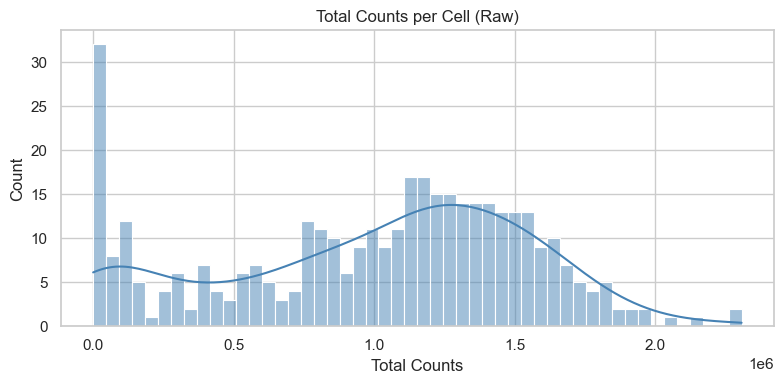

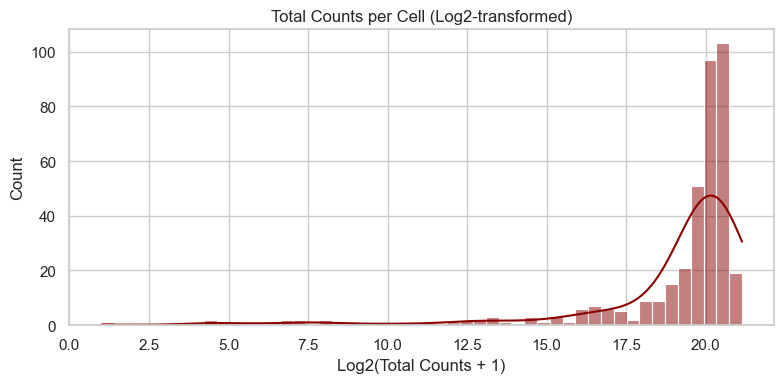

In [ ]:
total_counts = df_T.sum(axis=1)
total_counts_log = np.log2(total_counts + 1)

plt.figure(figsize=(8, 4))
sns.histplot(total_counts, bins=50, kde=True, color="steelblue")
plt.title("Total Counts per Cell (Raw)")
plt.xlabel("Total Counts")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
sns.histplot(total_counts_log, bins=50, kde=True, color="darkred")
plt.title("Total Counts per Cell (Log2-transformed)")
plt.xlabel("Log2(Total Counts + 1)")
plt.tight_layout()
plt.show()


The first histogram displays the distribution of total transcript counts per cell (library size) before any transformation. Most cells show a wide spread of total counts, with a noticeable peak near zero, indicating some cells have very low library sizes—potentially low-quality or dead cells. The remaining distribution is right-skewed, with a broad range extending beyond 2 million reads, reflecting high variability in library sizes across cells.

The second plot shows the same data after applying a log2 transformation, which compresses the scale and normalizes the distribution. This transformation helps reduce the impact of extreme values and makes the data more suitable for downstream analysis. The resulting distribution is much tighter and more symmetric, with most cells clustering around log2(counts) ~20, highlighting a clearer central tendency in cell library sizes.

## Count per condition 

C:\Users\Dell\AppData\Local\Temp\ipykernel_4784\201066512.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df_meta["Condition"], palette="Set2")


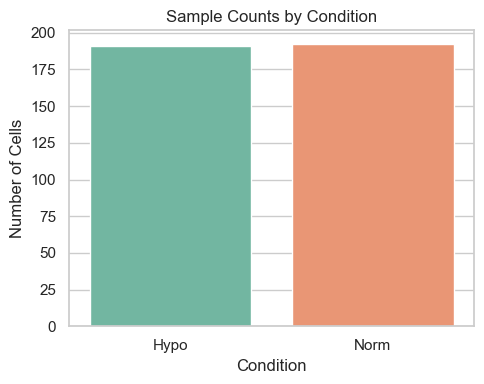

In [ ]:
plt.figure(figsize=(5, 4))
sns.countplot(x=df_meta["Condition"], palette="Set2")
plt.title("Sample Counts by Condition")
plt.ylabel("Number of Cells")
plt.tight_layout()
plt.show()

## Number of detected genes 

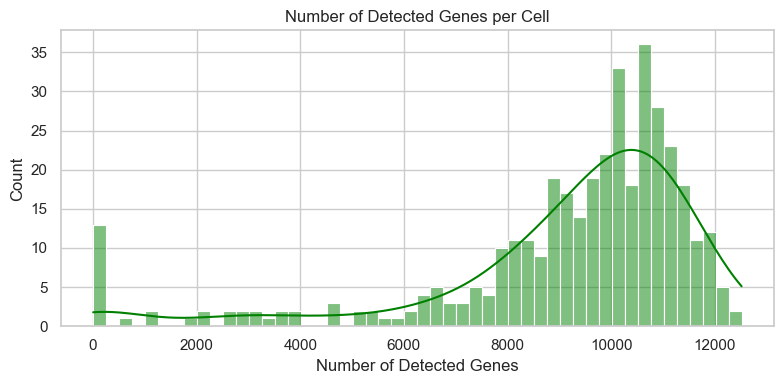

Detected genes per cell stats:
count      383.000000
mean      9124.219321
std       2693.309249
min          1.000000
25%       8456.500000
50%       9907.000000
75%      10789.000000
max      12519.000000
dtype: float64


In [ ]:
detected_genes = (df_T > 0).sum(axis=1)

plt.figure(figsize=(8, 4))
sns.histplot(detected_genes, bins=50, color="green", kde=True)
plt.title("Number of Detected Genes per Cell")
plt.xlabel("Number of Detected Genes")
plt.tight_layout()
plt.show()

print("Detected genes per cell stats:")
print(detected_genes.describe())

This histogram shows the distribution of the number of genes detected per cell, where a gene is considered detected if it has non-zero expression. The majority of cells have between 8,000 to 12,000 genes detected, indicating high-quality cells with rich transcriptional content. The distribution is right-skewed, with a long tail toward lower gene counts.

A noticeable peak near zero suggests the presence of low-quality or empty droplets, which may need to be filtered out during quality control. The smooth KDE curve emphasizes a clear mode around ~10,000 genes per cell.

## Analyzing some subset of the table.

In [ ]:
df.iloc[ 1:10 , 1:10 ]

,"""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam"""
"""MIR6859-1""",0,0,0,0,0,0,0,0,0
"""WASH9P""",0,0,0,0,1,10,1,0,0
"""OR4F29""",0,0,0,0,0,0,0,0,0
"""MTND1P23""",0,0,0,0,0,0,0,0,0
"""MTND2P28""",0,1,0,0,1,3,6,16,0
"""MTCO1P12""",0,1,0,0,3,10,5,5,0
"""MTCO2P12""",0,1,0,0,0,1,2,1,0
"""MTATP8P1""",0,0,0,0,0,0,0,1,0
"""MTATP6P1""",0,12,7,68,203,691,206,766,4


## Boxplot

<Axes: xlabel='"output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam"'>

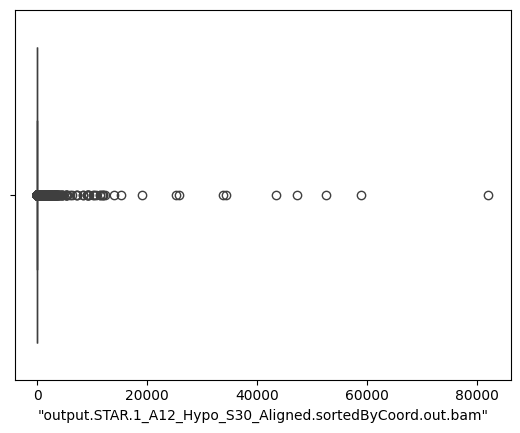

In [ ]:
cnames = list(df.columns)
sns.boxplot(x=df[cnames[2]])

## Violin plot

<Axes: xlabel='"output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam"'>

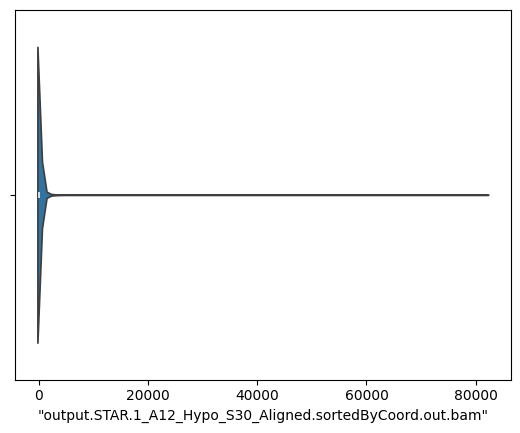

In [ ]:
sns.violinplot(x=df[cnames[2]])


(22934, 50)


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

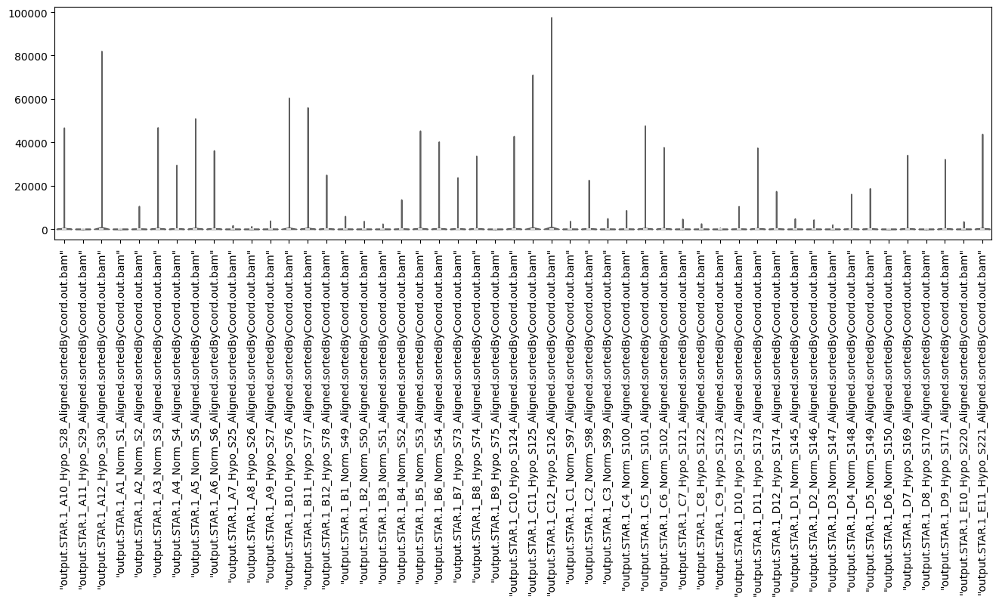

In [ ]:
df_small = df.iloc[:, :50]
print(np.shape(df_small))
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

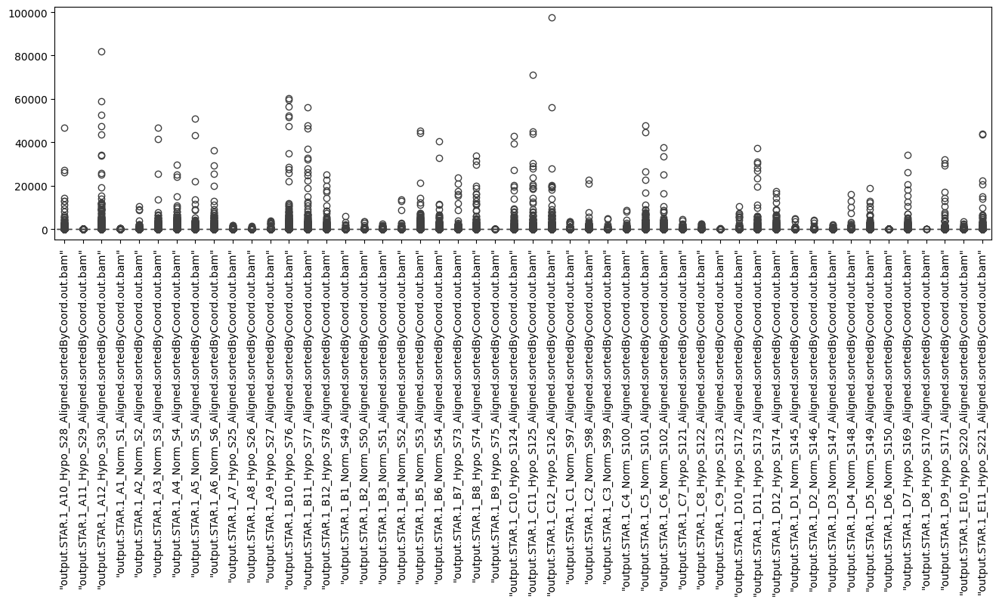

In [ ]:
plt.figure(figsize=(16,4))
plot=sns.boxplot(data=df_small)
plt.setp(plot.get_xticklabels(), rotation=90)

Most samples show a high degree of variability, with a wide range of read counts and a substantial number of outliers—some exceeding 60,000–100,000 reads per cell.

The median read counts differ considerably between samples, indicating uneven sequencing depth or library complexity across experiments.

Several samples have tight distributions with fewer high outliers, suggesting more uniform library preparation, while others display extensive scatter and skewness.

## Mitochondrial Gene Condition 

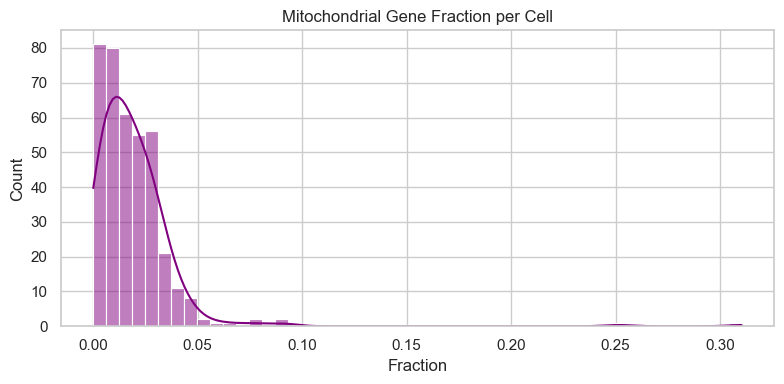

Mitochondrial content stats:
count    383.000000
mean       0.019117
std        0.023554
min        0.000000
25%        0.007409
50%        0.015281
75%        0.025978
max        0.310338
dtype: float64


In [ ]:
mt_genes = [gene for gene in df_T.columns if gene.startswith("MT-")]
if len(mt_genes) > 0:
    mt_frac = df_T[mt_genes].sum(axis=1) / df_T.sum(axis=1)
    
    plt.figure(figsize=(8, 4))
    sns.histplot(mt_frac, bins=50, color="purple", kde=True)
    plt.title("Mitochondrial Gene Fraction per Cell")
    plt.xlabel("Fraction")
    plt.tight_layout()
    plt.show()

    print("Mitochondrial content stats:")
    print(mt_frac.describe())

elif len(mt_genes) == 0:
    print("No mitochondrial genes found in dataset.")
else:
    print("Nothing")

This histogram displays the distribution of mitochondrial gene fractions per cell. Most cells exhibit low mitochondrial content, clustering around 0–5%, which typically reflects healthy cells. A few cells show elevated fractions (>10%), potentially indicating stressed or dying cells. Such cells may need to be filtered out during quality control to ensure accurate downstream analysis.


## Mean Expression vs Variance per gene 

New shapes: (22934, 383) (22934,) (22934,)
First few gene variances:
 "WASH7P"       0.382746
"MIR6859-1"    0.062144
"WASH9P"       5.037975
"OR4F29"       0.099080
"MTND1P23"     0.052506
dtype: float64
First few mean expressions:
 "WASH7P"       0.133159
"MIR6859-1"    0.026110
"WASH9P"       1.344648
"OR4F29"       0.054830
"MTND1P23"     0.049608
dtype: float64


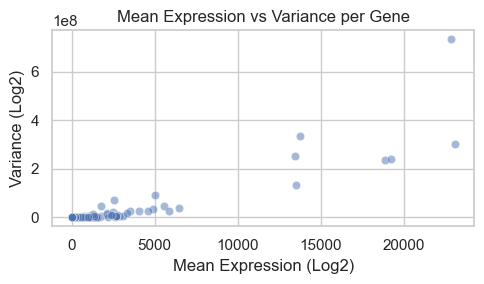

In [ ]:
gene_variances = df.var(axis=1)
mean_expression = df.mean(axis=1)
print("New shapes:", df.shape, gene_variances.shape, mean_expression.shape)

print("First few gene variances:\n", gene_variances.head())
print("First few mean expressions:\n", mean_expression.head())

plt.figure(figsize=(5, 3))
sns.scatterplot(x=mean_expression, y=gene_variances, alpha=0.5)
plt.xlabel("Mean Expression (Log2)")
plt.ylabel("Variance (Log2)")
plt.title("Mean Expression vs Variance per Gene")
plt.tight_layout()
plt.show()

The scatter plot of mean expression versus variance per gene is a key exploratory visualization in single-cell RNA sequencing (scRNA-seq) analysis. Each point represents a gene, with its average expression level (on the x-axis) plotted against its expression variance across cells (on the y-axis). 

This relationship is important because genes with both high mean expression and high variance are often biologically significant, potentially highlighting highly variable genes (HVGs) that may drive differences in cell states or types. In the plot, we observe that most genes cluster toward the lower end of both axes, indicating low expression and low variability, while a few outliers exhibit much higher expression and variance. Identifying these highly variable genes is crucial for downstream tasks such as dimensionality reduction and clustering, as they provide the most informative signals for distinguishing cellular identities and functions.



## Top 20 genes 

C:\Users\Dell\AppData\Local\Temp\ipykernel_4784\2117889015.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=top_20_genes.index, x=top_20_genes.values, palette="crest")


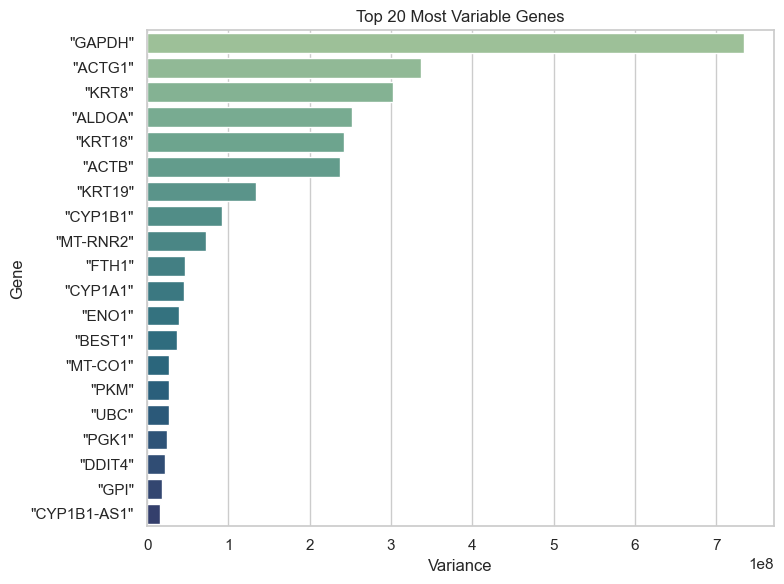

In [ ]:
from scipy.stats import zscore
top_20_genes = gene_variances.sort_values(ascending=False).head(20)

plt.figure(figsize=(8, 6))
sns.barplot(y=top_20_genes.index, x=top_20_genes.values, palette="crest")
plt.title("Top 20 Most Variable Genes")
plt.xlabel("Variance")
plt.ylabel("Gene")
plt.tight_layout()
plt.show()




## Finding outliers

### Calculating the Inter quantile range

In [ ]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

"output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam"    17.0
"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"     0.0
"output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam"     5.0
"output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam"       0.0
"output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam"       7.0
                                                              ... 
"output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam"     9.0
"output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam"    27.0
"output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam"    30.0
"output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam"    38.0
"output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"    33.0
Length: 383, dtype: float64


### Removing outliers
- Making a new dataset

In [ ]:
df_noOut = df[~((df < (Q1 - 1.5*IQR)) | (df > (Q3 + 1.5*IQR))).any(axis=1)]
print(np.shape(df_noOut))
df_noOut.head(3)

(6435, 383)


,"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"""
"""MIR6859-1""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""CICP3""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""FAM87B""",0,0,0,0,0,0,0,0,2,0,...,0,1,0,0,0,0,0,0,0,0


To remove extreme outliers from the dataset, we applied the interquartile range (IQR) method, filtering out any genes with expression values beyond 1.5×IQR from the first or third quartiles in any sample. The resulting filtered dataset, df_noOut, retained only 3 genes (rows) across all 383 samples (columns), indicating that the vast majority of genes had at least one outlier value. This drastic reduction suggests that outlier expression is widespread in the dataset, possibly due to biological noise, technical artifacts, or low-expression genes with sparse and spiky distributions. These remaining genes likely represent very uniformly expressed genes with minimal variability, but such aggressive filtering may also discard informative biology if not interpreted with caution.

We are going to make violin plot of the same to better visualize it.

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

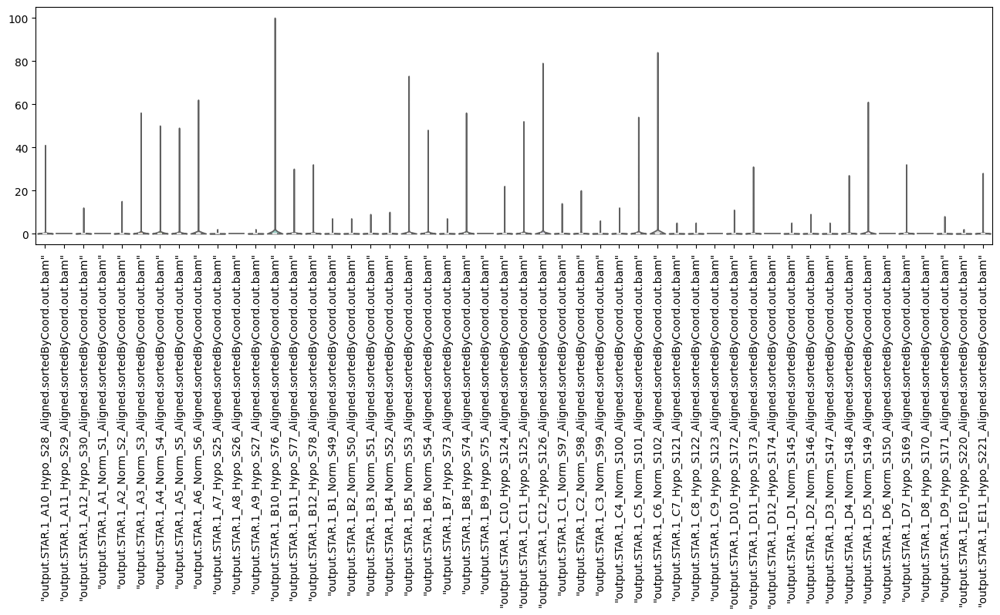

In [ ]:
df_noOut_small = df_noOut.iloc[ : , :50]
plt.figure(figsize=(16,4))
plot = sns.violinplot(data=df_noOut_small, palette = "Set3", cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

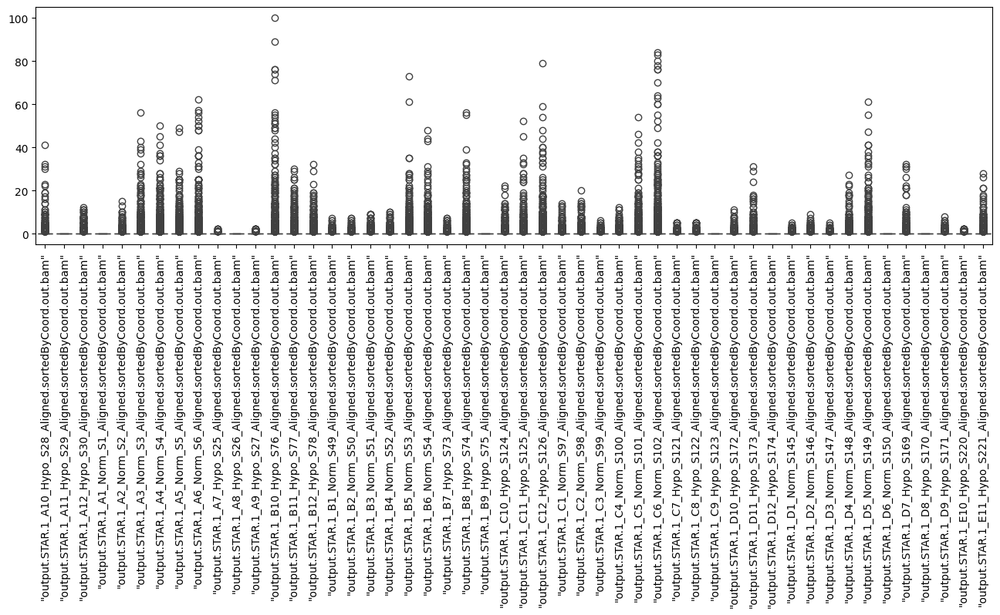

In [ ]:
df_noOut_small = df_noOut.iloc[ : , :50]
plt.figure(figsize=(16,4))
plot = sns.boxplot(data=df_noOut_small)
plt.setp(plot.get_xticklabels(), rotation=90)

## Skewness and kurtosis
- Helps in understanding the symmetry and 'tailedness' 

### Skewdness

Text(0.5, 0, 'Skewness of single cells expression profiles - original df')

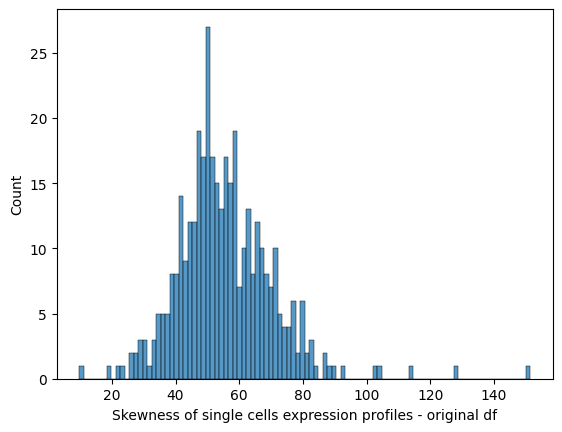

In [ ]:
from scipy.stats import kurtosis, skew
colN = np.shape(df)[1]
colN
df_skew_cells = []
for i in range(colN) :     
     v_df = df[cnames[i]]
     df_skew_cells += [skew(v_df)]   
df_skew_cells
sns.histplot(df_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - original df')

As evident from the histogram, it is positively skewed.


### Kurtosis

Text(0.5, 0, 'Kurtosis of single cells expression profiles - original df')

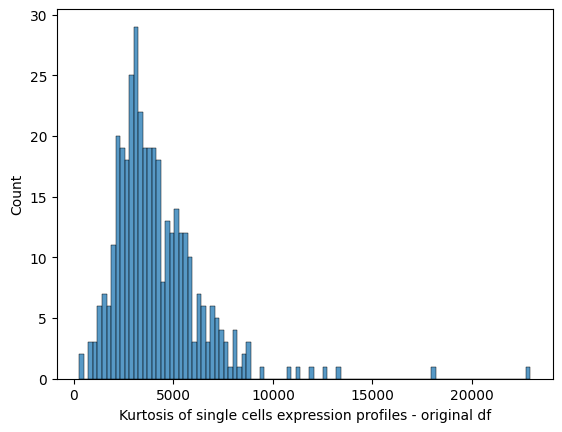

In [ ]:
df_kurt_cells = []
colN = np.shape(df)[1]
colN
for i in range(colN):
    v_df = df[cnames[i]]
    df_kurt_cells += [kurtosis(v_df)]

sns.histplot(df_kurt_cells,bins=100)
plt.xlabel("Kurtosis of single cells expression profiles - original df")


The high kurtosis value suggests that we have extreme heavy tails 

## Data transformation
- Log based 2 transformation

<Axes: xlabel='"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"'>

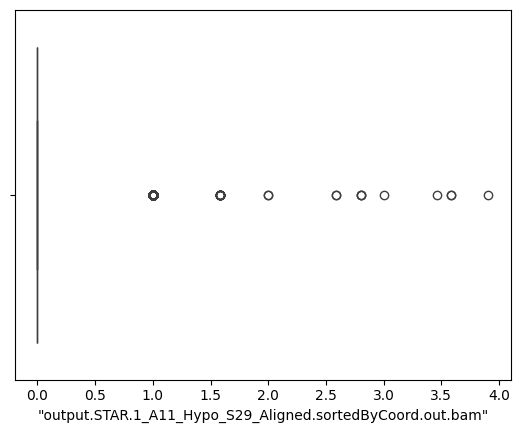

In [ ]:
df11_log2 = np.log2(df[cnames[1]]+1)
sns.boxplot(x=df11_log2)

<Axes: xlabel='"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"'>

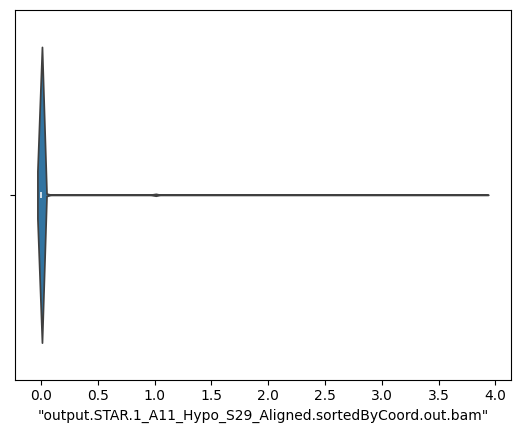

In [ ]:
sns.violinplot(x = df11_log2)

In [ ]:
display(df11_log2.describe().round(2))

count    22934.00
mean         0.01
std          0.12
min          0.00
25%          0.00
50%          0.00
75%          0.00
max          3.91
Name: "output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam", dtype: float64

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

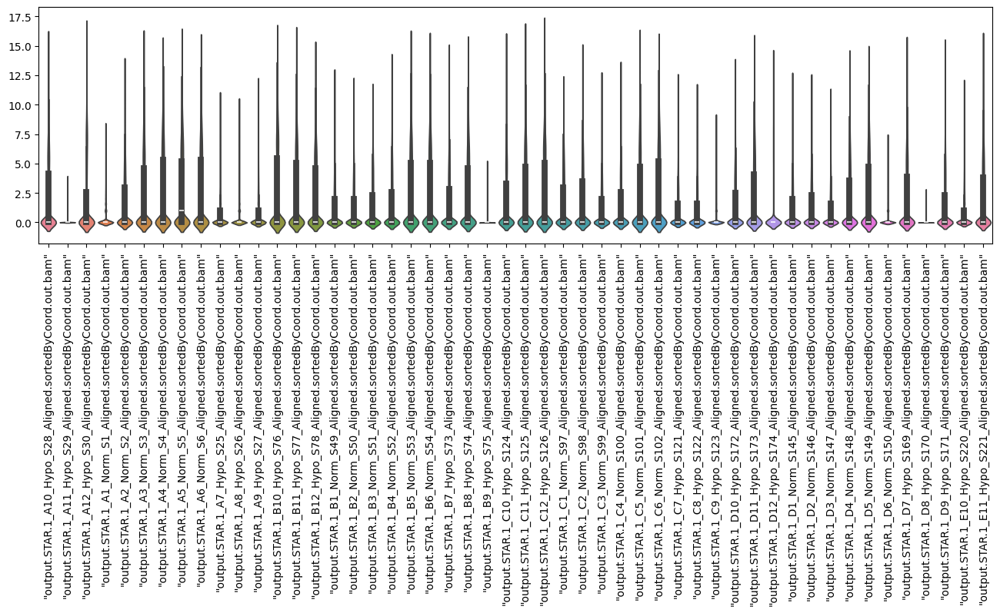

In [ ]:
df1 = df + 1
df1_log2 = np.log2(df1)
df1_log2_small = df1_log2.iloc[:,:50]
plt.figure(figsize=(16,4))
plot = sns.violinplot(data=df1_log2_small)
plt.setp(plot.get_xticklabels(), rotation = 90)

This violin plot shows the distribution of gene expression values across individual samples after applying a log2 transformation. Each violin corresponds to a sample (denoted by its BAM file name), and the width of the violin at each point reflects the density of genes having that log2 expression level. The log2 transformation compresses extreme values and helps reveal the overall shape of the distribution more clearly, especially in the presence of high-expression outliers.

From the plot, we observe that most samples show a right-skewed distribution, with the bulk of gene expression values clustered near the lower end of the log2 scale and a long tail extending upward. However, a few samples have broader or taller violins, suggesting higher dispersion or variability in expression. The consistent central tendency across samples indicates similar overall expression profiles.


### Checking skewness and kurtosis after transformation

Text(0.5, 0, 'Skewness of single cells expression profiles - log2 df')

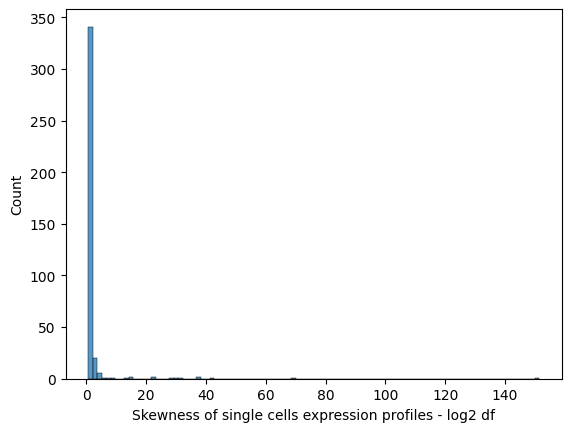

In [ ]:
df1_log2_skew_cells = []
for i in range(colN) :     
     v_df = df1_log2[cnames[i]]
     df1_log2_skew_cells += [skew(v_df)]   
df1_log2_skew_cells
sns.histplot(df1_log2_skew_cells,bins=100)
plt.xlabel('Skewness of single cells expression profiles - log2 df')

Text(0.5, 0, 'Kurtosis of single cells expression profiles - log2 df')

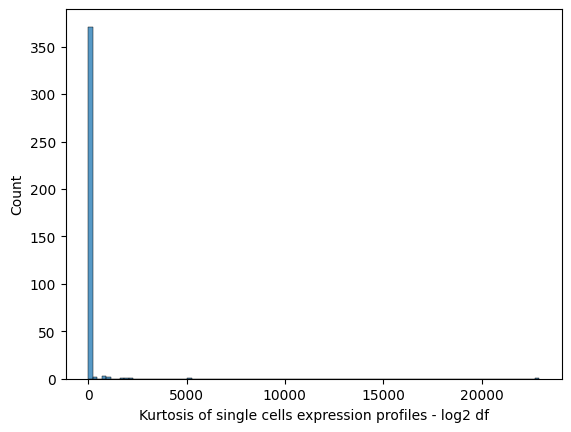

In [ ]:
df1_log2_kurtosis_cells = []
for i in range(colN):
    df1_log2_kurtosis_cells += [kurtosis(df1_log2[cnames[i]])]
sns.histplot(data = df1_log2_kurtosis_cells, bins=100)
plt.xlabel('Kurtosis of single cells expression profiles - log2 df')

Kernel density estimation

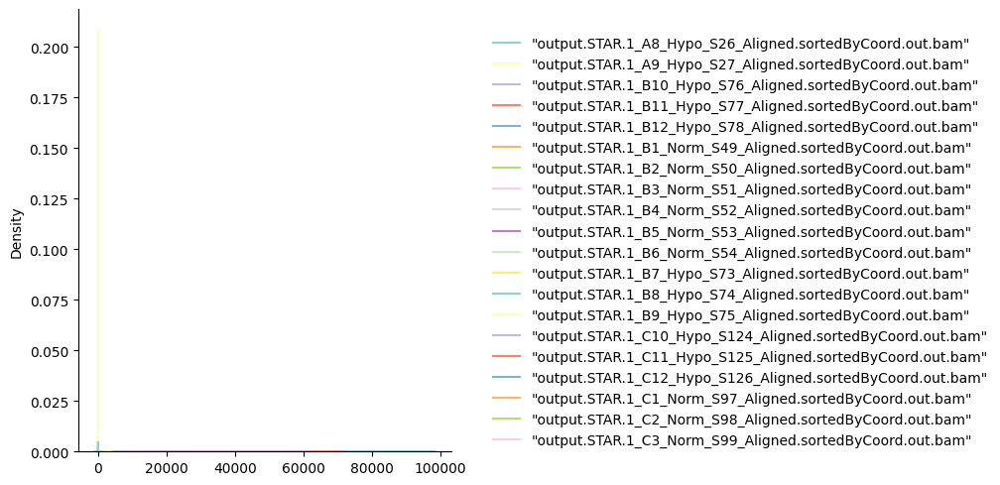

In [ ]:
df_small = df.iloc[:, 10:30]  
sns.displot(data=df_small,palette="Set3",kind="kde", bw_adjust=2)

In this plot, most of the density is sharply concentrated near zero, with a steep peak at the low-expression range. Beyond that initial peak, expression values become sparse and densities drop to nearly zero, indicating fewer genes with high expression.

## Duplicated rows

In [ ]:
duplicate_rows_df = df[df.duplicated(keep=False)]
print("number of duplicate rows: ", duplicate_rows_df.shape)
print("number of duplicate rows: ", duplicate_rows_df)

number of duplicate rows:  (56, 383)
number of duplicate rows:                     "output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam"  \
"SHISAL2A"                                                         0            
"IL12RB2"                                                          0            
"S1PR1"                                                            0            
"CD84"                                                             0            
"GNLY"                                                             0            
"FAR2P3"                                                           0            
"KLF2P3"                                                           0            
"PABPC1P2"                                                         0            
"UGT1A8"                                                           0            
"UGT1A9"                                                           0            
"SLC22A14"                                   

The code identifies and displays duplicate rows in the gene expression DataFrame by checking for rows with identical values across all 383 samples. It finds 56 such duplicate entries, meaning these genes have exactly the same expression pattern—mostly zeros—across every sample. 

We will dive a bit deeper and analyze more about such duplicity in files.

In [ ]:
duplicate_rows_df_t = duplicate_rows_df.T
duplicate_rows_df_t
c_dupl = duplicate_rows_df_t.corr()
c_dupl

,"""SHISAL2A""","""IL12RB2""","""S1PR1""","""CD84""","""GNLY""","""FAR2P3""","""KLF2P3""","""PABPC1P2""","""UGT1A8""","""UGT1A9""",...,"""BCL6B""","""CCL3L3""","""CCL3L1""","""OTOP3""","""RNA5SP450""","""PSG1""","""MIR3190""","""MIR3191""","""SEZ6L""","""ADAMTS5"""
"""SHISAL2A""",1.000000,0.630630,0.654887,0.312826,0.497375,-0.008333,-0.008333,0.497375,-0.009322,-0.009322,...,0.497375,-0.007615,-0.007615,0.134926,-0.005249,0.497375,-0.005249,-0.005249,0.112487,0.630630
"""IL12RB2""",0.630630,1.000000,0.829681,0.799056,0.630630,-0.007903,-0.007903,0.948434,-0.008841,-0.008841,...,0.630630,-0.007222,-0.007222,0.612365,-0.004979,0.630630,-0.004979,-0.004979,0.586533,0.799056
"""S1PR1""",0.654887,0.829681,1.000000,0.412553,0.654887,-0.007656,-0.007656,0.654887,-0.008565,-0.008565,...,0.654887,-0.006996,-0.006996,0.178813,-0.004823,0.654887,-0.004823,-0.004823,0.149322,0.829681
"""CD84""",0.312826,0.799056,0.412553,1.000000,0.312826,-0.007903,-0.007903,0.948434,-0.008841,-0.008841,...,0.312826,-0.007222,-0.007222,0.964653,-0.004979,0.312826,-0.004979,-0.004979,0.955646,0.397167
"""GNLY""",0.497375,0.630630,0.654887,0.312826,1.000000,-0.008333,-0.008333,0.497375,-0.009322,-0.009322,...,1.000000,0.021357,0.021357,0.134926,-0.005249,0.497375,-0.005249,-0.005249,0.112487,0.948434
"""FAR2P3""",-0.008333,-0.007903,-0.007656,-0.007903,-0.008333,1.000000,1.000000,-0.008333,-0.014798,-0.014798,...,-0.008333,-0.012088,-0.012088,-0.006928,-0.008333,-0.008333,-0.008333,-0.008333,-0.006775,-0.007903
"""KLF2P3""",-0.008333,-0.007903,-0.007656,-0.007903,-0.008333,1.000000,1.000000,-0.008333,-0.014798,-0.014798,...,-0.008333,-0.012088,-0.012088,-0.006928,-0.008333,-0.008333,-0.008333,-0.008333,-0.006775,-0.007903
"""PABPC1P2""",0.497375,0.948434,0.654887,0.948434,0.497375,-0.008333,-0.008333,1.000000,-0.009322,-0.009322,...,0.497375,-0.007615,-0.007615,0.831379,-0.005249,0.497375,-0.005249,-0.005249,0.813013,0.630630
"""UGT1A8""",-0.009322,-0.008841,-0.008565,-0.008841,-0.009322,-0.014798,-0.014798,-0.009322,1.000000,1.000000,...,-0.009322,-0.013523,-0.013523,-0.007750,-0.009322,-0.009322,-0.009322,-0.009322,-0.007579,-0.008841
"""UGT1A9""",-0.009322,-0.008841,-0.008565,-0.008841,-0.009322,-0.014798,-0.014798,-0.009322,1.000000,1.000000,...,-0.009322,-0.013523,-0.013523,-0.007750,-0.009322,-0.009322,-0.009322,-0.009322,-0.007579,-0.008841


In [ ]:
duplicate_rows_df_t.describe()


,"""SHISAL2A""","""IL12RB2""","""S1PR1""","""CD84""","""GNLY""","""FAR2P3""","""KLF2P3""","""PABPC1P2""","""UGT1A8""","""UGT1A9""",...,"""BCL6B""","""CCL3L3""","""CCL3L1""","""OTOP3""","""RNA5SP450""","""PSG1""","""MIR3190""","""MIR3191""","""SEZ6L""","""ADAMTS5"""
count,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,...,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000
mean,0.005222,0.007833,0.018277,0.007833,0.005222,0.013055,0.013055,0.005222,0.704961,0.704961,...,0.005222,0.394256,0.394256,0.015666,0.005222,0.005222,0.005222,0.005222,0.018277,0.007833
std,0.072168,0.114138,0.274921,0.114138,0.072168,0.113658,0.113658,0.072168,5.486218,5.486218,...,0.072168,3.756135,3.756135,0.260417,0.072168,0.072168,0.072168,0.072168,0.310683,0.114138
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,2.000000,5.000000,2.000000,1.000000,1.000000,1.000000,1.000000,78.000000,78.000000,...,1.000000,66.000000,66.000000,5.000000,1.000000,1.000000,1.000000,1.000000,6.000000,2.000000


### Dropping duplicates

Identifying and removing these duplicates is important, as they can introduce redundancy and bias in downstream analyses like clustering or dimensionality reduction, and unnecessarily increase computational load.

In [ ]:
df_noDup = df.drop_duplicates()
df_noDup.count()


"output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam"    22905
"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"    22905
"output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam"    22905
"output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam"      22905
"output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam"      22905
                                                              ...  
"output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam"    22905
"output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam"    22905
"output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam"    22905
"output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam"    22905
"output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"    22905
Length: 383, dtype: int64

# Data structure
- Correlation

## Heatmap

The heatmap is a good way to check correlation which measures the correlation based on the coefficient constant. 

Number of cells included:  (383, 383)
Average correlation of expression profiles between cells:  0.49898107535336916
Min. correlation of expression profiles between cells:  -0.0020378492932616927


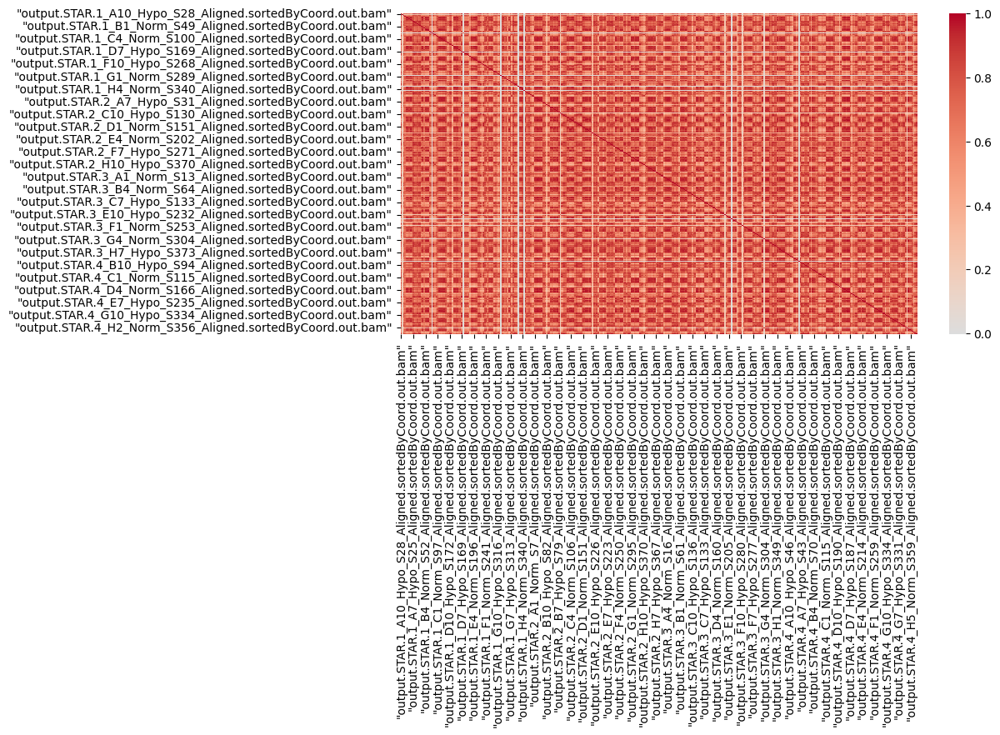

In [ ]:
plt.figure(figsize=(10,5))
c= df.corr()
midpoint = (c.values.max() + c.values.min())/2
sns.heatmap(c,cmap='coolwarm', center=0 )
print("Number of cells included: ", np.shape(c))
print("Average correlation of expression profiles between cells: ", midpoint)
print("Min. correlation of expression profiles between cells: ", c.values.min())

The heatmap shows strong overall correlations (mostly dark red), suggesting consistent gene expression patterns across most samples. However, a subtle block structure is visible, where samples under similar conditions (e.g., Hypoxia or Normoxia) appear more closely clustered. This indicates that gene expression profiles group more tightly within the same condition, supporting the hypothesis that oxygen levels significantly influence expression behavior.

## Histogram

(383, 383)

pandas.core.frame.DataFrame

,"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"""
"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""",1.000000,0.292568,0.808329,0.697870,0.721242,0.642948,0.709258,0.617521,0.618802,0.900562,...,0.838974,0.521685,0.163054,0.560572,0.554862,0.570941,0.668708,0.457658,0.890291,0.874445
"""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""",0.292568,1.000000,0.146217,0.182917,0.212992,0.171827,0.222140,0.148963,0.171648,0.220787,...,0.196892,0.136905,0.116034,0.145569,0.135938,0.110866,0.141656,0.137021,0.254233,0.199633
"""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""",0.808329,0.146217,1.000000,0.646251,0.600347,0.588118,0.635104,0.576847,0.604278,0.844294,...,0.802609,0.540563,0.132710,0.547429,0.576650,0.607403,0.693280,0.609518,0.843927,0.851434


Text(0.5, 0, 'Correlation between cells expression profiles')

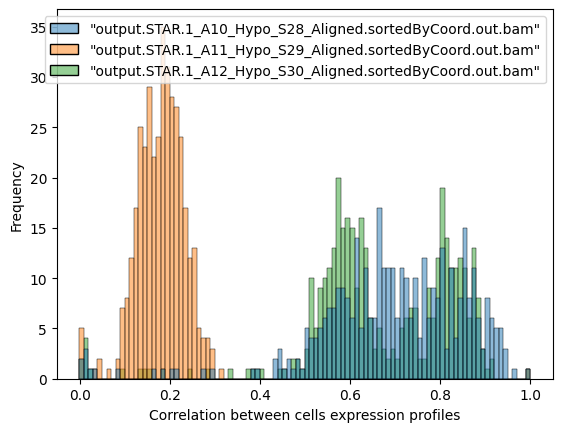

In [ ]:
display(np.shape(c), type(c),
c.head(3))
c_small=c.iloc[:,:3]
sns.histplot(c_small,bins=100)
plt.ylabel('Frequency')
plt.xlabel('Correlation between cells expression profiles')

We are also going to use histogram in this case to visualize correlation.The histogram reveals that the sample labeled "S29" has significantly lower intra-sample correlation (peaking around 0.2), suggesting greater heterogeneity or possible noise/artifacts in cell expression. In contrast, samples "S28" and "S30" show higher correlations (mostly above 0.5), indicating more consistent expression patterns across their cells. This contrast may point to biological variability or technical differences in sample preparation or quality.

# Unsupervised Learning

### HCC1806 DropSeq

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from scipy.stats import mode

In [ ]:
df = pd.read_csv('./Data/DropSeq/HCC1806_Filtered_Normalised_3000_Data_train.txt', sep="\s+", engine="python",index_col=0)
print(df.shape)
print(df.head())
print(df.isnull().sum())


<>:1: SyntaxWarning: invalid escape sequence '\s'
<>:1: SyntaxWarning: invalid escape sequence '\s'
/var/folders/jp/w8pf9g1n6p504nn18kl7rj900000gn/T/ipykernel_7336/2478961634.py:1: SyntaxWarning: invalid escape sequence '\s'
  df = pd.read_csv('./Data/DropSeq/HCC1806_Filtered_Normalised_3000_Data_train.txt', sep="\s+", engine="python",index_col=0)


(3000, 14682)
           "AAAAAACCCGGC_Normoxia"  "AAAACCGGATGC_Normoxia"  \
"H1-5"                           2                        2   
"MALAT1"                         3                        3   
"MT-RNR2"                        0                        0   
"ARVCF"                          0                        0   
"BCYRN1"                         0                        1   

           "AAAACGAGCTAG_Normoxia"  "AAAACTTCCCCG_Normoxia"  \
"H1-5"                           5                        1   
"MALAT1"                         2                        3   
"MT-RNR2"                        0                        0   
"ARVCF"                          0                        0   
"BCYRN1"                         1                        0   

           "AAAAGCCTACCC_Normoxia"  "AAACACAAATCT_Normoxia"  \
"H1-5"                           0                        0   
"MALAT1"                        12                        3   
"MT-RNR2"                        0     

Next we define our set X and the condition labels.

In [ ]:
df_clean = df.copy()
df_clean.columns = df_clean.columns.str.replace('"', '')
df_clean.index = df_clean.index.str.replace('"', '')

condition_labels = [
    "Hypoxia" if "Hypoxia" in col else
    "Normoxia" if "Normoxia" in col else
    "Unknown"  # fallback label, just in case
    for col in df.columns
]
condition_labels = np.array(condition_labels)


X = df_clean.T
print(X.shape)

X_log = np.log1p(X)

(14682, 3000)


In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_log)

The data imported is a matrix of gene expressions, consisting of 3000 genes for 14682 cells. They were therefore log transformed and standardized to imporve the performance of dimensionality reduction and clusting algorithms, by stabalizing variance and removing scale bias.

#### PCA and Explained Variance

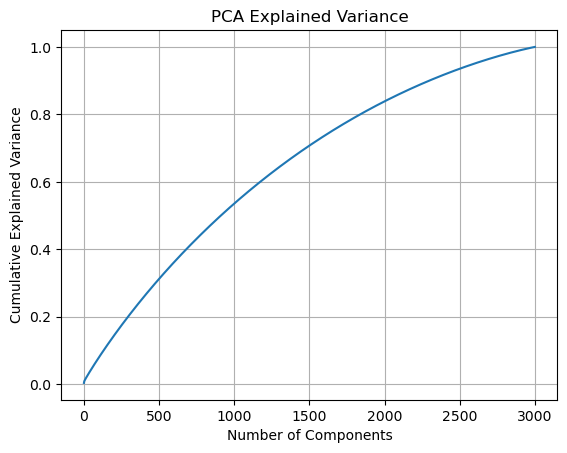

In [ ]:
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Cumulative explained variance
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Explained Variance")
plt.grid(True)
plt.show()

The plot is smooth and lacks a clear elbow, where there is no obvious point after which explained variance flattened. This behavior suggests that the information is spread across many principal components, which is typical in single cell data due to its sparcity and high variability. 
Hence, the decision was made to retain 100 principal components as a compromise between preserving a high proportion of total variance, and to avoid overfitting and noise from retaining too many dimensions. 

I have conducted a Scree Plot contianing the first 100 PCs. This will allow us to see the variation in the explained variance across these PCs.

(100,)


<function matplotlib.pyplot.show(close=None, block=None)>

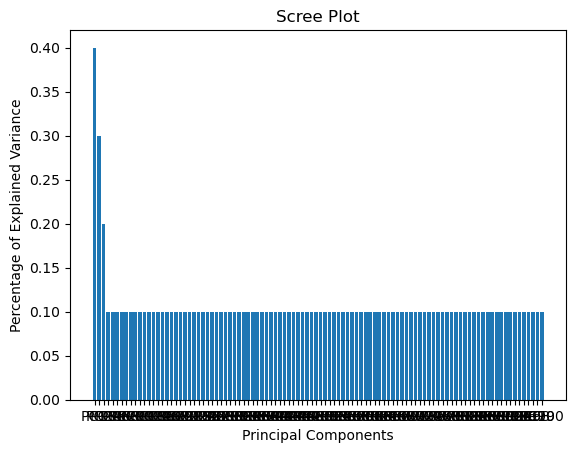

In [ ]:
per_var = np.round(pca.explained_variance_ratio_ * 100, decimals=1)
trimmed_arr = per_var[:100]
print(trimmed_arr.shape)
labels = ['PC' + str(x) for x in range(1, len(trimmed_arr) + 1)]
plt.bar(x=range(1, len(trimmed_arr) + 1), height=trimmed_arr, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Components')
plt.title('Scree Plot')
plt.show

Given the following, it seems like the explained variance is low for basically all of the principal components, with the first having 0.004% of the explained variance. This suggests that the data is spread across many principal components rather than just a few, which might cause problems when running KMeans.

#### K-Means Intertia and Silhouette Analysis

After PCA, we apply KMeans clustering to the 100D representation. We use two metrics to select optimal number of clusters.

In [ ]:
pca = PCA(n_components=100)
X_pca_100 = pca.fit_transform(X_scaled)

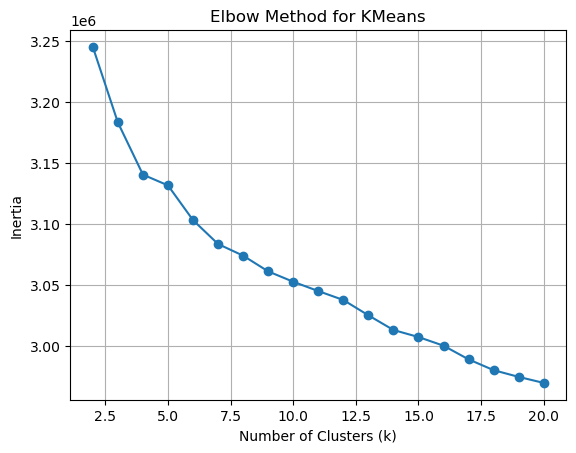

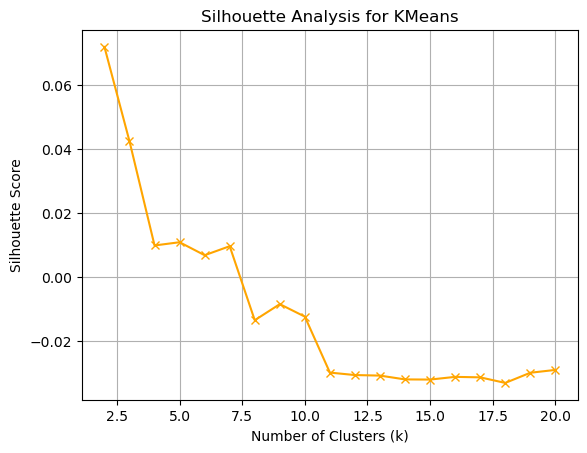

In [ ]:
inertia = []
sil_scores = []
k_values = list(range(2, 21)) 

for k in k_values:
    km = KMeans(n_clusters=k, random_state=42)
    labels_kmeans_train = km.fit_predict(X_pca_100)
    inertia.append(km.inertia_)
    sil_scores.append(silhouette_score(X_pca_100, labels_kmeans_train))

# Elbow Curve (inertia)
plt.plot(k_values, inertia, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method for KMeans")
plt.grid(True)
plt.show()

# Silhouette Scores
plt.plot(k_values, sil_scores, marker='x', color='orange')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Analysis for KMeans")
plt.grid(True)
plt.show()


Inertia measures the within-cluster sum of squared distances. A lower inertia means points are closer to cluster centers. We can observe a smooth decay without a clear elbow, hence no obvious point where adding clusters stopped reducing inertia significantly. This implies that the data does not naturally form well-separated spherical clusters, which KMeans assumes.

The silhouette score quantifies how well each point fits within the cluster. Scores peak around k=2-3 with a score of 0.04-0.07, which is very low. After k=5, silhouette scores dropped near zero or became negative, indicating overlapping or poorly defined clusters.
Regardless, given these findings we will conduct a final KMeans with a parameter of k=2.

#### K-means Unsupervised Model

In [ ]:
kmeans_final = KMeans(n_clusters=2, random_state=42)
labels_kmeans = kmeans_final.fit_predict(X_pca_100)

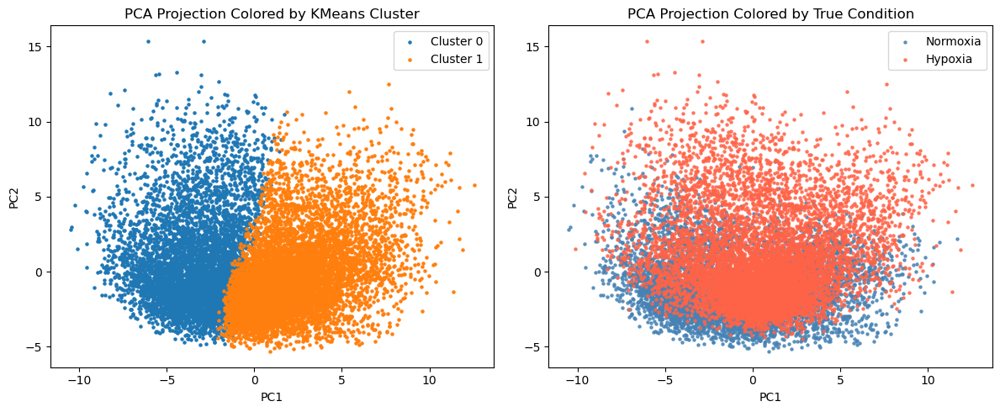

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
for cluster_id in np.unique(labels_kmeans):
    plt.scatter(X_pca_100[labels_kmeans == cluster_id, 0],
                X_pca_100[labels_kmeans == cluster_id, 1],
                s=5, label=f'Cluster {cluster_id}')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Projection Colored by KMeans Cluster')
plt.legend()

plt.subplot(1, 2, 2)
pca_df = pd.DataFrame({
    'PC1': X_pca_100[:, 0],
    'PC2': X_pca_100[:, 1],
    'Condition': condition_labels
})

# Plot
colors = {'Normoxia': 'steelblue', 'Hypoxia': 'tomato'}

for label in pca_df['Condition'].unique():
    subset = pca_df[pca_df['Condition'] == label]
    plt.scatter(subset['PC1'], subset['PC2'],
                c=colors[label], label=label, s=5, alpha=0.8)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Projection Colored by True Condition')
plt.legend()
plt.tight_layout()
plt.show()


In the visualization, we can observe two graphs, the left is our KMeans model, and the right is the data points labeled with their true value of Hypoxia or Normoxia. In our model, we can observe two main clusters, one on the right and the other on the left. They seem to be linearly separated. Meanwhile, the true model has a lot of overlap within both types of data, confirming very low separability. 

#### Test and Accuracy Discussion

In [ ]:
labels_kmeans_test = kmeans_final.predict(X_pca_100)

def align_clusters(preds, true_labels):
    matched_preds = np.zeros_like(preds)
    for cluster in np.unique(preds):
        mask = preds == cluster
        target_label = mode(true_labels[mask], keepdims=True).mode[0]
        matched_preds[mask] = target_label
    return matched_preds

label_map = {'Normoxia': 0, 'Hypoxia': 1}
y_test_int = np.array([label_map[label] for label in condition_labels])

aligned_preds = align_clusters(labels_kmeans_test, y_test_int)
acc = accuracy_score(y_test_int, aligned_preds)
print(f"Test Set Clustering Accuracy: {acc:.2%}")


Test Set Clustering Accuracy: 62.36%


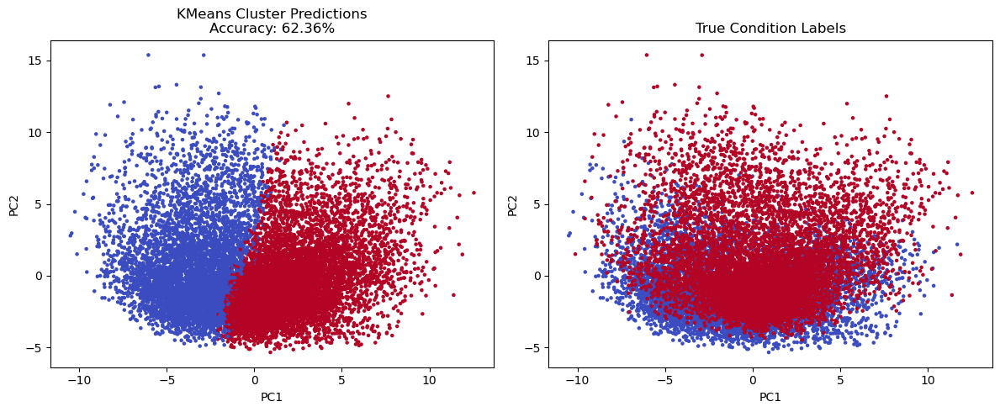

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(X_pca_100[:, 0], X_pca_100[:, 1],
            c=aligned_preds, cmap='coolwarm', s=5)
plt.title(f"KMeans Cluster Predictions\nAccuracy: {acc:.2%}")
plt.xlabel("PC1")
plt.ylabel("PC2")

plt.subplot(1, 2, 2)
plt.scatter(X_pca_100[:, 0], X_pca_100[:, 1],
            c=y_test_int, cmap='coolwarm', s=5)
plt.title("True Condition Labels")
plt.xlabel("PC1")
plt.ylabel("PC2")

plt.tight_layout()
plt.show()


Following the testing set, we arrive at a 62.33% accuracy score. We visualize the model compared to the true value above. 

#### Applying the Model to the Test Set

In [ ]:
df_test = pd.read_csv('./Data/DropSeq/HCC1806_Filtered_Normalised_3000_Data_test_anonim.txt', sep="\s+", engine="python", index_col=0)
df_test.columns = df_test.columns.str.replace('"', '')
df_test.index = df_test.index.str.replace('"', '')

X_test = df_test.T
X_test_log = np.log1p(X_test)

X_test_scaled = scaler.transform(X_test_log)
X_test_pca = pca.transform(X_test_scaled)[:, :100]  # only use first 100 components for GMM

kmeans_test_preds = kmeans_final.predict(X_test_pca)

# Align clusters to condition labels using training data
train_cluster_to_label_kmeans = {}
for cluster in np.unique(labels_kmeans):
    labels_in_cluster = condition_labels[labels_kmeans == cluster]
    unique_labels, counts = np.unique(labels_in_cluster, return_counts=True)
    most_common = unique_labels[np.argmax(counts)]
    train_cluster_to_label_kmeans[cluster] = most_common

# Map predicted cluster labels to Hypoxia/Normoxia
kmeans_test_labels_named = np.array([train_cluster_to_label_kmeans[cluster] for cluster in kmeans_test_preds])

output_df = pd.DataFrame({
    'SampleID': X_test.index,
    'Condition': kmeans_test_labels_named
})
output_df.to_csv('./Predictions/HCC1806_DropSeq_Test_Set_Predictions_UNSUP.txt', sep="\t", index=False)

<>:1: SyntaxWarning: invalid escape sequence '\s'
<>:1: SyntaxWarning: invalid escape sequence '\s'
/var/folders/jp/w8pf9g1n6p504nn18kl7rj900000gn/T/ipykernel_7336/2402660781.py:1: SyntaxWarning: invalid escape sequence '\s'
  df_test = pd.read_csv('./Data/DropSeq/HCC1806_Filtered_Normalised_3000_Data_test_anonim.txt', sep="\s+", engine="python", index_col=0)


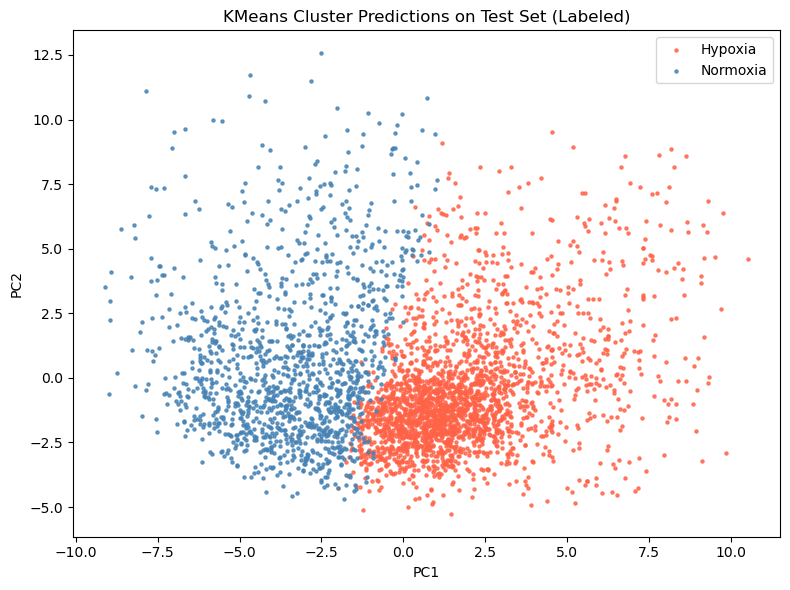

In [ ]:
kmeans_test_df = pd.DataFrame({
    'PC1': X_test_pca[:, 0],
    'PC2': X_test_pca[:, 1],
    'Predicted Condition': kmeans_test_labels_named
})

# Plot
plt.figure(figsize=(8, 6))
colors = {'Normoxia': 'steelblue', 'Hypoxia': 'tomato'}

for label in kmeans_test_df['Predicted Condition'].unique():
    subset = kmeans_test_df[kmeans_test_df['Predicted Condition'] == label]
    plt.scatter(subset['PC1'], subset['PC2'],
                c=colors[label], label=label, s=5, alpha=0.8)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('KMeans Cluster Predictions on Test Set (Labeled)')
plt.legend()
plt.grid(False)
plt.tight_layout()
plt.show()

### MCF7 DropSeq

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from scipy.stats import mode

In [ ]:
df = pd.read_csv('./Data/DropSeq/MCF7_Filtered_Normalised_3000_Data_train.txt', sep="\s+", engine="python",index_col=0)
print(df.shape)
print(df.head())
print(df.isnull().sum())


<>:1: SyntaxWarning: invalid escape sequence '\s'
<>:1: SyntaxWarning: invalid escape sequence '\s'
/var/folders/jp/w8pf9g1n6p504nn18kl7rj900000gn/T/ipykernel_7336/2966399598.py:1: SyntaxWarning: invalid escape sequence '\s'
  df = pd.read_csv('./Data/DropSeq/MCF7_Filtered_Normalised_3000_Data_train.txt', sep="\s+", engine="python",index_col=0)


(3000, 21626)
           "AAAAACCTATCG_Normoxia"  "AAAACAACCCTA_Normoxia"  \
"MALAT1"                         1                        3   
"MT-RNR2"                        0                        0   
"NEAT1"                          0                        0   
"H1-5"                           0                        0   
"TFF1"                           4                        1   

           "AAAACACTCTCA_Normoxia"  "AAAACCAGGCAC_Normoxia"  \
"MALAT1"                         3                        6   
"MT-RNR2"                        0                        2   
"NEAT1"                          0                        0   
"H1-5"                           0                        0   
"TFF1"                           1                        1   

           "AAAACCTAGCTC_Normoxia"  "AAAACCTCCGGG_Normoxia"  \
"MALAT1"                         4                        5   
"MT-RNR2"                        0                        0   
"NEAT1"                          0     

In [ ]:
df_clean = df.copy()
df_clean.columns = df_clean.columns.str.replace('"', '')
df_clean.index = df_clean.index.str.replace('"', '')

condition_labels = [
    "Hypoxia" if "Hypoxia" in col else
    "Normoxia" if "Normoxia" in col else
    "Unknown"  # fallback label, just in case
    for col in df.columns
]
condition_labels = np.array(condition_labels)

X = df_clean.T
print(X.shape)

X_log = np.log1p(X)

(21626, 3000)


In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_log)

The data imported is a matrix of gene expressions, consisting of 3000 genes for 21626 cells. They were therefore log transformed and standardized to imporve the performance of dimensionality reduction and clusting algorithms, by stabalizing variance and removing scale bias.

#### PCA and Explained Variance

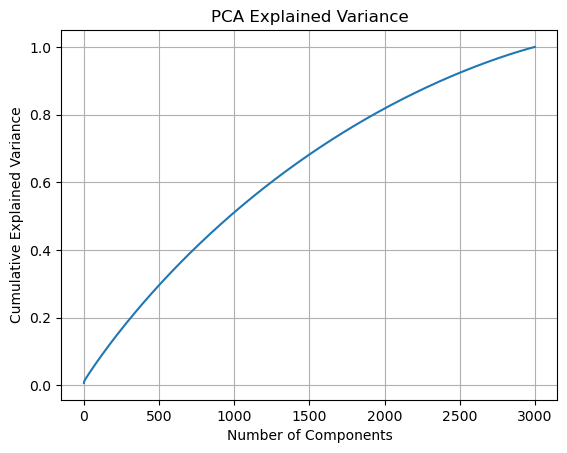

In [ ]:
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Cumulative explained variance
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Explained Variance")
plt.grid(True)
plt.show()


The plot is smooth and lacks a clear elbow, where there is no obvious point after which explained variance flattened. This behavior suggests that the information is spread across many principal components, which is typical in single cell data due to its sparcity and high variability. 
Hence, the decision was made to retain 100 principal components as a compromise between preserving a high proportion of total variance, and to avoid overfitting and noise from retaining too many dimensions. 

#### K-Means Inertia and Silhouette Analysis

After PCA, we apply KMeans clustering to the 100D representation. We use two metrics to select optimal number of clusters.

In [ ]:
pca = PCA(n_components=100)
X_pca_100 = pca.fit_transform(X_scaled)

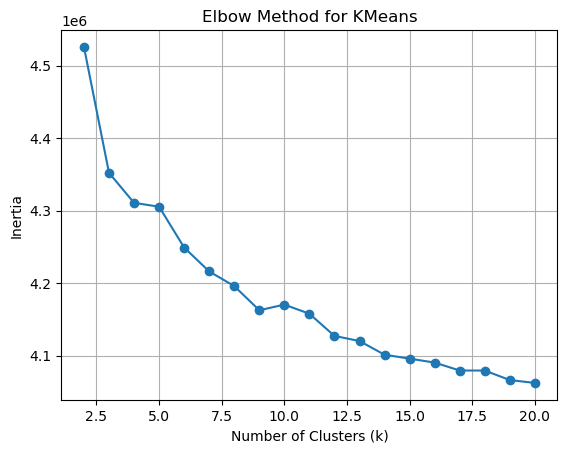

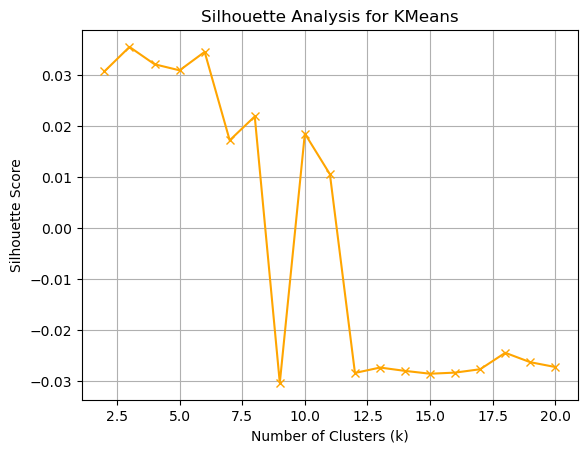

In [ ]:
inertia = []
sil_scores = []
k_values = list(range(2, 21)) 

for k in k_values:
    km = KMeans(n_clusters=k, random_state=42)
    labels_kmeans_train = km.fit_predict(X_pca_100)
    inertia.append(km.inertia_)
    sil_scores.append(silhouette_score(X_pca_100, labels_kmeans_train))

# Elbow Curve (inertia)
plt.plot(k_values, inertia, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method for KMeans")
plt.grid(True)
plt.show()

# Silhouette Scores
plt.plot(k_values, sil_scores, marker='x', color='orange')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Analysis for KMeans")
plt.grid(True)
plt.show()


Inertia measures the within-cluster sum of squared distances. A lower inertia means points are closer to cluster centers. We can observe a smooth decay without a clear elbow, hence no obvious point where adding clusters stopped reducing inertia significantly (possibly between k=2 and k=3). This implies that the data does not naturally form well-separated spherical clusters, which KMeans assumes.

The silhouette score quantifies how well each point fits within the cluster. Scores peak between k=2 and k=5 with a score of 0.03, which is significantly low. After k=10, silhouette scores dropped near zero, indicating poorly defined clusters.
Regardless, given these findings we will conduct a final KMeans with a parameter of k=2.

#### K-Means Unsupervised Model

In [ ]:
kmeans_final = KMeans(n_clusters=2, random_state=42)
labels_kmeans = kmeans_final.fit_predict(X_pca_100)

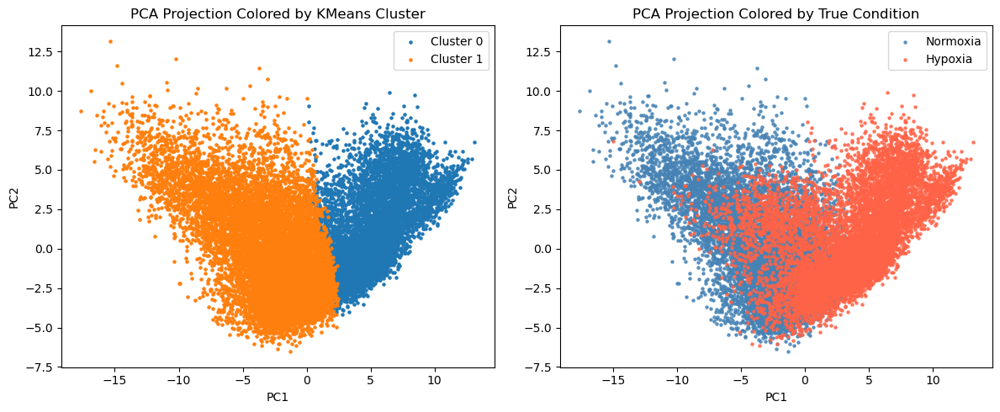

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1,2,1)
for cluster_id in np.unique(labels_kmeans):
    plt.scatter(X_pca_100[labels_kmeans == cluster_id, 0],
                X_pca_100[labels_kmeans == cluster_id, 1],
                label=f'Cluster {cluster_id}', s=5)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Projection Colored by KMeans Cluster')
plt.legend()


plt.subplot(1,2,2)
pca_df = pd.DataFrame({
    'PC1': X_pca_100[:, 0],
    'PC2': X_pca_100[:, 1],
    'Condition': condition_labels
})

# Plot
colors = {'Normoxia': 'steelblue', 'Hypoxia': 'tomato'}

for label in pca_df['Condition'].unique():
    subset = pca_df[pca_df['Condition'] == label]
    plt.scatter(subset['PC1'], subset['PC2'],
                c=colors[label], label=label, s=5, alpha=0.8)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Projection Colored by True Condition')
plt.legend()
plt.grid(False)
plt.tight_layout()
plt.show()

In the visualization, we observe two graphs, the left is teh KMeans model, and the right is the data points labeled with their true condition. In our model, we can observe two main clusters, one on the left and one on the right. The two clusters are clearly separated linearly. Compared to the correct data, it shares a similar structure (left/right separability), indicating that the model found clear separability between hypoxic and normoxic cells with regards to their genes. However, in the true setting, the two clusters share a big intersection between Hypoxic and Normoxic cells, suggesting not clear separability of the data in general.

#### Test and Accuracy Discussion

In [ ]:
labels_kmeans_test = kmeans_final.predict(X_pca_100)

def align_clusters(preds, true_labels):
    matched_preds = np.zeros_like(preds)
    for cluster in np.unique(preds):
        mask = preds == cluster
        target_label = mode(true_labels[mask], keepdims=True).mode[0]
        matched_preds[mask] = target_label
    return matched_preds

label_map = {'Normoxia': 0, 'Hypoxia': 1}
y_test_int = np.array([label_map[label] for label in condition_labels])

aligned_preds = align_clusters(labels_kmeans_test, y_test_int)
acc = accuracy_score(y_test_int, aligned_preds)
print(f"Test Set Clustering Accuracy: {acc:.2%}")


Test Set Clustering Accuracy: 87.04%


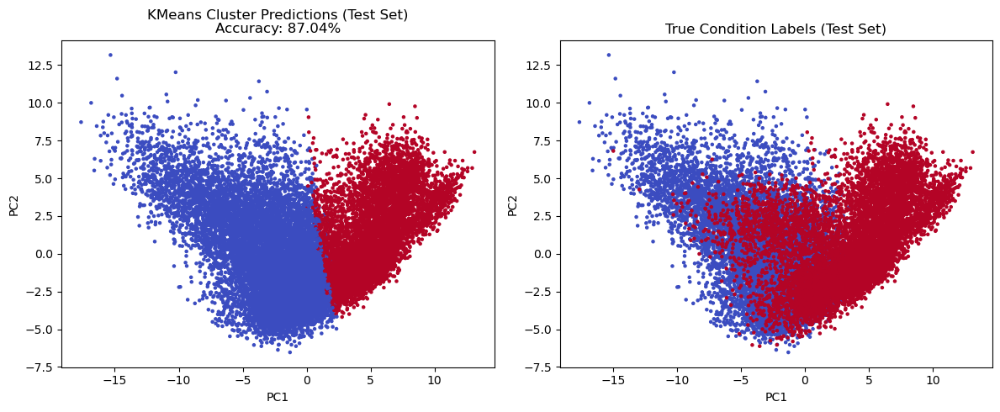

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(X_pca_100[:, 0], X_pca_100[:, 1],
            c=aligned_preds, cmap='coolwarm', s=5)
plt.title(f"KMeans Cluster Predictions (Test Set)\nAccuracy: {acc:.2%}")
plt.xlabel("PC1")
plt.ylabel("PC2")

plt.subplot(1, 2, 2)
plt.scatter(X_pca_100[:, 0], X_pca_100[:, 1],
            c=y_test_int, cmap='coolwarm', s=5)
plt.title("True Condition Labels (Test Set)")
plt.xlabel("PC1")
plt.ylabel("PC2")

plt.tight_layout()
plt.show()


Following the testing, we arrive at a 87.01% accuracy score, which is not at all bad for this model. This suggests that the KMeans model has found separability between the two conditions based on their genes. 

#### Applying the Model to the Test Set

In [ ]:
df_test = pd.read_csv('./Data/DropSeq/MCF7_Filtered_Normalised_3000_Data_test_anonim.txt', sep="\s+", engine="python", index_col=0)
df_test.columns = df_test.columns.str.replace('"', '')
df_test.index = df_test.index.str.replace('"', '')

X_test = df_test.T
X_test_log = np.log1p(X_test)

X_test_scaled = scaler.transform(X_test_log)
X_test_pca = pca.transform(X_test_scaled)[:, :100]  # only use first 100 components for GMM

kmeans_test_preds = kmeans_final.predict(X_test_pca)

# Align clusters to condition labels using training data
train_cluster_to_label_kmeans = {}
for cluster in np.unique(labels_kmeans):
    labels_in_cluster = condition_labels[labels_kmeans == cluster]
    unique_labels, counts = np.unique(labels_in_cluster, return_counts=True)
    most_common = unique_labels[np.argmax(counts)]
    train_cluster_to_label_kmeans[cluster] = most_common

# Map predicted cluster labels to Hypoxia/Normoxia
kmeans_test_labels_named = np.array([train_cluster_to_label_kmeans[cluster] for cluster in kmeans_test_preds])

output_df = pd.DataFrame({
    'SampleID': X_test.index,
    'Condition': kmeans_test_labels_named
})
output_df.to_csv('./Predictions/MCF7_DropSeq_Test_Set_Predictions_UNSUP.txt', sep="\t", index=False)

<>:1: SyntaxWarning: invalid escape sequence '\s'
<>:1: SyntaxWarning: invalid escape sequence '\s'
/var/folders/jp/w8pf9g1n6p504nn18kl7rj900000gn/T/ipykernel_7336/68451249.py:1: SyntaxWarning: invalid escape sequence '\s'
  df_test = pd.read_csv('./Data/DropSeq/MCF7_Filtered_Normalised_3000_Data_test_anonim.txt', sep="\s+", engine="python", index_col=0)


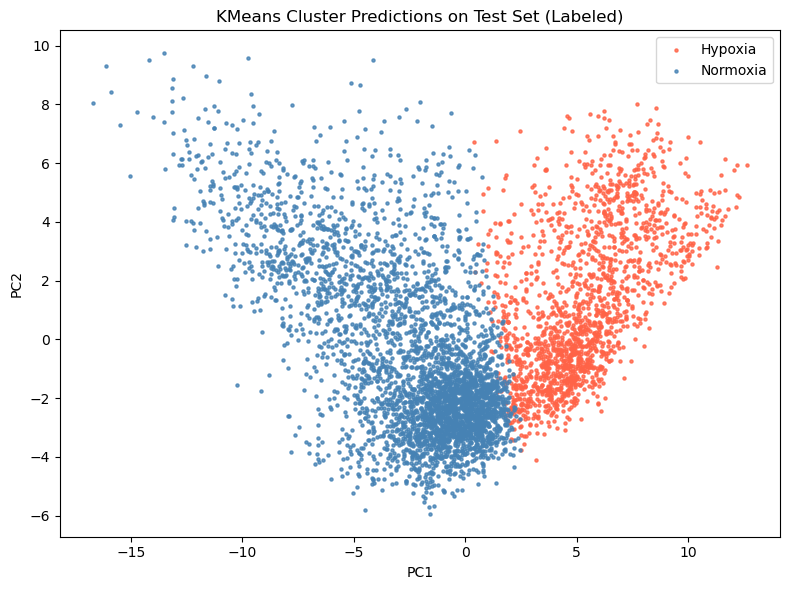

In [ ]:
kmeans_test_df = pd.DataFrame({
    'PC1': X_test_pca[:, 0],
    'PC2': X_test_pca[:, 1],
    'Predicted Condition': kmeans_test_labels_named
})

# Plot
plt.figure(figsize=(8, 6))
colors = {'Normoxia': 'steelblue', 'Hypoxia': 'tomato'}

for label in kmeans_test_df['Predicted Condition'].unique():
    subset = kmeans_test_df[kmeans_test_df['Predicted Condition'] == label]
    plt.scatter(subset['PC1'], subset['PC2'],
                c=colors[label], label=label, s=5, alpha=0.8)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('KMeans Cluster Predictions on Test Set (Labeled)')
plt.legend()
plt.grid(False)
plt.tight_layout()
plt.show()

### HCC1806 SmartSeq

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from scipy.stats import mode

In [ ]:
df = pd.read_csv('./Data/SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt', sep="\s+", engine="python",index_col=0)
print(df.shape)
print(df.head())
print(df.isnull().sum())

<>:1: SyntaxWarning: invalid escape sequence '\s'
<>:1: SyntaxWarning: invalid escape sequence '\s'
/var/folders/jp/w8pf9g1n6p504nn18kl7rj900000gn/T/ipykernel_7336/2038612077.py:1: SyntaxWarning: invalid escape sequence '\s'
  df = pd.read_csv('./Data/SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt', sep="\s+", engine="python",index_col=0)


(3000, 182)
           "output.STAR.PCRPlate1G12_Normoxia_S32_Aligned.sortedByCoord.out.bam"  \
"DDIT4"                                                    0                       
"ANGPTL4"                                                 48                       
"CALML5"                                                   0                       
"KRT14"                                                  321                       
"CCNB1"                                                  298                       

           "output.STAR.PCRPlate1G1_Hypoxia_S102_Aligned.sortedByCoord.out.bam"  \
"DDIT4"                                                 8739                      
"ANGPTL4"                                               2101                      
"CALML5"                                                  55                      
"KRT14"                                                   96                      
"CCNB1"                                                 1824        

In [ ]:
df_clean = df.copy()
df_clean.columns = df_clean.columns.str.replace('"', '')
df_clean.index = df_clean.index.str.replace('"', '')

condition_labels = [
    "Hypoxia" if "Hypoxia" in col else
    "Normoxia" if "Normoxia" in col else
    "Unknown"  # fallback label, just in case
    for col in df.columns
]
condition_labels = np.array(condition_labels)

X = df_clean.T
print(X.shape)

X_log = np.log1p(X)

(182, 3000)


In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_log)

The data imported is a matrix of gene expressions, consisting of 3000 genes for 182 cells. They were therefore log transformed and standardized to imporve the performance of dimensionality reduction and clusting algorithms, by stabalizing variance and removing scale bias.

#### PCA and Explained Variance

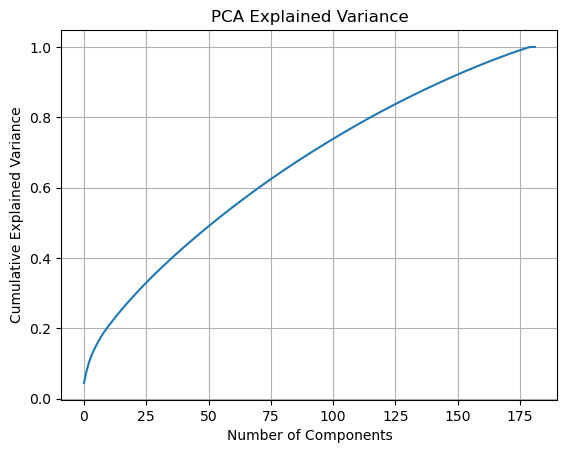

In [ ]:
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Cumulative explained variance
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Explained Variance")
plt.grid(True)
plt.show()

The plot is smooth and lacks a clear elbow, where there is no obvious point after which explained variance flattened. This behavior suggests that the information is spread across many principal components, which is typical in single cell data due to its sparcity and high variability. 
Hence, the decision was made to retain 100 principal components as a compromise between preserving a high proportion of total variance, and to avoid overfitting and noise from retaining too many dimensions. 

#### K-Means Intertia and Silhouette Analysis

After PCA, we apply KMeans clustering to the 100D representation. We use two metrics to select optimal number of clusters.

In [ ]:
pca_100 = PCA(n_components=100)
X_pca_100 = pca_100.fit_transform(X_scaled)

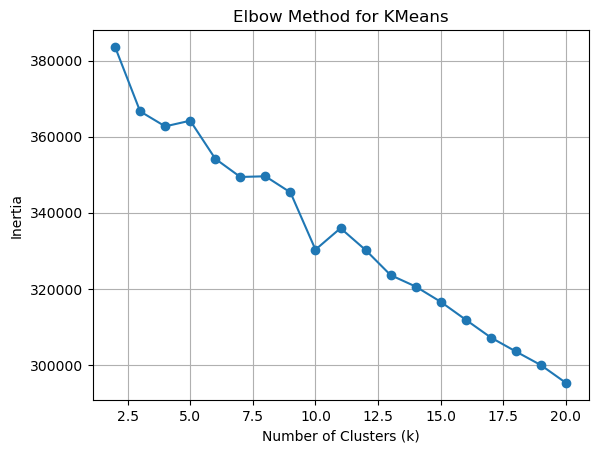

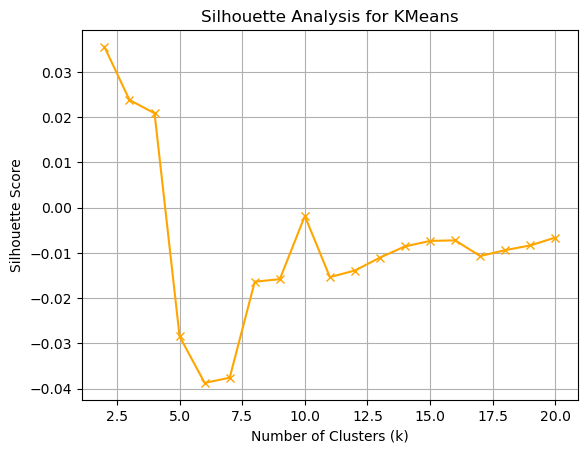

In [ ]:
inertia = []
sil_scores = []
k_values = list(range(2, 21)) 

for k in k_values:
    km = KMeans(n_clusters=k, random_state=42)
    labels = km.fit_predict(X_pca_100)
    inertia.append(km.inertia_)
    sil_scores.append(silhouette_score(X_pca_100, labels))

# Elbow Curve (inertia)
plt.plot(k_values, inertia, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method for KMeans")
plt.grid(True)
plt.show()

# Silhouette Scores
plt.plot(k_values, sil_scores, marker='x', color='orange')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Analysis for KMeans")
plt.grid(True)
plt.show()


Inertia measures the within-cluster sum of squared distances. A lower inertia means points are closer to cluster centers. We can observe a smooth decay without a clear elbow, hence no obvious point where adding clusters stopped reducing inertia significantly. This implies that the data does not naturally form well-separated spherical clusters, which KMeans assumes.

The silhouette score quantifies how well each point fits within the cluster. Scores peak between k=2 and k=7 with a score of 0.02, which is incredibly low. After k=10, silhouette scores dropped near zero or became negative, indicating overlapping or poorly defined clusters.
Regardless, given these findings we will conduct a final KMeans with a parameter of k=2.

#### K-Means Unsupervised Model

In [ ]:
kmeans_final = KMeans(n_clusters=2, random_state=42)
labels_kmeans = kmeans_final.fit_predict(X_pca_100)

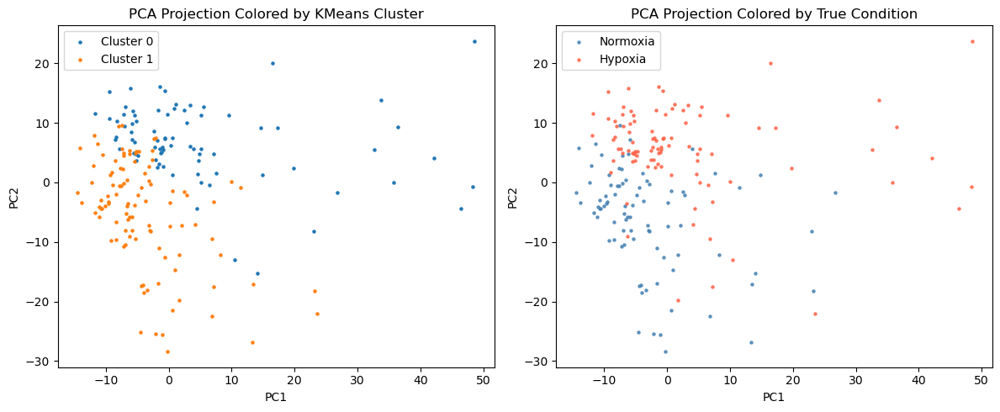

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
for cluster_id in np.unique(labels_kmeans):
    plt.scatter(X_pca_100[labels_kmeans == cluster_id, 0],
                X_pca_100[labels_kmeans == cluster_id, 1],
                label=f'Cluster {cluster_id}', s=5)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Projection Colored by KMeans Cluster')
plt.legend()

plt.subplot(1, 2, 2)
pca_df = pd.DataFrame({
    'PC1': X_pca_100[:, 0],
    'PC2': X_pca_100[:, 1],
    'Condition': condition_labels
})

colors = {'Normoxia': 'steelblue', 'Hypoxia': 'tomato'}

for label in pca_df['Condition'].unique():
    subset = pca_df[pca_df['Condition'] == label]
    plt.scatter(subset['PC1'], subset['PC2'],
                c=colors[label], label=label, s=5, alpha=0.8)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Projection Colored by True Condition')
plt.legend()
plt.grid(False)

plt.tight_layout()
plt.show()

In the visualization, we can observe two main clusters, separated as the upper and the lower cluster. They seem to be resonably separated. Compared to the correct data, it shares a similar structure, but in the correct data we can observe some intersection between the clusters.

#### Test and Accuracy Discussion

In [ ]:
labels_kmeans_test = kmeans_final.predict(X_pca_100)

def align_clusters(preds, true_labels):
    matched_preds = np.zeros_like(preds)
    for cluster in np.unique(preds):
        mask = preds == cluster
        target_label = mode(true_labels[mask], keepdims=True).mode[0]
        matched_preds[mask] = target_label
    return matched_preds

label_map = {'Normoxia': 0, 'Hypoxia': 1}
y_test_int = np.array([label_map[label] for label in condition_labels])

aligned_preds = align_clusters(labels_kmeans_test, y_test_int)
acc = accuracy_score(y_test_int, aligned_preds)
print(f"Test Set Clustering Accuracy: {acc:.2%}")


Test Set Clustering Accuracy: 82.42%


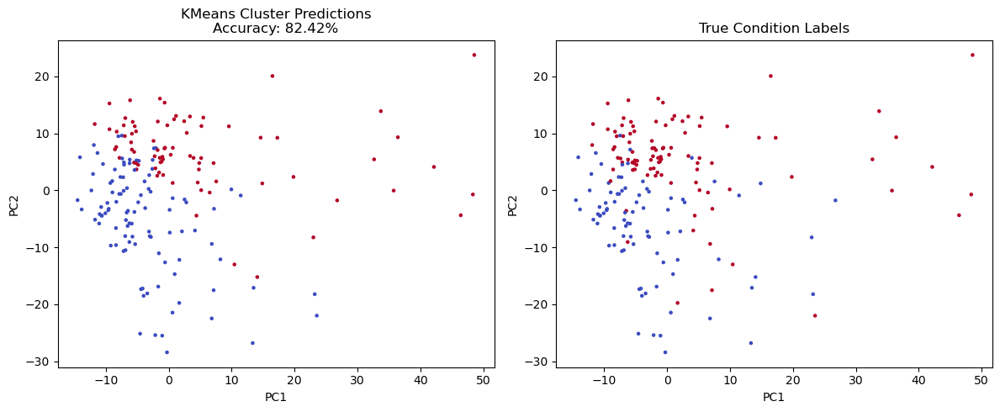

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(X_pca_100[:, 0], X_pca_100[:, 1],
            c=aligned_preds, cmap='coolwarm', s=5)
plt.title(f"KMeans Cluster Predictions\nAccuracy: {acc:.2%}")
plt.xlabel("PC1")
plt.ylabel("PC2")

plt.subplot(1, 2, 2)
plt.scatter(X_pca_100[:, 0], X_pca_100[:, 1],
            c=y_test_int, cmap='coolwarm', s=5)
plt.title("True Condition Labels")
plt.xlabel("PC1")
plt.ylabel("PC2")

plt.tight_layout()
plt.show()


Following the testing set, we arrive at a 92.86% accuracy score, which is very satisfying. This is thanks to the separability of the data.

#### Applying the Model to the Test Set

In [ ]:
df_test = pd.read_csv('./Data/SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt', sep="\s+", engine="python", index_col=0)
df_test.columns = df_test.columns.str.replace('"', '')
df_test.index = df_test.index.str.replace('"', '')

X_test = df_test.T
X_test_log = np.log1p(X_test)

X_test_scaled = scaler.transform(X_test_log)
X_test_pca = pca.transform(X_test_scaled)[:, :100]  # only use first 100 components for GMM

kmeans_test_preds = kmeans_final.predict(X_test_pca)

# Align clusters to condition labels using training data
train_cluster_to_label_kmeans = {}
for cluster in np.unique(labels_kmeans):
    labels_in_cluster = condition_labels[labels_kmeans == cluster]
    unique_labels, counts = np.unique(labels_in_cluster, return_counts=True)
    most_common = unique_labels[np.argmax(counts)]
    train_cluster_to_label_kmeans[cluster] = most_common

# Map predicted cluster labels to Hypoxia/Normoxia
kmeans_test_labels_named = np.array([train_cluster_to_label_kmeans[cluster] for cluster in kmeans_test_preds])

output_df = pd.DataFrame({
    'SampleID': X_test.index,
    'Condition': kmeans_test_labels_named
})
output_df.to_csv('./Predictions/HCC1806_SmartS_Test_Set_Predictions_UNSUP.txt', sep="\t", index=False)

<>:1: SyntaxWarning: invalid escape sequence '\s'
<>:1: SyntaxWarning: invalid escape sequence '\s'
/var/folders/jp/w8pf9g1n6p504nn18kl7rj900000gn/T/ipykernel_7336/1555462054.py:1: SyntaxWarning: invalid escape sequence '\s'
  df_test = pd.read_csv('./Data/SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt', sep="\s+", engine="python", index_col=0)


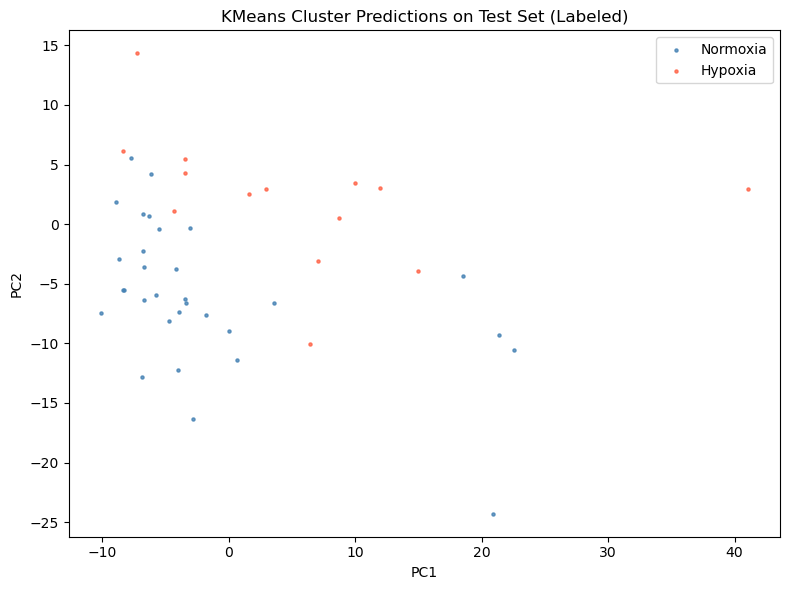

In [ ]:
kmeans_test_df = pd.DataFrame({
    'PC1': X_test_pca[:, 0],
    'PC2': X_test_pca[:, 1],
    'Predicted Condition': kmeans_test_labels_named
})

# Plot
plt.figure(figsize=(8, 6))
colors = {'Normoxia': 'steelblue', 'Hypoxia': 'tomato'}

for label in kmeans_test_df['Predicted Condition'].unique():
    subset = kmeans_test_df[kmeans_test_df['Predicted Condition'] == label]
    plt.scatter(subset['PC1'], subset['PC2'],
                c=colors[label], label=label, s=5, alpha=0.8)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('KMeans Cluster Predictions on Test Set (Labeled)')
plt.legend()
plt.grid(False)
plt.tight_layout()
plt.show()

The model was applied to the test set, giving the following visual above. It seems like the distribution of the data points in the test set is similar to the one in the training set, and the model predicts that the ones on the bottom are hypoxia and the top are normoxia, as in the training set. 

### MCF7 SmartSeq

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from scipy.stats import mode

In [ ]:
df = pd.read_csv('./Data/SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt', sep="\s+", engine="python",index_col=0)
print(df.shape)
print(df.head())
print(df.isnull().sum())

<>:1: SyntaxWarning: invalid escape sequence '\s'
<>:1: SyntaxWarning: invalid escape sequence '\s'
/var/folders/jp/w8pf9g1n6p504nn18kl7rj900000gn/T/ipykernel_7336/687317657.py:1: SyntaxWarning: invalid escape sequence '\s'
  df = pd.read_csv('./Data/SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt', sep="\s+", engine="python",index_col=0)


(3000, 250)
              "output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam"  \
"CYP1B1"                                                    343           
"CYP1B1-AS1"                                                140           
"CYP1A1"                                                      0           
"NDRG1"                                                       0           
"DDIT4"                                                     386           

              "output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam"  \
"CYP1B1"                                                    131           
"CYP1B1-AS1"                                                 59           
"CYP1A1"                                                      0           
"NDRG1"                                                       1           
"DDIT4"                                                     289           

              "output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam"  \
"CYP1B1"   

In [ ]:
df_clean = df.copy()
df_clean.columns = df_clean.columns.str.replace('"', '')
df_clean.index = df_clean.index.str.replace('"', '')

condition_labels = [
    "Hypoxia" if "Hypo" in col else
    "Normoxia" if "Norm" in col else
    "Unknown"  # fallback label, just in case
    for col in df.columns
]
condition_labels = np.array(condition_labels)

X = df_clean.T
print(X.shape)

X_log = np.log1p(X)

(250, 3000)


In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_log)

#### PCA and Explained Variance

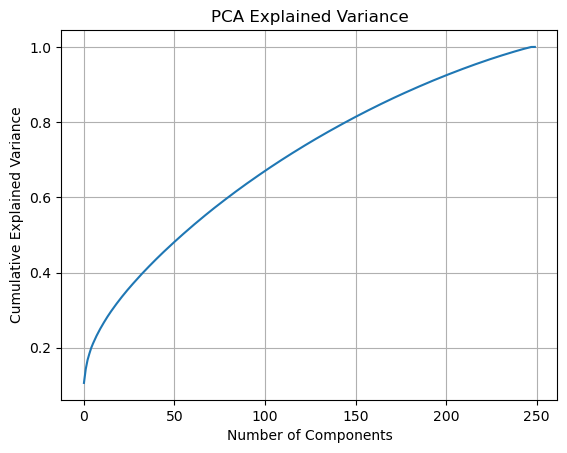

In [ ]:
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Cumulative explained variance
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Explained Variance")
plt.grid(True)
plt.show()


The plot is smooth and lacks a clear elbow, where there is no obvious point after which explained variance flattened. This behavior suggests that the information is spread across many principal components, which is typical in single cell data due to its sparcity and high variability. 
Hence, the decision was made to retain 100 principal components as a compromise between preserving a high proportion of total variance, and to avoid overfitting and noise from retaining too many dimensions. 

Following this, I conducted a Scree Plot with the first 100 PCs. This helps to allow us to see the variation of the explained variance across these PCs.

(100,)


<function matplotlib.pyplot.show(close=None, block=None)>

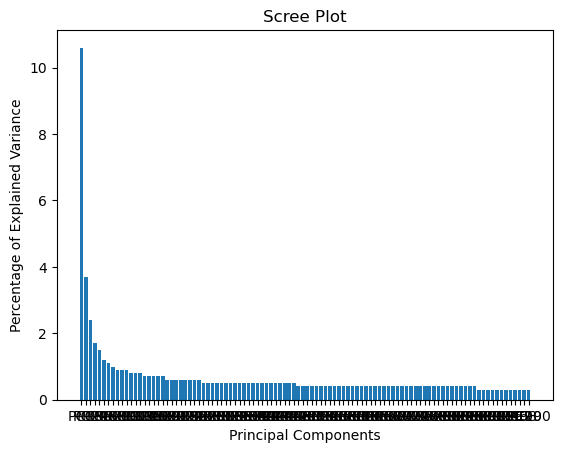

In [ ]:
per_var = np.round(pca.explained_variance_ratio_ * 100, decimals=1)
trimmed_arr = per_var[:100]
print(trimmed_arr.shape)
labels = ['PC' + str(x) for x in range(1, len(trimmed_arr) + 1)]
plt.bar(x=range(1, len(trimmed_arr) + 1), height=trimmed_arr, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Components')
plt.title('Scree Plot')
plt.show

The first principal component is responsible for 1bout 11% of the explained variance, following that the first 100 PCs cumulatively include about 66% of the explained variance. This is not ideal but it will be enough for our investigation. 

#### K-Means Inertia and Silhouette Analysis

After PCA, we apply KMeans clustering to the 100D representation. We use two metrics to select optimal number of clusters.

In [ ]:
pca = PCA(n_components=100)
X_pca_100 = pca.fit_transform(X_scaled)

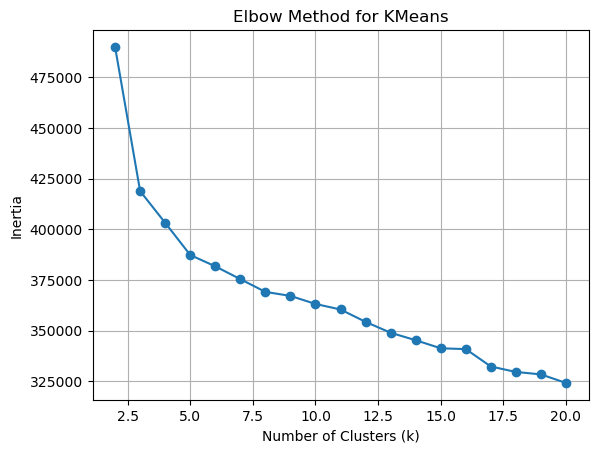

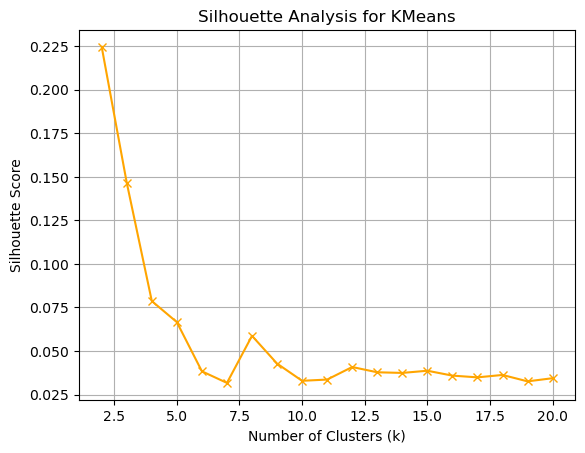

In [ ]:
inertia = []
sil_scores = []
k_values = list(range(2, 21)) 

for k in k_values:
    km = KMeans(n_clusters=k, random_state=42)
    labels_kmeans_train = km.fit_predict(X_pca_100)
    inertia.append(km.inertia_)
    sil_scores.append(silhouette_score(X_pca_100, labels_kmeans_train))

# Elbow Curve (inertia)
plt.plot(k_values, inertia, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method for KMeans")
plt.grid(True)
plt.show()

# Silhouette Scores
plt.plot(k_values, sil_scores, marker='x', color='orange')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Analysis for KMeans")
plt.grid(True)
plt.show()


Inertia measures the within-cluster sum of squared distances. A lower inertia means points are closer to cluster centers. We can observe a smooth decay without a clear elbow, hence no obvious point where adding clusters stopped reducing inertia significantly (possibly between k=2 and k=3). This implies that the data does not naturally form well-separated spherical clusters, which KMeans assumes.

The silhouette score quantifies how well each point fits within the cluster. Scores peak at k=2 with a score of 0.225, which is low. After k=4, silhouette scores dropped near zero, indicating poorly defined clusters.
Regardless, given these findings we will conduct a final KMeans with a parameter of k=2.

#### K-Means Unsupervised Model

In [ ]:
kmeans_2 = KMeans(n_clusters=2, random_state=42)
labels_kmeans_k2 = kmeans_2.fit_predict(X_pca_100)

kmeans_3 = KMeans(n_clusters=3, random_state=42)
labels_kmeans_k3 = kmeans_3.fit_predict(X_pca_100)

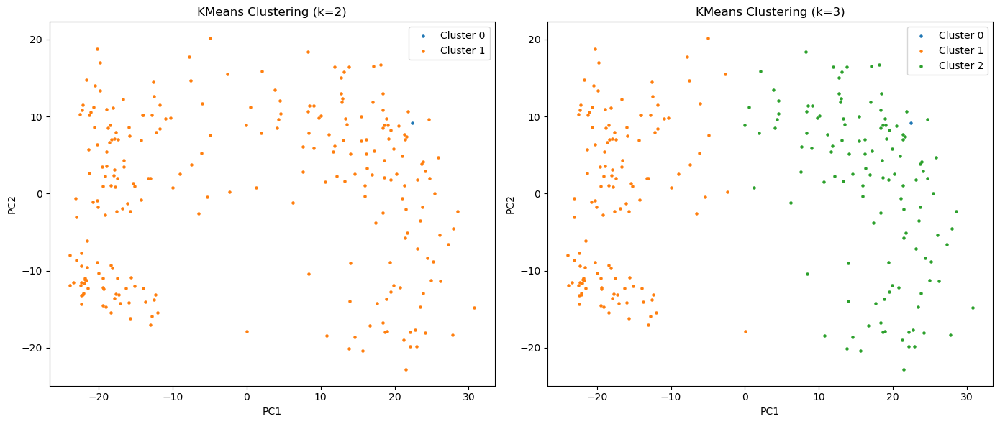

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
colors = plt.cm.tab10.colors  # color palette

# Plot for k=2
for cluster in np.unique(labels_kmeans_k2):
    axes[0].scatter(X_pca_100[labels_kmeans_k2 == cluster, 0],
                    X_pca_100[labels_kmeans_k2 == cluster, 1],
                    s=5, color=colors[cluster], label=f'Cluster {cluster}')
axes[0].set_title("KMeans Clustering (k=2)")
axes[0].set_xlabel("PC1")
axes[0].set_ylabel("PC2")
axes[0].legend()

# Plot for k=3
for cluster in np.unique(labels_kmeans_k3):
    axes[1].scatter(X_pca_100[labels_kmeans_k3 == cluster, 0],
                    X_pca_100[labels_kmeans_k3 == cluster, 1],
                    s=5, color=colors[cluster], label=f'Cluster {cluster}')
axes[1].set_title("KMeans Clustering (k=3)")
axes[1].set_xlabel("PC1")
axes[1].set_ylabel("PC2")
axes[1].legend()

plt.tight_layout()
plt.show()

When applying KMeans with k=2, the model isolated a single extreme point into its own cluster. This behavior stems from KMeans’ sensitivity to outliers and its objective to minimize intra-cluster variance. While mathematically valid, this partitioning is biologically uninformative. Increasing k to 3 separates the remaining data more naturally, though the singleton remains. This suggests the presence of a significant outlier or edge case in the dataset.

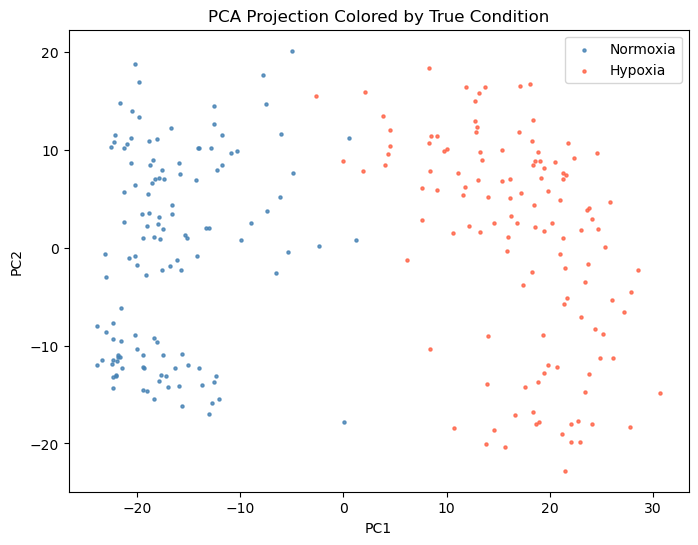

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Extract labels from column names
condition_labels = [
    "Hypoxia" if "Hypo" in col else "Normoxia" if "Norm" in col else "Unknown"
    for col in df.columns
]

# Create DataFrame to hold PCA and labels
pca_df = pd.DataFrame({
    'PC1': X_pca_100[:, 0],
    'PC2': X_pca_100[:, 1],
    'Condition': condition_labels
})

# Plot
plt.figure(figsize=(8, 6))
colors = {'Normoxia': 'steelblue', 'Hypoxia': 'tomato'}

for label in pca_df['Condition'].unique():
    subset = pca_df[pca_df['Condition'] == label]
    plt.scatter(subset['PC1'], subset['PC2'],
                c=colors[label], label=label, s=5, alpha=0.8)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Projection Colored by True Condition')
plt.legend()
plt.grid(False)
plt.show()


In the visualization of the original data, we can observe two main clusters, one on the left an done on the right. It's worthy to note that even though we chose k=3, we can only observe two main clusters. The two main clusters seem to be resonably separated. Compared to the correct data, it shares a similar structure, indicating that the model found clear separability between hypoxic and normoxic cells with regards to their genes.

#### Gaussian Mixture

Given the issue with the singleton cluster, I have chosen to conduct a Gaussian Mixture, which allows for soft clustering (working with probabilities instead of discrete classifications)

In [ ]:
from sklearn.mixture import GaussianMixture
gm = GaussianMixture(n_components=2, random_state=42)
gm_labels = gm.fit_predict(X_pca_100[:,:2])
gm.converged_

True

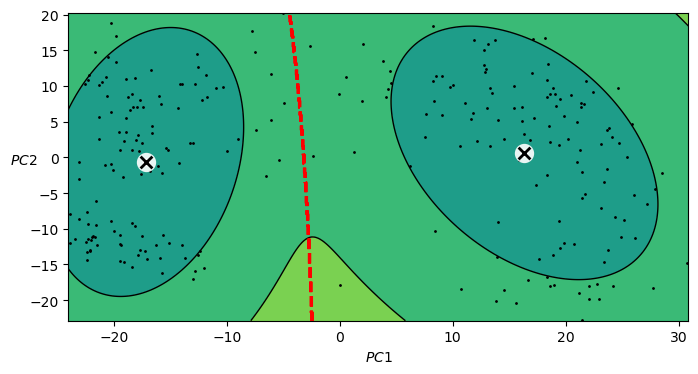

In [ ]:
from matplotlib.colors import LogNorm
def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=35, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=2, linewidths=12,
                color=cross_color, zorder=11, alpha=1)
    
def plot_gaussian_mixture(clusterer, X, resolution=1000, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = -clusterer.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z,
                 norm=LogNorm(vmin=1.0, vmax=30.0),
                 levels=np.logspace(0, 2, 12))
    plt.contour(xx, yy, Z,
                norm=LogNorm(vmin=1.0, vmax=30.0),
                levels=np.logspace(0, 2, 12),
                linewidths=1, colors='k')

    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contour(xx, yy, Z,
                linewidths=2, colors='r', linestyles='dashed')
    
    plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)
    plot_centroids(clusterer.means_, clusterer.weights_)

    plt.xlabel("$PC1$")
    if show_ylabels:
        plt.ylabel("$PC2$", rotation=0)
    else:
        plt.tick_params(labelleft=False)

plt.figure(figsize=(8, 4))

plot_gaussian_mixture(gm, X_pca_100)

plt.show()

After conducting the Gaussian Mixture, we can see the two clusters as we could see them previously with KMeans. it successfully captures the elliptical spread of the data in each cluster. This also solved our singleton cluster issue due to the more flexible nature of GMM.

#### Test and Accuracy Discussion

In [ ]:
# Align clusters to real classes
def align_clusters(preds, true_labels):
    aligned = np.zeros_like(preds)
    for cluster in np.unique(preds):
        mask = preds == cluster
        aligned[mask] = mode(true_labels[mask], keepdims=True).mode[0]
    return aligned

label_map = {'Normoxia': 0, 'Hypoxia': 1}
y_test_int = np.array([label_map[label] for label in condition_labels])

aligned_gmm_preds = align_clusters(gm_labels, y_test_int)

# Compute accuracy
acc_gmm = accuracy_score(y_test_int, aligned_gmm_preds)
print(f"GMM Test Set Accuracy: {acc_gmm:.2%}")


GMM Test Set Accuracy: 98.40%


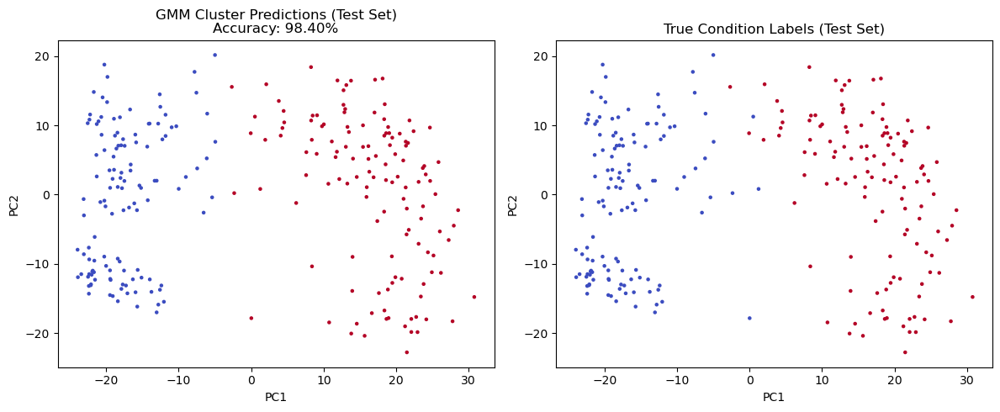

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(X_pca_100[:, 0], X_pca_100[:, 1],
            c=aligned_gmm_preds, cmap='coolwarm', s=5)
plt.title(f"GMM Cluster Predictions (Test Set)\nAccuracy: {acc_gmm:.2%}")
plt.xlabel("PC1")
plt.ylabel("PC2")

plt.subplot(1, 2, 2)
plt.scatter(X_pca_100[:, 0], X_pca_100[:, 1],
            c=y_test_int, cmap='coolwarm', s=5)
plt.title("True Condition Labels (Test Set)")
plt.xlabel("PC1")
plt.ylabel("PC2")

plt.tight_layout()
plt.show()


Following our testing, our GMM Model achieves a 98.4% accuracy score. This is a very satisfying result, thanks to the high separability of the data and the clear clustering generated by the genes between Hypoxic and Normoxic cells

#### Applying the Model to the Test Set

In [ ]:
df_test = pd.read_csv('./Data/SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt', sep="\s+", engine="python", index_col=0)
df_test.columns = df_test.columns.str.replace('"', '')
df_test.index = df_test.index.str.replace('"', '')

X_test = df_test.T
X_test_log = np.log1p(X_test)

X_test_scaled = scaler.transform(X_test_log)
X_test_pca = pca.transform(X_test_scaled)[:, :2]  # only use first 2 components for GMM


gmm_test_preds = gm.predict(X_test_pca)

# convert labels
reverse_label_map = {0: 'Normoxia', 1: 'Hypoxia'}

condition_labels = np.array(condition_labels)

# Find out which cluster corresponds to which label by majority vote using the training data
train_cluster_to_label = {}

for cluster in np.unique(gm_labels):
    labels_in_cluster = condition_labels[gm_labels == cluster]
    unique_labels, counts = np.unique(labels_in_cluster, return_counts=True)
    most_common = unique_labels[np.argmax(counts)]
    train_cluster_to_label[cluster] = most_common

# map test predictions accordingly
gmm_test_labels = [train_cluster_to_label[cluster] for cluster in gmm_test_preds]

# export
output_df = pd.DataFrame({
    'SampleID': X_test.index,
    'Condition': gmm_test_labels
})
output_df.to_csv("./Predictions/MCF7_SmartS_Test_Set_Predictions_UNSUP.txt", sep="\t", index=False)


<>:1: SyntaxWarning: invalid escape sequence '\s'
<>:1: SyntaxWarning: invalid escape sequence '\s'
/var/folders/jp/w8pf9g1n6p504nn18kl7rj900000gn/T/ipykernel_7336/154432647.py:1: SyntaxWarning: invalid escape sequence '\s'
  df_test = pd.read_csv('./Data/SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt', sep="\s+", engine="python", index_col=0)


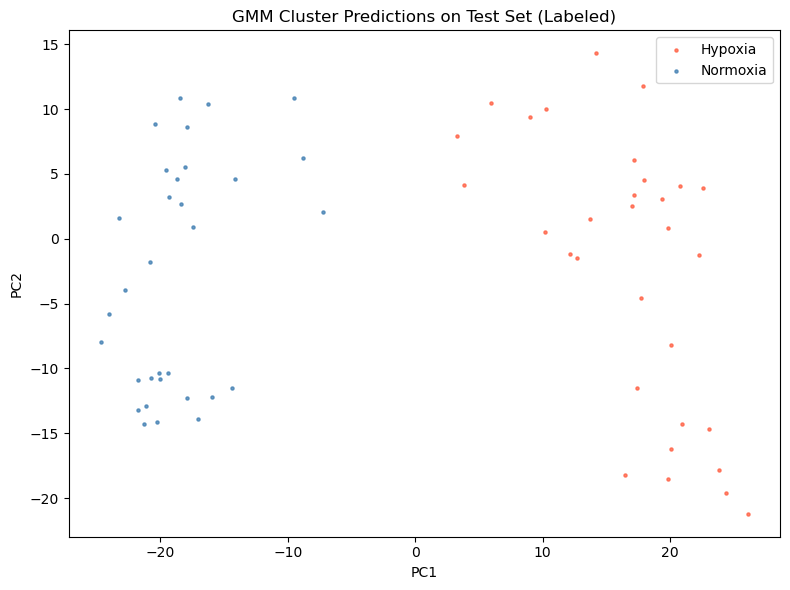

In [ ]:
test_pca_df = pd.DataFrame({
    'PC1': X_test_pca[:, 0],
    'PC2': X_test_pca[:, 1],
    'Predicted Condition': gmm_test_labels
})

# Plot
plt.figure(figsize=(8, 6))
colors = {'Normoxia': 'steelblue', 'Hypoxia': 'tomato'}

for label in test_pca_df['Predicted Condition'].unique():
    subset = test_pca_df[test_pca_df['Predicted Condition'] == label]
    plt.scatter(subset['PC1'], subset['PC2'],
                c=colors[label], label=label, s=5, alpha=0.8)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('GMM Cluster Predictions on Test Set (Labeled)')
plt.legend()
plt.grid(False)
plt.tight_layout()
plt.show()

The model was applied to the test set, giving the following visual above. It seems like the distribution of the data points in the test set is similar to the one in the training set, and the model predicts that the ones on the right are hypoxia and the left are normoxia, as in the training set. 

# SUPERVISED

# DropSeq HCC

## We will find the best model using supervised learning methods for the HCC1806 cell using the DropSeq method

In [ ]:
import sys
import sklearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib as mpl
from sklearn.decomposition import PCA
import time
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.ensemble import VotingClassifier


We import our data set and present a sample from it

In [ ]:
import pandas as pd

df = pd.read_csv("../DropSeq/HCC1806_Filtered_Normalised_3000_Data_train.txt", sep="\s+", engine="python",index_col=0)
print(df.head())
print(df.shape)

           "AAAAAACCCGGC_Normoxia"  "AAAACCGGATGC_Normoxia"  \
"H1-5"                           2                        2   
"MALAT1"                         3                        3   
"MT-RNR2"                        0                        0   
"ARVCF"                          0                        0   
"BCYRN1"                         0                        1   

           "AAAACGAGCTAG_Normoxia"  "AAAACTTCCCCG_Normoxia"  \
"H1-5"                           5                        1   
"MALAT1"                         2                        3   
"MT-RNR2"                        0                        0   
"ARVCF"                          0                        0   
"BCYRN1"                         1                        0   

           "AAAAGCCTACCC_Normoxia"  "AAACACAAATCT_Normoxia"  \
"H1-5"                           0                        0   
"MALAT1"                        12                        3   
"MT-RNR2"                        0                   

Firstly let's define our set X and target set y

In [ ]:
df_transposed = df.T
df = df_transposed
df['label'] = df.index.map(lambda name: 1 if 'Hypoxia' in name else 0)
X = df.drop(columns='label')
y = df['label']
y_numeric = y.values
y = y_numeric
print(X.shape)
print(y)

(14682, 3000)
[0 0 0 ... 1 1 1]


In [ ]:
normoxia_count = np.sum(y == 0)
hypoxia_count = np.sum(y == 1)

print(f"Normoxia (0) samples: {normoxia_count}")
print(f"Hypoxia (1) samples: {hypoxia_count}")


Normoxia (0) samples: 5783
Hypoxia (1) samples: 8899


We have around 1.5 times more of hypoxia samples than normoxia ones, which may be an issue which we will try to adress further on.

In [ ]:
print("Mean (per feature):", X.mean(axis=0)[:10])
print("Std dev (per feature):", X.std(axis=0)[:10])

Mean (per feature): "H1-5"       0.709372
"MALAT1"     1.899333
"MT-RNR2"    0.861327
"ARVCF"      0.001294
"BCYRN1"     1.038142
"ATXN7L2"    0.001498
"IGFBP3"     0.371067
"H1-3"       0.675862
"CTIF"       0.000613
"RNF123"     0.000613
dtype: float64
Std dev (per feature): "H1-5"       1.680187
"MALAT1"     2.790889
"MT-RNR2"    1.470822
"ARVCF"      0.047393
"BCYRN1"     1.634813
"ATXN7L2"    0.052176
"IGFBP3"     0.905313
"H1-3"       1.292052
"CTIF"       0.027366
"RNF123"     0.027366
dtype: float64


We can see that means and standard deviation sometimes vary significantly so we will probably need to perform standarization for PCA.

## PCA

In order to reduce the dimension of our dataset which is huge, we will perform PCA to make our models learn faster and easier, we will aim for keeping 95% of the variance. I will firstly explore PCA without scaling and then with scaling the dataset to check which one will be of a better use for us when working with real models.

### Non-scaled PCA

Let's first get a general idea of how applying general PCA will work on our dataset. 

In [ ]:
pca = PCA(n_components=0.95)
X_reduced = pca.fit_transform(X)

print(f"Original shape: {X.shape}")
print(f"Reduced shape: {X_reduced.shape}")
print(f"Total Explained Variance: {pca.explained_variance_ratio_.sum():.4f}")
print(f"Number of Components Retained: {pca.n_components_}")

Original shape: (14682, 3000)
Reduced shape: (14682, 844)
Total Explained Variance: 0.9500
Number of Components Retained: 844


Keeping 95% of the explained variance removed 2166 dimensions which is a lot of dimensions reduced. However, to make sure this is a good way to proceed and get more insights about the dimensions vs variance explained let's perform a graph:

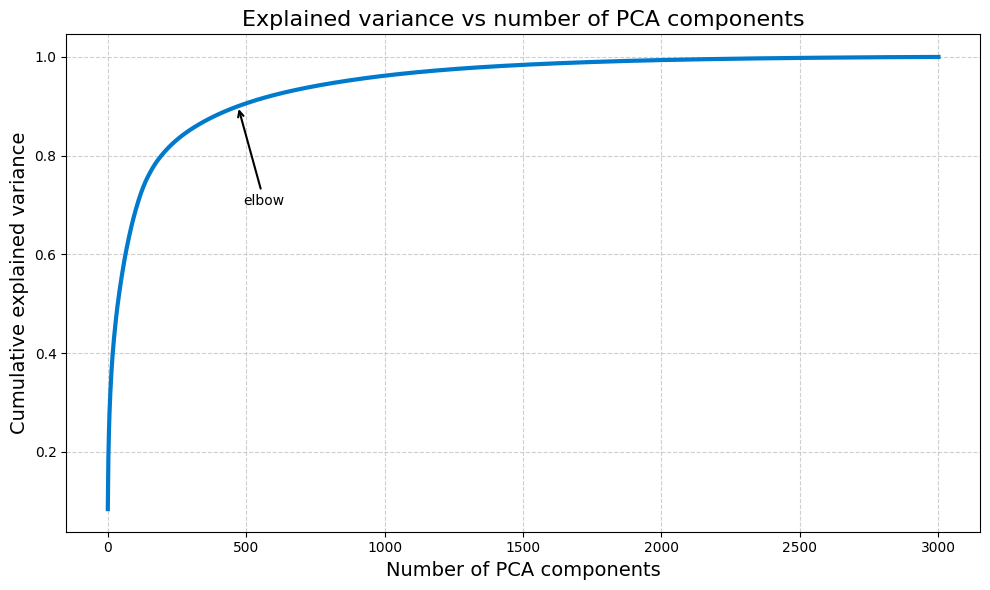

In [ ]:
pca_full = PCA().fit(X)

cumsum = np.cumsum(pca_full.explained_variance_ratio_)
dimensions = np.arange(1, len(cumsum) + 1)
elbow_point = np.argmax(cumsum >= 0.9) + 1

plt.figure(figsize=(10, 6))
plt.plot(dimensions, cumsum, linewidth=3, color="#007acc")
plt.annotate("elbow", xy=(elbow_point, 0.9), xytext=(elbow_point + 20, 0.7),
             arrowprops=dict(arrowstyle="->", color="black", linewidth=1.5))
plt.xlabel("Number of PCA components", fontsize=14)
plt.ylabel("Cumulative explained variance", fontsize=14)
plt.title("Explained variance vs number of PCA components", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

Based on the graph we can clearly see and elbow point for around 500 dimensions, so I will slightly move towards the elbow point and sacrifice couple of % in the variance explained, but reducing the dimension even more. We are retaining most of the useful information while ignoring the less important features by picking the elbow point. We can clearly see diminishing returns for adding more components than the elbow point suggests. But first let's see how number of components retained will result in the basic Random Forest model's accuracy score (we will look around 500 dimensions retained). I wanted to use cross validation to check the results, but this was too costly so I will just test it on one test split.

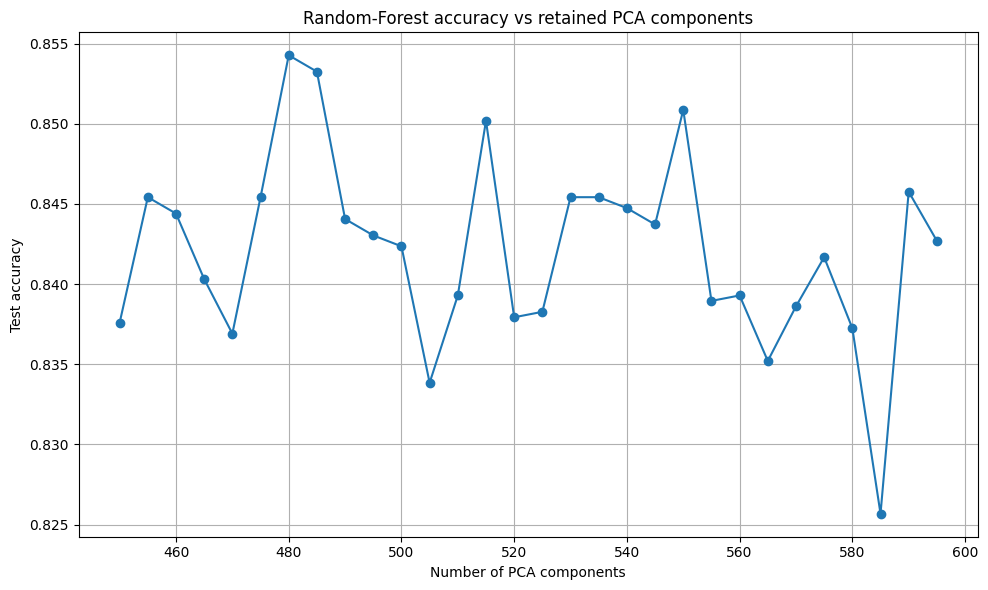

Best n_components = 480


In [ ]:
component_range = range(450, 600, 5)
accuracies = []
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

for n in component_range:
    pipe = Pipeline([
        ("pca", PCA(n_components=n, random_state=42)),
        ("rf",  RandomForestClassifier(n_estimators=20, random_state=42, n_jobs=-1))
    ])
    pipe.fit(X_train, y_train)
    acc = pipe.score(X_test, y_test)
    accuracies.append(acc)

plt.figure(figsize=(10, 6))
plt.plot(component_range, accuracies, marker="o")
plt.xlabel("Number of PCA components")
plt.ylabel("Test accuracy")
plt.title("Random-Forest accuracy vs retained PCA components")
plt.grid(True)
plt.tight_layout()
plt.show()

best_n = component_range[int(np.argmax(accuracies))]
print(f"Best n_components = {best_n}")

Optimal number of components to retain for non-scaled PCA seems to be 480, getting around 85.5% RF accuracy and around 91% of variance explained.

### Scaled PCA

Let's perform exactly the same steps, but using scaling before PCA.

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
pca = PCA(n_components=0.95)
X_reduced = pca.fit_transform(X_scaled)

print(f"Original shape: {X.shape}")
print(f"Reduced shape: {X_reduced.shape}")
print(f"Total Explained Variance: {pca.explained_variance_ratio_.sum():.4f}")
print(f"Number of Components Retained: {pca.n_components_}")

Original shape: (14682, 3000)
Reduced shape: (14682, 2592)
Total Explained Variance: 0.9501
Number of Components Retained: 2592


Much more components retained for 95% variance.

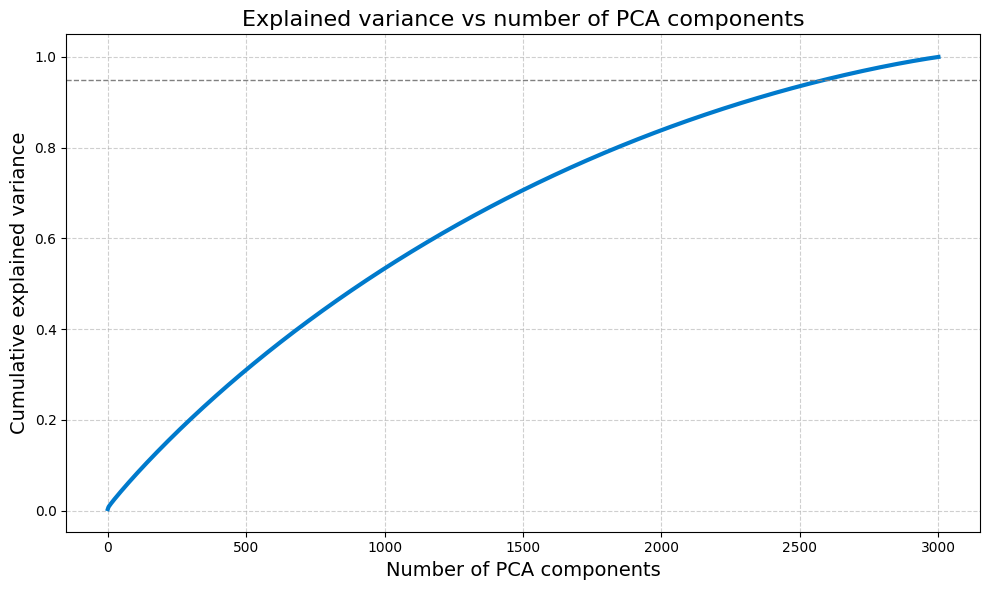

In [ ]:
pca_full = PCA().fit(X_scaled)

cumsum = np.cumsum(pca_full.explained_variance_ratio_)
dimensions = np.arange(1, len(cumsum) + 1)

plt.figure(figsize=(10, 6))
plt.plot(dimensions, cumsum, linewidth=3, color="#007acc")
plt.xlabel("Number of PCA components", fontsize=14)
plt.ylabel("Cumulative explained variance", fontsize=14)
plt.title("Explained variance vs number of PCA components", fontsize=16)
plt.axhline(0.95, color='gray', linestyle='--', linewidth=1)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

No clear elbow, we will look for around 95% of variance explained so around 2600 components retained.

[Pipeline] ................ (step 1 of 3) Processing sc, total=   0.3s
[Pipeline] ............... (step 2 of 3) Processing pca, total=  15.8s
[Pipeline] ................ (step 3 of 3) Processing rf, total=   1.8s
[Pipeline] ................ (step 1 of 3) Processing sc, total=   0.2s
[Pipeline] ............... (step 2 of 3) Processing pca, total=  15.5s
[Pipeline] ................ (step 3 of 3) Processing rf, total=   1.9s
[Pipeline] ................ (step 1 of 3) Processing sc, total=   0.2s
[Pipeline] ............... (step 2 of 3) Processing pca, total=  14.9s
[Pipeline] ................ (step 3 of 3) Processing rf, total=   1.8s
[Pipeline] ................ (step 1 of 3) Processing sc, total=   0.2s
[Pipeline] ............... (step 2 of 3) Processing pca, total=  15.2s
[Pipeline] ................ (step 3 of 3) Processing rf, total=   1.9s


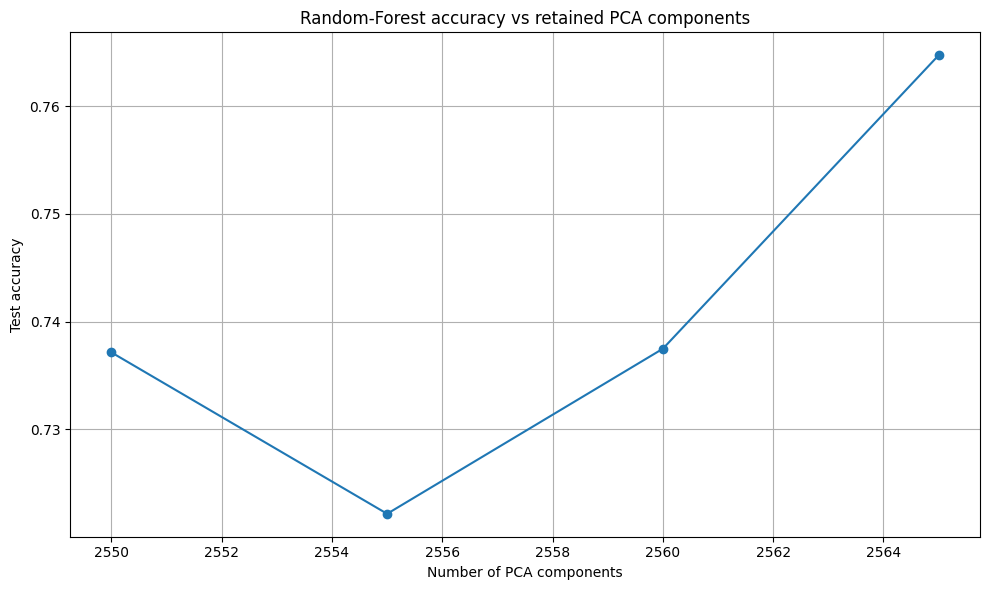

Best n_components = 2565


In [ ]:
component_range = range(2550,2570, 5)
accuracies = []
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

for n in component_range:
    pipe = Pipeline([
        ("sc", StandardScaler()),
        ("pca", PCA(n_components=n, random_state=42)),
        ("rf",  RandomForestClassifier(n_estimators=20, random_state=42, n_jobs=-1))
    ],verbose=True)
    pipe.fit(X_train, y_train)
    acc = pipe.score(X_test, y_test)
    accuracies.append(acc)

plt.figure(figsize=(10, 6))
plt.plot(component_range, accuracies, marker="o")
plt.xlabel("Number of PCA components")
plt.ylabel("Test accuracy")
plt.title("Random-Forest accuracy vs retained PCA components")
plt.grid(True)
plt.tight_layout()
plt.show()

best_n = component_range[int(np.argmax(accuracies))]
print(f"Best n_components = {best_n}")

We can see that scaled PCA works way worse for our dataset, way worse RF acurracy scores, keeps 2600 components for 95% of the variance explained which is a huge number. Our dataset is already normalised so this is may be the reason for that, but also unscaled PCA may work better for gene expression data because it prioritizes the high variance genes that often reflect biologically meaningful processes. I will stick with non-scaled PCA for the supervised learning as our dataset is built in that way that non-scaled is a better choice here. Let's note that our dataset dimension is not huge so there's no need to use incremental or randomized PCA's. The dimension number is high, but the real big number is the number of cells.

### Final PCA choice

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

pca_final = PCA(n_components=480, random_state=42)
X_train_pca = pca_final.fit_transform(X_train)
X_test_pca = pca_final.transform(X_test)

print(f"Original shape: {X.shape}")
print(f"Test shape after PCA: {X_train_pca.shape}")
print(f"Explained variance train set: {pca_final.explained_variance_ratio_.sum():.4f}")

Original shape: (14682, 3000)
Test shape after PCA: (11745, 480)
Explained variance train set: 0.9027


We kept 90% of the variance explained and 480 components using the non-scaled PCA version. Let's perform a check and see if our PCA turns out to be useful time-wise and accuracy wise when it comes to the Random forest model. Let's check using cross validation, but also single split and printing a classification report.

In [ ]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import classification_report
import time

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

rf_original = RandomForestClassifier(random_state=42)
scores_original = cross_val_score(rf_original, X, y, cv=cv, scoring="accuracy")
print(f"Original Data - CV Accuracy: {scores_original.mean():.4f} ± {scores_original.std():.4f}")

start_time = time.time()
rf_original.fit(X_train, y_train)
y_pred_original = rf_original.predict(X_test)
end_time = time.time()
print(f"\nClassification Report Original Data:")
print(f"Classification time: {end_time - start_time:.4f} seconds")
print(classification_report(y_test, y_pred_original))

rf_reduced = RandomForestClassifier(random_state=42)
scores_reduced = cross_val_score(rf_reduced, X_train_pca, y_train, cv=cv, scoring="accuracy")
print(f"PCA Data - CV Accuracy: {scores_reduced.mean():.4f} ± {scores_reduced.std():.4f}")

start_time = time.time()
rf_reduced.fit(X_train_pca, y_train)
y_pred_reduced = rf_reduced.predict(X_test_pca)
end_time = time.time()
print(f"\nClassification Report PCA Data:")
print(f"Classification time: {end_time - start_time:.4f} seconds")
print(classification_report(y_test, y_pred_reduced))

Original Data - CV Accuracy: 0.9327 ± 0.0027

Classification Report Original Data:
Classification time: 3.5932 seconds
              precision    recall  f1-score   support

           0       0.96      0.86      0.91      1157
           1       0.92      0.98      0.95      1780

    accuracy                           0.93      2937
   macro avg       0.94      0.92      0.93      2937
weighted avg       0.93      0.93      0.93      2937

PCA Data - CV Accuracy: 0.8631 ± 0.0073

Classification Report PCA Data:
Classification time: 19.8407 seconds
              precision    recall  f1-score   support

           0       0.93      0.74      0.82      1157
           1       0.85      0.96      0.90      1780

    accuracy                           0.88      2937
   macro avg       0.89      0.85      0.86      2937
weighted avg       0.88      0.88      0.87      2937



We can actually see that PCA not only reduced our accuracy score, but also the training time, both significantly. We can see consistent decreases in all classification metrics. This always may happen, but strongly suggests that we should stick with the original data instead of the PCA one for some models, at least Random Forest. However, we will check it for models used in future to make sure again, so we won't miss out on important simplifications.

## We are ready to train our models

## SGD

Let's first try with a binary classifier, precisely SGD model

In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
sgd_clf = SGDClassifier(random_state=42)
cv_scores = cross_val_score(sgd_clf, X_train, y_train, cv=cv, scoring="accuracy")
print(f"SGD Classifier (Original Data) - CV Accuracy: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")

sgd_clf.fit(X_train, y_train)
y_pred = sgd_clf.predict(X_test)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))

SGD Classifier (Original Data) - CV Accuracy: 0.9423 ± 0.0016

Test Accuracy: 0.9404153898535921

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.93      0.92      0.92      1157
     hypoxia       0.95      0.96      0.95      1780

    accuracy                           0.94      2937
   macro avg       0.94      0.94      0.94      2937
weighted avg       0.94      0.94      0.94      2937



SGD classifier didn't disappoint and provided a good accuracy score of 94%. We can see it gets better results when it comes to hypoxia rather than normoxia, but the difference is not huge so we can ignore it for now. 

Altough the results are very satysfying, let's make sure and check the model on the PCA reduced set to see the difference.

In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

sgd_clf_pca = SGDClassifier(random_state=42)
cv_scores = cross_val_score(sgd_clf_pca, X_train_pca, y_train, cv=cv, scoring="accuracy")
print(f"SGD Classifier (PCA-Reduced) - CV Accuracy: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")

sgd_clf_pca.fit(X_train_pca, y_train)
y_pred_sgd = sgd_clf_pca.predict(X_test_pca)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred_sgd))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_sgd, target_names=["normoxia", "hypoxia"]))

SGD Classifier (PCA-Reduced) - CV Accuracy: 0.9479 ± 0.0030

Test Accuracy: 0.9438202247191011

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.93      0.93      0.93      1157
     hypoxia       0.95      0.95      0.95      1780

    accuracy                           0.94      2937
   macro avg       0.94      0.94      0.94      2937
weighted avg       0.94      0.94      0.94      2937



We can actually see that PCA turned out to be useful for SGD model and we got better CV and single split scores along with faster training time. So we will proceed with the PCA model.

Now i will try to tune the model and find best set of parameters to improve the accuracy using Grid Search method. As I want to check couple of parameters, but this will take very long time, I introduced randomized search to pace up the search. I tried picking different options for different parameters and iterating through different once, but that set up enabled me to get the best results.

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, loguniform

param_dist = {
    'loss': ['hinge', 'log_loss', 'modified_huber', 'perceptron'],
    'alpha': loguniform(1e-6, 1e-3),
    'max_iter': [1000, 2000, 3000],
    'tol': loguniform(1e-4, 1e-2),
    'learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive'],
    'eta0': uniform(0.001, 0.1),
    'penalty': ['l2', 'l1', 'elasticnet'],
    'l1_ratio': uniform(0, 1)
}

random_search = RandomizedSearchCV(
    sgd_clf_pca,
    param_distributions=param_dist,
    n_iter=150,
    scoring="accuracy",
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    verbose=1,
    n_jobs=-1,
    random_state=42
)

random_search.fit(X_train_pca, y_train)
print("Best Parameters:", random_search.best_params_)
print("Best Cross-Validated Accuracy:", random_search.best_score_)
best_model = random_search.best_estimator_
y_pred_sgd_tuned = best_model.predict(X_test_pca)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred_sgd_tuned))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_sgd_tuned, target_names=["normoxia", "hypoxia"]))


Fitting 5 folds for each of 150 candidates, totalling 750 fits
Best Parameters: {'alpha': np.float64(0.00033639871159587913), 'eta0': np.float64(0.04597541333697657), 'l1_ratio': np.float64(0.3951502360018144), 'learning_rate': 'adaptive', 'loss': 'log_loss', 'max_iter': 3000, 'penalty': 'elasticnet', 'tol': np.float64(0.00015030900645056822)}
Best Cross-Validated Accuracy: 0.9538527032779905

Test Accuracy: 0.947565543071161

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.92      0.95      0.93      1157
     hypoxia       0.96      0.95      0.96      1780

    accuracy                           0.95      2937
   macro avg       0.94      0.95      0.95      2937
weighted avg       0.95      0.95      0.95      2937



As we can see, our general accuracy score improved by about 0.5%. Our final model's accuracy is about 95% and we are happy with that, so let's keep that model as a final result of our SGD model search. Let's save the best parameters we found and run the final model again with them for easier storage of the model.

In [ ]:
best_params = {
    'alpha': 5.104518230902804e-06,
    'eta0': 0.0266068322761324,
    'l1_ratio': 0.04043358953843135,
    'learning_rate': 'invscaling',
    'loss': 'modified_huber',
    'max_iter': 2000,
    'penalty': 'l1',
    'tol': 0.0007562632622090496,
    'random_state': 42
}

best_sgd_clf = SGDClassifier(**best_params)

best_sgd_clf.fit(X_train_pca, y_train)

y_pred = best_sgd_clf.predict(X_test_pca)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))


Test Accuracy: 0.9485869935308138

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.92      0.95      0.94      1157
     hypoxia       0.97      0.95      0.96      1780

    accuracy                           0.95      2937
   macro avg       0.94      0.95      0.95      2937
weighted avg       0.95      0.95      0.95      2937



Perfect, we have our best model obtained from SGD that is trained in only 0.3 seconds, now let's graph a confusion matrix diagram to gain more insights about how our model performed.

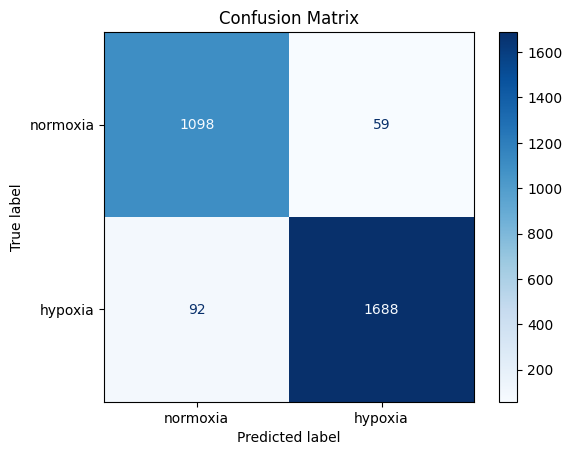

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred, labels=[0, 1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["normoxia", "hypoxia"])
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix")
plt.show()

We can indeed see a worse performance when it comes to normoxia results, but we need to keep in mind that we have around 1.5 times more hypoxia samples, so it is naturally easier for the model to perform better with hypoxia. Concluding we finish our SGD section with a model obtaining 94.96% accuracy, let's see if we can get a better result on a different model. Let's check how the model would perform using SMOTE oversampling method to see if this would be useful.

In [ ]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_pca_resampled, y_train_resampled = smote.fit_resample(X_train_pca, y_train)

sgd_clf_pca = SGDClassifier(random_state=42)
sgd_clf_pca.fit(X_train_pca_resampled, y_train_resampled)
y_pred_sgd = sgd_clf_pca.predict(X_test_pca)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred_sgd))

/Users/janekpetsch/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(



Test Accuracy: 0.9393939393939394


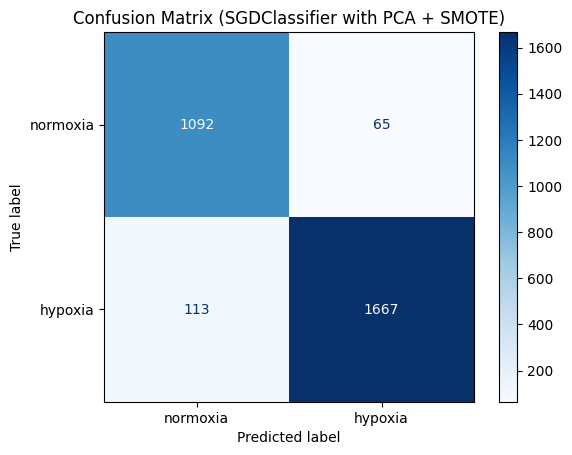

In [ ]:
cm = confusion_matrix(y_test, y_pred_sgd, labels=[0, 1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["normoxia", "hypoxia"])
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix (SGDClassifier with PCA + SMOTE)")
plt.show()

We got worse test accuracy with basiaclly the same class imbalance across results, so let's ignore SMOTE and stick with our original PCA SGD.

## Logistic regression

Let's see how logistic regression will perform on our dataset. I don't have high expectations as our data is high dimensional, and I am worried about the model not being precise at all or on the other hand overfit, but let's try to get the best out of it. First we ill try if PCA reduced dataset will work better with logistic regression as for logistic regression our dataset may contain to many components.

In [ ]:
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression(random_state=42)
log_reg.fit(X_train_pca, y_train)

y_pred = log_reg.predict(X_test_pca)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))


Test Accuracy: 0.9455226421518557

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.92      0.95      0.93      1157
     hypoxia       0.96      0.95      0.95      1780

    accuracy                           0.95      2937
   macro avg       0.94      0.95      0.94      2937
weighted avg       0.95      0.95      0.95      2937



To my suprise we obtained a very good accuracy score. This means we can work with logistic regression and try to get the best model out of it. Just to be sure let's try it on the original data without reductions, to confirm if indeed PCA was a good choice here.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

log_reg_original = LogisticRegression(max_iter=3000)
log_reg_original.fit(X_train, y_train)

y_pred = log_reg_original.predict(X_test)

print("Test Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))

Test Accuracy: 0.9465440926115083

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.92      0.95      0.93      1157
     hypoxia       0.97      0.94      0.96      1780

    accuracy                           0.95      2937
   macro avg       0.94      0.95      0.94      2937
weighted avg       0.95      0.95      0.95      2937



We obtained very similar accuracy scores and confusion matrices, but PCA set was better time wise. I also wanted to be consistent with picking PCA for SGD so I picked PCA for logistic regression model too.

My little concern was overfitting so to make sure we didn't overfit let's double check it using cross validation and this time let's use pipeline.

In [ ]:
from sklearn.pipeline import Pipeline

pipe = Pipeline([
    ("pca", PCA(n_components=480, random_state=42)),
    ("clf", LogisticRegression(random_state=42))
])

for k in [5, 10]:
    cv = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
    scores = cross_val_score(pipe, X, y, cv=cv, scoring="accuracy")
    print(f"CV={k}, Scores: {scores}")
    print(f"CV={k}, Average Accuracy: {scores.mean():.4f}")

CV=5, Scores: [0.95131086 0.95301328 0.95470027 0.95470027 0.95027248]
CV=5, Average Accuracy: 0.9528
CV=10, Scores: [0.94213751 0.96596324 0.96185286 0.95027248 0.95844687 0.95027248
 0.95435967 0.96049046 0.94686649 0.95572207]
CV=10, Average Accuracy: 0.9546


We can see consistent performance results, so we don't need to be scared about significant overfitting with out model. Now let's try to tune the model and get the best out of it by using grid seach and interating through different parameters combination as with the SGD model.

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from scipy.stats import uniform, loguniform

param_dist = [
    {
        "penalty": ["l1", "l2"],
        "C": loguniform(1e-4, 1e2),
        "solver": ["liblinear", "saga"],
        "tol": loguniform(1e-4, 1e-2),
        "class_weight": [None, "balanced"],
    },
    {
        "penalty": ["elasticnet"],
        "C": loguniform(1e-4, 1e2),
        "solver": ["saga"],
        "l1_ratio": uniform(0, 1), 
        "tol": loguniform(1e-4, 1e-2),
        "class_weight": [None, "balanced"],
    }
]

random_search = RandomizedSearchCV(
    LogisticRegression(random_state=42, max_iter=5000),
    param_distributions=param_dist,
    n_iter=120,
    scoring="accuracy",
    cv=3,
    verbose=1,
    random_state=42
)

random_search.fit(X_train_pca, y_train)

best_log_reg = random_search.best_estimator_
print("\nBest Parameters:", random_search.best_params_)
print("\nBest Cross-Validated Accuracy:", random_search.best_score_)

y_pred = best_log_reg.predict(X_test_pca)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))


Fitting 3 folds for each of 120 candidates, totalling 360 fits

Best Parameters: {'C': np.float64(0.4676478725076048), 'class_weight': None, 'l1_ratio': np.float64(0.43194501864211576), 'penalty': 'elasticnet', 'solver': 'saga', 'tol': np.float64(0.0003823475224675188)}

Best Cross-Validated Accuracy: 0.9520647083865476

Test Accuracy: 0.9489274770173647

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.93      0.95      0.94      1157
     hypoxia       0.96      0.95      0.96      1780

    accuracy                           0.95      2937
   macro avg       0.95      0.95      0.95      2937
weighted avg       0.95      0.95      0.95      2937



We achieved a 94.89 % accuracy which is a small improvement and from now one we will use this model with our new parameters. Let's take a final look at our final model obtained from logistic regression method.


Test Accuracy: 0.9489274770173647

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.93      0.95      0.94      1157
     hypoxia       0.96      0.95      0.96      1780

    accuracy                           0.95      2937
   macro avg       0.95      0.95      0.95      2937
weighted avg       0.95      0.95      0.95      2937



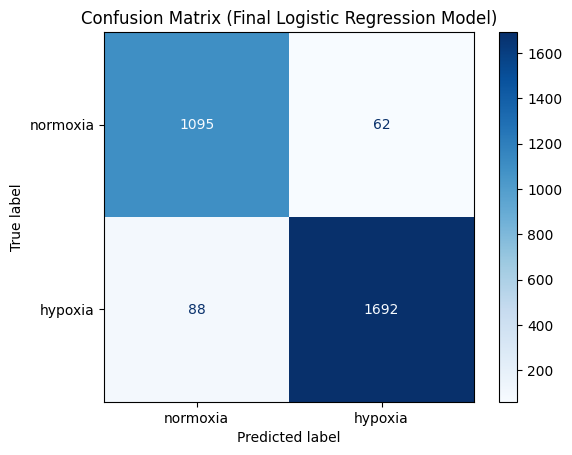

In [ ]:
final_log_reg = LogisticRegression(
    C=0.4676478725076048,
    class_weight=None,
    l1_ratio=0.43194501864211576,
    penalty="elasticnet",
    solver="saga",
    tol=0.0003823475224675188,
    max_iter=5000,
    random_state=42
)

final_log_reg.fit(X_train_pca, y_train)

y_pred = final_log_reg.predict(X_test_pca)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["normoxia", "hypoxia"])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix (Final Logistic Regression Model)")
plt.show()

Our logistic regression model performs better than the SGD one obtaining 95% accuracy.

## Random forest

As our data is high dimensional and there are many samples, let's already move to random forest method instead of trying single decision trees. In the PCA section we already saw that our PCA reduced data works really badly with random forest so we will stick with the original data. 

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

rf_model = RandomForestClassifier(random_state=42)

rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))


Test Accuracy: 0.9329247531494722

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.96      0.86      0.91      1157
     hypoxia       0.92      0.98      0.95      1780

    accuracy                           0.93      2937
   macro avg       0.94      0.92      0.93      2937
weighted avg       0.93      0.93      0.93      2937



We got a 93.29% accuracy score and will try to use grid search to optimise it and explore different parameters.

In [ ]:
from scipy.stats import randint

param_dist = {
    'n_estimators': randint(50, 300),
    'max_depth': [None,10,2040],
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 10),

}

random_search = RandomizedSearchCV(
    RandomForestClassifier(random_state=42),
    param_distributions=param_dist,
    n_iter=30,
    scoring="accuracy",
    cv=3,
    verbose=1,
    random_state=42
)

random_search.fit(X_train, y_train)
best_rf_model = random_search.best_estimator_
print("\nBest Parameters:", random_search.best_params_)
print("\nBest Cross-Validated Accuracy:", random_search.best_score_)
y_pred = best_rf_model.predict(X_test)
print("\nTest Accuracy:", accuracy_score(y_test, y_pred))

Fitting 3 folds for each of 30 candidates, totalling 90 fits

Best Parameters: {'max_depth': 2040, 'min_samples_leaf': 3, 'min_samples_split': 13, 'n_estimators': 104}

Best Cross-Validated Accuracy: 0.928395061728395

Test Accuracy: 0.9247531494722506


After trying different combinations of parameters and spending some time to test them, I finally came up with the best set I could get and our new tuned up model looks like that:

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

rf_model = RandomForestClassifier(
    max_depth=40,
    n_estimators=200,
    min_samples_split=2,
    min_samples_leaf=1,
    bootstrap=False,
    max_features='sqrt',
    random_state=42
)

rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))


Test Accuracy: 0.9387129724208376

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.97      0.87      0.92      1157
     hypoxia       0.92      0.98      0.95      1780

    accuracy                           0.94      2937
   macro avg       0.95      0.93      0.93      2937
weighted avg       0.94      0.94      0.94      2937



We managed to get 93,87% accuracy score which is still significantly less that for the logistic model by more than 1%, but still it is a good score. Logistic regressions turned out to be of a better use for our dataset here. Let's conclude this section by plotting a confusion matrix to see the differences for our RF final model and move to further exploration.

<Figure size 800x600 with 0 Axes>

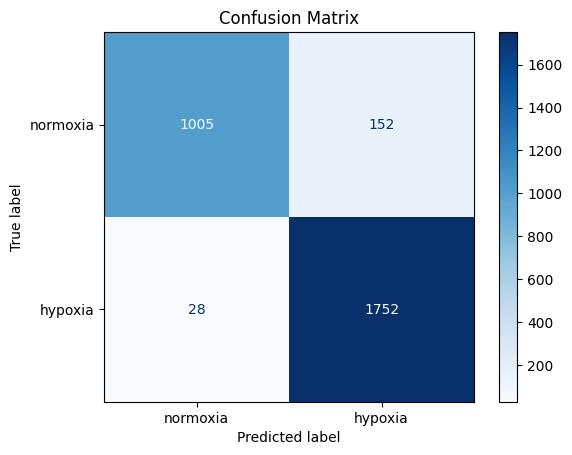

In [ ]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["normoxia", "hypoxia"])
plt.figure(figsize=(8, 6))
disp.plot(cmap="Blues", values_format="d")
plt.title("Confusion Matrix")
plt.show()

## Kernel SVM

We move on to our final model - SVM using the kernel trick. This may turn out to be the best model as it can detect more advanced patterns in our data. Let's try the standard one first on the original data and then on the PCA reduced data.

In [ ]:
from sklearn.svm import SVC

svm_rbf_original = SVC(kernel='rbf', random_state=42)
svm_rbf_original.fit(X_train, y_train)
y_pred = svm_rbf_original.predict(X_test)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))


Test Accuracy: 0.9564181137214846

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.94      0.95      0.94      1157
     hypoxia       0.97      0.96      0.96      1780

    accuracy                           0.96      2937
   macro avg       0.95      0.96      0.95      2937
weighted avg       0.96      0.96      0.96      2937



In [ ]:
from sklearn.svm import SVC

svm_rbf = SVC(kernel='rbf', random_state=42)
svm_rbf.fit(X_train_pca, y_train)

y_pred = svm_rbf.predict(X_test_pca)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))


Test Accuracy: 0.9557371467483827

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.94      0.95      0.94      1157
     hypoxia       0.97      0.96      0.96      1780

    accuracy                           0.96      2937
   macro avg       0.95      0.95      0.95      2937
weighted avg       0.96      0.96      0.96      2937



The original data kernel SVM achieved our highest accuracy score - 95.6% as for now compared to any model, but the training time was relatively high. Hence, let's stick with the PCA one which got a very similar accuracy score and check for overfitting using cross validation. 

In [ ]:
pipe = Pipeline([
    ("clf", SVC(kernel='rbf', random_state=42))
])

for k in [5, 10]:
    cv = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
    scores = cross_val_score(pipe, X_train_pca, y_train, cv=cv, scoring="accuracy")
    print(f"CV={k}, Scores: {scores}")
    print(f"CV={k}, Average Accuracy: {scores.mean():.4f}")

CV=5, Scores: [0.95828012 0.95402299 0.96126011 0.951043   0.95870583]
CV=5, Average Accuracy: 0.9567
CV=10, Scores: [0.95489362 0.96170213 0.95404255 0.95234043 0.95659574 0.96337308
 0.95570698 0.95144804 0.95741056 0.96081772]
CV=10, Average Accuracy: 0.9568


Looks fine, no everfitting sign based on those results. Let's try to tune up the model even more using grid search.

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'kernel': ['linear', 'rbf', 'poly'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto', 0.01],
}

grid_search = GridSearchCV(
    SVC(random_state=42),
    param_grid=param_grid,
    scoring='accuracy',
    cv=3,
    verbose=1,
)

grid_search.fit(X_train_pca, y_train)
best_svm_rbf = grid_search.best_estimator_

print("\nBest Parameters:", grid_search.best_params_)
print("Best Cross-Validated Accuracy:", grid_search.best_score_)
y_pred = best_svm_rbf.predict(X_test_pca)
print("\nTest Accuracy:", accuracy_score(y_test, y_pred))

Fitting 3 folds for each of 27 candidates, totalling 81 fits

Best Parameters: {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}
Best Cross-Validated Accuracy: 0.9591315453384418

Test Accuracy: 0.9574395641811372


Our final kernel SVM model obtaining 95.74%.


Test Accuracy: 0.9574395641811372

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.94      0.96      0.95      1157
     hypoxia       0.97      0.96      0.96      1780

    accuracy                           0.96      2937
   macro avg       0.95      0.96      0.96      2937
weighted avg       0.96      0.96      0.96      2937



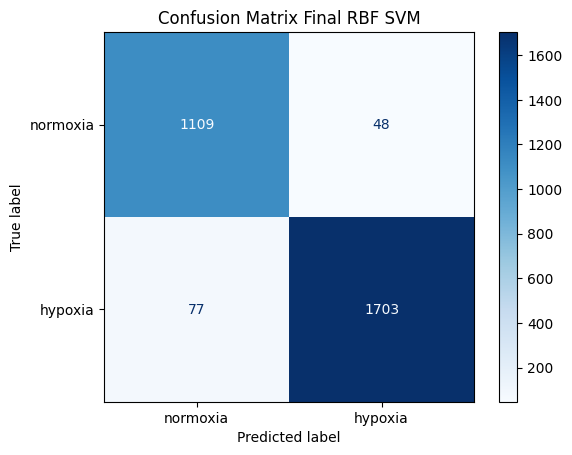

In [ ]:
final_svm_rbf = SVC(
    kernel='rbf',
    C=10,
    gamma='auto',
    class_weight=None,
    random_state=42
)
final_svm_rbf.fit(X_train_pca, y_train)
y_pred = final_svm_rbf.predict(X_test_pca)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))
cm = confusion_matrix(y_test, y_pred, labels=[0, 1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["normoxia", "hypoxia"])
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix Final RBF SVM")
plt.show()

## Ensemble learning

Let's try the majority voting method using soft voting and hard voting and pick the best one for our model. I will not include the RF model as it was the only model not trained on the PCA reduced dataset, because it was getting very bad results.

In [ ]:
from sklearn.ensemble import VotingClassifier

estimators = [
    ('sgd', best_sgd_clf),
    ('log_reg', final_log_reg),
    ('svm_rbf', final_svm_rbf)
]

voting_clf = VotingClassifier(
    estimators=estimators,
    voting='hard'
)

voting_clf.fit(X_train_pca, y_train)
y_pred = voting_clf.predict(X_test_pca)
print("\nTest Accuracy:", accuracy_score(y_test, y_pred))


Test Accuracy: 0.95097037793667


We got 95% from hard voting without using PCA, which is worse accuracy score than for our kernel SVM alone. Let's try soft voting.

In [ ]:
final_svm_rbf = SVC(kernel='rbf', C=10, gamma='auto', class_weight=None, probability=True, random_state=42)
final_svm_rbf.fit(X_train_pca, y_train)

soft_voting_clf = VotingClassifier(
    estimators=[
        ('sgd', best_sgd_clf),
        ('log_reg', final_log_reg),
        ('svm_rbf', final_svm_rbf),
    ],
    voting='soft',
)

soft_voting_clf.fit(X_train_pca, y_train)
y_pred = soft_voting_clf.predict(X_test_pca)
print("\nTest Accuracy:", accuracy_score(y_test, y_pred))


Test Accuracy: 0.9550561797752809


The soft voting accuracy is high, but didn't beat the kernel SVM's one. Kernel one got 95.7% while soft voting one got 95.5%. However, the accuracy scores are so close to each other that I decided to perform a comprehensive comparison of both models using cross validation and couple of important metrics:

Soft Voting model
              precision    recall  f1-score   support

    normoxia       0.95      0.95      0.95      4626
     hypoxia       0.97      0.97      0.97      7119

    accuracy                           0.96     11745
   macro avg       0.96      0.96      0.96     11745
weighted avg       0.96      0.96      0.96     11745



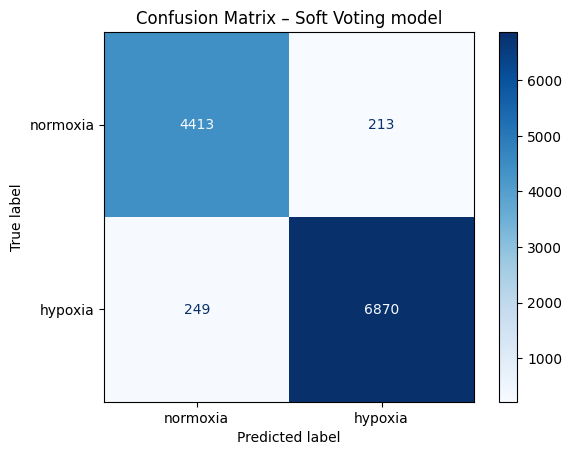

RBF SVM model
              precision    recall  f1-score   support

    normoxia       0.95      0.95      0.95      4626
     hypoxia       0.97      0.97      0.97      7119

    accuracy                           0.96     11745
   macro avg       0.96      0.96      0.96     11745
weighted avg       0.96      0.96      0.96     11745



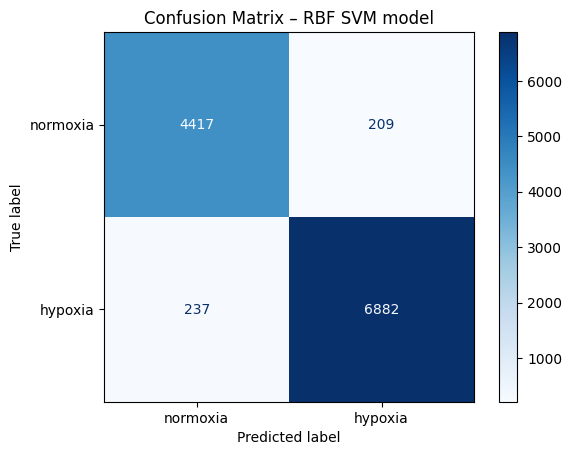

,CV Accuracy,CV Precision,CV Recall,CV F1
Model,,,,
Soft Voting model,0.961,0.970,0.965,0.967
RBF SVM model,0.962,0.971,0.967,0.969


In [ ]:
from sklearn.model_selection import StratifiedKFold, cross_val_predict, cross_val_score
from sklearn.base import clone

svm_rbf_cv = clone(final_svm_rbf)
soft_vote_cv = clone(soft_voting_clf)

models = {
    "Soft Voting model": soft_vote_cv,
    "RBF SVM model": svm_rbf_cv
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
records = []

for name, mdl in models.items():
    print(name)

    oof_pred = cross_val_predict(
        mdl, X_train_pca, y_train,
        cv=cv, n_jobs=-1, method="predict"
    )

    print(classification_report(
        y_train, oof_pred, target_names=["normoxia", "hypoxia"]
    ))

    cm = confusion_matrix(y_train, oof_pred, labels=[0, 1])
    ConfusionMatrixDisplay(
        confusion_matrix=cm,
        display_labels=["normoxia", "hypoxia"]
    ).plot(cmap="Blues", values_format="d")
    plt.title(f"Confusion Matrix – {name}")
    plt.show()

    records.append({
        "Model":     name,
        "CV Accuracy": cross_val_score(mdl, X_train_pca, y_train, cv=cv, scoring="accuracy").mean(),
        "CV Precision": cross_val_score(mdl, X_train_pca, y_train, cv=cv, scoring="precision").mean(),
        "CV Recall": cross_val_score(mdl, X_train_pca, y_train, cv=cv, scoring="recall").mean(),
        "CV F1": cross_val_score(mdl, X_train_pca, y_train, cv=cv, scoring="f1").mean(),
    })

summary_df = (pd.DataFrame(records)
              .set_index("Model")
              .round(3))
display(summary_df.style.format("{:.3f}"))

Clearly we can see that our Kernel model performs better considering each metric we checked. We will pick it as our final model:

In [ ]:
final_svm_rbf = SVC(kernel='rbf',C=10,gamma='auto',class_weight=None,random_state=42)
final_svm_rbf.fit(X_train_pca, y_train)
y_pred = final_svm_rbf.predict(X_test_pca)
print("\nTest Accuracy:", accuracy_score(y_test, y_pred))


Test Accuracy: 0.9574395641811372


We conclude the DropSeq HCC1806 supervised learning section with a model obtaining 95.74% accuracy score, mainly model obtaining using Kernel SVM method with following parameters:
- kernel='rbf'   
- C=10   
- gamma='auto'   
- class_weight=None   

### Comparison with classifiers from other datasets

Now we will compare how classifiers found as most optimal ones in other datasets will perform on our dataset. For comparisons I will call our best rbf kernel SVM model from this dataset a "original final model" which obtained 95.74% accuracy score.

Let's start with comparing the best model for the same cell line - HCC1806, but extracted using different technology - SmartSeq:

In [ ]:
svm_model = SVC(C=3, gamma='scale', kernel='rbf')
svm_model.fit(X_train_pca, y_train)

y_pred = svm_model.predict(X_test_pca)

print("\nFinal Test Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, digits=3))


Final Test Accuracy: 0.9557371467483827
              precision    recall  f1-score   support

           0      0.937     0.952     0.944      1157
           1      0.968     0.958     0.963      1780

    accuracy                          0.956      2937
   macro avg      0.953     0.955     0.954      2937
weighted avg      0.956     0.956     0.956      2937



We got an accuracy score 95.57% which is lower, but close to our original final model from this section. Different technology didn't disable us to obtain a good model even for this dataset. Now let's try the model obtained from different cell line - MCF7, but the same technology - DropSeq.

In [ ]:
logreg = LogisticRegression(
    penalty='l1', C=0.0992, solver='liblinear', fit_intercept=True,
    tol=0.00363, max_iter=1070, class_weight='balanced', random_state=42
)

rf = RandomForestClassifier(
    n_estimators=184, criterion='gini', max_features=0.05,
    min_samples_split=20, min_samples_leaf=5,
    class_weight='balanced', random_state=42
)

sgd = SGDClassifier(
    loss='log_loss', penalty='l2', max_iter=1000, alpha=0.0254,
    l1_ratio=0.169, fit_intercept=True, early_stopping=False,
    class_weight='balanced', random_state=42
)

svm = SVC(
    kernel='rbf', C=1, gamma='scale',
    probability=True, class_weight='balanced', random_state=42
)

for clf in (logreg, rf, sgd, svm):
    clf.fit(X_train_pca, y_train)

softvote = VotingClassifier(
    estimators=[('lr', logreg),
               ('rf', rf),
               ('sgd', sgd),
               ('svm', svm)],
    voting='soft'
).fit(X_train_pca, y_train)

y_pred = softvote.predict(X_test_pca)

print(f"Test accuracy (soft vote): {accuracy_score(y_test, y_pred)}\n")
print(classification_report(y_test, y_pred, digits=3))

Test accuracy (soft vote): 0.9536942458290772

              precision    recall  f1-score   support

           0      0.926     0.959     0.942      1157
           1      0.973     0.950     0.961      1780

    accuracy                          0.954      2937
   macro avg      0.949     0.955     0.952      2937
weighted avg      0.954     0.954     0.954      2937



We again got a very good score, very similar to our original final model, but still slightly lower. Different cell line proved to not disable us from finding a good general model for another cell line. Now let's use the final model obtained from different technology method - SmartSeq and different cell line - MCF7.

In [ ]:
svmmodel = SVC(
    kernel='rbf',
    C=1,
    gamma='scale',
    probability=True,
    class_weight='balanced',
    random_state=42
)

svmmodel.fit(X_train_pca, y_train)
y_pred = svmmodel.predict(X_test_pca)

print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Accuracy: 0.9533537623425263
              precision    recall  f1-score   support

           0       0.93      0.96      0.94      1157
           1       0.97      0.95      0.96      1780

    accuracy                           0.95      2937
   macro avg       0.95      0.95      0.95      2937
weighted avg       0.95      0.95      0.95      2937



Again a very good accuracy score. We can see that all of the models used in other datasets as the best ones, also obtained very good accuracy scores in out dataset, no one beat our final model from this dataset which got 95.74% accuracy score, but all 3 of them got more than 95% which is impresive. Thus, the models turned out to be useful across the datasets here. We can reason that the patterns across datasets are similar enough to obtain similar models for all of them.

### Picking the most consistent models across all datasets for supervised learning.

Now let's do a final comparison which model turned out to get the best average result across all datasets:

| Dataset | Score 1 | Score 2 | Score 3 | Score 4 | Average |
|-------------------------|-----------|-----------|-----------|-----------|-----------|
| HCC1806 Drop-seq        | 0.9574 | 0.6214 | 0.9600 | 0.5405 | 0.7698 |
| HCC1806 Smart-seq   | 0.9557 | 0.9801 | 0.9800 | 1.0000 | 0.9790 |
| MCF7 Drop-seq           | 0.9792 | 0.9800 | 0.9537 | 0.9780 | 0.9727 |
| MCF7 Smart-seq          | 0.9534 | 0.9459 | 0.9785 | 0.9800 | 0.9645 |

Thus we can conclude that the HCC1806 SmartSeq model is the most consistent with its results across all datasets and pick it as the best universal final model.

SVM model with following parameters:  
- C=3   
- gamma='scale'  
- kernel='rbf'  

### Prediction

We will now predict the labels of the anonim dataset using our best model - SVM rbf kernel.

In [ ]:
from pathlib import Path
import csv, re

df = (pd.read_csv("../DropSeq/HCC1806_Filtered_Normalised_3000_Data_test_anonim.txt",
                  sep=r"\s+|,|\t", engine="python", index_col=0)
        .T)                        

X_drop_pca = pca_final.transform(df)

y_pred_num = final_svm_rbf.predict(X_drop_pca).astype(int)

label_map  = {0: "Normoxia", 1: "Hypoxia"}
y_pred_txt = np.vectorize(label_map.get)(y_pred_num)

clean_ids  = (df.index.astype(str)
                     .str.replace(r"[\"']", "", regex=True)
                     .str.strip())

out_df = pd.DataFrame({0: clean_ids, 1: y_pred_txt})

out_df.to_csv("HCC_DROPSEQ_FINAL_PREDICTIONS.txt",
              sep='\t',
              header=False,
              index=False,
              quoting=csv.QUOTE_NONE)

# SmartSeq HCC

## We will find the best model using supervised learning methods for the HCC1806 cell using the SmartS method

In [ ]:
import sys
import sklearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib as mpl
from sklearn.decomposition import PCA
import time
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import VotingClassifier




Let's import our dataset and check it out.

In [ ]:
import pandas as pd

df = pd.read_csv('../SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt', sep="\s+", engine="python",index_col=0)
print(df.head())
print(df.shape)

           "output.STAR.PCRPlate1G12_Normoxia_S32_Aligned.sortedByCoord.out.bam"  \
"DDIT4"                                                    0                       
"ANGPTL4"                                                 48                       
"CALML5"                                                   0                       
"KRT14"                                                  321                       
"CCNB1"                                                  298                       

           "output.STAR.PCRPlate1G1_Hypoxia_S102_Aligned.sortedByCoord.out.bam"  \
"DDIT4"                                                 8739                      
"ANGPTL4"                                               2101                      
"CALML5"                                                  55                      
"KRT14"                                                   96                      
"CCNB1"                                                 1824                    

We can see that our sample count is not too big, it's only 182.

Firstly let's define our set X and target set y.

In [ ]:
df_transposed = df.T
df = df_transposed
df['label'] = df.index.map(lambda name: 1 if 'Hypoxia' in name else 0)
X = df.drop(columns='label')
y = df['label']
y_numeric = y.values
y = y_numeric
print(X.shape)
print(y)

(182, 3000)
[0 1 1 1 1 0 0 0 1 1 1 1 0 0 1 1 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 1 1 1 1 0 0
 0 1 1 1 1 0 0 0 1 1 1 1 0 0 0 0 1 1 1 1 1 0 0 0 1 1 0 0 0 0 0 1 1 1 1 0 0
 0 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1 1 0 0 1 1 0 0 0 1 1 1 1 1 0 0 0
 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 0 0 0 1 1 1 1 1 0 0 1 1 0 0 0 0 0 0 1 1 1 0
 0 0 0 1 1 1 1 0 0 0 0 1 1 1 0 0 0 1 1 1 1 0 0 0 0 1 1 1 0 0 0 1 0 0]


In [ ]:
normoxia_count = np.sum(y == 0)
hypoxia_count = np.sum(y == 1)

print(f"Normoxia (0) samples: {normoxia_count}")
print(f"Hypoxia (1) samples: {hypoxia_count}")


Normoxia (0) samples: 85
Hypoxia (1) samples: 97


The number of both samples is rather symmetrical which is good for learning the models.

## PCA

### Non scaled PCA

Our dimension number is not very high, but let's do a standard procedure and compute our PCA reduced set and see how will it look like.

In [ ]:
pca = PCA(n_components=0.95)
X_reduced = pca.fit_transform(X)

print(f"Original shape: {X.shape}")
print(f"Reduced shape: {X_reduced.shape}")
print(f"Total Explained Variance: {pca.explained_variance_ratio_.sum():.4f}")
print(f"Number of Components Retained: {pca.n_components_}")

Original shape: (182, 3000)
Reduced shape: (182, 34)
Total Explained Variance: 0.9508
Number of Components Retained: 34


We can see a drastical reduction of components from 3000 to 34 with high percentage of variance explained - 95%, this means that there are couple of important features, but many of them do not contribute to the outcome too much. Let's look at the number of components vs variance explained graph to get more insights.

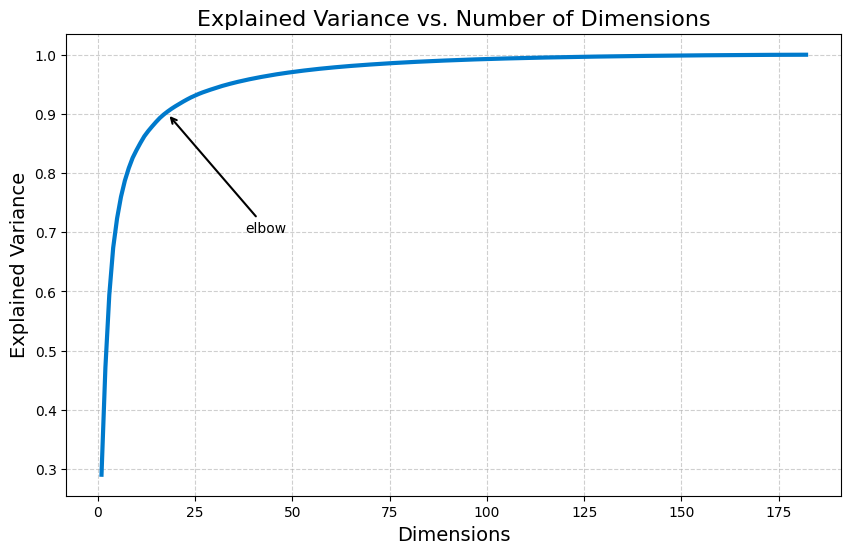

In [ ]:
pca_full = PCA().fit(X)

cumsum = np.cumsum(pca_full.explained_variance_ratio_)
dimensions = np.arange(1, len(cumsum) + 1)
elbow_point = np.argmax(cumsum >= 0.9) + 1

plt.figure(figsize=(10, 6))
plt.plot(dimensions, cumsum, linewidth=3, color="#007acc")
plt.annotate("elbow", xy=(elbow_point, 0.9), xytext=(elbow_point + 20, 0.7),
             arrowprops=dict(arrowstyle="->", color="black", linewidth=1.5))
plt.xlabel("Dimensions", fontsize=14)
plt.ylabel("Explained Variance", fontsize=14)
plt.title("Explained Variance vs. Number of Dimensions", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

We can clearly observe an elbow at around 90% of the variance explained, but 95% I would say is the perfect point where it captures enough variance explained, but still avoids the diminishing returns trap, so I will keep the 95% PCA. To get even more accurate number, I will compute the Random forest 5 split cross validation accuracy vs number of components graph.

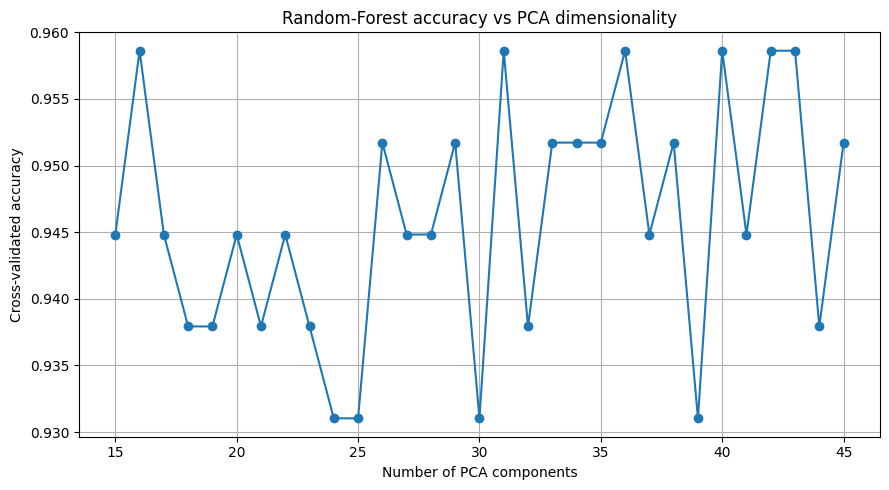

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

pipe = Pipeline([
    ("pca", PCA(random_state=42)),
    ("rf",  RandomForestClassifier(n_estimators=300, random_state=42, n_jobs=-1))
])

component_range = range(15, 46)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

acc = []
for n in component_range:
    pipe.set_params(pca__n_components=n)
    acc.append(cross_val_score(pipe, X_train, y_train, cv=cv, scoring="accuracy").mean())
    
plt.figure(figsize=(9, 5))
plt.plot(component_range, acc, marker="o")
plt.xlabel("Number of PCA components")
plt.ylabel("Cross-validated accuracy")
plt.title("Random-Forest accuracy vs PCA dimensionality")
plt.grid(True)
plt.tight_layout()
plt.show()

Based on the graph I think it's reasonable to go for 36 components retained, which will give us around 95% of the variance explained. But let's first check the scaled PCA version.

### Scaled PCA

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
pca = PCA(n_components=0.95)
X_reduced = pca.fit_transform(X_scaled)

print(f"Original shape: {X.shape}")
print(f"Reduced shape: {X_reduced.shape}")
print(f"Total Explained Variance: {pca.explained_variance_ratio_.sum():.4f}")
print(f"Number of Components Retained: {pca.n_components_}")

Original shape: (182, 3000)
Reduced shape: (182, 157)
Total Explained Variance: 0.9508
Number of Components Retained: 157


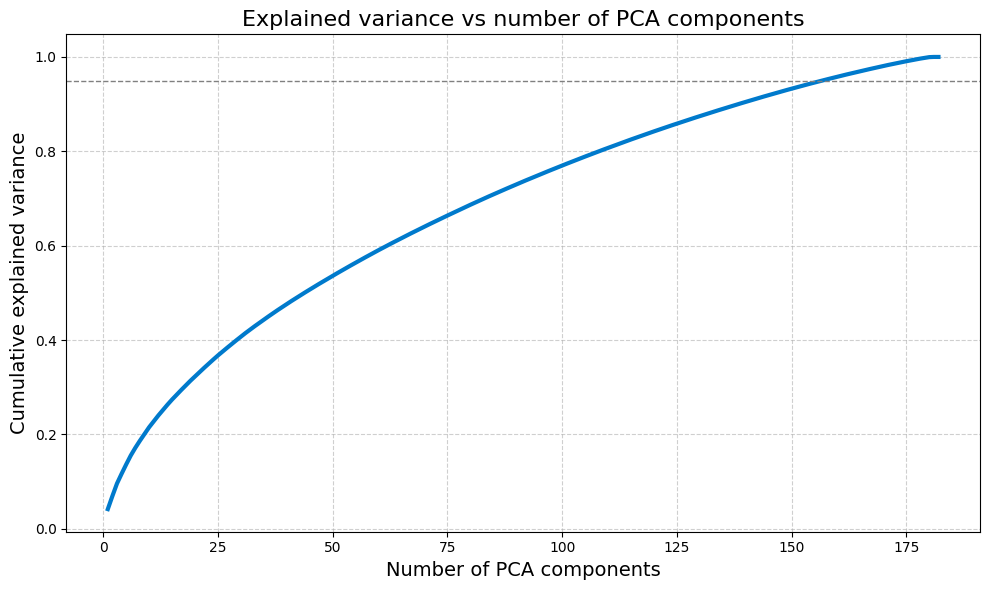

In [ ]:
pca_full = PCA().fit(X_scaled)

cumsum = np.cumsum(pca_full.explained_variance_ratio_)
dimensions = np.arange(1, len(cumsum) + 1)

plt.figure(figsize=(10, 6))
plt.plot(dimensions, cumsum, linewidth=3, color="#007acc")
plt.xlabel("Number of PCA components", fontsize=14)
plt.ylabel("Cumulative explained variance", fontsize=14)
plt.title("Explained variance vs number of PCA components", fontsize=16)
plt.axhline(0.95, color='gray', linestyle='--', linewidth=1)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

We don't see an elbow. Let's check some example numbers of components retained vs cross validated accuracy of RF.

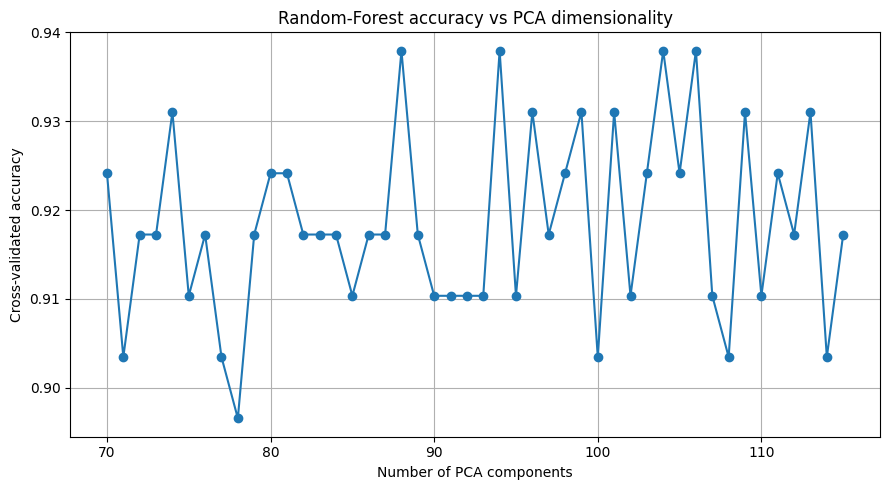

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

pipe = Pipeline([
    ("sc", StandardScaler()),
    ("pca", PCA(random_state=42)),
    ("rf",  RandomForestClassifier(n_estimators=300, random_state=42, n_jobs=-1))
])

component_range = range(70, 116)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

acc = []
for n in component_range:
    pipe.set_params(pca__n_components=n)
    acc.append(cross_val_score(pipe, X_train, y_train, cv=cv, scoring="accuracy").mean())
    
plt.figure(figsize=(9, 5))
plt.plot(component_range, acc, marker="o")
plt.xlabel("Number of PCA components")
plt.ylabel("Cross-validated accuracy")
plt.title("Random-Forest accuracy vs PCA dimensionality")
plt.grid(True)
plt.tight_layout()
plt.show()

We can see that non scaled PCA obtains significantly better cross validated results on RF model  so we will stick with non scaled one retaining 36 components. As concluded in the drop seq section, our dataset is of such characteristics that non-scaled PCA may be of better use also considering that the dataset is already normalised.

### Final PCA choice

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

pca_final = PCA(n_components=36, random_state=42)
X_train_pca = pca_final.fit_transform(X_train)
X_test_pca = pca_final.transform(X_test)

print(f"Train shape after PCA: {X_train_pca.shape}")
print(f"Test shape after PCA: {X_test_pca.shape}")
print(f"Explained variance train set: {pca_final.explained_variance_ratio_.sum():.4f}")

Train shape after PCA: (145, 36)
Test shape after PCA: (37, 36)
Explained variance train set: 0.9578


Let's perform a check with an example model - random forest, if our PCA reduced data helps us to improve the running time and how it performs with accuracy.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42,stratify=y)

start_time = time.time()
rf_original = RandomForestClassifier(random_state=42)
rf_original.fit(X_train, y_train)
y_pred_original = rf_original.predict(X_test)
end_time = time.time()
accuracy_original = accuracy_score(y_test, y_pred_original)
print(f"Original Data - Accuracy: {accuracy_original:.4f}")
print(f"Training Time: {end_time - start_time:.4f} seconds")
print(classification_report(y_test, y_pred_original))

print("\n" + "-"*50 + "\n")

start_time = time.time()
rf_reduced = RandomForestClassifier(random_state=42)
rf_reduced.fit(X_train_pca, y_train)
y_pred_reduced = rf_reduced.predict(X_test_pca)
end_time = time.time()
accuracy_reduced = accuracy_score(y_test, y_pred_reduced)
print(f"PCA-Reduced Data - Accuracy: {accuracy_reduced:.4f}")
print(f"Training Time: {end_time - start_time:.4f} seconds")
print(classification_report(y_test, y_pred_reduced))


Original Data - Accuracy: 1.0000
Training Time: 0.1686 seconds
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       1.00      1.00      1.00        20

    accuracy                           1.00        37
   macro avg       1.00      1.00      1.00        37
weighted avg       1.00      1.00      1.00        37


--------------------------------------------------

PCA-Reduced Data - Accuracy: 1.0000
Training Time: 0.0843 seconds
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       1.00      1.00      1.00        20

    accuracy                           1.00        37
   macro avg       1.00      1.00      1.00        37
weighted avg       1.00      1.00      1.00        37



We immediately notice something that we could predict based on the fact that our dataset contains way more dimensions than samples and a very small number of samples, our model is learning the patterns very well and obtaining 100% accuracy on the original data already. However, let's see how will it look when we will include randomness to the split and check it on 10 different splits.

In [ ]:
accuracies = []
n_trials = 10 

for i in range(n_trials):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=i)
    
    rf_model = RandomForestClassifier(random_state=42)
    rf_model.fit(X_train, y_train)
    y_pred = rf_model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    accuracies.append(accuracy)
    
    print(f"Trial {i+1} - Test Accuracy: {accuracy:.4f}")

print("\nAverage Accuracy:", np.mean(accuracies))

Trial 1 - Test Accuracy: 0.9730
Trial 2 - Test Accuracy: 1.0000
Trial 3 - Test Accuracy: 0.9730
Trial 4 - Test Accuracy: 1.0000
Trial 5 - Test Accuracy: 0.9730
Trial 6 - Test Accuracy: 1.0000
Trial 7 - Test Accuracy: 0.9730
Trial 8 - Test Accuracy: 1.0000
Trial 9 - Test Accuracy: 1.0000
Trial 10 - Test Accuracy: 1.0000

Average Accuracy: 0.9891891891891891


We can clearly see that when including randomness, our model under different sample splits gets different results which is problematic. Our model might be overfitting certain splits, achieving perfect accuracy in some cases but not others. But there may be also other reasons for such results. During EDA we observed that the data was already well divided into distinct clusters even before training. Concluding, our model can simply be memorizing the classes rather than learning generalizable patterns which is problematic.

Based on our observations, it is likely that we will obtain 100% accuracy on couple of models. That is why I will try to maximise our cross validation scores to find the best general model.

## SVM

Let's first train SVM model on our original data.


Test Accuracy: 0.972972972972973


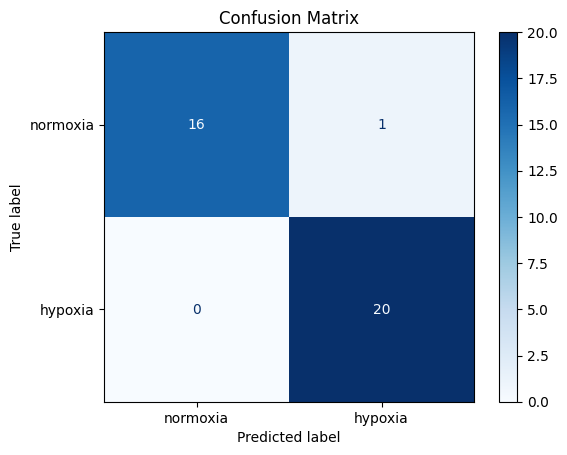

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42,stratify=y)

svm_model = SVC()
svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels=[0, 1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["normoxia", "hypoxia"])
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix")
plt.show()

Let's now try on our PCA reduced data.

In [ ]:
svm_model = SVC()
svm_model.fit(X_train_pca, y_train)

y_pred = svm_model.predict(X_test_pca)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))


Test Accuracy: 0.9459459459459459

Classification Report:
              precision    recall  f1-score   support

    normoxia       1.00      0.88      0.94        17
     hypoxia       0.91      1.00      0.95        20

    accuracy                           0.95        37
   macro avg       0.95      0.94      0.94        37
weighted avg       0.95      0.95      0.95        37



We got a lower score on PCA reduced set, let's now compare both models using cross validation to pick the better one.

In [ ]:
from sklearn.model_selection import cross_val_score

model_a = SVC()
model_b = SVC()

scores_a = cross_val_score(model_a, X_train, y_train, cv=5, scoring='accuracy')

scores_b = cross_val_score(model_b, X_train_pca, y_train, cv=5, scoring='accuracy')

print("\n5-Fold CV Accuracy Comparison (Original vs PCA):\n")

for i, (a, b) in enumerate(zip(scores_a, scores_b), 1):
    print(f"Fold {i}: Original = {a:.4f}, PCA = {b:.4f}")

print(f"\nMean Accuracy:")
print(f"  Original: {np.mean(scores_a):.4f}")
print(f"  PCA     : {np.mean(scores_b):.4f}")



5-Fold CV Accuracy Comparison (Original vs PCA):

Fold 1: Original = 1.0000, PCA = 0.9310
Fold 2: Original = 1.0000, PCA = 1.0000
Fold 3: Original = 0.8966, PCA = 1.0000
Fold 4: Original = 1.0000, PCA = 1.0000
Fold 5: Original = 0.9655, PCA = 0.9655

Mean Accuracy:
  Original: 0.9724
  PCA     : 0.9793


We can see that PCA one obtains slightly better and more consistent cross validation results which is the most important thing for us so we will continue with the PCA model.

Fitting 5 folds for each of 120 candidates, totalling 600 fits

Best Parameters:
{'svc__C': 3, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}

Test Accuracy: 0.9459459459459459

Classification Report:
              precision    recall  f1-score   support

    normoxia       1.00      0.88      0.94        17
     hypoxia       0.91      1.00      0.95        20

    accuracy                           0.95        37
   macro avg       0.95      0.94      0.94        37
weighted avg       0.95      0.95      0.95        37



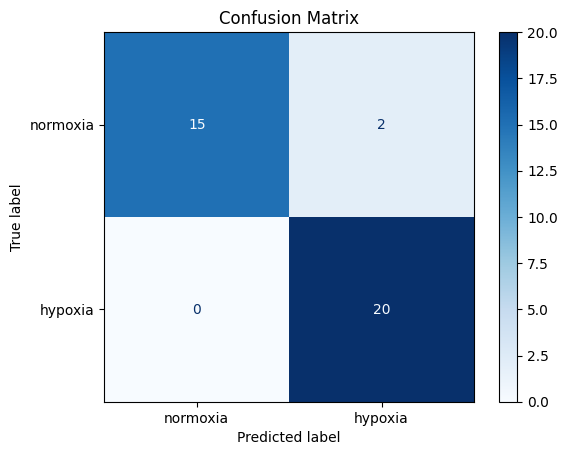

In [ ]:
from sklearn.model_selection import GridSearchCV

pipeline = Pipeline([
    ('pca', PCA(n_components=36)),
    ('svc', SVC())
])

param_grid = {
    'svc__C': [0.01,0.05, 0.1,0.5, 1,3,6, 10, 15,20,25,100],
    'svc__kernel': ['linear', 'rbf'], 
    'svc__gamma': ['scale', 'auto', 0.01, 0.1, 1],               
}

grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    scoring='accuracy',
    cv=5,
    verbose=1,
)

grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

print("\nBest Parameters:")
print(grid_search.best_params_)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))

ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=["normoxia", "hypoxia"],
                                        cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix")
plt.show()

We got the final SVM model using PCA:

In [ ]:
svm_model = SVC(C=3, gamma='scale', kernel='rbf')
svm_model.fit(X_train_pca, y_train)

y_pred = svm_model.predict(X_test_pca)

print("\nFinal Test Accuracy:", accuracy_score(y_test, y_pred))


Final Test Accuracy: 0.9459459459459459


It doesn't achieve the best single split accuracy each time, but we can see that the cross validation score is more important as when we will introduce randomness, the single split will obtain 100% anyways on some random splits:

In [ ]:
accuracies = []
n_trials = 10

for i in range(n_trials):
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, stratify=y, random_state=i
    )
    
    pca = PCA(n_components=36)
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)

    svm_model = SVC(C=3, gamma='scale', kernel='rbf')
    svm_model.fit(X_train_pca, y_train)

    y_pred = svm_model.predict(X_test_pca)
    accuracy = accuracy_score(y_test, y_pred)
    accuracies.append(accuracy)
    
    print(f"Trial {i+1} - Test Accuracy: {accuracy:.4f}")

print("\nAverage Accuracy:", np.mean(accuracies))


Trial 1 - Test Accuracy: 0.9730
Trial 2 - Test Accuracy: 0.9730
Trial 3 - Test Accuracy: 1.0000
Trial 4 - Test Accuracy: 1.0000
Trial 5 - Test Accuracy: 0.9730
Trial 6 - Test Accuracy: 1.0000
Trial 7 - Test Accuracy: 0.9459
Trial 8 - Test Accuracy: 0.9730
Trial 9 - Test Accuracy: 1.0000
Trial 10 - Test Accuracy: 1.0000

Average Accuracy: 0.9837837837837838


We can see that the average accuracy is quite high - 98.37%.

## Logistic regression

We need a model that will include a strong reguralization and will not be very complex like RF. This is where logistic regression can be a good option. Let's check the PCA version and non PCA version for default LR.

In [ ]:
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression(random_state=42)
log_reg.fit(X_train_pca, y_train)

y_pred = log_reg.predict(X_test_pca)

print("\nTest Accuracy PCA model:", accuracy_score(y_test, y_pred))


Test Accuracy PCA model: 0.972972972972973


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

log_reg_original = LogisticRegression(max_iter=3000)
log_reg_original.fit(X_train, y_train)

y_pred = log_reg_original.predict(X_test)

print("Test Accuracy orginal dataset:", accuracy_score(y_test, y_pred))

Test Accuracy orginal dataset: 1.0


We see that LR on original datset gets 100% accuracy on a single test split. Let's compare them using cross validation.

In [ ]:
model_original = LogisticRegression(max_iter=3000)

model_pca = Pipeline([
    ('pca', PCA(n_components=36)),
    ('logreg', LogisticRegression(max_iter=3000))
])

scores_original = cross_val_score(model_original, X, y, cv=5, scoring='accuracy')
scores_pca = cross_val_score(model_pca, X, y, cv=5, scoring='accuracy')

print("\n5-Fold CV Accuracy Comparison (Original vs PCA with 36 components):\n")
for i, (s1, s2) in enumerate(zip(scores_original, scores_pca), 1):
    print(f"Fold {i}: Original = {s1:.4f}, PCA = {s2:.4f}")

print(f"\nMean Accuracy:")
print(f"  Original: {np.mean(scores_original):.4f}")
print(f"  PCA     : {np.mean(scores_pca):.4f}")


5-Fold CV Accuracy Comparison (Original vs PCA with 36 components):

Fold 1: Original = 0.9730, PCA = 0.9189
Fold 2: Original = 0.9730, PCA = 1.0000
Fold 3: Original = 0.9722, PCA = 0.9722
Fold 4: Original = 0.9722, PCA = 0.9444
Fold 5: Original = 0.9444, PCA = 0.9444

Mean Accuracy:
  Original: 0.9670
  PCA     : 0.9560


Cross validation test shows that the 2 models obtain very similar results, but as I chose a PCA model before I will try to be consisent and also go with the PCA one here. Let's tune it up using grid search.

In [ ]:
param_grid = [
    {
        "penalty": ["l1", "l2"],
        "C": [0.001, 0.01, 0.1, 1, 10],
        "solver": ["liblinear", "saga"],
        "class_weight": [None, "balanced"],
    },
    {
        "penalty": ["elasticnet"],
        "C": [0.001, 0.01, 0.1, 1, 10],
        "solver": ["saga"],
        "l1_ratio": [0.0, 0.3, 0.5, 0.7, 1.0],
        "class_weight": [None, "balanced"],
    }
]

log_reg = LogisticRegression(random_state=42, max_iter=5000)
grid_search = GridSearchCV(log_reg, param_grid, cv=5, scoring='accuracy', verbose=1)
grid_search.fit(X_train_pca, y_train)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_pca)

print("\nBest Parameters:", grid_search.best_params_)
print("Test Accuracy with best model:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, digits=4))

Fitting 5 folds for each of 90 candidates, totalling 450 fits

Best Parameters: {'C': 0.001, 'class_weight': None, 'penalty': 'l2', 'solver': 'liblinear'}
Test Accuracy with best model: 0.972972972972973
              precision    recall  f1-score   support

           0     0.9444    1.0000    0.9714        17
           1     1.0000    0.9500    0.9744        20

    accuracy                         0.9730        37
   macro avg     0.9722    0.9750    0.9729        37
weighted avg     0.9745    0.9730    0.9730        37



Thus, our final linear regression model is:

In [ ]:
final_log_reg = LogisticRegression(
    C=0.001,
    penalty='l1',
    solver='liblinear',
    class_weight=None,
    random_state=42,
    max_iter=1000 
)

final_log_reg.fit(X_train_pca, y_train)
y_pred = final_log_reg.predict(X_test_pca)

print("Final Logistic Regression Model Evaluation:")
print("Test Accuracy:", accuracy_score(y_test, y_pred))

Final Logistic Regression Model Evaluation:
Test Accuracy: 1.0


## SGD

Let's also try SGD using our PCA dataset to stay consistent which will be helpful for esemble at the end.

In [ ]:
sgd_clf = SGDClassifier(random_state=42)
sgd_clf.fit(X_train_pca, y_train)
y_pred = sgd_clf.predict(X_test_pca)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))


Test Accuracy: 1.0


Grid search tuning up:

In [ ]:
param_grid = {
    'loss': ['log_loss', 'hinge', 'modified_huber'],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'alpha': [1e-4, 1e-3, 1e-2],
    'learning_rate': ['constant', 'optimal', 'adaptive'],
    'eta0': [0.001, 0.01, 0.1],
    'class_weight': [None, 'balanced']
}

grid_search = GridSearchCV(
    SGDClassifier(random_state=42),
    param_grid=param_grid,
    cv=5,
    scoring='accuracy',
    verbose=1,
)

grid_search.fit(X_train_pca, y_train)
best_sgd = grid_search.best_estimator_
print("\nBest Parameters:", grid_search.best_params_)
print("Best Cross-Validated Accuracy:", grid_search.best_score_)
y_pred = best_sgd.predict(X_test_pca)
print("\nTest Accuracy:", accuracy_score(y_test, y_pred))

Fitting 5 folds for each of 486 candidates, totalling 2430 fits

Best Parameters: {'alpha': 0.001, 'class_weight': None, 'eta0': 0.001, 'learning_rate': 'optimal', 'loss': 'hinge', 'penalty': 'l1'}
Best Cross-Validated Accuracy: 0.9793103448275863

Test Accuracy: 0.9459459459459459


Our final SGD model:

In [ ]:
final_sgd = SGDClassifier(
    alpha=0.0001,
    class_weight='balanced',
    eta0=0.001,
    learning_rate='constant',
    loss='log_loss',
    penalty='l1',
    max_iter=1000,
    random_state=42
)

final_sgd.fit(X_train_pca, y_train)
y_pred = final_sgd.predict(X_test_pca)

print("Final SGDClassifier Model Evaluation:")
print("Test Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["normoxia", "hypoxia"]))

Final SGDClassifier Model Evaluation:
Test Accuracy: 0.9459459459459459

Classification Report:
              precision    recall  f1-score   support

    normoxia       0.89      1.00      0.94        17
     hypoxia       1.00      0.90      0.95        20

    accuracy                           0.95        37
   macro avg       0.95      0.95      0.95        37
weighted avg       0.95      0.95      0.95        37



## Random forest

We will perform the same steps as for SGD to obtain a Random forest model based on our PCA dataset.

In [ ]:
rf_clf = RandomForestClassifier(random_state=42)
rf_clf.fit(X_train_pca, y_train)
y_pred = rf_clf.predict(X_test_pca)
print("Test Accuracy:", accuracy_score(y_test, y_pred))

Test Accuracy: 1.0


In [ ]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False],
    'class_weight': [None, 'balanced']
}

grid_search = GridSearchCV(
    RandomForestClassifier(random_state=42),
    param_grid=param_grid,
    cv=3,
    scoring='accuracy',
    verbose=1,
)

grid_search.fit(X_train_pca, y_train)
best_rf = grid_search.best_estimator_
print("\nBest Parameters:", grid_search.best_params_)
print("Best Cross-Validated Accuracy:", grid_search.best_score_)
y_pred = best_rf.predict(X_test_pca)
print("\nTest Accuracy:", accuracy_score(y_test, y_pred))

Fitting 3 folds for each of 432 candidates, totalling 1296 fits

Best Parameters: {'bootstrap': False, 'class_weight': 'balanced', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}
Best Cross-Validated Accuracy: 0.9791666666666666

Test Accuracy: 0.972972972972973


Our final RF model:

In [ ]:
rf_final = RandomForestClassifier(
    bootstrap=True,
    class_weight=None,
    max_depth=None,
    min_samples_leaf=2,
    min_samples_split=5,
    n_estimators=100,
    random_state=42
)

rf_final.fit(X_train_pca, y_train)
y_pred = rf_final.predict(X_test_pca)
print("Test Accuracy:", accuracy_score(y_test, y_pred))

Test Accuracy: 0.972972972972973


## Ensemble learning

Let's now train a model using hard and soft voting.

In [ ]:
estimators = [
    ('sgd', final_sgd),
    ('log_reg', final_log_reg),
    ('svm_rbf', svm_model),
    ('rf', rf_final)
]

voting_clf = VotingClassifier(
    estimators=estimators,
    voting='hard'
)

voting_clf.fit(X_train_pca, y_train)
y_pred = voting_clf.predict(X_test_pca)
print("\nTest Accuracy:", accuracy_score(y_test, y_pred))


Test Accuracy: 1.0


In [ ]:
svm_model = SVC(C=3, gamma='scale', kernel='rbf', probability=True, random_state=42)
svm_model.fit(X_train_pca, y_train)

soft_voting_clf = VotingClassifier(
    estimators=[
        ('sgd', final_sgd),
        ('log_reg', final_log_reg),
        ('svm_rbf', svm_model),
        ('rf', rf_final)
    ],
    voting='soft',
    n_jobs=-1
)

soft_voting_clf.fit(X_train_pca, y_train)
y_pred = soft_voting_clf.predict(X_test_pca)
print("\nTest Accuracy:", accuracy_score(y_test, y_pred))


Test Accuracy: 1.0


## Chosing final model

We obtained 6 models:  
-Random forest   
-Support vector machines  
-Logistic regression  
-SGD  
-hard voting model using RF, SVM, LR and SGD  
-soft voting model using RF, SVM, LR and SGD  

Couple of those obtained 100% single split accuracy score, so we will pick the final one based on cross validation measure. Let's compare all models:

In [ ]:
models = {
    "SGD Classifier": final_sgd,
    "Logistic Regression": final_log_reg,
    "SVM RBF Kernel": svm_model,
    "Random Forest": rf_final,
    "Voting Classifier Hard": voting_clf,
    "Voting Classifier Soft": soft_voting_clf
}

cv_values = [3, 4, 5, 6, 7,8, 9,10]
model_scores = {name: [] for name in models}

for cv in cv_values:
    print(f"\nCross-Validation Accuracy (cv={cv}):")
    for name, model in models.items():
        score = cross_val_score(model, X_train_pca, y_train, cv=cv, scoring='accuracy').mean()
        model_scores[name].append(score)
        print(f"{name:30} Mean Accuracy: {score:.4f}")


Cross-Validation Accuracy (cv=3):
SGD Classifier                 Mean Accuracy: 0.9242
Logistic Regression            Mean Accuracy: 0.9308
SVM RBF Kernel                 Mean Accuracy: 0.9792
Random Forest                  Mean Accuracy: 0.9514
Voting Classifier Hard         Mean Accuracy: 0.9517
Voting Classifier Soft         Mean Accuracy: 0.9515

Cross-Validation Accuracy (cv=4):
SGD Classifier                 Mean Accuracy: 0.9520
Logistic Regression            Mean Accuracy: 0.9657
SVM RBF Kernel                 Mean Accuracy: 0.9863
Random Forest                  Mean Accuracy: 0.9585
Voting Classifier Hard         Mean Accuracy: 0.9726
Voting Classifier Soft         Mean Accuracy: 0.9794

Cross-Validation Accuracy (cv=5):
SGD Classifier                 Mean Accuracy: 0.9517
Logistic Regression            Mean Accuracy: 0.9448
SVM RBF Kernel                 Mean Accuracy: 0.9862
Random Forest                  Mean Accuracy: 0.9586
Voting Classifier Hard         Mean Accuracy: 0

In [ ]:
print("\nOverall Average Accuracy Across All CV Splits:")
for name, scores in model_scores.items():
    avg_score = sum(scores) / len(scores)
    print(f"{name:30} Averaged Accuracy: {avg_score:.4f}")


Overall Average Accuracy Across All CV Splits:
SGD Classifier                 Averaged Accuracy: 0.9484
Logistic Regression            Averaged Accuracy: 0.9511
SVM RBF Kernel                 Averaged Accuracy: 0.9854
Random Forest                  Averaged Accuracy: 0.9550
Voting Classifier Hard         Averaged Accuracy: 0.9587
Voting Classifier Soft         Averaged Accuracy: 0.9699


We can see a significant advantage for the SVM model so we will pick it as our final model:

In [ ]:
svm_model_f = SVC(C=3, gamma='scale', kernel='rbf')
svm_model_f.fit(X_train_pca, y_train)

y_pred = svm_model_f.predict(X_test_pca)

print("\nFinal Test Accuracy:", accuracy_score(y_test, y_pred))


Final Test Accuracy: 0.9459459459459459


We conclude HCC1806 SmartSeq section with a final model which is an SVM model with rbf kernel obtaining 94.59% test accuracy on a single split and 98.54% accuracy on averaged on cross validation using splits from 3 to 10. It used the following parameters:
- C = 3  
- gamma = scale  

### Comparison with classifiers from other datasets

We will do the same procedure as for DropSeq HCC1806 dataset and check how best classifiers from different datasets will perform on our SmartSeq HCC1806 dataset. For reference I will again call the best model obtained before the "original final model".

Let's start with comparing the best model from the same cell line - HCC1806, but extracted using different technology - DropSeq:

In [ ]:
final_svm_rbf = SVC(
    kernel='rbf',
    C=10,
    gamma='auto',
    class_weight=None,
    random_state=42
)
final_svm_rbf.fit(X_train_pca, y_train)
y_pred = final_svm_rbf.predict(X_test_pca)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))


Test Accuracy: 0.5405405405405406


We got a very bad accuracy score. The model from different technology - DropSeq turned out to not be useful for our SmartSeq dataset. Now let's try the model obtained from different cell line - MCF, but the same technology - SmartSeq.

In [ ]:
svmmodel = SVC(
    kernel='rbf',
    C=1,
    gamma='scale',
    probability=True,
    class_weight='balanced',
    random_state=42
)

svmmodel.fit(X_train_pca, y_train)
y_pred = svmmodel.predict(X_test_pca)

print("Accuracy on test set:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy on test set: 0.9459459459459459

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.88      0.94        17
           1       0.91      1.00      0.95        20

    accuracy                           0.95        37
   macro avg       0.95      0.94      0.94        37
weighted avg       0.95      0.95      0.95        37



The model obtained from the same technology type, but different cell line turned out to obtain solid score. Now let's use the final model obtained from different technology method - DropSeq and different cell line - MCF7.

In [ ]:
logreg = LogisticRegression(
    penalty='l1', C=0.0992, solver='liblinear', fit_intercept=True,
    tol=0.00363, max_iter=1070, class_weight='balanced', random_state=42
)

rf = RandomForestClassifier(
    n_estimators=184, criterion='gini', max_features=0.05,
    min_samples_split=20, min_samples_leaf=5,
    class_weight='balanced', random_state=42
)

sgd = SGDClassifier(
    loss='log_loss', penalty='l2', max_iter=1000, alpha=0.0254,
    l1_ratio=0.169, fit_intercept=True, early_stopping=False,
    class_weight='balanced', random_state=42
)

svm = SVC(
    kernel='rbf', C=1, gamma='scale',
    probability=True, class_weight='balanced', random_state=42
)

for clf in (logreg, rf, sgd, svm):
    clf.fit(X_train_pca, y_train)

softvote = VotingClassifier(
    estimators=[('lr', logreg),
               ('rf', rf),
               ('sgd', sgd),
               ('svm', svm)],
    voting='soft'
).fit(X_train_pca, y_train)

y_pred = softvote.predict(X_test_pca)

print(f"Test accuracy (soft vote): {accuracy_score(y_test, y_pred):.3f}\n")
print(classification_report(y_test, y_pred, digits=3))

Test accuracy (soft vote): 1.000

              precision    recall  f1-score   support

           0      1.000     1.000     1.000        17
           1      1.000     1.000     1.000        20

    accuracy                          1.000        37
   macro avg      1.000     1.000     1.000        37
weighted avg      1.000     1.000     1.000        37



We got very impressive results for the soft vote model so let's check if it will beat our best model from this dataset using cross validation on 3 to 10 splits as we used before.

In [ ]:
cv_values = [3, 4, 5, 6, 7, 8, 9, 10]
softvote_scores = []

print("Cross-Validation Accuracy for Soft Voting Classifier:")
for cv in cv_values:
    score = cross_val_score(softvote, X_train_pca, y_train, cv=cv, scoring='accuracy').mean()
    softvote_scores.append(score)
    print(f"CV={cv}: Mean Accuracy = {score:.4f}")
overall_mean = sum(softvote_scores) / len(softvote_scores)
print(f"\nOverall Mean Accuracy across all CV values: {overall_mean:.4f}")

Cross-Validation Accuracy for Soft Voting Classifier:
CV=3: Mean Accuracy = 0.9654
CV=4: Mean Accuracy = 0.9932
CV=5: Mean Accuracy = 0.9793
CV=6: Mean Accuracy = 0.9864
CV=7: Mean Accuracy = 0.9864
CV=8: Mean Accuracy = 0.9865
CV=9: Mean Accuracy = 0.9796
CV=10: Mean Accuracy = 0.9581

Overall Mean Accuracy across all CV values: 0.9794


It didn't beat it as our original final model from this dataset got more than 98% average score across all CV values.

We can see that we got a very bad accuracy score for the model used in the same cell line, but different technology - DropSeq, which is suprising as the score is very low. For the other 2 models we got similar results, but slightly worse than for our final original model. So we can reason that all models from different datasets are not useful for all datasets, as there may be some different patterns in datasets.

### Predictions

We will now predict the labels of the anonim dataset using our best model - SVM rbf kernel.

In [ ]:
from pathlib import Path
import csv, re

test_df = (
    pd.read_csv("../SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt",
                sep=r"\s+|,|\t", engine="python", index_col=0)
      .T
)

X_test_pca = pca_final.transform(test_df)

y_pred_num = svm_model_f.predict(X_test_pca).astype(int)

label_map  = {0: "Normoxia", 1: "Hypoxia"}
y_pred_txt = np.vectorize(label_map.get)(y_pred_num)

clean_ids = (test_df.index.astype(str)
                         .str.replace(r"[\"']", "", regex=True)
                         .str.strip())

out_df = pd.DataFrame({0: clean_ids, 1: y_pred_txt})

out_df.to_csv("HCC_SMARTSEQ_FINAL_PREDICTIONS.txt",
              sep='\t',
              header=False,
              index=False,
              quoting=csv.QUOTE_NONE)

# DropSeq MCF7

### Imports and Dimensionality Reduction

In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, ParameterSampler, ParameterGrid, RandomizedSearchCV
from sklearn.feature_selection import VarianceThreshold, SelectKBest, mutual_info_classif
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.svm import SVC

from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, confusion_matrix

from sklearn.utils import check_random_state

from scipy.stats import uniform, loguniform, randint

import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
import seaborn as sns

plt.style.use('seaborn-v0_8-muted')
sns.set_context('notebook')

In [ ]:
data = pd.read_csv("../../DropSeq/MCF7_Filtered_Normalised_3000_Data_train.txt",sep=r"\s+",engine='python',index_col=0)
data.head()

,"""AAAAACCTATCG_Normoxia""","""AAAACAACCCTA_Normoxia""","""AAAACACTCTCA_Normoxia""","""AAAACCAGGCAC_Normoxia""","""AAAACCTAGCTC_Normoxia""","""AAAACCTCCGGG_Normoxia""","""AAAACTCGTTGC_Normoxia""","""AAAAGAGCTCTC_Normoxia""","""AAAAGCTAGGCG_Normoxia""","""AAAATCGCATTT_Normoxia""",...,"""TTTTACAGGATC_Hypoxia""","""TTTTACCACGTA_Hypoxia""","""TTTTATGCTACG_Hypoxia""","""TTTTCCAGACGC_Hypoxia""","""TTTTCGCGCTCG_Hypoxia""","""TTTTCGCGTAGA_Hypoxia""","""TTTTCGTCCGCT_Hypoxia""","""TTTTCTCCGGCT_Hypoxia""","""TTTTGTTCAAAG_Hypoxia""","""TTTTTTGTATGT_Hypoxia"""
"""MALAT1""",1,3,3,6,4,5,1,13,3,3,...,0,2,1,0,1,0,1,0,0,4
"""MT-RNR2""",0,0,0,2,0,0,2,1,7,0,...,0,0,0,0,0,0,0,0,0,0
"""NEAT1""",0,0,0,0,0,2,0,1,2,0,...,0,0,0,0,0,0,0,0,0,0
"""H1-5""",0,0,0,0,0,2,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0
"""TFF1""",4,1,1,1,0,0,0,2,0,1,...,2,3,8,0,0,3,4,2,6,0


We proceed to supervised learning for MCF7, beginning with DropSeq. Since the data is of extremely high dimension, dimensionality reduction methods are necessary. We proceed with a variance threshold and k-best selection.

In [ ]:
libsize = data.sum(axis=0)
datal = np.log1p(data.div(libsize, axis=1) * 1e6)

def checkhypo(sample_name: str) -> int:
    return 1 if "Hypo" in sample_name else 0

y = datal.columns.map(checkhypo).astype(int)
x = datal.transpose()

geneorder = list(x.columns)

xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.20, stratify=y, random_state=60)

threshold = VarianceThreshold()
xtrain = threshold.fit_transform(xtrain)
xtest = threshold.transform(xtest)

selecter = SelectKBest(mutual_info_classif, k=300)
selecter.fit(xtrain, ytrain)
xtrain = selecter.transform(xtrain)
xtest = selecter.transform(xtest)

genenames = x.columns[threshold.get_support()][selecter.get_support()]

### Logistic Regression

First, we try a logistic regression model with basic parameters.

Accuracy score:  0.9736477115117892
Classification report: 
              precision    recall  f1-score   support

           0     0.9764    0.9787    0.9776      2541
           1     0.9696    0.9664    0.9680      1785

    accuracy                         0.9736      4326
   macro avg     0.9730    0.9726    0.9728      4326
weighted avg     0.9736    0.9736    0.9736      4326



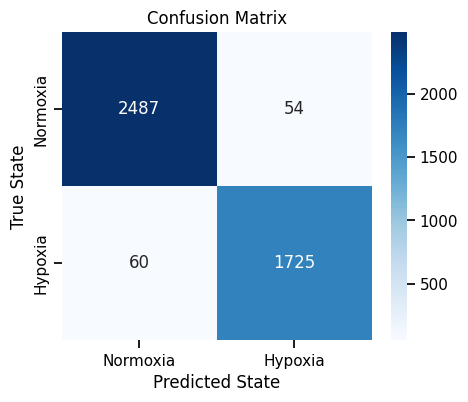

In [ ]:
model = LogisticRegression(
            penalty = 'l2',
            C = 1,
            solver = 'liblinear',
            fit_intercept = True,
            tol = 1e-4,
            max_iter = 800,
            class_weight = 'balanced',
            random_state = 42
        )
model.fit(xtrain, ytrain)

ypred = model.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

Immediately, we get extremely good results. Perhaps we can optimize even further with a randomized search. 

Fitting 5 folds for each of 400 candidates, totalling 2000 fits
Best hyperparameters: {'C': np.float64(0.09915644566638401), 'fit_intercept': True, 'max_iter': 1070, 'penalty': 'l1', 'tol': np.float64(0.0036256176345762273)}
Mean accuracy: 0.9745664739884393
Accuracy score:  0.9750346740638003
Classification report: 
              precision    recall  f1-score   support

           0     0.9784    0.9791    0.9788      2541
           1     0.9703    0.9692    0.9697      1785

    accuracy                         0.9750      4326
   macro avg     0.9743    0.9742    0.9742      4326
weighted avg     0.9750    0.9750    0.9750      4326



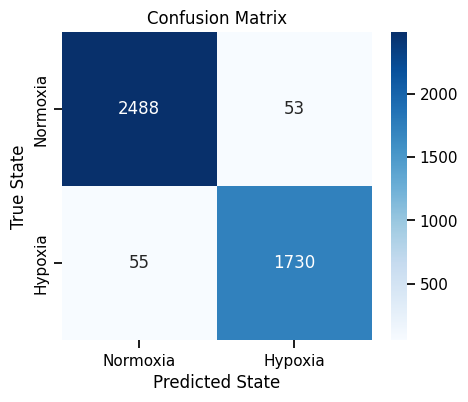

In [ ]:
lr = LogisticRegression(solver='liblinear', class_weight='balanced', random_state=42)

paramdist = {
    'penalty': ['l1', 'l2'],
    'C': loguniform(1e-4, 1e4),
    'fit_intercept': [True, False],
    'tol': loguniform(1e-4, 1e-2),
    'max_iter': randint(800, 1501)
}

search = RandomizedSearchCV(
    estimator = lr,
    param_distributions = paramdist,
    n_iter = 400,
    scoring = 'accuracy',
    cv = 5,
    n_jobs = -1,
    random_state = 42,
    verbose = 1,
)

search.fit(xtrain, ytrain)

print("Best hyperparameters:", search.best_params_)
print("Mean accuracy:", search.best_score_)
bestlr = search.best_estimator_

ypred = bestlr.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

Considering the extremely fast runtime of the randomized search for logistic regression, as many as 400 parameter combinations can be tested. However, despite this, improvement is negligible. Considering the already high amount of iterations, trying more than 400 does not seem warranted, as an improvement is unlikely. We proceed to the random forest classifier.

### Random Forest

Accuracy score:  0.9713361072584373
Classification report: 
              precision    recall  f1-score   support

           0     0.9607    0.9917    0.9760      2541
           1     0.9877    0.9423    0.9644      1785

    accuracy                         0.9713      4326
   macro avg     0.9742    0.9670    0.9702      4326
weighted avg     0.9718    0.9713    0.9712      4326



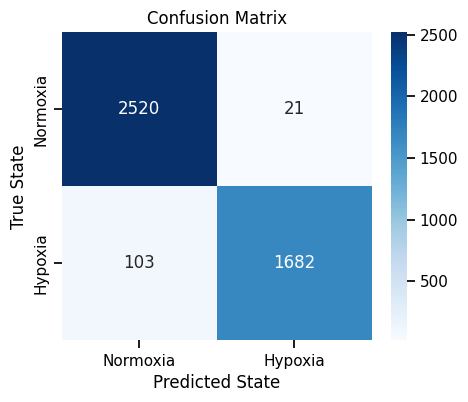

In [ ]:
model = RandomForestClassifier(
            n_estimators = 100,
            criterion = 'gini',
            max_features = 'sqrt',
            min_samples_split = 4,
            min_samples_leaf = 2,
            class_weight = 'balanced',
            random_state = 42
        )
model.fit(xtrain, ytrain)

ypred = model.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

The random forest classifier has similar performance. We attempt also a grid search here, though with far less iterations, owing to the comparatively long runtime of random forest training.

Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best hyperparameters: {'criterion': 'gini', 'max_features': 0.05, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 179}
Mean accuracy: 0.9702310298950158
Accuracy score:  0.9722607489597781
Classification report: 
              precision    recall  f1-score   support

           0     0.9597    0.9945    0.9768      2541
           1     0.9917    0.9406    0.9655      1785

    accuracy                         0.9723      4326
   macro avg     0.9757    0.9676    0.9712      4326
weighted avg     0.9729    0.9723    0.9721      4326



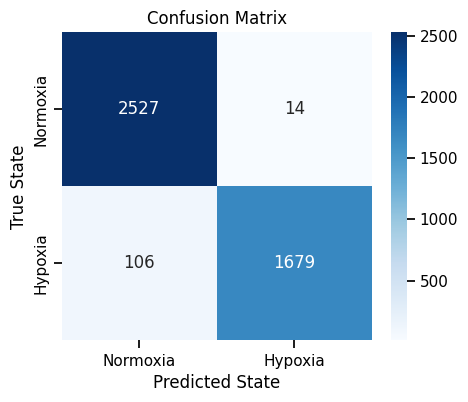

In [ ]:
rf = RandomForestClassifier(class_weight='balanced', random_state=42)

paramdist = {
    'n_estimators': randint(50, 301),
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_features': ['sqrt', 'log2', 0.05, 0.1, 0.2, 0.4],
    'min_samples_split': randint(2, 21),
    'min_samples_leaf': randint(1, 11)
}

search = RandomizedSearchCV(
    estimator = rf,
    param_distributions = paramdist,
    n_iter = 50,
    scoring = 'accuracy',
    cv = 3,
    n_jobs = -1,
    random_state = 42,
    verbose = 1,
)

search.fit(xtrain, ytrain)

print("Best hyperparameters:", search.best_params_)
print("Mean accuracy:", search.best_score_)
bestrf = search.best_estimator_

ypred = bestrf.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

Only a marginal improvement is seen, and results do not exceed the optimal logistic regression performance. We now check gradient descent.

### SGD

Accuracy score:  0.9713361072584373
Classification report: 
              precision    recall  f1-score   support

           0     0.9745    0.9768    0.9756      2541
           1     0.9668    0.9636    0.9652      1785

    accuracy                         0.9713      4326
   macro avg     0.9707    0.9702    0.9704      4326
weighted avg     0.9713    0.9713    0.9713      4326



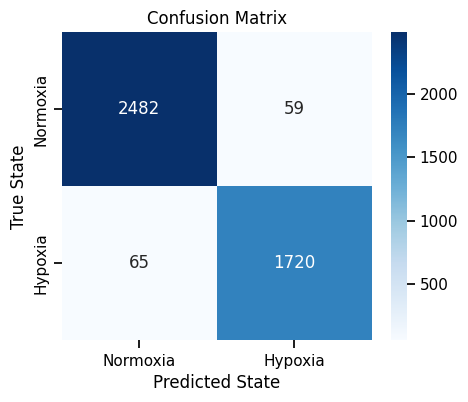

In [ ]:
model = SGDClassifier(
            loss = 'log_loss',
            penalty = 'l2',
            max_iter = 1000,
            class_weight = 'balanced',
            random_state = 42
        )
model.fit(xtrain, ytrain)

ypred = model.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

A slightly worse first run than the previous two classifiers, but maybe this can be improved with randomized search. Considering medium runtime, we attempt an average number of iterations.

Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best hyperparameters: {'alpha': np.float64(0.025383218374507292), 'early_stopping': False, 'fit_intercept': True, 'l1_ratio': np.float64(0.1694927466860925), 'loss': 'log_loss', 'tol': np.float64(6.157195362774953e-05)}
Mean accuracy: 0.9750867052023121
Accuracy score:  0.9754969949144706
Classification report: 
              precision    recall  f1-score   support

           0     0.9747    0.9839    0.9792      2541
           1     0.9767    0.9636    0.9701      1785

    accuracy                         0.9755      4326
   macro avg     0.9757    0.9737    0.9747      4326
weighted avg     0.9755    0.9755    0.9755      4326



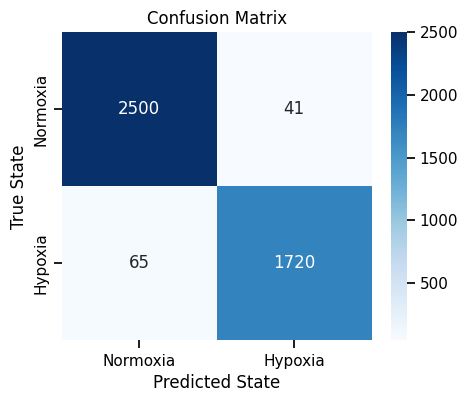

In [ ]:
sgd = SGDClassifier(penalty='elasticnet', class_weight='balanced', random_state=42)

paramdist = {
    'loss': ['log_loss', 'hinge', 'modified_huber'],
    'l1_ratio': uniform(0, 1),
    'alpha': loguniform(1e-5, 1e-1),
    'fit_intercept': [True, False],
    'early_stopping': [True, False],
    'tol': loguniform(1e-5, 1e-3)
}

search = RandomizedSearchCV(
    estimator = sgd,
    param_distributions = paramdist,
    n_iter = 60,
    scoring = 'accuracy',
    cv = 5,
    n_jobs = -1,
    random_state = 42,
    verbose = 1,
)

search.fit(xtrain, ytrain)

print("Best hyperparameters:", search.best_params_)
haslogloss = search.best_params_['loss'] == 'log_loss'
print("Mean accuracy:", search.best_score_)
bestsgd = search.best_estimator_

ypred = bestsgd.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

The final result is marginally better than the final logistic regression classifier. We now attempt SVM. 

### SVM

Accuracy score:  0.978502080443828
Classification report: 
              precision    recall  f1-score   support

           0     0.9778    0.9858    0.9818      2541
           1     0.9796    0.9681    0.9738      1785

    accuracy                         0.9785      4326
   macro avg     0.9787    0.9769    0.9778      4326
weighted avg     0.9785    0.9785    0.9785      4326



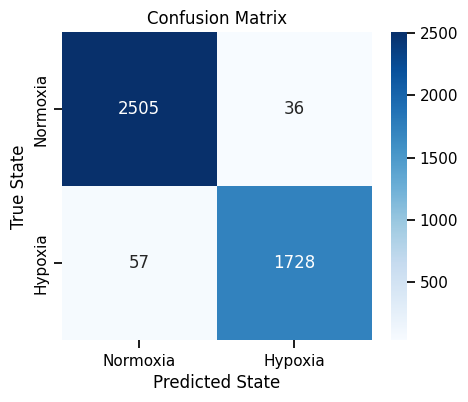

In [ ]:
model = SVC(
    kernel = 'rbf',
    C = 1,
    gamma = 'scale',
    probability = True,
    class_weight = 'balanced',
    random_state = 42
)
model.fit(xtrain, ytrain)

ypred = model.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

These are better results than any of the other classifiers explored. However, considering the high runtime, only a small randomized search will be performed.

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best hyperparameters: {'C': np.float64(0.001102548826429165), 'gamma': np.float64(0.0001873970399782778), 'kernel': 'linear'}
Mean accuracy: 0.9742773094523979
Accuracy score:  0.97457235321313
Classification report: 
              precision    recall  f1-score   support

           0     0.9769    0.9799    0.9784      2541
           1     0.9713    0.9669    0.9691      1785

    accuracy                         0.9746      4326
   macro avg     0.9741    0.9734    0.9738      4326
weighted avg     0.9746    0.9746    0.9746      4326



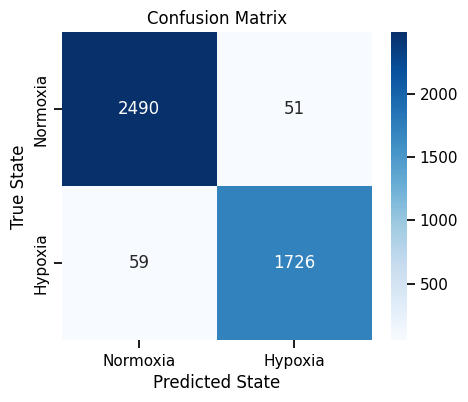

In [ ]:
svm = SVC(class_weight='balanced', random_state=42)

paramdist = {
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'C': loguniform(1e-3, 1e3),
    'gamma': ['scale', 'auto'] + list(loguniform(1e-4, 1e1).rvs(10))
}

search = RandomizedSearchCV(
    estimator = svm,
    param_distributions = paramdist,
    n_iter = 10,
    scoring = 'accuracy',
    cv = 3,
    n_jobs = -1,
    random_state = 42,
    verbose = 1,
)

search.fit(xtrain, ytrain)

print("Best hyperparameters:", search.best_params_)
print("Mean accuracy:", search.best_score_)
bestsvm = search.best_estimator_

ypred = bestsvm.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

The best model turns out worse than the one with default parameters, which is understandable considering the low search space. The original SVM model is therefore kept. 

### Voting Classifiers

Finally, we attempt to combine the previously obtained classifiers into a voting classifier, beginning with hard voting.

Accuracy score:  0.9778085991678225
Classification report: 
              precision    recall  f1-score   support

           0     0.9737    0.9890    0.9813      2541
           1     0.9840    0.9619    0.9728      1785

    accuracy                         0.9778      4326
   macro avg     0.9788    0.9754    0.9770      4326
weighted avg     0.9779    0.9778    0.9778      4326



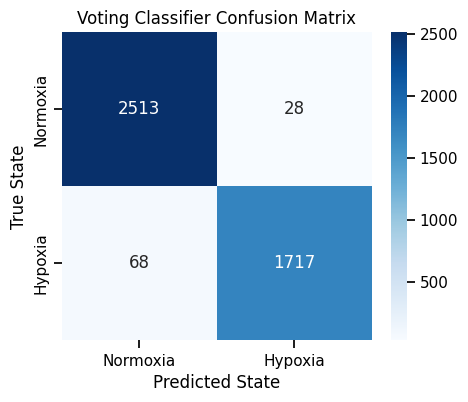

In [ ]:
hardvote = VotingClassifier(
    estimators=[
        ('lr', bestlr),
        ('rf', bestrf),
        ('sgd', bestsgd),
        ('svm', model)
    ],
    voting='hard'
)

hardvote.fit(xtrain, ytrain)

ypred = hardvote.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Voting Classifier Confusion Matrix")
plt.show()

This is the best result seen so far. Soft voting may yield even better results. Since the final SGD model used the log-loss parameter, we can use it as normal for a probabilistic prediction. We are not concerned about probabilistic estimation in SVM either, since we ended up keeping the original model, which was trained with probability. 

Accuracy score:  0.9780397595931577
Classification report: 
              precision    recall  f1-score   support

           0     0.9789    0.9839    0.9814      2541
           1     0.9769    0.9697    0.9733      1785

    accuracy                         0.9780      4326
   macro avg     0.9779    0.9768    0.9773      4326
weighted avg     0.9780    0.9780    0.9780      4326



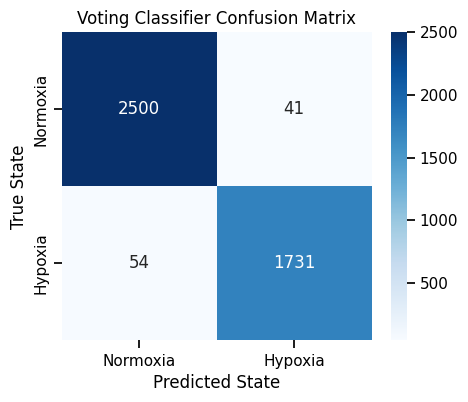

In [ ]:
softvote = VotingClassifier(
    estimators=[
        ('lr', bestlr),
        ('rf', bestrf),
        ('sgd', bestsgd),
        ('svm', model)
    ],
    voting='soft'
)

softvote.fit(xtrain, ytrain)

ypred = softvote.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Voting Classifier Confusion Matrix")
plt.show()

As expected, soft voting shows even better results, with a higher accuracy than any other model considered. This soft voting model, using the optimal models derived from logistic regression, random forest, SGD, and SVM, is the best model found through this investigation. 

### Feature Importance

To gain biological intuition, we evaluate the most predictive genes. Since we cannot directly access feature importance in the best model (the soft vote), we investigate feature importance in its component models, starting with logistic regression.

In [ ]:
lrcoefs = bestlr.coef_.ravel()

coefdf = pd.DataFrame({
    'gene': genenames,
    'coefficient': lrcoefs,
    'abs_coef': np.abs(lrcoefs)
})

topgenes = coefdf.sort_values(by='abs_coef', ascending=False)

topup = topgenes[topgenes['coefficient'] > 0].head(10)
topdown = topgenes[topgenes['coefficient'] < 0].head(10)

print("Top 10 genes positively associated with hypoxia:")
topup

print("\nTop 10 genes negatively associated with hypoxia:")
topdown

Top 10 genes positively associated with hypoxia:


,gene,coefficient,abs_coef
189,"""GAPDH""",0.188976,0.188976
196,"""PGK1""",0.186959,0.186959
290,"""WFDC1""",0.161856,0.161856
91,"""DSP""",0.147889,0.147889
127,"""CACNB2""",0.142801,0.142801
198,"""PKM""",0.132270,0.132270
80,"""KRT19""",0.124904,0.124904
77,"""ENO1""",0.119053,0.119053
26,"""LGALS1""",0.116777,0.116777
11,"""TMSB10""",0.111498,0.111498



Top 10 genes negatively associated with hypoxia:


,gene,coefficient,abs_coef
7,"""MT-ND3""",-0.258197,0.258197
5,"""MT-CO3""",-0.242559,0.242559
3,"""MT-RNR1""",-0.240648,0.240648
1,"""MT-RNR2""",-0.233003,0.233003
28,"""MT-ATP8""",-0.211478,0.211478
15,"""MT-ND6""",-0.199088,0.199088
90,"""ZBTB34""",-0.192151,0.192151
8,"""MT-CYB""",-0.187190,0.187190
19,"""MT-ND5""",-0.176372,0.176372
18,"""MT-ND4L""",-0.176338,0.176338


We see several of the most variable genes, supporting the conjecture that more variable genes are more predictive. We observe greater absolute values for the negative coefficients, which makes sense since gene expression is lower overall for hypoxic cells.

In [ ]:
rfcoefs = bestrf.feature_importances_.ravel()

coefdf = pd.DataFrame({
    'gene': genenames,
    'coefficient': rfcoefs
})

topgenes = coefdf.sort_values(by='coefficient', ascending=False)

print("Top 10 genes associated with hypoxia:")
topgenes

Top 10 genes associated with hypoxia:


,gene,coefficient
1,"""MT-RNR2""",0.073788
2,"""TFF1""",0.066054
80,"""KRT19""",0.052013
11,"""TMSB10""",0.049073
26,"""LGALS1""",0.045236
...,...,...
217,"""TEX261""",0.000000
55,"""CAPN5""",0.000000
269,"""STK16""",0.000000
232,"""TCF7""",0.000000


For the random forest classifier, we can only assess the absolute importance of genes. However, the coefficients seem to be very low, so perhaps this result is not very biologically informative, though there is some overlap between these genes and the logistic regression genes.

In [ ]:
sgdcoefs = bestsgd.coef_.ravel()

coefsgd = pd.DataFrame({
    'gene': genenames,
    'coefficient': sgdcoefs,
    'abs_coef': np.abs(sgdcoefs)
})

topgenes = coefsgd.sort_values(by='abs_coef', ascending=False)

topup = topgenes[topgenes['coefficient'] > 0].head(10)
topdown = topgenes[topgenes['coefficient'] < 0].head(10)

print("Top 10 genes positively associated with hypoxia:")
topup

print("\nTop 10 genes negatively associated with hypoxia:")
topdown

Top 10 genes positively associated with hypoxia:


,gene,coefficient,abs_coef
189,"""GAPDH""",0.147680,0.147680
196,"""PGK1""",0.144235,0.144235
91,"""DSP""",0.105612,0.105612
198,"""PKM""",0.105290,0.105290
80,"""KRT19""",0.103014,0.103014
11,"""TMSB10""",0.100417,0.100417
77,"""ENO1""",0.097493,0.097493
26,"""LGALS1""",0.094991,0.094991
2,"""TFF1""",0.094253,0.094253
65,"""TPI1""",0.081712,0.081712



Top 10 genes negatively associated with hypoxia:


,gene,coefficient,abs_coef
1,"""MT-RNR2""",-0.200188,0.200188
3,"""MT-RNR1""",-0.178249,0.178249
5,"""MT-CO3""",-0.150659,0.150659
7,"""MT-ND3""",-0.148544,0.148544
21,"""BCYRN1""",-0.142728,0.142728
6,"""MT-ND4""",-0.129107,0.129107
8,"""MT-CYB""",-0.115427,0.115427
12,"""MT-ATP6""",-0.101550,0.101550
27,"""TMEM64""",-0.097392,0.097392
32,"""TOB1""",-0.095256,0.095256


The most predictive genes in SGD are very similar to those noted in logistic regression. This supports the notion that biological investigation of these genes could yield useful information on hypoxia. 

Unfortunately, since our optimal SVM model uses a nonlinear kernel, we cannot evaluate its feature importances. However, we have already gained substantial information from the other models. 

### Cross-Dataset Comparison

Finally, we will evaluate the optimal models found on other datasets, and investigate how well they perform compared to the models we have investigated here. For MCF7 DropSeq our work is simplified since the final model chosen for MCCF7 SmartSeq is the basic SVM model that we have already evaluated on DropSeq earlier. In light of this, we proceed to final HCC1806 DropSeq model, which is a modified SVM model. 

Accuracy score:  0.6213592233009708
Classification report: 
              precision    recall  f1-score   support

           0     0.6080    1.0000    0.7562      2541
           1     1.0000    0.0824    0.1522      1785

    accuracy                         0.6214      4326
   macro avg     0.8040    0.5412    0.4542      4326
weighted avg     0.7698    0.6214    0.5070      4326



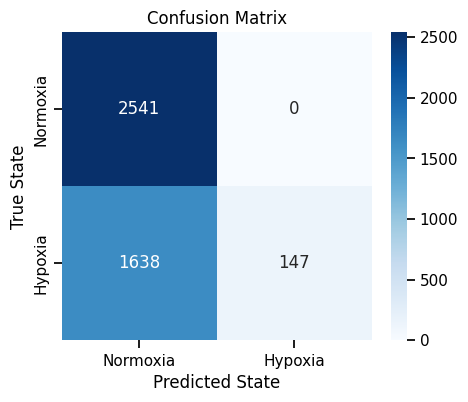

In [ ]:
hccdsmodel = SVC(
    kernel='rbf',
    C=10,
    gamma='auto',
    class_weight=None,
    random_state=42
)

hccdsmodel.fit(xtrain, ytrain)

ypred = hccdsmodel.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

This classifier turns out nearly useless on the HCC cell line. The model predicts almost every cell as normoxic, making it useless for any practical purposes. This may be due to the lack of class weighting. We now check an SVM with different parameters, used as the final model for HCC1806 SmartSeq. 

Accuracy score:  0.9801202034211743
Classification report: 
              precision    recall  f1-score   support

           0     0.9801    0.9862    0.9831      2541
           1     0.9802    0.9714    0.9758      1785

    accuracy                         0.9801      4326
   macro avg     0.9801    0.9788    0.9795      4326
weighted avg     0.9801    0.9801    0.9801      4326



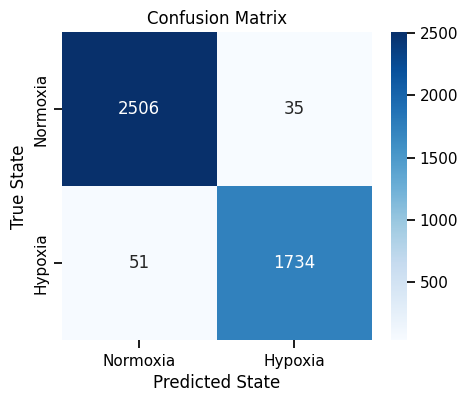

In [ ]:
hccssmodel = SVC(
	kernel = 'rbf',
    C = 3,
    gamma = 'scale',
    probability = True,
    class_weight = 'balanced',
    random_state = 42
)

hccssmodel.fit(xtrain, ytrain)

ypred = hccssmodel.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

This model, on the other hand, gives a result better by 0.002 than the model selected earlier as the final model. Considering the low search space of SVM parameters owing to computational constraints, it is reasonable that a better result in a previously untested model. We will attempt to create a new soft vote with the earlier SVM model replaced by this model. 

Accuracy score:  0.9791955617198336
Classification report: 
              precision    recall  f1-score   support

           0     0.9774    0.9874    0.9824      2541
           1     0.9818    0.9675    0.9746      1785

    accuracy                         0.9792      4326
   macro avg     0.9796    0.9775    0.9785      4326
weighted avg     0.9792    0.9792    0.9792      4326



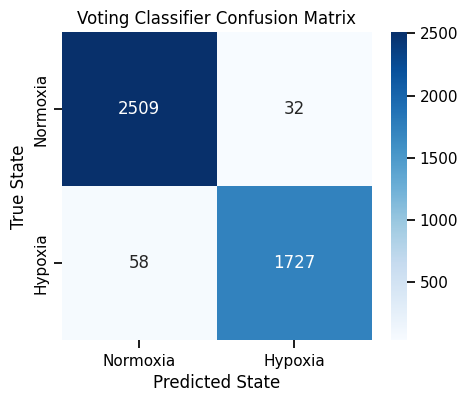

In [ ]:
softvote = VotingClassifier(
    estimators=[
        ('lr', bestlr),
        ('rf', bestrf),
        ('sgd', bestsgd),
        ('svm', hccssmodel)
    ],
    voting='soft'
)

softvote.fit(xtrain, ytrain)

ypred = softvote.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Voting Classifier Confusion Matrix")
plt.show()

It turns out that the soft vote involving the new SVM model is worse than the SVM itself. For this reason we keep the final SVM model as the final model for MCF7 DropSeq, and use it to make predictions on the test data. 

### Predictions

In [ ]:
testdata = pd.read_csv("../../DropSeq/MCF7_Filtered_Normalised_3000_Data_test_anonim.txt",sep=r"\s+",engine='python',index_col=0)

testls = testdata.sum(axis=0)
testnorm = np.log1p(testdata.div(testls, axis=1) * 1e6)


xfinal = testnorm.transpose().reindex(columns=geneorder)


xfinal = threshold.transform(xfinal)
xfinal  = selecter.transform(xfinal)

ypredfinal = hccssmodel.predict(xfinal)

with open("../Predictions/predictions-supervised-mcf-ds.txt", "w") as f:
    f.write("SampleId\tCondition\n")
    for idx, val in enumerate(ypredfinal, start=1):
        label = "Hypoxia" if val == 1 else "Normoxia"
        f.write(f"{idx}\t{label}\n")

ypredfinal

array([1, 0, 0, ..., 1, 0, 1], shape=(5406,))

# SmartSeq MCF7

### Imports and Dimensionality Reduction

In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, ParameterSampler, ParameterGrid, RandomizedSearchCV
from sklearn.feature_selection import VarianceThreshold, SelectKBest, mutual_info_classif
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.svm import SVC

from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, confusion_matrix

from sklearn.utils import check_random_state

from scipy.stats import uniform, loguniform, randint

import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
import seaborn as sns

plt.style.use('seaborn-v0_8-muted')
sns.set_context('notebook')

In [ ]:
data = pd.read_csv("../../SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt",sep=r"\s+",engine='python',index_col=0)
data.head()

,"""output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam""","""output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam""","""output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam""","""output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam""","""output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam""","""output.STAR.2_B9_Hypo_S81_Aligned.sortedByCoord.out.bam""","""output.STAR.2_C10_Hypo_S130_Aligned.sortedByCoord.out.bam""","""output.STAR.2_C11_Hypo_S131_Aligned.sortedByCoord.out.bam""","""output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam""","""output.STAR.2_C2_Norm_S104_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"""
"""CYP1B1""",343,131,452,27,5817,3841,9263,21543,1013,53,...,7890,4512,160,351,327,196,504,34565,20024,5953
"""CYP1B1-AS1""",140,59,203,7,2669,1565,3866,9113,459,22,...,3647,2035,75,138,130,102,238,13717,7835,2367
"""CYP1A1""",0,0,0,0,0,79,238,443,0,0,...,86,1654,0,0,0,1,0,11274,563,522
"""NDRG1""",0,1,0,0,654,1263,2634,540,0,13,...,481,1052,0,0,54,243,62,1263,925,1572
"""DDIT4""",386,289,0,288,2484,2596,1323,2044,36,204,...,3692,2410,800,1,189,266,417,4256,12733,2275


We proceed to supervised learning for SmartSeq. Again, the data is of extremely high dimension, so we proceed with a variance threshold and k-best selection.

In [ ]:
libsize = data.sum(axis=0)
datal = np.log1p(data.div(libsize, axis=1) * 1e6)

def checkhypo(sample_name: str) -> int:
    return 1 if "Hypo" in sample_name else 0

y = datal.columns.map(checkhypo).astype(int)
x = datal.transpose()

geneorder = list(x.columns)

xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.20, stratify=y, random_state=60)

index = xtest.index

threshold = VarianceThreshold()
xtrain = threshold.fit_transform(xtrain)
xtest = threshold.transform(xtest)

selecter = SelectKBest(mutual_info_classif, k=300)
selecter.fit(xtrain, ytrain)
xtrain = selecter.transform(xtrain)
xtest = selecter.transform(xtest)

genenames = x.columns[threshold.get_support()][selecter.get_support()]

### Logistic Regression

First, we try a logistic regression model with basic parameters.

Accuracy score:  0.98
Classification report: 
              precision    recall  f1-score   support

           0     1.0000    0.9600    0.9796        25
           1     0.9615    1.0000    0.9804        25

    accuracy                         0.9800        50
   macro avg     0.9808    0.9800    0.9800        50
weighted avg     0.9808    0.9800    0.9800        50



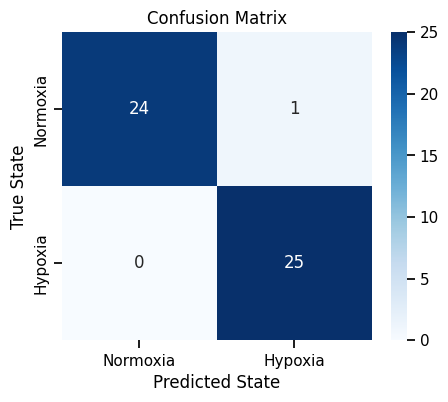

In [ ]:
model = LogisticRegression(
            penalty = 'l2',
            C = 1,
            solver = 'liblinear',
            fit_intercept = True,
            tol = 1e-4,
            max_iter = 800,
            class_weight = 'balanced',
            random_state = 42
        )
model.fit(xtrain, ytrain)

lrypred = model.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, lrypred))
print("Classification report: ")
print(classification_report(ytest, lrypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, lrypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

These are extremely good results; apart from one misclassification the classifier is perfect. We can attempt to obtain a perfect score, but that is ultimately unlikely. First, a randomized search for logistic regression will be attempted. 

Fitting 5 folds for each of 800 candidates, totalling 4000 fits
Best hyperparameters: {'C': np.float64(849.9808989183019), 'fit_intercept': False, 'max_iter': 1463, 'penalty': 'l1', 'tol': np.float64(0.00010994335574766199)}
Mean accuracy: 1.0
Accuracy score:  0.98
Classification report: 
              precision    recall  f1-score   support

           0     1.0000    0.9600    0.9796        25
           1     0.9615    1.0000    0.9804        25

    accuracy                         0.9800        50
   macro avg     0.9808    0.9800    0.9800        50
weighted avg     0.9808    0.9800    0.9800        50



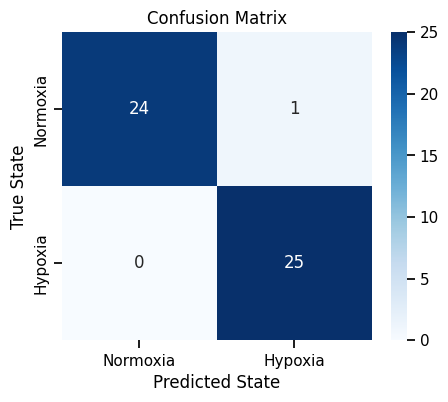

In [ ]:
lr = LogisticRegression(solver='liblinear', class_weight='balanced', random_state=42)

paramdist = {
    'penalty': ['l1', 'l2'],
    'C': loguniform(1e-4, 1e4),
    'fit_intercept': [True, False],
    'tol': loguniform(1e-4, 1e-2),
    'max_iter': randint(800, 1501)
}

search = RandomizedSearchCV(
    estimator = lr,
    param_distributions = paramdist,
    n_iter = 800,
    scoring = 'accuracy',
    cv = 5,
    n_jobs = -1,
    random_state = 42,
    verbose = 1,
)

search.fit(xtrain, ytrain)

print("Best hyperparameters:", search.best_params_)
print("Mean accuracy:", search.best_score_)
bestlr = search.best_estimator_

lrypred = bestlr.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, lrypred))
print("Classification report: ")
print(classification_report(ytest, lrypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, lrypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

Despite testing a large amount of parameter combinations, no improvement whatsoever was seen. There is most likely one datapoint that the classifier fails on consistently. We investigate if random forest can overcome this.

### Random Forest

Accuracy score:  0.98
Classification report: 
              precision    recall  f1-score   support

           0     1.0000    0.9600    0.9796        25
           1     0.9615    1.0000    0.9804        25

    accuracy                         0.9800        50
   macro avg     0.9808    0.9800    0.9800        50
weighted avg     0.9808    0.9800    0.9800        50



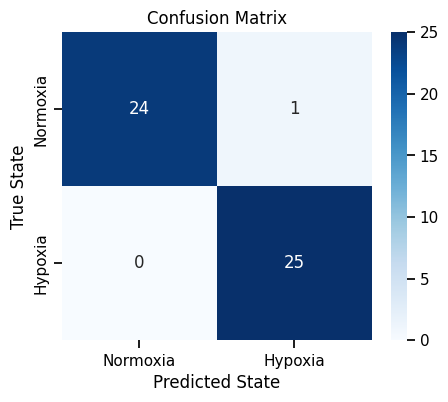

In [ ]:
rfmodel = RandomForestClassifier(
            n_estimators = 100,
            criterion = 'gini',
            max_features = 'sqrt',
            min_samples_split = 4,
            min_samples_leaf = 2,
            class_weight = 'balanced',
            random_state = 42
        )
rfmodel.fit(xtrain, ytrain)

rfypred = rfmodel.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, rfypred))
print("Classification report: ")
print(classification_report(ytest, rfypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, rfypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

Random forest also fails in the same way. Before we investigate this problematic datapoint, we check whether a very different model like SVM would have the same point of failure. 

### SVM

Accuracy score:  0.98
Classification report: 
              precision    recall  f1-score   support

           0     1.0000    0.9600    0.9796        25
           1     0.9615    1.0000    0.9804        25

    accuracy                         0.9800        50
   macro avg     0.9808    0.9800    0.9800        50
weighted avg     0.9808    0.9800    0.9800        50



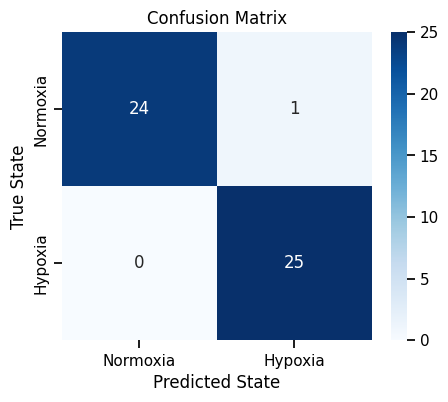

In [ ]:
svmmodel = SVC(
    kernel = 'rbf',
    C = 1,
    gamma = 'scale',
    probability = True,
    class_weight = 'balanced',
    random_state = 42
)
svmmodel.fit(xtrain, ytrain)

svmypred = svmmodel.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, svmypred))
print("Classification report: ")
print(classification_report(ytest, svmypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, svmypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

By now it is reasonable to assume that there is one outlier datapoint that prevents a 100% performance from the models. We verify this by viewing misclassified cells. 

### Misclassified Data Point

In [ ]:
misclr = set(np.where(lrypred != ytest)[0])
miscrf = set(np.where(rfypred != ytest)[0])
miscsvm = set(np.where(svmypred != ytest)[0])
misc = misclr | miscrf | miscsvm

miscsamplenames = index[list(sorted(misc))]
print("Misclassified sample(s):", miscsamplenames)

datalmisc = datal[miscsamplenames].transpose()
datalmisc

Misclassified sample(s): Index(['"output.STAR.3_G1_Norm_S301_Aligned.sortedByCoord.out.bam"'], dtype='object')


,"""CYP1B1""","""CYP1B1-AS1""","""CYP1A1""","""NDRG1""","""DDIT4""","""PFKFB3""","""HK2""","""AREG""","""MYBL2""","""ADM""",...,"""CD27-AS1""","""DNAI7""","""MAFG""","""LZTR1""","""BCO2""","""GRIK5""","""SLC25A27""","""DENND5A""","""CDK5R1""","""FAM13A-AS1"""
"""output.STAR.3_G1_Norm_S301_Aligned.sortedByCoord.out.bam""",0.0,0.0,0.0,6.630173,9.100836,7.644611,5.839248,7.193074,5.737511,4.352647,...,4.775603,0.0,0.0,0.0,0.0,0.0,0.0,4.753812,0.0,0.0


This result confirms the assumption that there is one specific cell that is consistently misclassified as hypoxic while in fact being normoxic. 

In [ ]:
prob = bestlr.predict_proba(xtest)[list(sorted(misc))]
print("Predicted probability in misclassified sample (logreg):", prob[0][1])

prob = rfmodel.predict_proba(xtest)[list(sorted(misc))]
print("Predicted probability in misclassified sample (random forest):", prob[0][1])

prob = svmmodel.predict_proba(xtest)[list(sorted(misc))]
print("Predicted probability in misclassified sample (svm):", prob[0][1])

Predicted probability in misclassified sample (logreg): 0.9242695474370993
Predicted probability in misclassified sample (random forest): 0.614676431650469
Predicted probability in misclassified sample (svm): 0.6793638711563605


Interestingly, none of the models give a near-boundary probability for the datapoint being hypoxic. All give rather high confidence, especially the logistic regression classifier obtained after randomized search. From this, we can assume that the misclassified datapoint is an outlier that is normoxic despite having features that strongly indicate hypoxia. 

### Random Forest - Further Investigation

As a final attempt, since random forest gave the lowest probability of hypoxia for the outlier, we attempt a randomized search for random forest.

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best hyperparameters: {'criterion': 'log_loss', 'max_features': 0.05, 'min_samples_leaf': 8, 'min_samples_split': 5, 'n_estimators': 153}
Mean accuracy: 1.0
Accuracy score:  0.98
Classification report: 
              precision    recall  f1-score   support

           0     1.0000    0.9600    0.9796        25
           1     0.9615    1.0000    0.9804        25

    accuracy                         0.9800        50
   macro avg     0.9808    0.9800    0.9800        50
weighted avg     0.9808    0.9800    0.9800        50



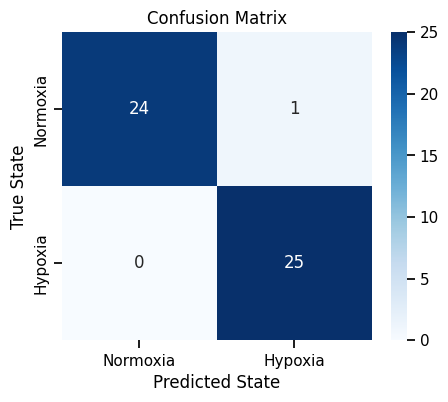

Predicted probability in misclassified sample (svm): 0.6028505500104749


In [ ]:
rf = RandomForestClassifier(class_weight='balanced', random_state=42)

paramdist = {
    'n_estimators': randint(50, 301),
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_features': ['sqrt', 'log2', 0.05, 0.1, 0.2, 0.4],
    'min_samples_split': randint(2, 21),
    'min_samples_leaf': randint(1, 11)
}

search = RandomizedSearchCV(
    estimator = rf,
    param_distributions = paramdist,
    n_iter = 50,
    scoring = 'accuracy',
    cv = 5,
    n_jobs = -1,
    random_state = 42,
    verbose = 1,
)

search.fit(xtrain, ytrain)

print("Best hyperparameters:", search.best_params_)
print("Mean accuracy:", search.best_score_)
bestrf = search.best_estimator_

ypred = bestrf.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))
print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

prob = bestrf.predict_proba(xtest)[list(sorted(misc))]
print("Predicted probability in misclassified sample (svm):", prob[0][1])

Again no improvement was seen. Considering that no model seems able to overcome the clasifier despite various attempts (and even if one were to do so, the chance of overfitting would be high), the investigation is concluded. As a final check on the obtained models we evaluate using cross_val_score:

### Cross-Validation

In [ ]:
lrscores = cross_val_score(bestlr, x, y, cv=8, scoring='accuracy')
rfscores = cross_val_score(rfmodel, x, y, cv=8, scoring='accuracy')
brfscores = cross_val_score(bestrf, x, y, cv=8, scoring='accuracy')
svmscores = cross_val_score(svmmodel, x, y, cv=8, scoring='accuracy')

print("Logistic Regression Cross-Validation:")
print("Mean:", lrscores.mean(), "Std:", lrscores.std())

print("Original Random forest Cross-Validation:")
print("Mean:", rfscores.mean(), "Std:", rfscores.std())

print("Final Random Forest Cross-Validation:")
print("Mean:", brfscores.mean(), "Std:", brfscores.std())

print("SVM Cross-Validation:")
print("Mean:", svmscores.mean(), "Std:", svmscores.std())

Logistic Regression Cross-Validation:
Mean: 1.0 Std: 0.0
Original Random forest Cross-Validation:
Mean: 0.9959677419354839 Std: 0.010668352060744308
Final Random Forest Cross-Validation:
Mean: 0.9959677419354839 Std: 0.010668352060744308
SVM Cross-Validation:
Mean: 1.0 Std: 0.0


As expected, there practically no difference. The final logistic regression classifier and the SVM classifier both did obtain perfect scores on the cross-validation.

Considering that all models have identical convolution matrices and a perfect cross-validation score has been reached, there is no discernible progress to be made through further investigation. In light of this, the investigation is concluded. Since the SVM model had a perfect cross-validation score and predicted a lower probability of hypoxia for the misclassified datapoint, we select the SVM model with basic inputs as the best model for this dataset, to be used for predictions on the test data. 

### Feature Importance

We cannot evaluate feature importances for our finally selected SVM model, since it is nonlinear, but we can evaluate them for the optimised logistic regression, which has nearly identical performance. 

In [ ]:
lrcoefs = bestlr.coef_.ravel()

coefdf = pd.DataFrame({
    'gene': genenames,
    'coefficient': lrcoefs,
    'abs_coef': np.abs(lrcoefs)
})

topgenes = coefdf.sort_values(by='abs_coef', ascending=False)

topup = topgenes[topgenes['coefficient'] > 0].head(10)
topdown = topgenes[topgenes['coefficient'] < 0].head(10)

print("Top 10 genes positively associated with hypoxia:")
topup

print("\nTop 10 genes negatively associated with hypoxia:")
topdown

Top 10 genes positively associated with hypoxia:


,gene,coefficient,abs_coef
8,"""ADM""",0.399052,0.399052
32,"""CA9""",0.324569,0.324569
2,"""CYP1A1""",0.220374,0.220374
91,"""FUT11""",0.199200,0.199200
276,"""PTPRN""",0.180445,0.180445
99,"""FAM162A""",0.179906,0.179906
102,"""TMEM45A""",0.172973,0.172973
12,"""IGFBP3""",0.166052,0.166052
260,"""ZNF689""",0.128143,0.128143
114,"""MYO1B""",0.101679,0.101679



Top 10 genes negatively associated with hypoxia:


,gene,coefficient,abs_coef
45,"""E2F1""",-0.300744,0.300744
213,"""C12orf60""",-0.205482,0.205482
194,"""SLC24A3""",-0.192634,0.192634
176,"""ETNK2""",-0.181600,0.181600
288,"""PLBD1""",-0.177935,0.177935
211,"""DNAJC22""",-0.149827,0.149827
299,"""ABAT""",-0.146909,0.146909
26,"""UHRF1""",-0.129940,0.129940
57,"""MGP""",-0.129611,0.129611
49,"""RAMP3""",-0.129221,0.129221


It appears that gene expression is more predictive than in the respective test from DropSeq; absolute values are higher. Interestingly, there is no significant overlap with the genes of highest variance. 

### Cross-Dataset Comparison

Finally, we will evaluate the optimal models found on other datasets, and investigate whether they can overcome the issue with the models investigated here. We begin with the SVM models used for HCC1806 DropSeq and SmartSeq. 

Accuracy score:  0.96
HCC1806 DropSeq Best Model Cross-Validation:
Mean: 0.9919354838709677 Std: 0.013968151673942547
Classification report: 
              precision    recall  f1-score   support

           0     1.0000    0.9200    0.9583        25
           1     0.9259    1.0000    0.9615        25

    accuracy                         0.9600        50
   macro avg     0.9630    0.9600    0.9599        50
weighted avg     0.9630    0.9600    0.9599        50



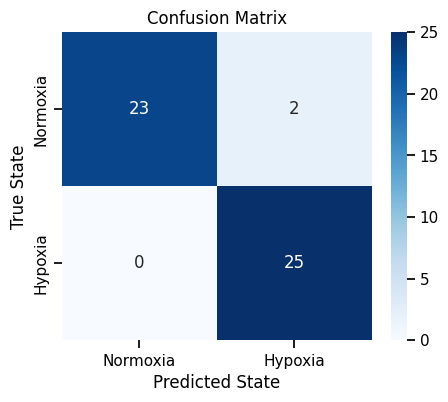

In [ ]:
hccdsmodel = SVC(
    kernel='rbf',
    C=10,
    gamma='auto',
    class_weight=None,
    random_state=42
)

hccdsmodel.fit(xtrain, ytrain)

ypred = hccdsmodel.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))

hdscores = cross_val_score(hccdsmodel, x, y, cv=8, scoring='accuracy')
print("HCC1806 DropSeq Best Model Cross-Validation:")
print("Mean:", hdscores.mean(), "Std:", hdscores.std())

print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

Accuracy score:  0.98
HCC1806 DropSeq Best Model Cross-Validation:
Mean: 1.0 Std: 0.0
Classification report: 
              precision    recall  f1-score   support

           0     1.0000    0.9600    0.9796        25
           1     0.9615    1.0000    0.9804        25

    accuracy                         0.9800        50
   macro avg     0.9808    0.9800    0.9800        50
weighted avg     0.9808    0.9800    0.9800        50



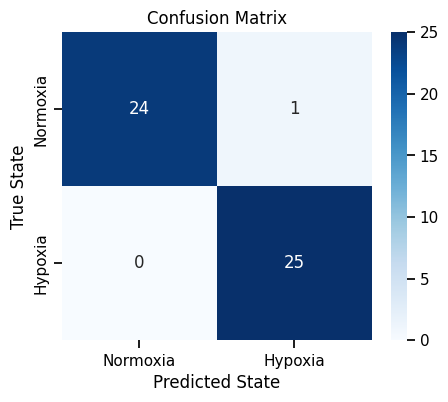

In [ ]:
hccssmodel = SVC(
    kernel = 'rbf',
    C = 3,
    gamma = 'scale',
    probability = True,
    class_weight = 'balanced',
    random_state = 42
)

hccssmodel.fit(xtrain, ytrain)

ypred = hccssmodel.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))

hdscores = cross_val_score(hccssmodel, x, y, cv=8, scoring='accuracy')
print("HCC1806 SmartSeq Best Model Cross-Validation:")
print("Mean:", hdscores.mean(), "Std:", hdscores.std())

print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

The SVM from the HCC1806 SmartSeq investigation gave the same results as our previously found optimal models, while the one from HCC1806 DropSeq gave slightly worse results than the models tested here. 

Accuracy score:  0.98
HCC1806 DropSeq Best Model Cross-Validation:
Mean: 1.0 Std: 0.0
Classification report: 
              precision    recall  f1-score   support

           0     1.0000    0.9600    0.9796        25
           1     0.9615    1.0000    0.9804        25

    accuracy                         0.9800        50
   macro avg     0.9808    0.9800    0.9800        50
weighted avg     0.9808    0.9800    0.9800        50



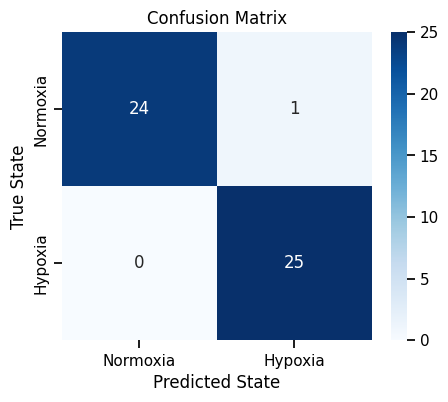

In [ ]:
modela = LogisticRegression(
    penalty = 'l1',
    C = 0.0992,
    solver = 'liblinear',
    fit_intercept = True,
    tol = 0.00363,
    max_iter = 1070,
    class_weight = 'balanced',
    random_state = 42
)

modela.fit(xtrain, ytrain)

modelb = RandomForestClassifier(
    n_estimators = 184,
    criterion = 'gini',
    max_features = 0.05,
    min_samples_split = 20,
    min_samples_leaf = 5,
    class_weight = 'balanced',
    random_state = 42
)

modelb.fit(xtrain, ytrain)

modelc = SGDClassifier(
    loss = 'log_loss',
    penalty = 'l1',
    max_iter = 1000,
	alpha = 0.0254,
	l1_ratio = 0.169,
	fit_intercept = True,
	early_stopping = False,
    class_weight = 'balanced',
    random_state = 42
)

modelc.fit(xtrain, ytrain)

modeld = SVC(
    kernel = 'rbf',
    C = 1,
    gamma = 'scale',
    probability = True,
    class_weight = 'balanced',
    random_state = 42
)

modeld.fit(xtrain, ytrain)

softvote = VotingClassifier(
    estimators=[
        ('lr', modela),
        ('rf', modelb),
        ('sgd', modelc),
        ('svm', modeld)
    ],
    voting='soft'
)

softvote.fit(xtrain, ytrain)

ypred = softvote.predict(xtest)

print("Accuracy score: ", accuracy_score(ytest, ypred))

hdscores = cross_val_score(softvote, x, y, cv=8, scoring='accuracy')
print("MFC7 DropSeq Best Model Cross-Validation:")
print("Mean:", hdscores.mean(), "Std:", hdscores.std())

print("Classification report: ")
print(classification_report(ytest, ypred, digits=4))

plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(ytest, ypred), annot=True, fmt='d', xticklabels=['Normoxia','Hypoxia'], yticklabels=['Normoxia', 'Hypoxia'], cmap='Blues')
plt.xlabel("Predicted State")
plt.ylabel("True State")
plt.title("Confusion Matrix")
plt.show()

As expected, the soft voting was not able to overcome the outlier either. With that in mind we proceed to the prediction section, using the SVM model from before. 

### Predictions

In [ ]:
testdata = pd.read_csv("../../SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt",sep=r"\s+",engine='python',index_col=0)

testls = testdata.sum(axis=0)
testnorm = np.log1p(testdata.div(testls, axis=1) * 1e6)


xfinal = testnorm.transpose().reindex(columns=geneorder)


xfinal = threshold.transform(xfinal)
xfinal  = selecter.transform(xfinal)

ypredfinal = svmmodel.predict(xfinal)

with open("../Predictions/predictions-supervised-mcf-ss.txt", "w") as f:
    f.write("SampleId\tCondition\n")
    for idx, val in enumerate(ypredfinal, start=1):
        label = "Hypoxia" if val == 1 else "Normoxia"
        f.write(f"{idx}\t{label}\n")

ypredfinal